# The final project of the COGNITIVE, BEHAVIORAL AND SOCIAL DATA course 2022-2023


---


members of the group:


*   Sina Ainesazi Dovom

*   Shab Cesare Akira Pompeiano

*   Bahar Khanshaghaghi

*   Joi Barberi

January 2023\
Padua, Italy



## 1 - Introduction


**Aim**
* In this study, we focus on feature engineering and our goal is to build a feature selection model that is able to be applied to all physical datasets at our disposal. In other words, this feature selection model should be robust and able to provide accurate and reliable answers on all datasets.

  After a significant feature selection, our model becomes more interpretable,
we can then avoid overfitting (when the model performs well on training data but poorly on out-of-sample data).

**Datasets**
* 17 are the datasets we use to do our analysis of our research;
these are questionnaires composed of questions, where some are of the "faking good" type and others of the "faking bad" type.

  Since the datasets have different formats some are excel files and some are csv files we had to make some changes on them for example we had to convert some of the excel files to be semicolon seperated.
In each dataset the questionnaire is divided into two parts:

1. the first half: where to our samples is asked to answer honestly to a set of questions.
2. the other half: where they are asked to fake the same questions and all this for a classic example of getting a job.

## Importing needed Libraries

In [ ]:
import pandas as pd
import numpy as np
import os
import operator
from os import listdir
from os.path import isfile, join
from matplotlib import pyplot
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.inspection import permutation_importance
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score,recall_score, f1_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RepeatedStratifiedKFold
from numpy import mean
from numpy import std
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
#from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report


#mlxtend imports
import joblib
import sys
sys.modules['sklearn.externals.joblib'] = joblib
from mlxtend.feature_selection import ExhaustiveFeatureSelector

import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats as stats
import seaborn as sns
from tabulate import tabulate

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import RFE
from sklearn.metrics import accuracy_score

In [ ]:
!gdown 1vfGHR4LNdTrACaT-zMAaR3Wh9qpHcFs7
!unzip -n /content/datasets.zip
# getting all datasets in folder
datasets = [x[0] for x in os.walk("./datasets")]
datasets.remove(datasets[0])

for dataset in datasets:
    print(dataset)

Downloading...
From: https://drive.google.com/uc?id=1vfGHR4LNdTrACaT-zMAaR3Wh9qpHcFs7
To: /content/datasets.zip
100% 17.7M/17.7M [00:00<00:00, 79.4MB/s]
Archive:  /content/datasets.zip
   creating: datasets/
   creating: datasets/13. BF (3)/
  inflating: __MACOSX/datasets/._13. BF (3)  
  inflating: datasets/.DS_Store      
   creating: datasets/1. shortDT (2)2/
   creating: datasets/10. R_NEO_PI/
  inflating: __MACOSX/datasets/._10. R_NEO_PI  
   creating: datasets/11. DDDT/
  inflating: __MACOSX/datasets/._11. DDDT  
   creating: datasets/1. shortDT (2)/
  inflating: __MACOSX/datasets/._1. shortDT (2)  
   creating: datasets/9. IESR/
  inflating: __MACOSX/datasets/._9. IESR  
   creating: datasets/7. shortPID5/
  inflating: __MACOSX/datasets/._7. shortPID5  
   creating: datasets/13. BF (3)2/
   creating: datasets/13. BF (3)3/
   creating: datasets/5. PHQ9_GAD7/
  inflating: __MACOSX/datasets/._5. PHQ9_GAD7  
   creating: datasets/6. PID5/
  inflating: __MACOSX/datasets/._6. PID5  
 

## Importing all the datasets based on their format (.csv or .xlsx)
This function takes the path of the dataset files and imports them inside the code based on their format.

In [ ]:
# importing all the data sets
def get_dataset(path):
    files = [f for f in listdir(path) if isfile(join(path, f)) and (f.endswith(".csv") or f.endswith(".xlsx"))]

    if files[0].endswith(".xlsx"):
        file = pd.read_excel(path + files[0])
    else:
        file = pd.read_csv(path + files[0], sep=None, engine='python')

    return file

## Feature Correlation

The pearson correlation, defined as
 𝜌= $\frac{cov(𝑋,𝑌)}{𝜎_𝑥𝜎_𝑦}$ = $\frac{𝔼[(𝑋−\bar{𝑋})(𝑌−\bar{𝑌})]}{𝜎_𝑥𝜎_𝑦}$
Correlation is a statistic that measures the degree to which two variables move in relation to each other obtained dividing the covariance by the product of standard deviations. The values range is [-1,1] where {-1} implies a negative correlation or anticorrelation, {1} the positive correlation and {0} the non-correlation.
We tried to check on the correlation among the explanatory variables of the features in every dataset inorder to only have an idea of how much the variables are similar and have connections among each other. The interesting fact is that this test shows a very high correlation among many of the variables which reveals the presence of the multicollinearity in some datasets and in contrast for some datasets it tells us that no of the variables are correlated.
The matrix in some datasets which shows the high correlation between some variables brings this idea of using VIF (Variance inflation factor) in order to find some of the variables which their presence in the study is not helpful to be removed but since we are considering of applying PCA because Some dataset aspects suggest the use of the PCA to reduce the feature and shrink the space, we skip this idea of removing the features and we will go on with full dataset.

In [ ]:
def correlation_matrix(dataset):
    # Checking on Correlation for each dataset
    correlation_features = dataset.corr().abs()
    print("correlation of the features:")

    upper_triangular = correlation_features.where(np.triu(np.ones(correlation_features.shape),k=1).astype(np.bool_))

    # columns with correlation higher than 80 percent.
    columns_to_drop = [column for column in upper_triangular.columns if any(upper_triangular[column] > 0.80)]
    print(len(columns_to_drop))

    plt.figure(figsize=(12,10))
    sns.heatmap(correlation_features, annot=True, cmap=plt.cm.Reds)
    plt.show()

Feature importance implementation from:
https://machinelearningmastery.com/calculate-feature-importance-with-python/

## Dataset Preparation

In [ ]:
def pandas_to_numpy(dataset):
    y = dataset["CONDITION"]=="H"
    y = y.astype(int).to_numpy()
    X = dataset.drop("CONDITION", axis=1).to_numpy()
    return X, y

## Feature selection
The feature selection allows to reduce the dataset dimensionality (from  $ \ ℝ^𝑚,𝑑→ℝ^𝑚,𝑛,𝑛<𝑑 $), spare computation without losing transparency of the data.

In [ ]:
# Evaluate scores
#
# This main function evaluates the feature importance using a broad range of different methods (which can be expanded)
# i.e. LogisticRegression(), DecisionTreeClassifier(), RandomForestClassifier(), XGBClassifier() and KNeighborsClassifier()
# resulting scores are used to sort the features based on their importance and discarded as some scores do not heave a useful meaning

models = [LogisticRegression(), DecisionTreeClassifier(), RandomForestClassifier(), XGBClassifier(), KNeighborsClassifier()]
importance_methods = ['model.coef_[0]', 'model.feature_importances_', 'model.feature_importances_', 'model.feature_importances_', 'results.importances_mean']
extra_methods = ['', '', '', '', 'permutation_importance(model, X, y, scoring="accuracy")']

def evaluate_scores(X, y, verbose=0, plot=0):
    scores = {}
    if(plot):
      fig, axs = pyplot.subplots(nrows=1, ncols=len(models))
      fig.set_figheight(5)
      fig.set_figwidth(15)
      fig.suptitle('Feature importance', fontsize=20)

      fig2, axs2 = pyplot.subplots(nrows=1, ncols=len(models))
      fig2.set_figheight(5)
      fig2.set_figwidth(15)
      fig2.suptitle('Feature importance - normalized (0-1)', fontsize=20)

      i=0

    for model,method,extra in zip(models, importance_methods, extra_methods):
        model_name = type(model).__name__

        # fit the model
        model.fit(X, y)
        # get importance

        # this is needed for RandomForestClassifier
        if(extra!=''): results = eval(extra)

        # each classifier has a different way to retrieve the importance score
        importance = eval(method)

        # summarize feature importance
        if verbose:
            print("Evaluation of " + str(model_name) + " feature importance")
            print()
            for i,v in sorted(tuple(enumerate(importance)), key = operator.itemgetter(1), reverse = True):
                print('Feature: %0d, Score: %.5f' % (i,v))

        # plot feature importance
        if plot:
            #axs[i].subtitle(str(model_name))
            axs[i].title.set_text(str(model_name))
            axs[i].bar([x for x in range(len(importance))], importance)
            #axs[i].show()
            axs2[i].title.set_text(str(model_name))
            normalized = (np.asarray(importance) - np.min(importance)) / (np.max(importance) - np.min(importance))
            axs2[i].bar([x for x in range(len(normalized))], normalized, color="m")
            i=i+1

        scores[model_name] = sorted(tuple(enumerate(importance)), key= operator.itemgetter(1), reverse = True)
    return scores

Some other feature selection techniques which can be used for feature extraction problems with the categorical ordinal input variables and Categorical target variable are:


*   Chi-squared test:
A chi-square test is a statistical test used to compare observed results with expected results. The purpose of this test is to determine if a difference between observed data and expected data is due to chance, or if it is due to a relationship between the variables you are studying.


*   Mutual Information Statistics:
Another technique widely used for the feature extraction is the mutual information, which consists of a measure of the mutual dependence between two random variables. Strictly related to the concept of entropy of a random variable which is defined as  $\ 𝐻(𝑋)= −\sum_{i}^NP(𝑥_𝑖)𝑙𝑜𝑔 P(𝑥_𝑖)  $the mutual information in our case is defined for every pair of variables as

\begin{align}
        &\int_y \int_X P_{(X, Y)} (x, y)log(\frac{P_{(X, Y)} (x, y)}{P_X (x) P_Y (y)})\mathrm{d}x \mathrm{d}y
    \end{align}

where  $\ P_{(𝑋,𝑌)}$  is the joint probability density function of X and Y, and  $\ P_𝑋(𝑥),P_𝑌(𝑦)$ are the marginal probability density functions of X and Y respectively.

This function returns a list of rankings that each method has obtained.
for example a table containing the names of all the methods and each method is printing a ranking based on the number of features to tell us which features each method has found as most important ones.




In [ ]:
# Chi squared, Mutual Information, Recursive Feature Elimination ranking models
#
# To expand the range of models used for ranking we also integrate these models to rank feature importance
def evaluate_rank_chi2_mi_rfe(X, y, verbose=0):
    N_FEATURES = np.shape(X)[1]

    rank = {}

    # Chi_squared
    rank["Chi2"]=[]
    chi2_ranking = []
    for i in range(N_FEATURES):
        chi_squared = SelectKBest(chi2, k=i+1)
        chi_squared.fit(X, y)
        cols_chi2 = chi_squared.get_support(indices=True)
        chi2_ranking.append(list(set(cols_chi2) - set(chi2_ranking))[0])
    # add rankings found from chi2
    for x in chi2_ranking:
        rank["Chi2"].append((x, chi2_ranking.index(x)))
    if(verbose):
        print(" Chi2")
        print(chi2_ranking)
    #chi2_ranking_verbose = [dataframe.columns[x] for x in chi2_ranking]

    #Mutual Information
    rank["Mutual Information"]=[]
    mi_ranking = []
    for i in range(N_FEATURES):
        mutual = SelectKBest(mutual_info_classif, k=i+1)
        mutual.fit(X, y)
        cols_mutual = mutual.get_support(indices=True)
        mi_ranking.append(list(set(cols_mutual) - set(mi_ranking))[0])
        #for x in select_features_mutual:
            #selected_features[x] = selected_features.get(x,0) + 1
    # add rankings found from Mutual Information
    for x in mi_ranking:
        rank["Mutual Information"].append((x, mi_ranking.index(x)))
    if(verbose):
        print(mi_ranking)
        print("Mutual Information")
    #mi_ranking_verbose = [dataframe.columns[x] for x in mi_ranking]

    #RFE using DecisionTree
    rank["RFE using DecisionTree"]=[]
    rfe_ranking = []
    for i in range(N_FEATURES):
        model = DecisionTreeClassifier(max_depth=5,class_weight="balanced",random_state=42)
        rfe = RFE(model, n_features_to_select=i+1)
        rfe.fit(X, y)
        cols_rfe = rfe.get_support(indices=True)
        rfe_ranking.append(list(set(cols_rfe) - set(rfe_ranking))[0])
            #selected_features[x] = selected_features.get(x,0) + 1

    # add rankings found from Mutual Information
    for x in rfe_ranking:
        rank["RFE using DecisionTree"].append((x, rfe_ranking.index(x)))
    if(verbose):
        print("RFE using DecisionTree")
        print(rfe_ranking)
    return rank

In [ ]:
def standardize(X):
    return (X - X.mean(axis=0))/(X.std(axis=0))

# Get p- values for t-test for difference in means between Honest and Dishonest groups
def get_p_values(dataframe):
  pvalues = []
  for col in dataframe:
    if(col=="CONDITION"): continue
    t, p = stats.ttest_ind(dataframe[dataframe["CONDITION"]=="H"][col],
                      dataframe[dataframe["CONDITION"]=="D"][col])
    pvalues.append(p)
  return pvalues

def get_significance(p):
  alpha = [0.001, 0.01, 0.05]  #‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05
  if(p<alpha[0]): return "***"
  if(p<alpha[1]): return "**"
  if(p<alpha[2]): return "*"
  return "-"

# Convert scores to ranks (from 0 to n_features) as we do not need scores
def scores_to_rank(scores):
    rank = {}
    for key in scores:
        sorted_scores = sorted(scores[key], key=operator.itemgetter(1), reverse=True)
        rank[key] = [(tup[0], sorted_scores.index(tup)) for tup in sorted_scores]
    return rank

# Print ranking of features for each model
def print_ranks(rank, highlight=None):
    rank2 = {}
    for key in rank:
        rank2[key] = [tup[0] for tup in rank[key]]

    for rank in rank2:
        rank2[rank] = [x if x != highlight else "\033[45;37m" + str(x) + "\033[0;0m"   for x in rank2[rank]]

    data = [tup for tup in zip(*[rank2[key] for key in rank2])]

    headers = [''.join([c for c in head if c.isupper()]) for head in rank2.keys()]
    print(tabulate(data, headers=headers, tablefmt='orgtbl'))

In [ ]:
# Ensemble model
#
# The ensemble takes into account the feature importance ranking of different rankning methods.
# The result is a cumulative ranking for each feature by summing up all the positions for each feature and sorting them.
# Significance of each feature is also calculated and showed.
def ensemble(ranks, dataframe, verbose = True):
    cum = {}
    features = dataframe.columns

    pvalues = get_p_values(dataframe)

    for key in ranks:
        for tup in ranks[key]:
            if(tup[0] in cum):
                cum[tup[0]] = cum[tup[0]] + tup[1]
            else:
                cum[tup[0]] = tup[1]
    '''
    to_print = sorted([(features[tup[0]], tup[0], tup[1]/(len(features)*len(ranks.keys())), str(get_significance(pvalues[tup[0]]))) for tup in cum.items()], key=operator.itemgetter(2))
    if verbose: print(tabulate(to_print, headers=["Feature", "_n", "Cumulative rank", "Significance"], tablefmt='orgtbl'))
    '''
    to_print = sorted([(features[tup[0]], tup[0], tup[1]/(len(features)*len(ranks.keys())), str(get_significance(pvalues[tup[0]]))) for tup in cum.items()], key=operator.itemgetter(2))
    to_print = [(tup[0], tup[1], tup[3]) for tup in to_print]
    if verbose: print(tabulate(to_print, headers=["Feature", "_n", "Significance"], tablefmt='orgtbl'))

    return to_print

# Ensemble model with increasing window
#
# Main difference: give more importance to features which are ranked higher
# We do this by:
#   1. getting the 1st most important feature by
#   2. calculating the cumulative ranking only among the 1st feature of each model rank (first row printed in print_ranks())
#   3. increasing the window (from 1 to 2)
#   4. calculating the cumulative ranking only among the first 2 important features of each model rank (and ignoring already assigned ranks)
#   ... Keep increasing the window and repeating until window size is equal to the number of features and
#      the cumulative ranking is performed on all the features of all model ranks and we thus get the worse feature
def ensemble_increasingwindow(ranks, dataframe):
    to_print = []
    pvalues = get_p_values(dataframe)
    features = dataframe.columns

    already_in = []

    for i in range(1, len(features)):
        window_ranks = {}
        for rank in ranks:
            window_ranks[rank] = ranks[rank][:i]

        temp_cum = {}
        for rank in window_ranks:
            for tup in window_ranks[rank]:
                if(tup[0] not in already_in):
                    if(tup[0] in temp_cum):
                        temp_cum[tup[0]] = temp_cum[tup[0]] + i-tup[1]
                    else:
                        temp_cum[tup[0]] = i-tup[1]
        top_ = sorted([(k, v) for k, v in temp_cum.items()], key=operator.itemgetter(1), reverse=True)
        #if(top_[0][1] == top_[1][1]): print("PROBLEM")
        tup = top_[0]
        already_in.append(tup[0])
        to_print.append((features[tup[0]], tup[0], str(get_significance(pvalues[tup[0]]))))

    print(tabulate(to_print, headers=["Feature", "_n", "Significance"], tablefmt='orgtbl'))

In [ ]:
# TFIDF re-scoring of features
#
# The goal of this transformation is to penalize the features which are ranked high only in a few classifiers
# e.g. see feature 20
# Features importance is reordered using a metric similar to TFIDF.

#Notes:

#TF = times_term_in_doc / total_terms_in_doc
#translated is
#TF = (max_importance - importance_feature) / max_importance

#IDF = log(N_doc_in_corpus/N_doc_containing_term)
#translated is
#IDF = log(N_classifiers/cumulative_TF) where TF are in range 0 to 1 (most important)

# Features are ranked by importance from 0 (most important) to 27
# then TF term is calculated for each feature in each model sub-ranking (each column)
# with the following formula (<max_rank> - <feature_rank>) / <max_rank>
# this results in a number between 1 and 0,
# where TF=1 indicates that the feature is the most important for that column
# and TF=0 indiates that the feature is the least important for that column
#
# IDF term is then calculated by taking log(N_classifiers/cumulative_TF)
# where N_classifiers=8 and cumulative_TF (similar as the old cumulative_ranking)
# BUT considers the sum of all the TF values for a specific feature over all columns|models
# so that the maximum value possible will be 8 hence the term of our log() will be between 0 and 1
#
# Finally, all features for each column are re-ranked by multiplying their TF to the 1/IDF value for that feature
# remember that TF is calculated for each feature in each column (we have 8 models|columns and 27 features for dataset #1 thus 8*27 TF values but only 27 IDF values)


def tf_idf(ranks):
  ranks_bis = ranks.copy()
  tfidf = {}
  tf = {}
  for key in ranks_bis:
    max_rank = max([tup[1] for tup in ranks_bis[key]])
    # TF saved from 1 to 0, where 1 is the most important feature and 0 the least important
    tf[key] = sorted([(tup[0], (max_rank - tup[1])/max_rank) for tup in ranks_bis[key]], key=operator.itemgetter(0))
    # TF is ordered by feature in each column
    # so that it will be possible to easily calculate IDF for a certain feature
  idf = []
  for zipped_tup in zip(*tf.values()):
    # Now we just need to sum the ranks for each zipped tuple to get IDF for a specific feature
    cumulative_TF = sum([tup[1] for tup in zipped_tup])
    N_classifiers = len(tf.keys())
    idf.append(np.log(N_classifiers/cumulative_TF).item())

  for key in tf:
    calc = [(tup[0], tup[1]*1/(idf[tup[0]] + 0.000001)) for tup in tf[key]]
    tfidf[key] = sorted(calc, key=operator.itemgetter(1), reverse=True)

  return tfidf

# Convert the tfidf values to rank (basically from 0 to n where 0 is the most important feature)
def tfidf_to_ranks(tfidf):
    ranks = {}

    for model in tfidf:
        ranks[model] = [(tup[0], tfidf[model].index(tup)) for tup in tfidf[model]]

    return ranks

In [ ]:
# Plot features Honest vs Dishonest
#
# For each feature show histograms of the distribution of Honest and Dishonest responses
# together with boxplot showing median (as - sign) ad mean (as + sign).
# Also, performs a t-test to test whether the means of the two categories are the same (Honest vs Dishonest)

def plots(data):
    plt.rcParams.update({'figure.max_open_warning': 0})

    for col in data:
        if(col=="CONDITION"): continue
        figure, axis = plt.subplots(1, 3, figsize=(9, 4))
        figure.suptitle(col, fontsize=16)

        axis[0].hist(data[data["CONDITION"]=="H"][col], color="orange", range=(1,5))
        axis[0].set_title("Honest")

        axis[1].hist(data[data["CONDITION"]=="D"][col], range=(1,5))
        axis[1].set_title("Dishonest")

        axis[2].boxplot([data[data["CONDITION"]=="H"][col], data[data["CONDITION"]=="D"][col]], showmeans=True,  meanprops={"marker":"+","markerfacecolor":"white", "markeredgecolor":"blue"})
        axis[2].set_xticklabels(["Honest","Dishonest"])
        axis[2].set_title("+ is the mean")

        t, p = stats.ttest_ind(data[data["CONDITION"]=="H"][col],
                    data[data["CONDITION"]=="D"][col])
        alpha = 0.05
        text = "p=" + str(round(p, 5)) + " for t-test with alpha=" + str(alpha) + " reject H = " + str(p<alpha)
        if(p<alpha): add="different means"
        else: add="equal means"
        text = text + " ("+add+")"
        figure.text(.5, .01, text, ha='center')

In [ ]:
# Unused...
def select_k_chi2(X, y, k):
    #Chi_squared
    chi_squared = SelectKBest(chi2, k=k)
    chi_squared.fit(X, y)
    cols_chi2 = chi_squared.get_support(indices=True)
    return cols_chi2
    #select_features_chi2 = [df1.columns[x] for x in cols_chi2]

# Plot accuracies across all models over decreasing set of features (from n to 1)
def plot_accuracies(dataframe, ranks):
    X, y = pandas_to_numpy(dataframe)
    n_features = len(dataframe.columns)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

    plt.figure(figsize=(12, 5))
    plt.title("Accuracy over decreasing features", fontsize=20)

    j = 0
    for model in models:
      model_name = type(model).__name__
      accuracies = []
      for i in range(1, n_features):
          #selected_features = select_k_chi2(X, y, n_features-i)
          selected_features = [tup[1] for tup in ranks[:n_features-i]]

          #calculate accuracy
          clf = model.fit(X_train[:, selected_features], y_train)
          y_pred = clf.predict(X_test[:, selected_features])

          accuracies.append(accuracy_score(y_test, y_pred))

      x = len(accuracies) - np.arange(len(accuracies))

      #axs[j].title.set_text(str(model_name))
      plt.plot(x, accuracies, label=str(model_name))
      if(j==0):
        plt.xlim(len(accuracies), 1)
        plt.xticks(x)
        j=1
      print()
    plt.legend(loc="lower left")
    plt.show()

## Principle Componant Analysis (PCA)

Principal component analysis is an unsupervised learning technique to summarize a set with a smaller one which collectively explains most of its original variability. Given a collection of m points with d features, the principal components are a sequence of orthogonal vectors which denote the directions towards which an hypotetical line would minimize the averaged euclidean distance that lays between the line itself and the datapoints. The first principal components of  𝐱  with a multivariate distribution is given by the eigenvector corresponding to the largest eigenvalue of the covariance matrix.
Eigenvalues are coefficients applied to eigenvectors that give the vectors their length or magnitude. So, PCA is a method that: Measures how each variable is associated with one another using a Covariance matrix. Understands the directions of the spread of the data using Eigenvectors. In other words, the Eigenvalues are used to reduce dimension space. The technique of Eigenvectors and Eigenvalues are used to compress the data. PCA relies on eigenvalues and eigenvectors to reduce the dimensions.
When we tested the correlation matrix on each dataset it was obsereved that some of the datasets have highly correlated features and some have no correlated features. For the ones with highly correlated features, PCA performs very well. Below will be analyzed the principal components of the train set and their relative and cumulative explained variance. With this method we can see for example how only 8 dimension (out of 27) are enough to represent the 60% of the dataset variance.

https://towardsdatascience.com/how-to-select-the-best-number-of-principal-components-for-the-dataset-287e64b14c6d

In [ ]:
# this function takes each dataset and X and y and checks the 'PC','exp_var','cumvar','eigenvalue' for components for the length of dataset
def do_pca(df, X, y):
  n_components = len(df.columns)-1
  PC = len(df.columns)
  pca = PCA(n_components)
  X_train_pca = pca.fit_transform(X)
  cols = [f"PC{x}" for x in range(n_components)]
  X_train_df_pca = pd.DataFrame(X_train_pca,columns=cols)
  pca_info = pd.DataFrame(columns=['PC','exp_var','cumvar','eigenvalue'])
  cumsum = np.cumsum(pca.explained_variance_ratio_)

  for x, y in enumerate(pca.explained_variance_ratio_):
    pca_info.loc[len(pca_info.index)] = [int(x+1),y,cumsum[x],pca.explained_variance_[x]]

  # indicating the number of features needed
  n_features_pca = len(pca_info[pca_info['eigenvalue'] > 1])
  # based on the plot and the 'eigenvalue' column we find the number of components which have 'eigenvalue' higher than 1
  # Plot
  plt.figure(figsize=(8, 6))
  plt.bar(range(1,PC), pca.explained_variance_ratio_, alpha=0.5,align='center', label='individual explained variance')
  plt.step(range(1,PC), cumsum, where='mid', color='#B22222', label='cumulative explained variance')
  plt.ylabel('Explained variance ratio')
  plt.xlabel('Principal component index')
  plt.legend(loc='best')
  plt.show()
  print('number of components based on eigenvalue higher than 1 is:', n_features_pca)

  # PCA with only number of components based on the eigenvalue higher than 1
  n_components = n_features_pca
  pca = PCA(n_components)
  X_train_pca = pca.fit_transform(X_train)
  cols = [f"PC{x}" for x in range(n_components)]
  pca_df = pd.DataFrame(X_train_pca,columns=cols)
  print(f"n = {n_components}, tot explained variance: {np.round(sum(pca.explained_variance_ratio_),3)}")
  X_test_pca = pca.transform(X_test)

  return pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca

We will use a Pipeline where the first step performs the PCA transform and selects the components which have the most important dimensions or components(eigenvalue higher than 1 from the pca_info list), then fits a logistic regression model on these features. We don’t need to normalize the variables on this dataset.

In [ ]:
# get a list of models to evaluate using the logistic regression and makes a pipeline using the number of components 1 to decided value from last function.
def get_models_pca(n_features_pca):
 models_pca = dict()
 for i in range(1, n_features_pca+1):
   steps = [('pca', PCA(n_components=i)), ('m', LogisticRegression())]
   models_pca[str(i)] = Pipeline(steps=steps)
 return models_pca


The pipeline will be evaluated using repeated stratified cross-validation with three repeats and 10 folds per repeat. Performance is presented as the mean classification accuracy.



In [ ]:
# this function will be used inside the next function
# evaluates the given models using cross-validation
def evaluate_model_pca(model, X_train_pca, y_train):
 cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
 scores_pca = cross_val_score(model, X_train_pca, y_train, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
 return scores_pca

Running the this code block evaluates the model and reports the classification accuracy. It reports the classification accuracy for the number of components or features selected decided by pca_info table. Then a box and whisker plot is created for the distribution of accuracy scores for each configured number of dimensions. From the boxplot it returns, we can see if there is a trend with the higher umber of components or not and we decide for the seond time which number of components is enogh and has the higher accuracy.


In [ ]:
# here in this funtion given the trainset of the new dataset we try to evaluate the models
# and make a plot to check
def check_classif_acc(X_train_pca, y_train, n_features):
  models = get_models_pca(n_features)
# evaluate the models and store results
  results, names = list(), list()
  for name, model in models.items():
    scores_pca = evaluate_model_pca(model, X_train_pca, y_train)
    results.append(scores_pca)
    names.append(name)
  print('Accuracy: %.3f (%.3f)' % (mean(scores_pca), std(scores_pca)))  # plot model performance for comparison
  plt.figure(figsize=(12, 10))
  pyplot.boxplot(results, labels=names, showmeans=True)
  pyplot.xticks(rotation=45)
  pyplot.show()

Here we make the new PCA dataframe using the main dataset and according to the new number of components that we decided to choose according to the boxplot from the previous function.
The hyperparameters space search is performed through the mixed approach between grid search and 5-fold cross validation technique, which the last is a resampling procedure use to enhance the validation and reduce the overfitting, which consists in the subdivision of the dataset into k different sets. At every iteration one of the  𝑓∈𝐹={1,2,3,4,5}  is used as validation set, while the others are employed for the training of the model. In the end the model that has shown the best results is trained on the entire train dataset and tested on the 'never seen' (at least never considered) test data. The result of each 5fold is averaged to give a score  ∈ℝ . The most commonly used configuration are with 5 and 10 folds, in this case we use 5 folds.

In [ ]:
# Classifying with final pca dataset
# In this function the main train, test sets will be given and also the number of features which has been decided by 'check_classif_acc' function.
def doing_pca_rfc(X_train, X_test, y_train, y_test, n_features):

  # building new pca dataset with the new feature number
  n_components = n_features
  pca = PCA(n_components)
  X_train_pca = pca.fit_transform(X_train)
  cols = [f"PC{x}" for x in range(n_components)]
  pca_df = pd.DataFrame(X_train_pca,columns=cols)
  print(f"n = {n_components}, tot explained variance: {np.round(sum(pca.explained_variance_ratio_),3)}")
  X_test_pca = pca.transform(X_test)
  print(pca_df.head())

  model = RandomForestClassifier(random_state=42)
  c_grid = {"max_depth":[10,100]}
  # To be used within GridSearch (5 in our case)
  f5cv = KFold(n_splits=5, shuffle=True, random_state=42)
  # Non_nested parameter search and scoring
  clf = GridSearchCV(estimator=model, param_grid=c_grid, cv=f5cv)
  clf.fit(X_train_pca, y_train)
  print("val score: ",clf.best_score_)
  print("best params: ",clf.best_params_)
  model = clf.best_estimator_
  y_pred = model.predict(X_test_pca)
  # it fits and predicts on the train and test sets of pca dataset and returns the f1 score and a confusion matrix to show us if the number of components are enoguh.
  # to show us if the model is performing good.
  f1s = f1_score(y_test, y_pred, average="weighted")
  print("f1s: ",f1s)
  print(classification_report(y_test, y_pred))
  fig, ax = plt.subplots(figsize=(10, 7))
  plot_confusion_matrix(model, X_test_pca, y_true=y_test, display_labels=classes,ax = ax, normalize="true")

# 1. shortDT(1)
##### (fake good)

2 different groups (CC and JI):

*   CC: which partecipants had to show to be a good parent (custody of children).
*   JI: which partecipants were going through a job interview that they cared a lot for.

Each answer is given by an integer number from 1 to 5.

482 people filled the questionnaire twice, in a first palce being honest and then faking it.



Plotting for each feature the histogram, together with the boxplots showing median and mean ("+" signs).
A t-test is performed to check whether the two populations have the same mean.

In [ ]:
df1 = get_dataset("./datasets/1. shortDT (2)/")
# X, y = pandas_to_numpy(df1)

y = np.array([1 if c == "D" else 0 for c in df1["CONDITION"]]) # create response array
X = df1.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    241
1    241
dtype: int64


## 2 - Explanatory Data Analysis
checking on the correlation among the explanatory variables of the features in every dataset inorder to only have an idea of how much the variables are similar and have connections among each other. The interesting fact is that this test shows a very high correlation among many of the variables which reveals the presence of the multicollinearity in some datasets and in contrast for some datasets it tells us that no of the variables are ighly correlated. Which can we a sample like below:

correlation of the features:
0


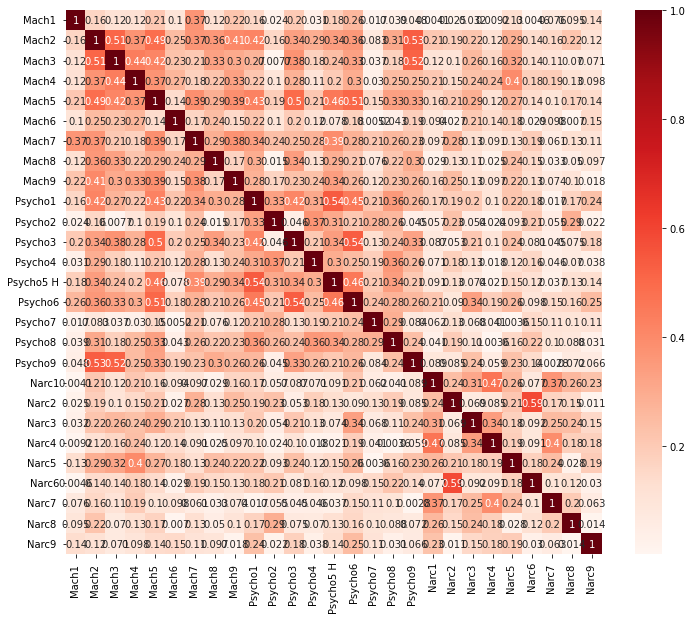

In [ ]:
correlation_matrix(df1)

Here using the function related to the importance. We try to apply on different datasets to generate the importance of the features based on different methods like logistic regression randomforest classifier and ... Which we can see the plots and the rankings which each method has generated for the first dataset plus to the machine learning algorithms we used 3 other feature selection methods such as chi-squared and mutual information.

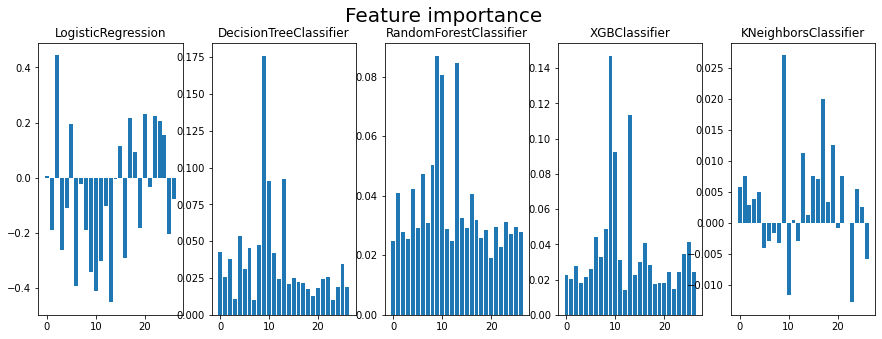

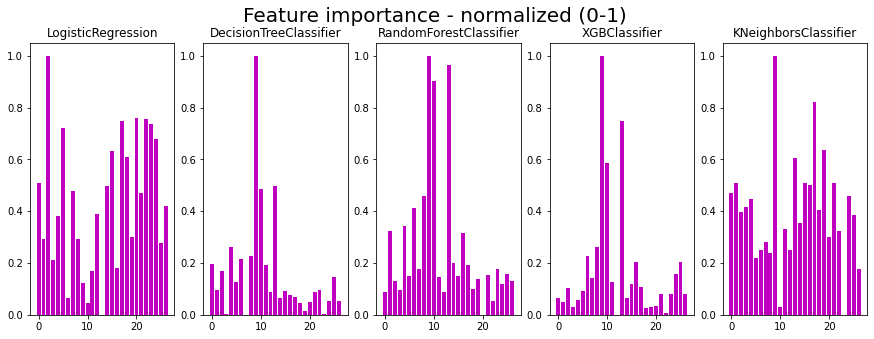

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|  13 |   13 |       9 |    2 |     9 |     9 |      9 |     9 |
|   9 |    9 |      10 |   20 |    13 |    13 |     13 |    17 |
|  10 |   10 |      13 |   22 |    10 |    10 |     10 |    19 |
|  16 |    8 |       8 |   17 |     4 |     8 |      8 |    13 |
|   4 |    1 |      25 |   23 |     8 |     6 |      6 |    15 |
|   1 |    0 |       2 |    5 |     6 |     4 |     25 |    21 |
|   6 |   17 |      11 |   24 |     0 |     1 |     16 |     1 |
|   8 |   16 |       6 |   15 |    11 |    16 |     24 |    16 |
|  14 |    4 |      21 |   18 |     2 |    14 |      7 |     0 |
|  12 |   21 |       0 |    0 |    25 |    17 |     11 |    24 |
|  11 |   26 |      14 |   14 |     5 |    23 |     15 |     4 |
|   7 |    3 |      15 |    7 |     1 |     7 |     17 |     3 |
|  15 |    2 |      23 |   21 |    22 |    25 |      2 |    18 |
|  25 |    6 |      12 | 

## Applying tfidf transformation

### TFIDF re-scoring of features
####the idea is the same for all the datasets but the description and details for the first dataset are as follows.
 The goal of this transformation is to penalize the features which are ranked high only in a few classifiers
 e.g. see feature 20
 Features importance is reordered using a metric similar to TFIDF.

Notes:

TF = times_term_in_doc / total_terms_in_doc
translated is
TF = (max_importance - importance_feature) / max_importance

IDF = log(N_doc_in_corpus/N_doc_containing_term)
translated is
IDF = log(N_classifiers/cumulative_TF) where TF are in range 0 to 1 (most important)

Features are ranked by importance from 0 (most important) to 27
then TF term is calculated for each feature in each model sub-ranking (each column)
with the following formula (<max_rank> - <feature_rank>) / <max_rank>
this results in a number between 1 and 0,
where TF=1 indicates that the feature is the most important for that column
and TF=0 indiates that the feature is the least important for that column

IDF term is then calculated by taking log(N_classifiers/cumulative_TF)
where N_classifiers=8 and cumulative_TF (similar as the old cumulative_ranking)
BUT considers the sum of all the TF values for a specific feature over all columns|models
so that the maximum value possible will be 8 hence the term of our log() will be between 0 and 1

Finally, all features for each column are re-ranked by multiplying their TF to the 1/IDF value for that feature
remember that TF is calculated for each feature in each column (we have 8 models|columns and 27 features for dataset #1 thus 8*27 TF values but only 27 IDF values)



In [ ]:
print_ranks(ranks, highlight=20)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=20)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|  13 |   13 |       9 |    2 |     9 |     9 |      9 |     9 |
|   9 |    9 |      10 |   20 |    13 |    13 |     13 |    17 |
|  10 |   10 |      13 |   22 |    10 |    10 |     10 |    19 |
|  16 |    8 |       8 |   17 |     4 |     8 |      8 |    13 |
|   4 |    1 |      25 |   23 |     8 |     6 |      6 |    15 |
|   1 |    0 |       2 |    5 |     6 |     4 |     25 |    21 |
|   6 |   17 |      11 |   24 |     0 |     1 |     16 |     1 |
|   8 |   16 |       6 |   15 |    11 |    16 |     24 |    16 |
|  14 |    4 |      21 |   18 |     2 |    14 |      7 |     0 |
|  12 |   21 |       0 |    0 |    25 |    17 |     11 |    24 |
|  11 |   26 |      14 |   14 |     5 |    23 |     15 |     4 |
|   7 |    3 |      15 |    7 |     1 |     7 |     17 |     3 |
|  15 |    2 |      23 |   21 |    22 |    25 |      2 |    18 |
|  25 |    6 |      12 | 

Feature 20 in LR classifier is pushed down


###Second iteration of tfidf transformation:
each time we apply this tfidf idea on the dataset the answer gets better until the moment that the ranking does not change and we are satisfied.

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=8)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   9 |    9 |       9 |    9 |     9 |     9 |      9 |     9 |
|  13 |   13 |      13 |    8 |    13 |    13 |     13 |    13 |
|   8 |    8 |       8 |   17 |     8 |     8 |      8 |    17 |
|  10 |   10 |      10 |   15 |    10 |    10 |     10 |    16 |
|  16 |   17 |       6 |    2 |     4 |    17 |     17 |    15 |
|   4 |   16 |      17 |    0 |     6 |     6 |     16 |     4 |
|   6 |    4 |       2 |    4 |    17 |     4 |      6 |     8 |
|  17 |    6 |      15 |   14 |     2 |    16 |     15 |     2 |
|  15 |    0 |       0 |   21 |     0 |    15 |     25 |     1 |
|   1 |    1 |      25 |   24 |    16 |     1 |      2 |     0 |
|  14 |    2 |      16 |    1 |    15 |    14 |     11 |    21 |
|  11 |   21 |      11 |    5 |    25 |    25 |      4 |    25 |
|  25 |   11 |      21 |   16 |    11 |    21 |     21 |     6 |
|   0 |   15 |      14 | 

### Cumulative ranking function:
 Apart from the ranking which tfidf generates, Cumulative ranking is combining the ranking list which we saw generated by 8 different methods and combines them each other and using ensemble method lists the features from the most important ones to the least important ones. Which we can see the summarized and combined answer of the 8 methods for first dataset is as follows and shows that the most important feature is 9(Psycho1) and least important one is 18(Narc1).
 The idea is that it assigns a number starting from zero to each row of the ranking lists for example we see inside list C the 13 is in the top so the assigned number is 0 then again for the MI ranking also the 13 is on the top so again 0 and for the RFEDT ranking the 13 is in the third position so would be 2 and for LR 13 is in the 26th rank and for DTC 13 is in 2nd rank so would be 1 and for RFC 13 is in second position also so again 1 and for XGBC 13 is again 1 and for KNC 13 would be 3 and then we sum all this assigned numbers which for 13 would be = 0+0+2+26+1+1+1+3=34. So for each feature we will have a number which has been received by summing the assigned numbers in each of 8 ranking list and then the cumulative ranking will produce new list ranking based on this summed numbers for each feature and will rank them from lowest number to the highest. In this way we can conclude that which features have been recognized as important ones by our methods.

In [ ]:
print_ranks(ranks)
print("================================================================")
print("-----------cumulative answer is:")
cumulative = ensemble(ranks, df1)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|  13 |   13 |       9 |    2 |     9 |     9 |      9 |     9 |
|   9 |    9 |      10 |   20 |    13 |    13 |     13 |    17 |
|  10 |   10 |      13 |   22 |    10 |    10 |     10 |    19 |
|  16 |    8 |       8 |   17 |     4 |     8 |      8 |    13 |
|   4 |    1 |      25 |   23 |     8 |     6 |      6 |    15 |
|   1 |    0 |       2 |    5 |     6 |     4 |     25 |    21 |
|   6 |   17 |      11 |   24 |     0 |     1 |     16 |     1 |
|   8 |   16 |       6 |   15 |    11 |    16 |     24 |    16 |
|  14 |    4 |      21 |   18 |     2 |    14 |      7 |     0 |
|  12 |   21 |       0 |    0 |    25 |    17 |     11 |    24 |
|  11 |   26 |      14 |   14 |     5 |    23 |     15 |     4 |
|   7 |    3 |      15 |    7 |     1 |     7 |     17 |     3 |
|  15 |    2 |      23 |   21 |    22 |    25 |      2 |    18 |
|  25 |    6 |      12 | 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
ensemble_increasingwindow(ranks, df1)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| Psycho1   |    9 | ***            |
| Psycho5 H |   13 | ***            |
| Psycho2   |   10 | ***            |
| Mach9     |    8 | ***            |
| Psycho9   |   17 | -              |
| Mach3     |    2 | -              |
| Mach5     |    4 | ***            |
| Mach7     |    6 | ***            |
| Psycho8   |   16 | ***            |
| Mach2     |    1 | ***            |
| Mach1     |    0 | **             |
| Narc8     |   25 | ***            |
| Psycho7   |   15 | ***            |
| Psycho3   |   11 | ***            |
| Narc4     |   21 | -              |
| Psycho6   |   14 | ***            |
| Narc7     |   24 | -              |
| Mach8     |    7 | ***            |
| Narc6     |   23 | *              |
| Mach6     |    5 | -              |
| Narc2     |   19 | ***            |
| Psycho4   |   12 | ***            |
| Narc9     |   26 | -              |
| Mach4     |    3 | **             |
| Narc5     

The idea for this ranking is exactly the same as we described before like cumulative ranking but this one applies the idea on the tfidf ranking list.

In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df1)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| Psycho1   |    9 | ***            |
| Psycho5 H |   13 | ***            |
| Mach9     |    8 | ***            |
| Psycho9   |   17 | -              |
| Psycho2   |   10 | ***            |
| Psycho8   |   16 | ***            |
| Mach5     |    4 | ***            |
| Mach7     |    6 | ***            |
| Psycho7   |   15 | ***            |
| Mach3     |    2 | -              |
| Mach1     |    0 | **             |
| Mach2     |    1 | ***            |
| Narc8     |   25 | ***            |
| Psycho6   |   14 | ***            |
| Psycho3   |   11 | ***            |
| Narc4     |   21 | -              |
| Narc7     |   24 | -              |
| Mach8     |    7 | ***            |
| Mach6     |    5 | -              |
| Narc6     |   23 | *              |
| Narc2     |   19 | ***            |
| Psycho4   |   12 | ***            |
| Narc9     |   26 | -              |
| Mach4     |    3 | **             |
| Narc3     

These plots are just showing for each feature the number of honest and dishonest answers and the mean for each category in the feature.

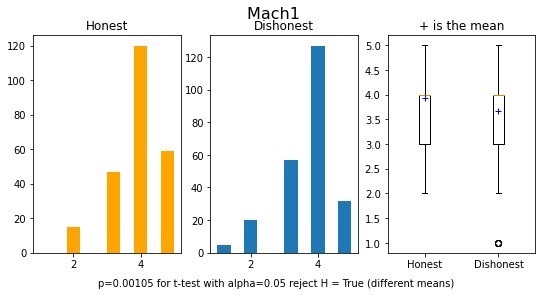

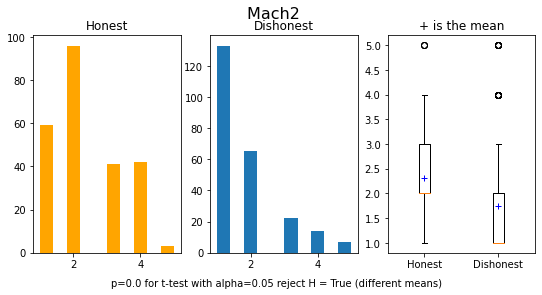

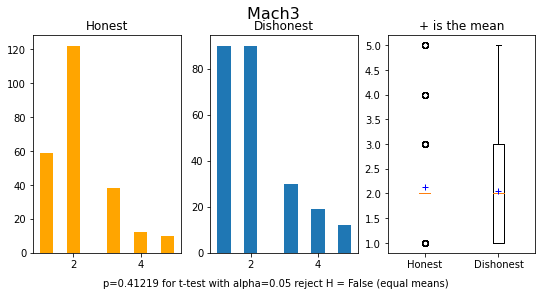

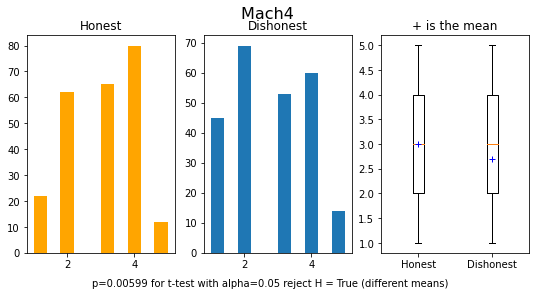

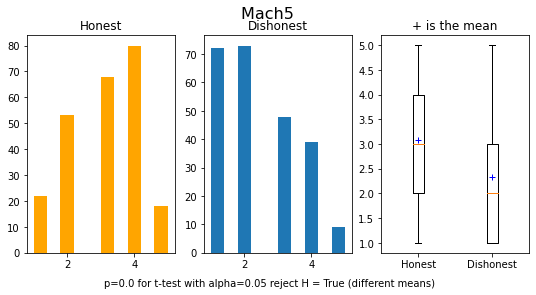

...

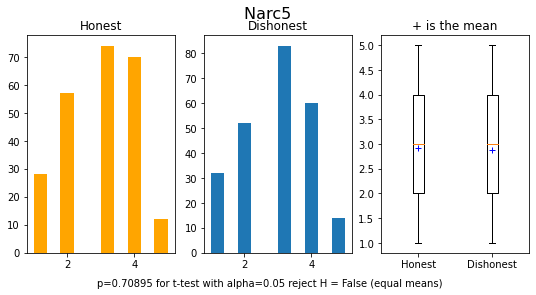

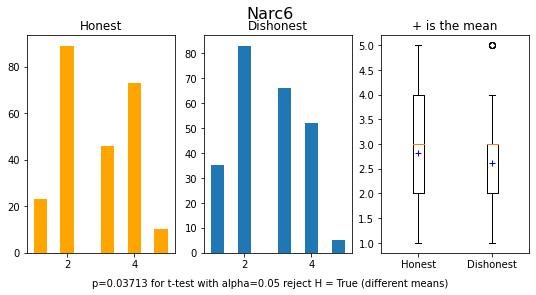

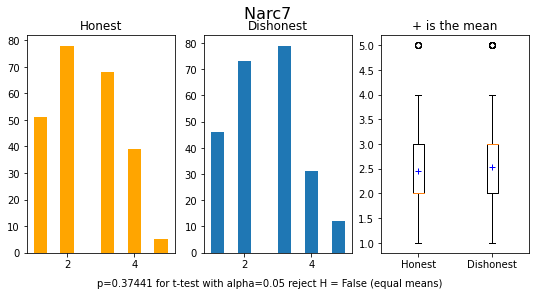

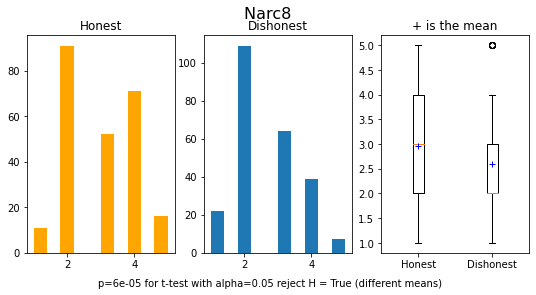

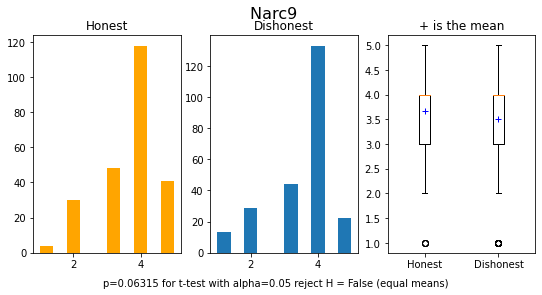

In [ ]:
plots(df1)

Here we try to feed the machine learning algorithms such as Logistic regression classifier and Decision tree classifier and ... the cumulative ranking which we received and tried to train the model and test that on the 10 percent of the data and we can see from the plot that starting only with one feature which is the most important one to higher number of features which for this dataset is 27 which includes all the features, we can see for example logistic regression is showing 74% accuracy containing only 20% of the top important features and its highest accuracy is around 88 percent containing the 21 important features.

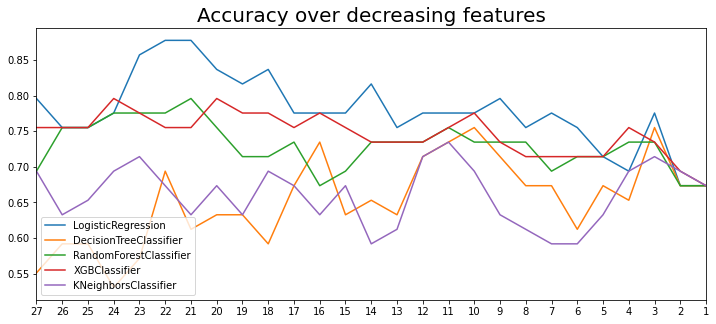

In [ ]:
plot_accuracies(df1, cumulative)

This function below also generates the mean value of the honest and dishonest answers for each feature.

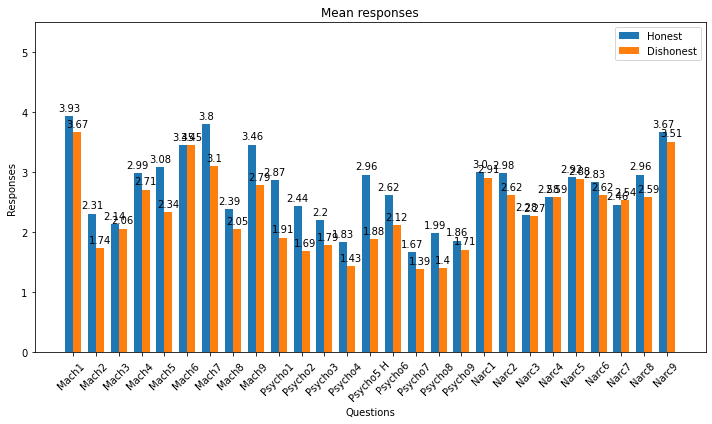

In [ ]:
n,p = df1.shape # extract dimensions

rows_honest = df1.iloc[:n//2,:-1]
rows_disonest = df1.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df1.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 3 - Modelling

In [ ]:
X

,Mach1,Mach2,Mach3,Mach4,Mach5,Mach6,Mach7,Mach8,Mach9,Psycho1,...,Psycho9,Narc1,Narc2,Narc3,Narc4,Narc5,Narc6,Narc7,Narc8,Narc9
0,3,3,2,4,4,3,3,3,4,2,...,1,3,3,3,3,3,4,3,4,2
1,4,2,1,3,4,4,4,2,2,3,...,1,4,1,3,3,2,2,3,4,5
2,4,1,3,3,3,1,4,1,5,1,...,1,3,2,3,3,2,1,2,3,3
3,4,3,1,3,3,4,2,3,4,2,...,1,4,4,1,2,4,2,2,3,4
4,3,2,1,2,2,3,3,2,3,2,...,1,2,2,2,2,3,1,1,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
477,4,3,5,4,1,4,3,4,2,3,...,2,3,3,2,2,3,3,3,3,4
478,4,1,1,4,1,4,4,1,3,1,...,1,4,4,2,2,1,4,2,4,2
479,3,1,1,1,1,3,2,1,1,1,...,1,4,3,3,3,2,4,1,3,4
480,4,2,2,2,3,4,3,2,2,3,...,1,3,2,2,2,3,2,2,2,4


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.8
There were 10 errors on 49 predictions


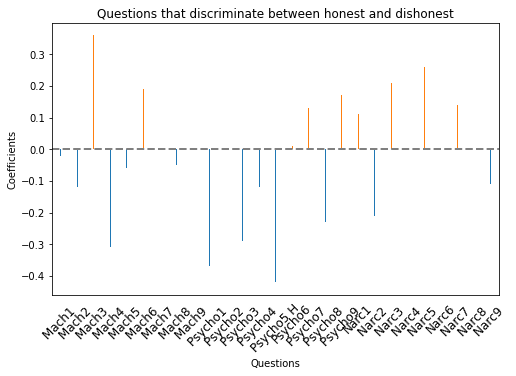

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df1.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df1.columns)[:-1],
                       rotation=45, fontsize=12)


We can conclude that the model consider a little bit of all the features to discriminate between honest and dishonest

##### What are the wrong predictions?
Before moving to the faking removal modelling, it's important to check what kind of errors the model is doing.

In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df1["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df1["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,Mach1,Mach2,Mach3,Mach4,Mach5,Mach6,Mach7,Mach8,Mach9,Psycho1,...,Narc2,Narc3,Narc4,Narc5,Narc6,Narc7,Narc8,Narc9,CONDITION,Prediction
181,3,2,2,4,3,2,2,2,2,2,...,3,2,3,4,4,2,2,4,H,D
227,3,4,1,2,3,4,4,1,3,2,...,2,2,3,2,2,1,2,3,H,D
9,5,1,1,1,1,1,5,1,5,1,...,5,1,1,5,1,1,1,5,H,D
211,3,2,3,3,2,3,3,2,3,2,...,3,3,4,2,3,3,3,2,H,D
281,4,2,2,4,2,2,4,2,4,2,...,3,3,4,2,3,2,2,2,D,H
33,4,3,2,2,3,4,4,2,2,2,...,3,2,3,4,3,4,3,2,H,D
153,5,1,1,1,3,3,3,1,1,1,...,1,1,2,1,2,1,2,5,H,D
70,4,2,2,4,2,4,4,2,4,2,...,2,3,4,4,4,3,2,4,H,D
0,3,3,2,4,4,3,3,3,4,2,...,3,3,3,3,4,3,4,2,H,D
124,3,1,1,2,3,4,3,2,1,1,...,2,2,2,3,2,2,2,4,H,D


##### Comparison between misclassifications and typical behavior


Nine out of ten errors are made by classifying one subject as lier, when it is not.

So here there is the comparison between the miss-classified subjects and the typical dishonest behavior, in order to see if the model have a good reason to classify them as liers.

**Adjusting falsified questionnaires to honest ones**

We will compare different approaches to infer the honest answers provided by a falsified questionnaire:

### PCA


First step for PCA we introduce th dataset and ask it to return the needed information

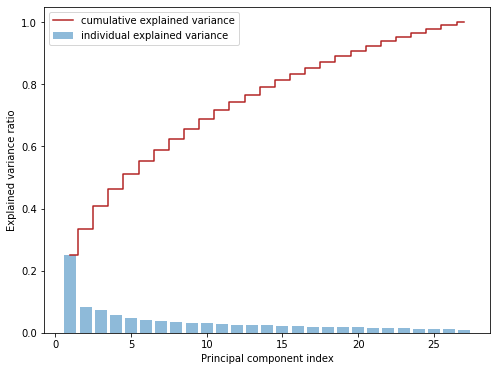

number of components based on eigenvalue higher than 1 is: 8
n = 8, tot explained variance: 0.625
      PC   exp_var    cumvar  eigenvalue
0    1.0  0.248904  0.248904    7.308051
1    2.0  0.083868  0.332772    2.462427
2    3.0  0.074068  0.406839    2.174690
3    4.0  0.057542  0.464381    1.689484
4    5.0  0.046418  0.510799    1.362889
5    6.0  0.042566  0.553365    1.249766
6    7.0  0.036470  0.589836    1.070806
7    8.0  0.035523  0.625359    1.042997
8    9.0  0.032216  0.657574    0.945880
9   10.0  0.030330  0.687904    0.890513
10  11.0  0.028606  0.716510    0.839900
11  12.0  0.026447  0.742957    0.776499
12  13.0  0.024035  0.766992    0.705675
13  14.0  0.023836  0.790828    0.699858
14  15.0  0.021999  0.812827    0.645908
15  16.0  0.021113  0.833940    0.619908
16  17.0  0.019434  0.853375    0.570613
17  18.0  0.018895  0.872270    0.554774
18  19.0  0.018567  0.890837    0.545157
19  20.0  0.017631  0.908468    0.517675
20  21.0  0.015314  0.923782    0.449621


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df1, X_train, y)
print(pca_info)

we see that in the eigenvalue column the number of components with eigenvalue higher than 1 are 8. So the PCA with 8 number of components is capturing the 62% of the variance in the data. So the pca dataset will be generated with 8 components.

Accuracy: 0.729 (0.061)


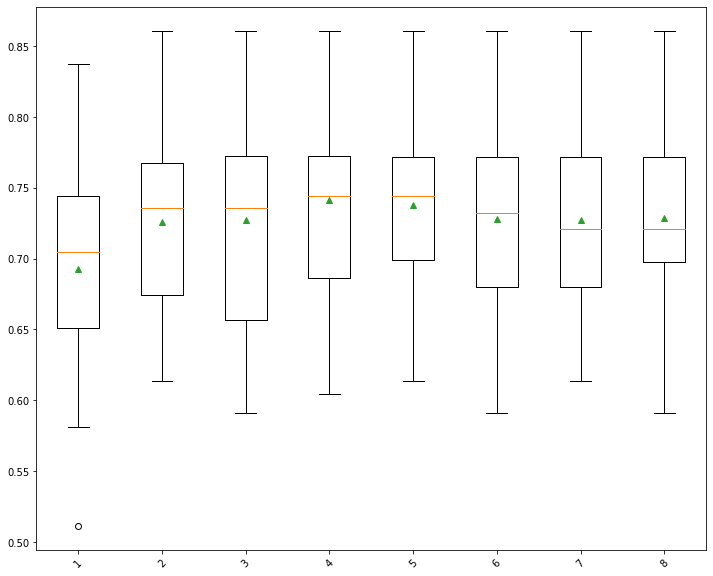

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

So using the logistic regression the accuracy of classification with PCA with the components 1 to 8 can be seen in the plot. We see that number 4 has the highest accuracy. So the new pca dataset will be built with 4 components based on this result.
the next function makes the new pca dataset and using the randomforest classifier and cross validation it fits and predicts on the test set and we can see that including only 4 components the model has f1 score 75%. This procedure is giving f1s higher than 90% for many of other dataset.

n = 4, tot explained variance: 0.464
        PC0       PC1       PC2       PC3
0 -0.340370  1.475472 -0.960758  0.962187
1 -1.344904 -2.117333 -1.847469 -1.564251
2  1.847174 -0.962546  0.609710  0.193354
3  4.863219  0.424668 -2.362120 -0.283898
4 -1.517008  0.387574 -0.092762  0.974054
val score:  0.7550922213311948
best params:  {'max_depth': 10}
f1s:  0.7536443148688047
              precision    recall  f1-score   support

           0       0.76      0.81      0.79        27
           1       0.75      0.68      0.71        22

    accuracy                           0.76        49
   macro avg       0.75      0.75      0.75        49
weighted avg       0.75      0.76      0.75        49



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


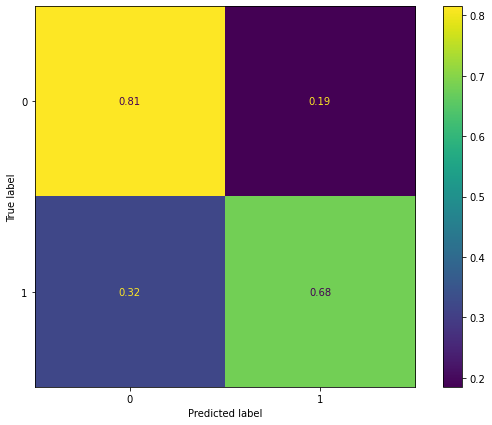

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 4)

# 2. ShortDT(2)
## (fake good)

In [ ]:
df2 = get_dataset("./datasets/1. shortDT (2)2/")


y = np.array([1 if c == "D" else 0 for c in df2["CONDITION"]]) # create response array
X = df2.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    432
1    432
dtype: int64


correlation of the features:
0


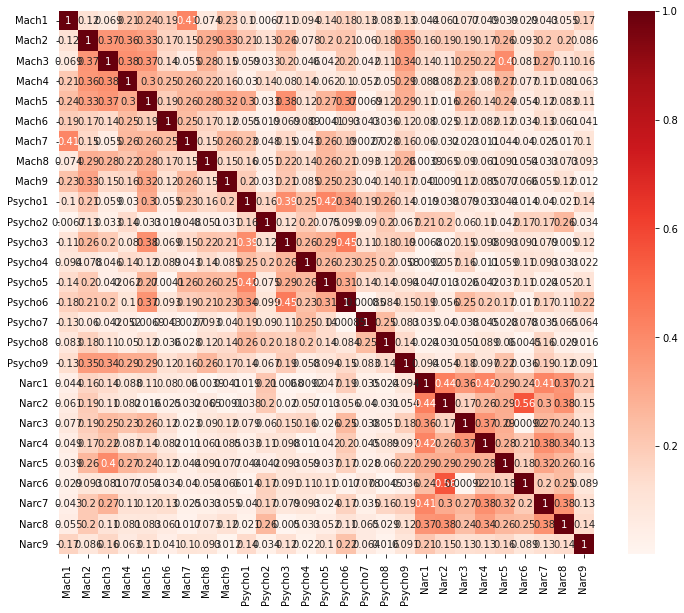

In [ ]:
correlation_matrix(df2)

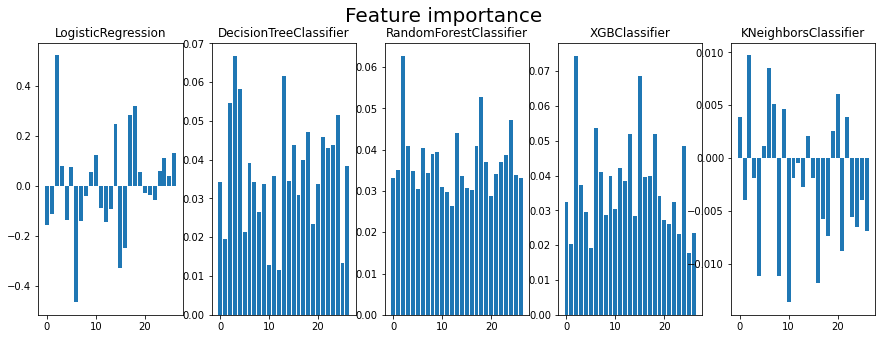

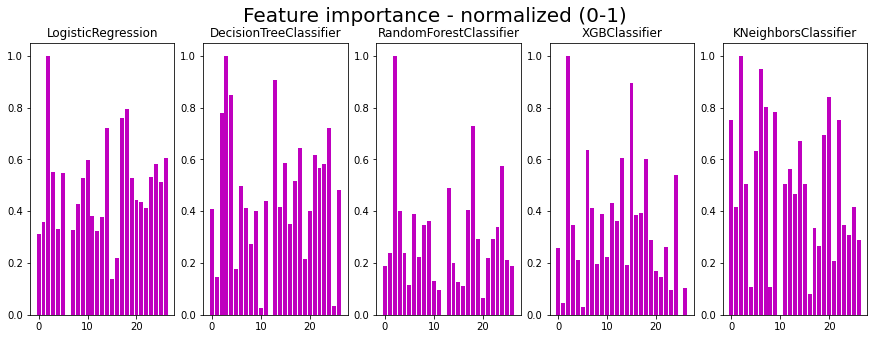

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)


In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   2 |   26 |       2 |    2 |     3 |     2 |      2 |     2 |
|  18 |    0 |      18 |   18 |    13 |    18 |     15 |     6 |
|  24 |   18 |       6 |   17 |     4 |    24 |      6 |    20 |
|  25 |   24 |       4 |   14 |     2 |    13 |     13 |     7 |
|  15 |   19 |      20 |   26 |    24 |    17 |     18 |     9 |
|  19 |    2 |      11 |   10 |    18 |     3 |     24 |     0 |
|  23 |   25 |      17 |   24 |    21 |     6 |     11 |    22 |
|  13 |    6 |      13 |    3 |    15 |     9 |      7 |    19 |
|  17 |    9 |      24 |    5 |    23 |     8 |     17 |    14 |
|  22 |    1 |       3 |   23 |    22 |    23 |      9 |     5 |
|  21 |    4 |      16 |   19 |    17 |    22 |     16 |    12 |
|   6 |    3 |      22 |    9 |     6 |    19 |     12 |     3 |
|  16 |    7 |      15 |   25 |    26 |     1 |      3 |    11 |
|  20 |   13 |       0 | 

Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=2)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=2)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   2 |   26 |       2 |    2 |     3 |     2 |      2 |     2 |
|  18 |    0 |      18 |   18 |    13 |    18 |     15 |     6 |
|  24 |   18 |       6 |   17 |     4 |    24 |      6 |    20 |
|  25 |   24 |       4 |   14 |     2 |    13 |     13 |     7 |
|  15 |   19 |      20 |   26 |    24 |    17 |     18 |     9 |
|  19 |    2 |      11 |   10 |    18 |     3 |     24 |     0 |
|  23 |   25 |      17 |   24 |    21 |     6 |     11 |    22 |
|  13 |    6 |      13 |    3 |    15 |     9 |      7 |    19 |
|  17 |    9 |      24 |    5 |    23 |     8 |     17 |    14 |
|  22 |    1 |       3 |   23 |    22 |    23 |      9 |     5 |
|  21 |    4 |      16 |   19 |    17 |    22 |     16 |    12 |
|   6 |    3 |      22 |    9 |     6 |    19 |     12 |     3 |
|  16 |    7 |      15 |   25 |    26 |     1 |      3 |    11 |
|  20 |   13 |       0 | 

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)
print(tfidf_ranks)
tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=2)

{'Chi2': [(2, 0), (18, 1), (24, 2), (13, 3), (6, 4), (17, 5), (19, 6), (15, 7), (22, 8), (23, 9), (25, 10), (3, 11), (21, 12), (20, 13), (9, 14), (26, 15), (16, 16), (14, 17), (12, 18), (8, 19), (7, 20), (10, 21), (1, 22), (11, 23), (0, 24), (5, 25), (4, 26)], 'Mutual Information': [(2, 0), (18, 1), (24, 2), (6, 3), (19, 4), (3, 5), (13, 6), (26, 7), (0, 8), (9, 9), (25, 10), (4, 11), (7, 12), (1, 13), (11, 14), (14, 15), (5, 16), (8, 17), (15, 18), (12, 19), (17, 20), (10, 21), (16, 22), (20, 23), (21, 24), (22, 25), (23, 26)], 'RFE using DecisionTree': [(2, 0), (18, 1), (24, 2), (6, 3), (13, 4), (17, 5), (3, 6), (4, 7), (20, 8), (11, 9), (22, 10), (15, 11), (0, 12), (14, 13), (16, 14), (9, 15), (8, 16), (21, 17), (23, 18), (19, 19), (7, 20), (10, 21), (5, 22), (1, 23), (25, 24), (12, 25), (26, 26)], 'LogisticRegression': [(2, 0), (18, 1), (24, 2), (17, 3), (3, 4), (14, 5), (19, 6), (26, 7), (9, 8), (13, 9), (23, 10), (10, 11), (20, 12), (22, 13), (25, 14), (5, 15), (21, 16), (11, 17)

In [ ]:
cumulative = ensemble(ranks, df2)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| Mach3     |    2 | ***            |
| Narc1     |   18 | ***            |
| Narc7     |   24 | ***            |
| Psycho5   |   13 | ***            |
| Mach7     |    6 | ***            |
| Mach4     |    3 | *              |
| Psycho9   |   17 | ***            |
| Narc2     |   19 | ***            |
| Psycho1   |    9 | -              |
| Narc5     |   22 | ***            |
| Psycho7   |   15 | ***            |
| Psycho6   |   14 | *              |
| Mach8     |    7 | -              |
| Mach5     |    4 | -              |
| Mach1     |    0 | -              |
| Narc6     |   23 | ***            |
| Narc9     |   26 | ***            |
| Psycho3   |   11 | -              |
| Narc3     |   20 | **             |
| Narc8     |   25 | ***            |
| Narc4     |   21 | ***            |
| Mach9     |    8 | -              |
| Psycho8   |   16 | *              |
| Mach2     |    1 | -              |
| Mach6     

In [ ]:
ensemble_increasingwindow(ranks, df2)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| Mach3     |    2 | ***            |
| Narc1     |   18 | ***            |
| Mach7     |    6 | ***            |
| Narc7     |   24 | ***            |
| Psycho5   |   13 | ***            |
| Narc9     |   26 | ***            |
| Psycho7   |   15 | ***            |
| Psycho9   |   17 | ***            |
| Mach4     |    3 | *              |
| Mach5     |    4 | -              |
| Narc2     |   19 | ***            |
| Psycho1   |    9 | -              |
| Narc6     |   23 | ***            |
| Narc5     |   22 | ***            |
| Narc3     |   20 | **             |
| Mach1     |    0 | -              |
| Mach8     |    7 | -              |
| Psycho3   |   11 | -              |
| Narc8     |   25 | ***            |
| Psycho6   |   14 | *              |
| Narc4     |   21 | ***            |
| Mach9     |    8 | -              |
| Psycho8   |   16 | *              |
| Psycho4   |   12 | *              |
| Mach2     

In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df2)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| Mach3     |    2 | ***            |
| Narc1     |   18 | ***            |
| Narc7     |   24 | ***            |
| Psycho5   |   13 | ***            |
| Mach4     |    3 | *              |
| Mach7     |    6 | ***            |
| Psycho9   |   17 | ***            |
| Narc2     |   19 | ***            |
| Psycho1   |    9 | -              |
| Narc5     |   22 | ***            |
| Psycho6   |   14 | *              |
| Psycho7   |   15 | ***            |
| Mach8     |    7 | -              |
| Mach5     |    4 | -              |
| Narc6     |   23 | ***            |
| Mach1     |    0 | -              |
| Psycho3   |   11 | -              |
| Narc3     |   20 | **             |
| Narc9     |   26 | ***            |
| Narc4     |   21 | ***            |
| Narc8     |   25 | ***            |
| Mach9     |    8 | -              |
| Psycho8   |   16 | *              |
| Mach2     |    1 | -              |
| Mach6     

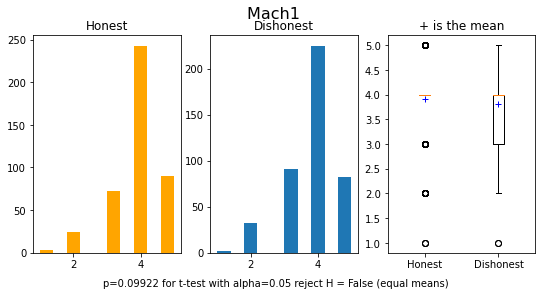

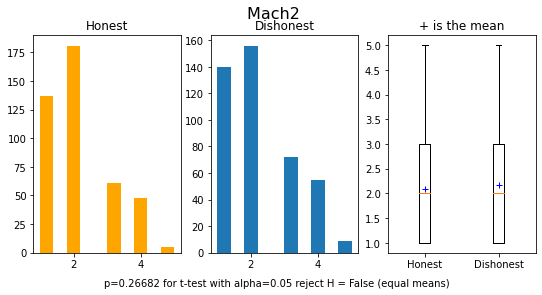

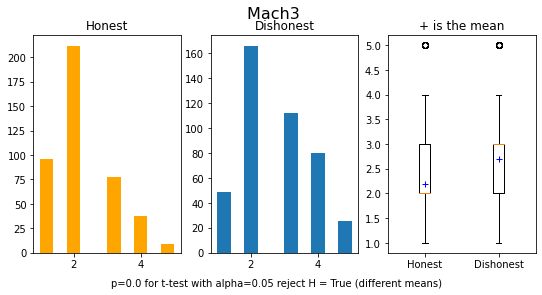

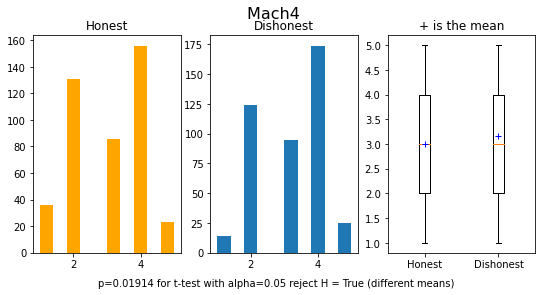

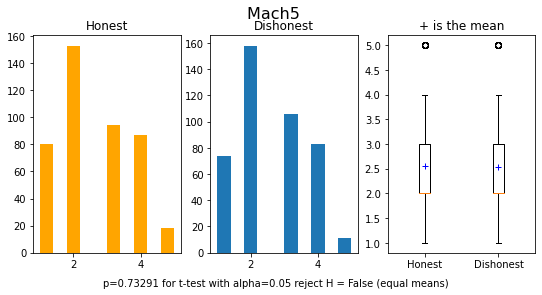

...

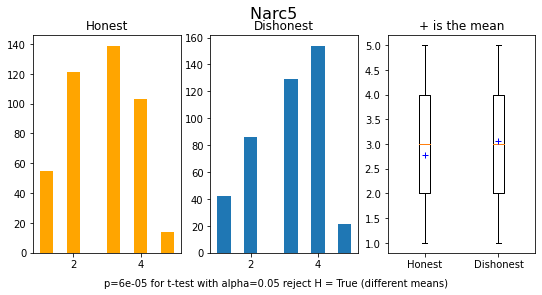

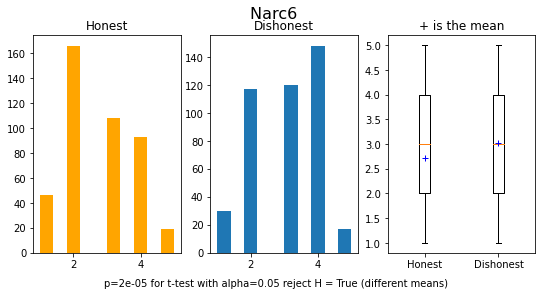

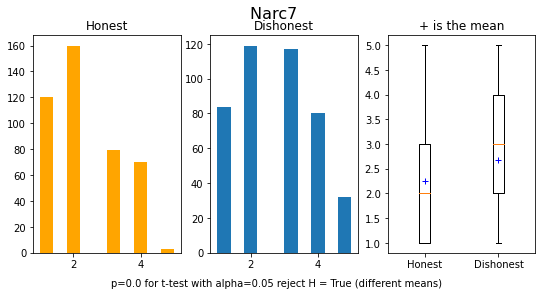

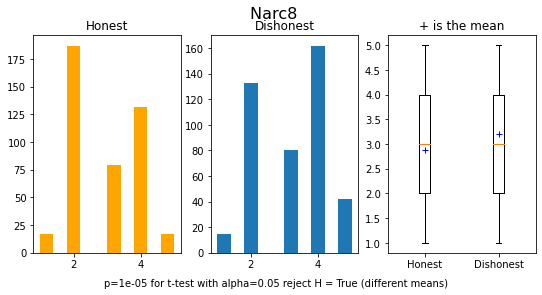

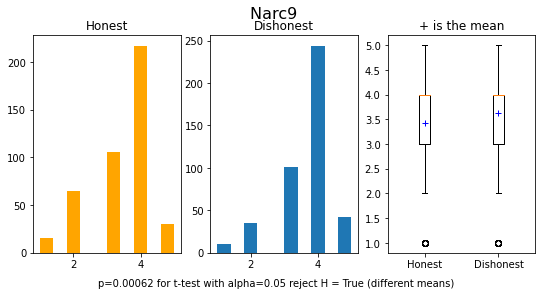

In [ ]:
plots(df2)

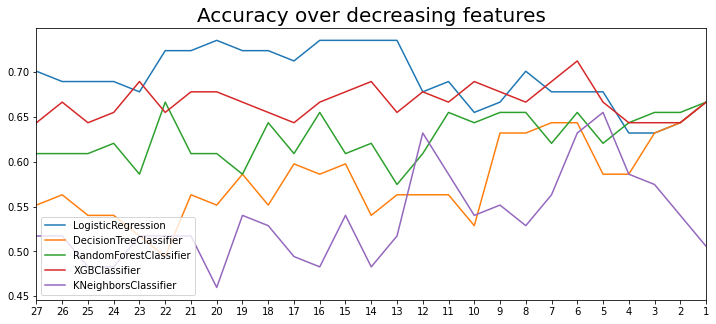

In [ ]:
plot_accuracies(df2, cumulative)

**Mean Behaviour**

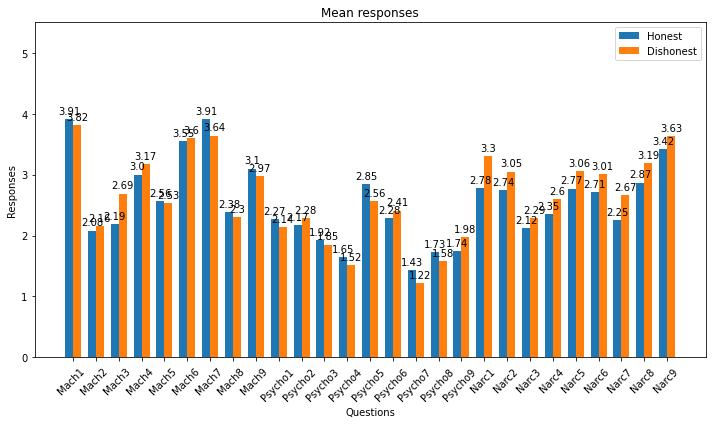

In [ ]:
n,p = df2.shape # extract dimensions

rows_honest = df2.iloc[:n//2,:-1]
rows_disonest = df2.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df2.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

**Logistic Regression and prediction on test set**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.7
There were 26 errors on 87 predictions


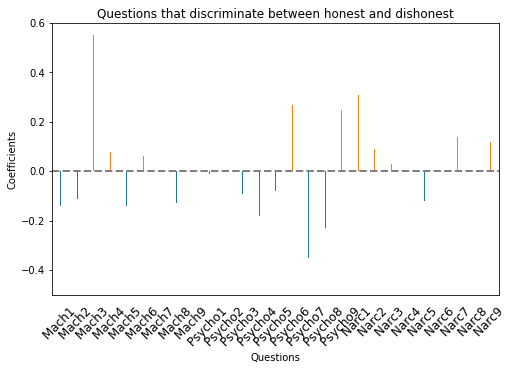

In [ ]:

fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df2.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df2.columns)[:-1],
                       rotation=45, fontsize=12)


We can conclude that the model consider a little bit of all the features to discriminate between honest and dishonest

##### What are the wrong predictions?
Before moving to the faking removal modelling, it's important to check what kind of errors the model is doing.

In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df2["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df2["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,Mach1,Mach2,Mach3,Mach4,Mach5,Mach6,Mach7,Mach8,Mach9,Psycho1,...,Narc2,Narc3,Narc4,Narc5,Narc6,Narc7,Narc8,Narc9,CONDITION,Prediction
635,4,2,3,2,2,4,4,3,3,3,...,3,2,3,4,4,2,3,4,D,H
485,4,3,3,3,4,4,4,2,4,5,...,3,3,4,5,2,4,5,4,D,H
464,2,4,2,4,2,2,4,2,3,4,...,1,2,1,2,1,1,2,2,D,H
716,4,1,1,1,3,4,4,1,4,4,...,1,1,2,2,2,1,2,4,D,H
664,4,1,2,2,1,3,3,2,1,1,...,2,1,2,3,2,3,2,3,D,H
500,4,2,2,3,3,4,4,2,4,2,...,3,3,3,4,2,2,3,4,D,H
581,5,3,3,3,3,4,5,3,2,4,...,4,2,3,3,4,1,4,4,D,H
411,4,1,2,4,3,5,4,5,1,1,...,3,2,2,2,4,2,2,4,H,D
749,4,1,2,2,2,3,4,1,2,2,...,4,3,4,4,4,2,2,4,D,H
209,4,4,4,4,4,4,5,4,4,2,...,3,2,3,4,3,4,4,4,H,D


# PCA

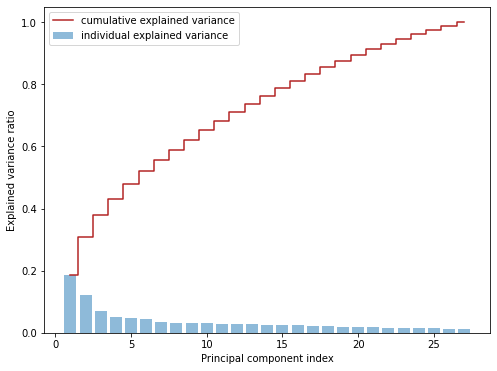

number of components based on eigenvalue higher than 1 is: 6
n = 6, tot explained variance: 0.521
      PC   exp_var    cumvar  eigenvalue
0    1.0  0.186521  0.186521    4.854780
1    2.0  0.121219  0.307740    3.155083
2    3.0  0.071790  0.379529    1.868550
3    4.0  0.050720  0.430250    1.320154
4    5.0  0.047230  0.477480    1.229307
5    6.0  0.043680  0.521160    1.136917
6    7.0  0.036018  0.557178    0.937471
7    8.0  0.032784  0.589962    0.853296
8    9.0  0.032160  0.622122    0.837060
9   10.0  0.031073  0.653195    0.808780
10  11.0  0.029769  0.682965    0.774840
11  12.0  0.027855  0.710819    0.725000
12  13.0  0.026777  0.737596    0.696957
13  14.0  0.025577  0.763173    0.665713
14  15.0  0.024300  0.787473    0.632483
15  16.0  0.023872  0.811345    0.621332
16  17.0  0.022505  0.833849    0.585754
17  18.0  0.022075  0.855925    0.574577
18  19.0  0.020135  0.876059    0.524067
19  20.0  0.019387  0.895446    0.504601
20  21.0  0.019048  0.914494    0.495777


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df2, X_train, y)
print(pca_info)

Accuracy: 0.641 (0.045)


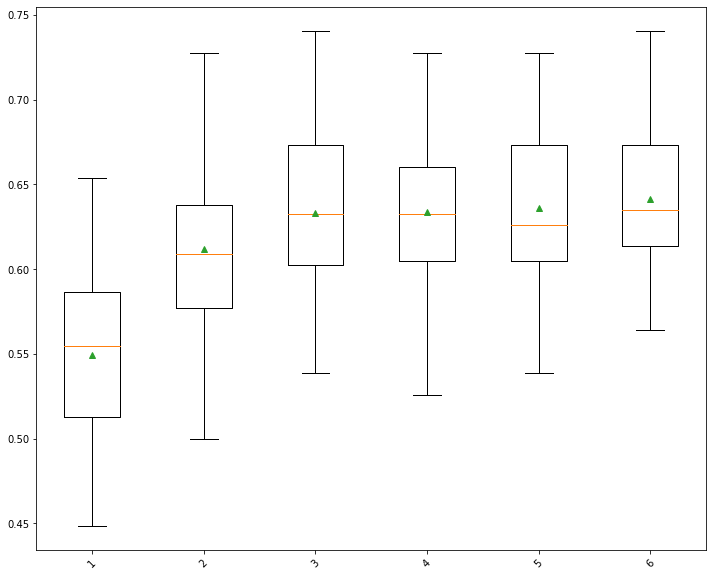

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 6, tot explained variance: 0.521
        PC0       PC1       PC2       PC3       PC4       PC5
0  0.693107 -1.342532 -0.112303  0.053000  1.336933  0.748054
1  2.172364 -1.548385 -0.383950 -1.516931  0.378694 -0.890182
2  0.020209  1.636246  1.923373  1.403236 -0.800419  0.889140
3 -0.478591 -0.933949  1.455621 -0.296371 -0.851623 -0.078488
4 -1.502203 -0.851773  0.734915  0.355960  0.645962 -1.481565
val score:  0.606228287841191
best params:  {'max_depth': 10}
f1s:  0.5517241379310345
              precision    recall  f1-score   support

           0       0.52      0.59      0.55        41
           1       0.59      0.52      0.55        46

    accuracy                           0.55        87
   macro avg       0.55      0.55      0.55        87
weighted avg       0.56      0.55      0.55        87



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


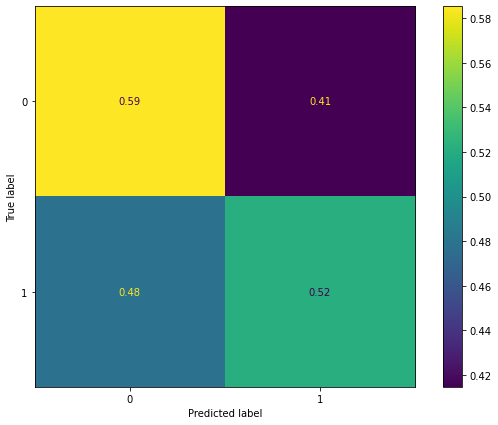

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 6)

# 3. PRMQ

In [ ]:
df3 = get_dataset("./datasets/2. PRMQ/")
#X, y = pandas_to_numpy(df3)
y = np.array([1 if c == "D" else 0 for c in df3["CONDITION"]]) # create response array
X = df3.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    702
1    702
dtype: int64


correlation of the features:
0


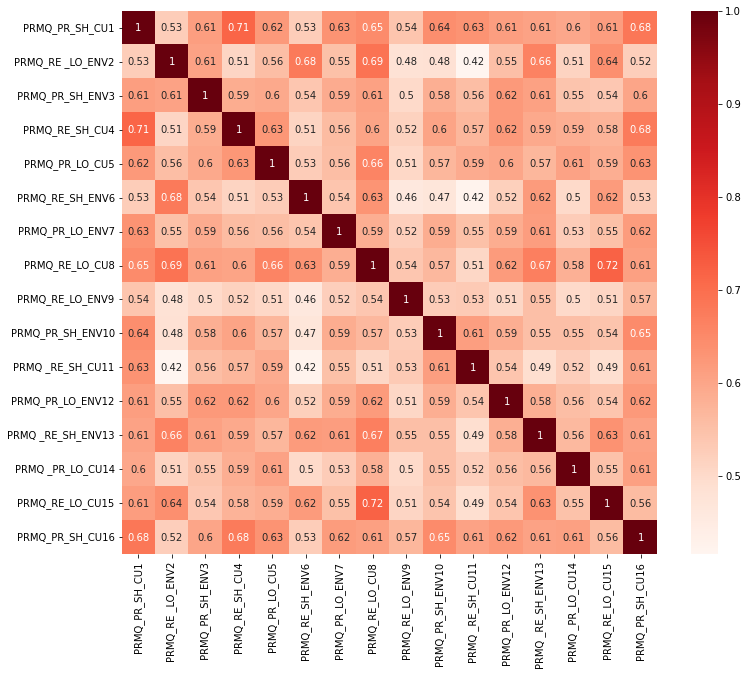

In [ ]:
correlation_matrix(df3)

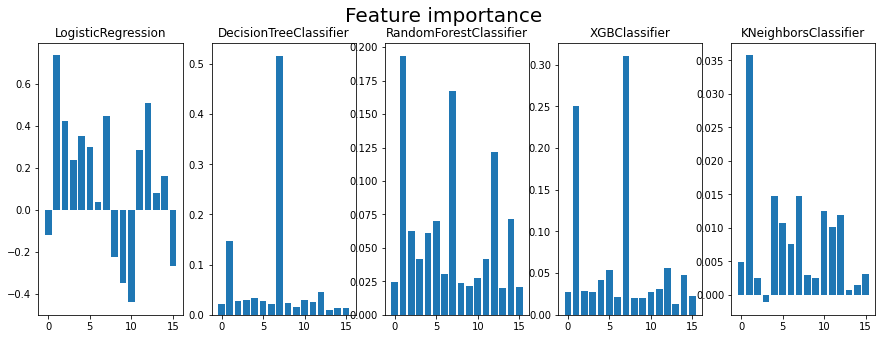

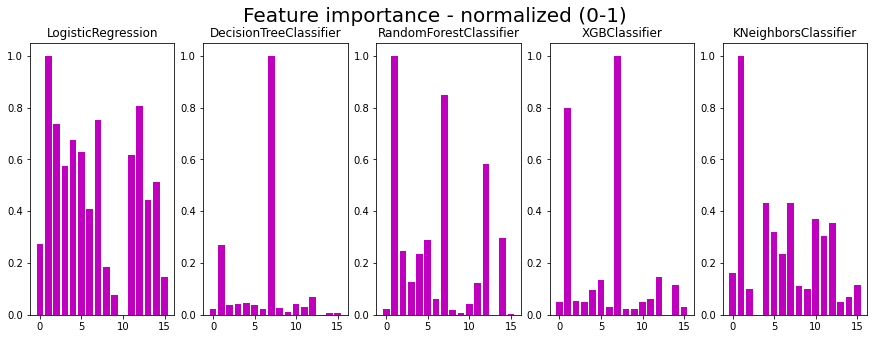

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   1 |    7 |       7 |    1 |     7 |     1 |      7 |     1 |
|   7 |    1 |       1 |   12 |     1 |     7 |      1 |     7 |
|  12 |   12 |      12 |    7 |    12 |    12 |     12 |     4 |
|   5 |   14 |       4 |    2 |     4 |    14 |      5 |    10 |
|  14 |    4 |       5 |    4 |    10 |     5 |     14 |    12 |
|   2 |    2 |       3 |    5 |     3 |     2 |      4 |     5 |
|   4 |   11 |       6 |   11 |     5 |     4 |     11 |    11 |
|   6 |    5 |       0 |    3 |     2 |     3 |      2 |     6 |
|  11 |   15 |      10 |   14 |    11 |    11 |      0 |     0 |
|   3 |    0 |       2 |   13 |     8 |     6 |     10 |    15 |
|  13 |    3 |      15 |    6 |     6 |    10 |      3 |     8 |
|   0 |    8 |      11 |    0 |     0 |     0 |     15 |     2 |
|  15 |    6 |       9 |    8 |     9 |     8 |      6 |     9 |
|   8 |    9 |      14 | 

Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=7)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=7)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   1 |    7 |       7 |    1 |     7 |     1 |      7 |     1 |
|   7 |    1 |       1 |   12 |     1 |     7 |      1 |     7 |
|  12 |   12 |      12 |    7 |    12 |    12 |     12 |     4 |
|   5 |   14 |       4 |    2 |     4 |    14 |      5 |    10 |
|  14 |    4 |       5 |    4 |    10 |     5 |     14 |    12 |
|   2 |    2 |       3 |    5 |     3 |     2 |      4 |     5 |
|   4 |   11 |       6 |   11 |     5 |     4 |     11 |    11 |
|   6 |    5 |       0 |    3 |     2 |     3 |      2 |     6 |
|  11 |   15 |      10 |   14 |    11 |    11 |      0 |     0 |
|   3 |    0 |       2 |   13 |     8 |     6 |     10 |    15 |
|  13 |    3 |      15 |    6 |     6 |    10 |      3 |     8 |
|   0 |    8 |      11 |    0 |     0 |     0 |     15 |     2 |
|  15 |    6 |       9 |    8 |     9 |     8 |      6 |     9 |
|   8 |    9 |      14 | 

Second iteration of tfidf transformation:

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=7)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   1 |    1 |       1 |    1 |     1 |     1 |      1 |     1 |
|   7 |    7 |       7 |    7 |     7 |     7 |      7 |     7 |
|  12 |   12 |      12 |   12 |    12 |    12 |     12 |    12 |
|   5 |    4 |       4 |    4 |     4 |     5 |      5 |     4 |
|   4 |    5 |       5 |    5 |     5 |     4 |      4 |     5 |
|   2 |    2 |       2 |    2 |     2 |     2 |      2 |    11 |
|  11 |   11 |       3 |   11 |    11 |    11 |     11 |     2 |
|  14 |   14 |       6 |   14 |     3 |    14 |     14 |     6 |
|   6 |    0 |      11 |    3 |     6 |     3 |      0 |    10 |
|   3 |    3 |       0 |    6 |    10 |     6 |      3 |     0 |
|   0 |    6 |      10 |    0 |     0 |     0 |      6 |    14 |
|  15 |   15 |      14 |    8 |     8 |    10 |     10 |    15 |
|  13 |    8 |      15 |   13 |     9 |     8 |     15 |     8 |
|   8 |    9 |       9 | 

In [ ]:
cumulative = ensemble(ranks, df3)

| Feature           |   _n | Significance   |
|-------------------+------+----------------|
| PRMQ_RE _LO_ENV2  |    1 | ***            |
| PRMQ_RE_LO_CU8    |    7 | ***            |
| PRMQ _RE_SH_ENV13 |   12 | ***            |
| PRMQ_PR_LO_CU5    |    4 | ***            |
| PRMQ_RE_SH_ENV6   |    5 | ***            |
| PRMQ_PR_SH_ENV3   |    2 | ***            |
| PRMQ_PR_LO_ENV12  |   11 | ***            |
| PRMQ_RE_LO_CU15   |   14 | ***            |
| PRMQ_RE_SH_CU4    |    3 | ***            |
| PRMQ_PR_LO_ENV7   |    6 | ***            |
| PRMQ_PR_SH_CU1    |    0 | ***            |
| PRMQ _RE_SH_CU11  |   10 | ***            |
| PRMQ_PR_SH_CU16   |   15 | ***            |
| PRMQ_RE_LO_ENV9   |    8 | ***            |
| PRMQ_PR_SH_ENV10  |    9 | ***            |
| PRMQ _PR_LO_CU14  |   13 | ***            |


In [ ]:
ensemble_increasingwindow(ranks, df3)

| Feature           |   _n | Significance   |
|-------------------+------+----------------|
| PRMQ_RE _LO_ENV2  |    1 | ***            |
| PRMQ_RE_LO_CU8    |    7 | ***            |
| PRMQ _RE_SH_ENV13 |   12 | ***            |
| PRMQ_PR_LO_CU5    |    4 | ***            |
| PRMQ_RE_SH_ENV6   |    5 | ***            |
| PRMQ_RE_LO_CU15   |   14 | ***            |
| PRMQ_PR_SH_ENV3   |    2 | ***            |
| PRMQ _RE_SH_CU11  |   10 | ***            |
| PRMQ_PR_LO_ENV12  |   11 | ***            |
| PRMQ_RE_SH_CU4    |    3 | ***            |
| PRMQ_PR_LO_ENV7   |    6 | ***            |
| PRMQ_PR_SH_CU1    |    0 | ***            |
| PRMQ_PR_SH_CU16   |   15 | ***            |
| PRMQ_RE_LO_ENV9   |    8 | ***            |
| PRMQ_PR_SH_ENV10  |    9 | ***            |
| PRMQ _PR_LO_CU14  |   13 | ***            |


In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df3)

| Feature           |   _n | Significance   |
|-------------------+------+----------------|
| PRMQ_RE _LO_ENV2  |    1 | ***            |
| PRMQ_RE_LO_CU8    |    7 | ***            |
| PRMQ _RE_SH_ENV13 |   12 | ***            |
| PRMQ_PR_LO_CU5    |    4 | ***            |
| PRMQ_RE_SH_ENV6   |    5 | ***            |
| PRMQ_PR_SH_ENV3   |    2 | ***            |
| PRMQ_PR_LO_ENV12  |   11 | ***            |
| PRMQ_RE_LO_CU15   |   14 | ***            |
| PRMQ_RE_SH_CU4    |    3 | ***            |
| PRMQ_PR_LO_ENV7   |    6 | ***            |
| PRMQ_PR_SH_CU1    |    0 | ***            |
| PRMQ _RE_SH_CU11  |   10 | ***            |
| PRMQ_PR_SH_CU16   |   15 | ***            |
| PRMQ_RE_LO_ENV9   |    8 | ***            |
| PRMQ_PR_SH_ENV10  |    9 | ***            |
| PRMQ _PR_LO_CU14  |   13 | ***            |


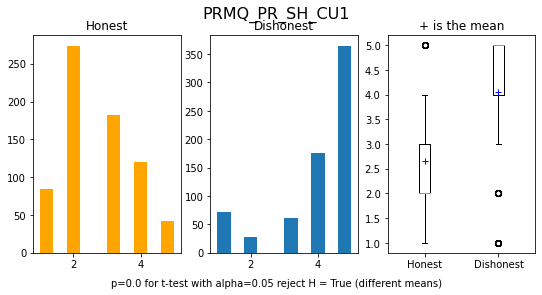

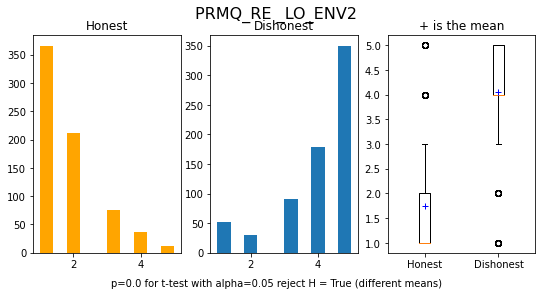

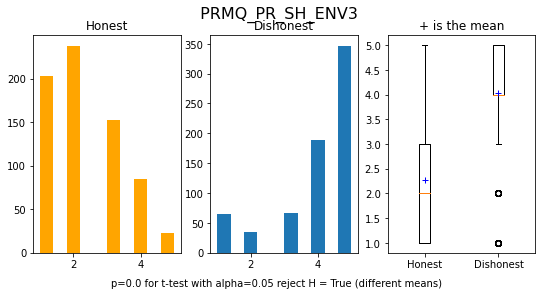

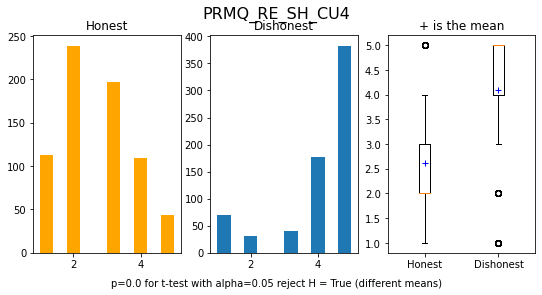

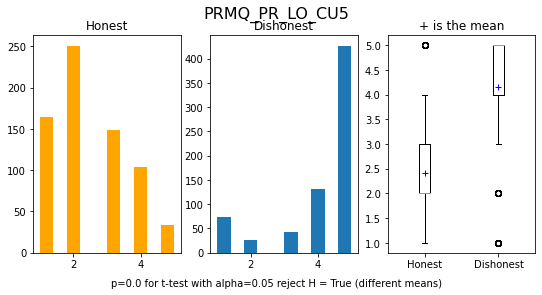

...

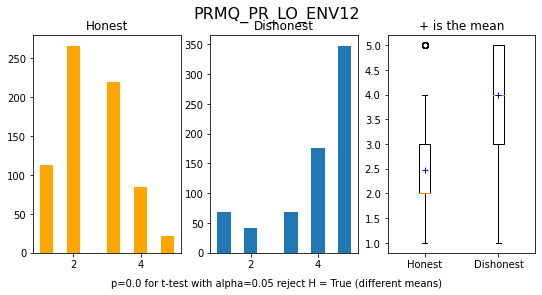

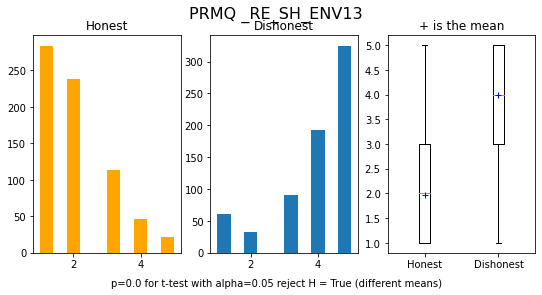

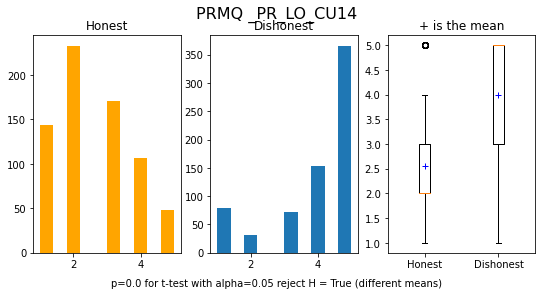

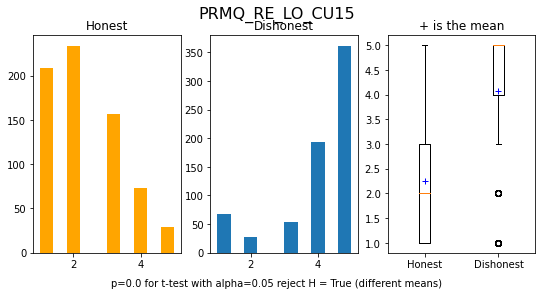

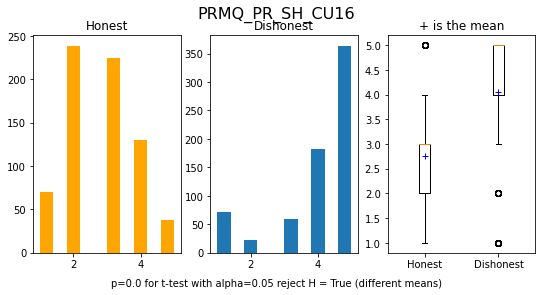

In [ ]:
plots(df3)

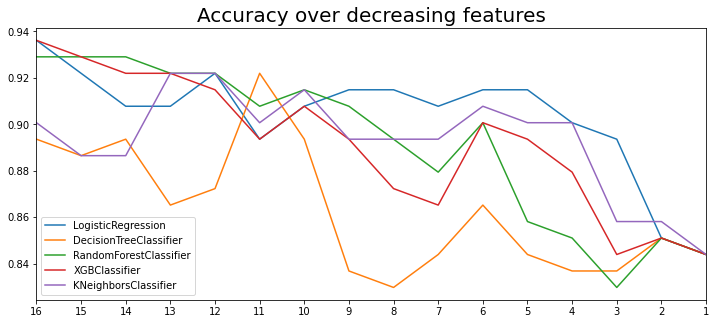

In [ ]:
plot_accuracies(df3, cumulative)

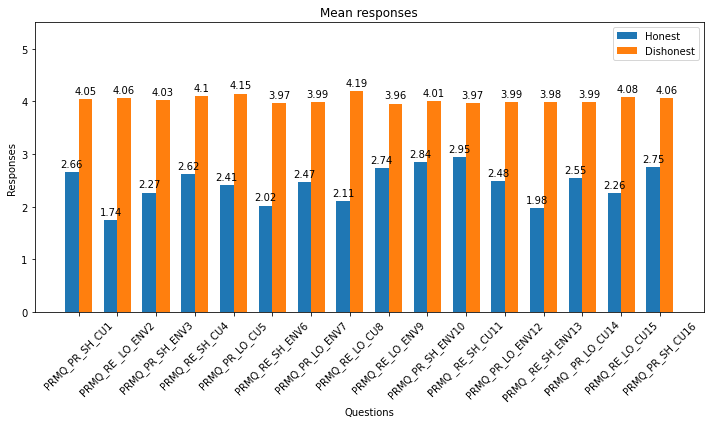

In [ ]:
n,p = df3.shape # extract dimensions

rows_honest = df3.iloc[:n//2,:-1]
rows_disonest = df3.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df3.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 3 - Moddeling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.94
There were 9 errors on 141 predictions


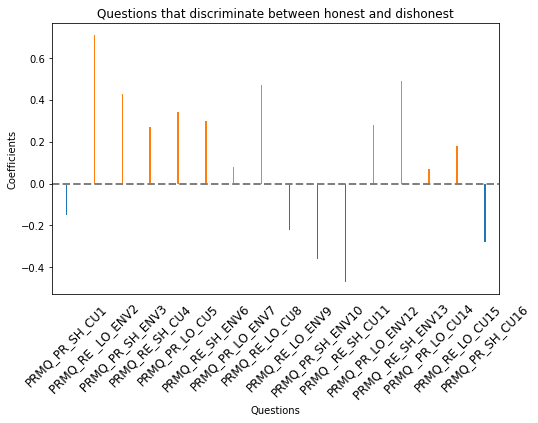

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df3.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df3.columns)[:-1],
                       rotation=45, fontsize=12)


In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df3["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df3["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,PRMQ_PR_SH_CU1,PRMQ_RE _LO_ENV2,PRMQ_PR_SH_ENV3,PRMQ_RE_SH_CU4,PRMQ_PR_LO_CU5,PRMQ_RE_SH_ENV6,PRMQ_PR_LO_ENV7,PRMQ_RE_LO_CU8,PRMQ_RE_LO_ENV9,PRMQ_PR_SH_ENV10,PRMQ _RE_SH_CU11,PRMQ_PR_LO_ENV12,PRMQ _RE_SH_ENV13,PRMQ _PR_LO_CU14,PRMQ_RE_LO_CU15,PRMQ_PR_SH_CU16,CONDITION,Prediction
649,1,4,2,2,1,3,2,2,2,1,2,2,2,1,3,3,H,D
994,4,2,3,2,2,4,3,3,1,5,2,4,3,5,4,4,D,H
973,3,2,3,3,4,2,3,2,3,3,3,3,3,3,2,3,D,H
411,3,2,4,4,3,3,4,3,4,2,3,4,4,4,4,3,H,D
578,3,4,3,2,2,4,4,5,2,2,4,2,2,4,4,3,H,D
420,5,2,5,3,5,4,5,5,4,3,4,2,5,4,3,4,H,D
1148,5,5,5,4,5,1,1,5,5,5,5,1,1,5,5,5,D,H
759,1,1,2,1,3,1,1,1,1,1,5,2,1,1,1,3,D,H
534,4,5,4,5,4,4,4,2,4,4,2,4,4,4,4,4,H,D


## PCA

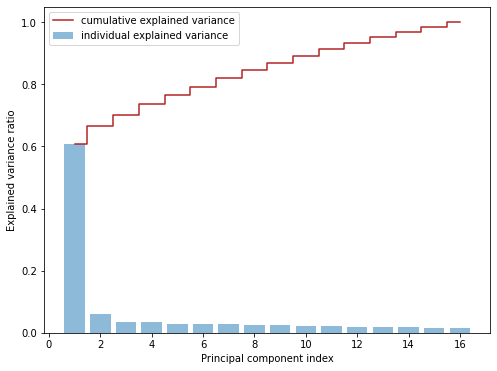

number of components based on eigenvalue higher than 1 is: 5
n = 5, tot explained variance: 0.765
      PC   exp_var    cumvar  eigenvalue
0    1.0  0.606273  0.606273   20.908366
1    2.0  0.060803  0.667076    2.096912
2    3.0  0.034733  0.701809    1.197841
3    4.0  0.033875  0.735685    1.168244
4    5.0  0.029400  0.765085    1.013907
5    6.0  0.027545  0.792630    0.949936
6    7.0  0.027168  0.819797    0.936929
7    8.0  0.025371  0.845168    0.874952
8    9.0  0.024526  0.869694    0.845808
9   10.0  0.022652  0.892345    0.781179
10  11.0  0.021354  0.913699    0.736419
11  12.0  0.020039  0.933737    0.691065
12  13.0  0.018865  0.952602    0.650576
13  14.0  0.017329  0.969931    0.597620
14  15.0  0.016106  0.986037    0.555448
15  16.0  0.013963  1.000000    0.481535


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df3, X_train, y)
print(pca_info)

Accuracy: 0.896 (0.026)


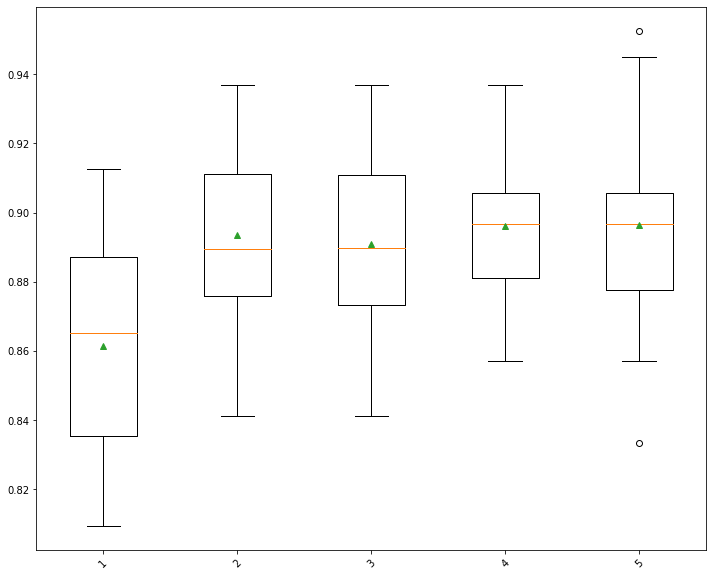

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 4, tot explained variance: 0.736
        PC0       PC1       PC2       PC3
0 -5.993898 -0.708016  0.031369 -0.070326
1 -1.809381  0.212895  0.528186 -0.238095
2  2.808584 -2.232379  0.109921 -0.115683
3  2.276164  0.325127  1.457770  0.878075
4 -1.128700 -0.628261 -1.761549 -0.839956
val score:  0.9144676579459189
best params:  {'max_depth': 10}
f1s:  0.9074575542660648
              precision    recall  f1-score   support

           0       0.90      0.94      0.92        81
           1       0.91      0.87      0.89        60

    accuracy                           0.91       141
   macro avg       0.91      0.90      0.91       141
weighted avg       0.91      0.91      0.91       141



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


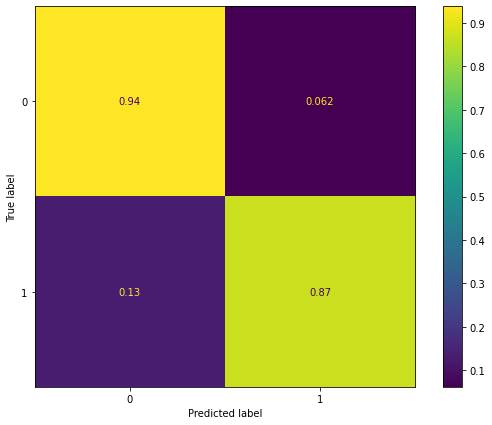

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 4)

# 4. PCL

In [ ]:
df4 = get_dataset("./datasets/3. PCL/")
# X, y = pandas_to_numpy(df4)

y = np.array([1 if c == "D" else 0 for c in df4["CONDITION"]]) # create response array
X = df4.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    201
1    201
dtype: int64


correlation of the features:
3


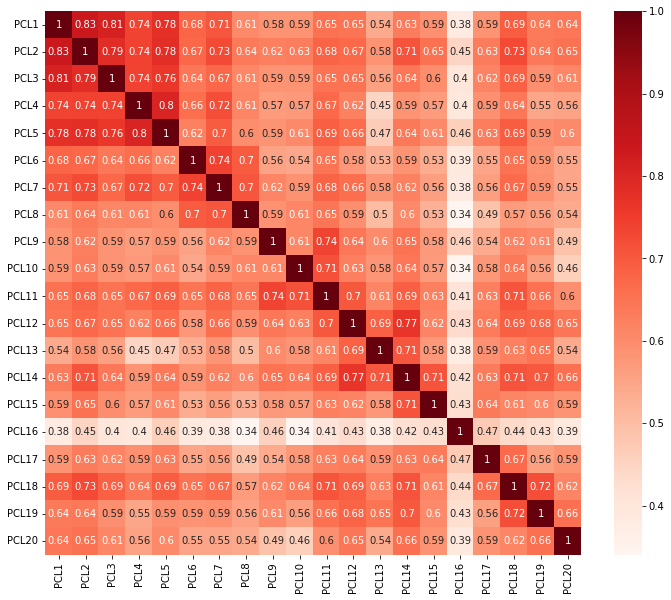

In [ ]:
correlation_matrix(df4)

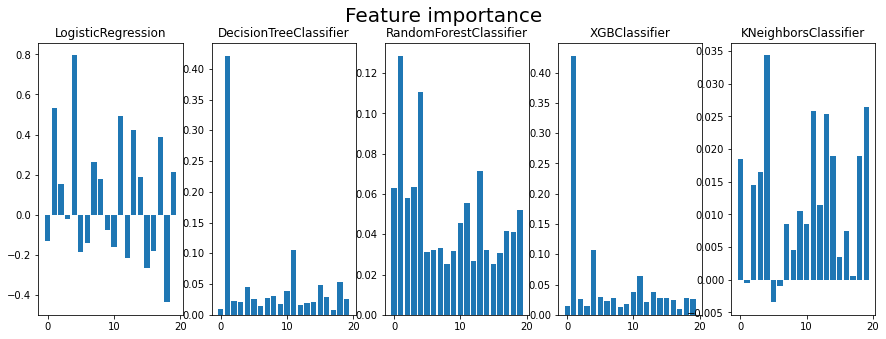

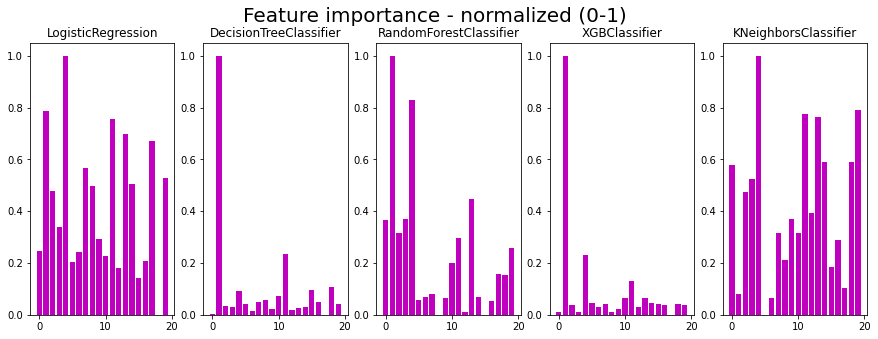

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   1 |    1 |       1 |    4 |     1 |     1 |      1 |     4 |
|   4 |    3 |      11 |    1 |    11 |     4 |      4 |    19 |
|  13 |    4 |      18 |   11 |    18 |    13 |     11 |    11 |
|  11 |    0 |       4 |   13 |    15 |     3 |     10 |    13 |
|   2 |    2 |      13 |   17 |     4 |     0 |     13 |    18 |
|   0 |   11 |       8 |    7 |    10 |     2 |      5 |    14 |
|  17 |   17 |      16 |   19 |     8 |    11 |     14 |     0 |
|   3 |   13 |       2 |   14 |    16 |    19 |      7 |     3 |
|   7 |   19 |      15 |    8 |     7 |    10 |     15 |     2 |
|   6 |   16 |       7 |    2 |    19 |    17 |     18 |    12 |
|  10 |   10 |       3 |    3 |     5 |    18 |     19 |     9 |
|  19 |   18 |       0 |    9 |     2 |     7 |      2 |     7 |
|  14 |   14 |      12 |    0 |     3 |     6 |     16 |    10 |
|   9 |    6 |      17 | 

Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=4)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=4)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   1 |    1 |       1 |    4 |     1 |     1 |      1 |     4 |
|   4 |    3 |      11 |    1 |    11 |     4 |      4 |    19 |
|  13 |    4 |      18 |   11 |    18 |    13 |     11 |    11 |
|  11 |    0 |       4 |   13 |    15 |     3 |     10 |    13 |
|   2 |    2 |      13 |   17 |     4 |     0 |     13 |    18 |
|   0 |   11 |       8 |    7 |    10 |     2 |      5 |    14 |
|  17 |   17 |      16 |   19 |     8 |    11 |     14 |     0 |
|   3 |   13 |       2 |   14 |    16 |    19 |      7 |     3 |
|   7 |   19 |      15 |    8 |     7 |    10 |     15 |     2 |
|   6 |   16 |       7 |    2 |    19 |    17 |     18 |    12 |
|  10 |   10 |       3 |    3 |     5 |    18 |     19 |     9 |
|  19 |   18 |       0 |    9 |     2 |     7 |      2 |     7 |
|  14 |   14 |      12 |    0 |     3 |     6 |     16 |    10 |
|   9 |    6 |      17 | 

Second iteration of tfidf transformation:

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=8)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   4 |    4 |       4 |    4 |     4 |     4 |      4 |     4 |
|  11 |   11 |      11 |   11 |    11 |    11 |     11 |    11 |
|   1 |    1 |       1 |    1 |     1 |     1 |      1 |    13 |
|  13 |   13 |      13 |   13 |    13 |    13 |     13 |     1 |
|   2 |    2 |       2 |    2 |     2 |     2 |      2 |     2 |
|   3 |    3 |       3 |   19 |    18 |     3 |     10 |    19 |
|   7 |   19 |      18 |    3 |    10 |    19 |      7 |     3 |
|  19 |    0 |       7 |    7 |    19 |    10 |     19 |    18 |
|   0 |   10 |       0 |   14 |     7 |     0 |     18 |     0 |
|  10 |   18 |       8 |   17 |     3 |    18 |     14 |     7 |
|  17 |   17 |      16 |   10 |     8 |     7 |      3 |    14 |
|  14 |   14 |      10 |    0 |    16 |    14 |     16 |    10 |
|   8 |   16 |      17 |    8 |    14 |    17 |      5 |     9 |
|   6 |    8 |      15 | 

In [ ]:
cumulative = ensemble(ranks, df4)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| PCL5      |    4 | ***            |
| PCL2      |    1 | ***            |
| PCL12     |   11 | ***            |
| PCL14     |   13 | ***            |
| PCL3      |    2 | ***            |
| PCL4      |    3 | ***            |
| PCL20     |   19 | ***            |
| PCL19     |   18 | ***            |
| PCL1      |    0 | ***            |
| PCL8      |    7 | ***            |
| PCL11     |   10 | ***            |
| PCL15     |   14 | ***            |
| PCL18     |   17 | ***            |
| PCL17     |   16 | ***            |
| PCL9      |    8 | ***            |
| PCL7      |    6 | ***            |
| PCL16     |   15 | ***            |
| PCL10     |    9 | ***            |
| PCL6      |    5 | ***            |
| PCL13     |   12 | ***            |


In [ ]:
ensemble_increasingwindow(ranks, df4)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| PCL2      |    1 | ***            |
| PCL5      |    4 | ***            |
| PCL12     |   11 | ***            |
| PCL14     |   13 | ***            |
| PCL19     |   18 | ***            |
| PCL4      |    3 | ***            |
| PCL1      |    0 | ***            |
| PCL3      |    2 | ***            |
| PCL20     |   19 | ***            |
| PCL18     |   17 | ***            |
| PCL11     |   10 | ***            |
| PCL8      |    7 | ***            |
| PCL15     |   14 | ***            |
| PCL17     |   16 | ***            |
| PCL9      |    8 | ***            |
| PCL16     |   15 | ***            |
| PCL7      |    6 | ***            |
| PCL10     |    9 | ***            |
| PCL6      |    5 | ***            |
| PCL13     |   12 | ***            |


In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df4)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| PCL5      |    4 | ***            |
| PCL12     |   11 | ***            |
| PCL2      |    1 | ***            |
| PCL14     |   13 | ***            |
| PCL3      |    2 | ***            |
| PCL4      |    3 | ***            |
| PCL20     |   19 | ***            |
| PCL8      |    7 | ***            |
| PCL11     |   10 | ***            |
| PCL19     |   18 | ***            |
| PCL1      |    0 | ***            |
| PCL15     |   14 | ***            |
| PCL18     |   17 | ***            |
| PCL17     |   16 | ***            |
| PCL9      |    8 | ***            |
| PCL7      |    6 | ***            |
| PCL10     |    9 | ***            |
| PCL6      |    5 | ***            |
| PCL13     |   12 | ***            |
| PCL16     |   15 | ***            |


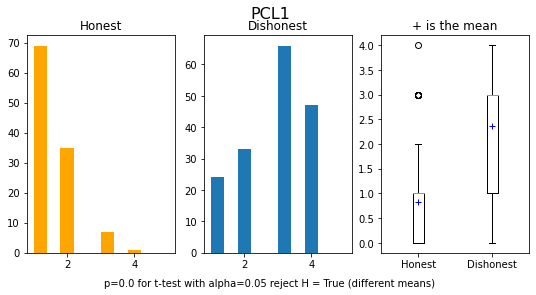

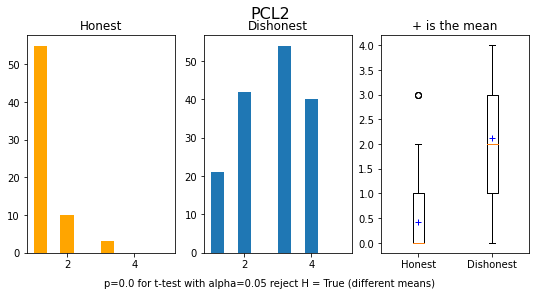

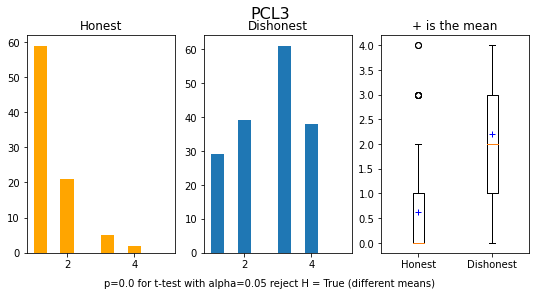

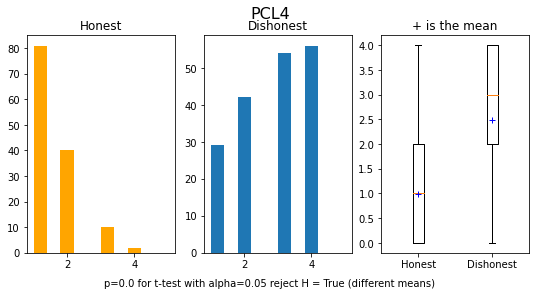

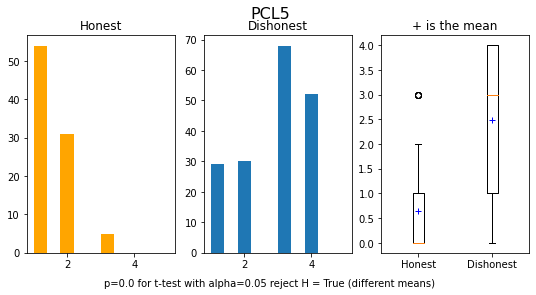

...

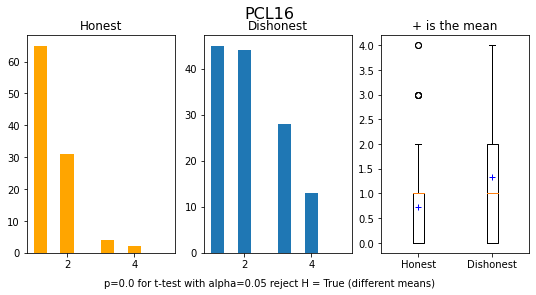

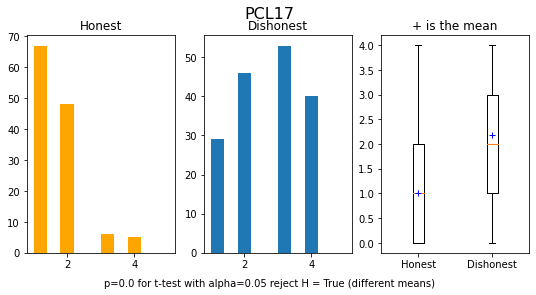

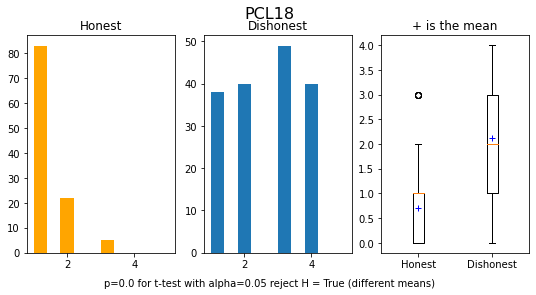

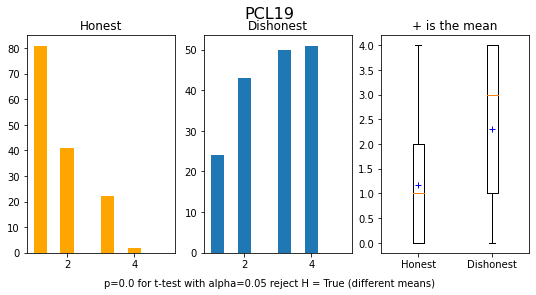

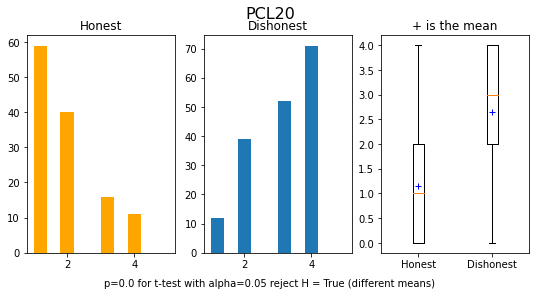

In [ ]:
plots(df4)

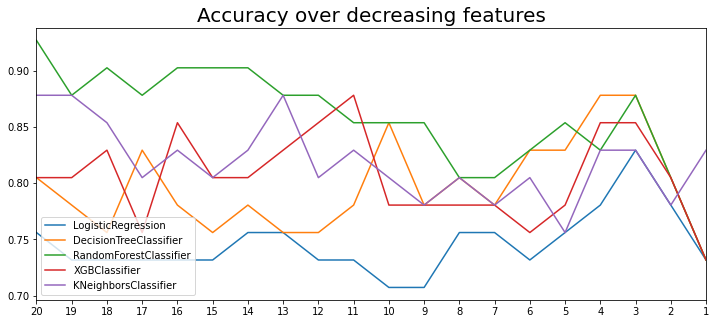

In [ ]:
plot_accuracies(df4, cumulative)

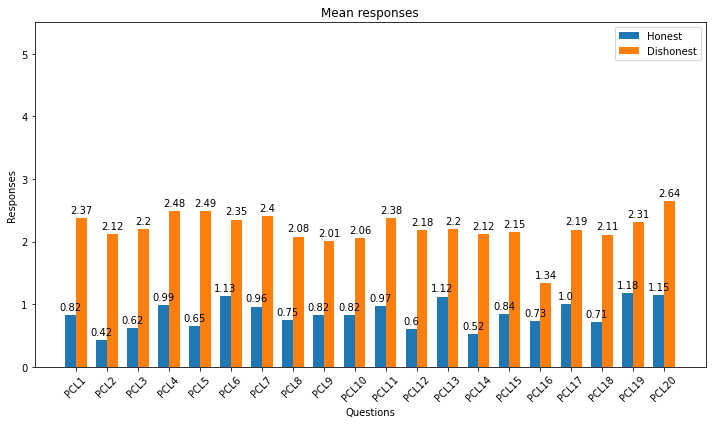

In [ ]:
n,p = df4.shape # extract dimensions

rows_honest = df4.iloc[:n//2,:-1]
rows_disonest = df4.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df4.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 3 - Modelling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.76
There were 10 errors on 41 predictions


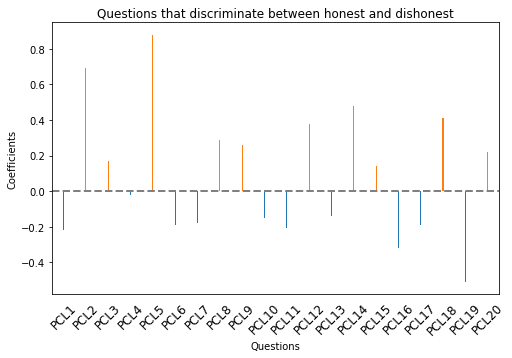

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df4.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df4.columns)[:-1],
                       rotation=45, fontsize=12)


In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df4["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df4["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,PCL1,PCL2,PCL3,PCL4,PCL5,PCL6,PCL7,PCL8,PCL9,PCL10,...,PCL13,PCL14,PCL15,PCL16,PCL17,PCL18,PCL19,PCL20,CONDITION,Prediction
56,0,1,0,1,2,1,1,0,0,0,...,0,2,2,3,2,0,1,3,H,D
72,0,1,1,2,2,1,1,1,1,2,...,1,0,1,1,2,1,0,0,H,D
77,2,3,2,1,2,2,2,0,2,0,...,2,0,1,0,1,1,0,1,H,D
393,1,1,1,1,0,1,1,1,1,1,...,1,1,1,1,2,1,2,2,D,H
0,1,1,3,2,2,0,1,0,1,2,...,2,0,0,1,2,1,0,1,H,D
114,0,1,1,1,1,1,1,1,1,0,...,1,2,1,1,2,1,3,2,H,D
322,0,0,1,2,2,1,1,0,3,1,...,0,0,1,4,1,0,1,0,D,H
104,1,2,1,2,2,2,2,2,1,1,...,0,0,1,1,1,3,1,1,H,D
397,0,0,0,0,1,1,1,1,1,1,...,3,1,2,0,2,2,2,2,D,H
141,0,1,0,1,0,0,1,2,4,0,...,2,3,3,1,2,0,1,2,H,D


## PCA

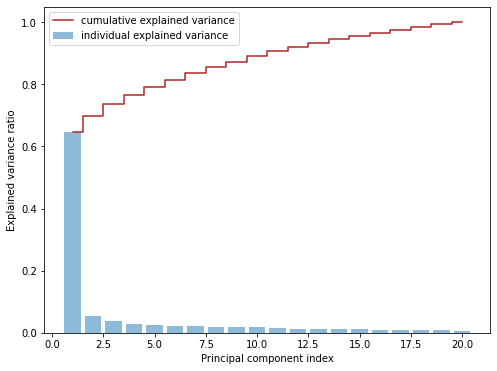

number of components based on eigenvalue higher than 1 is: 4
n = 4, tot explained variance: 0.766
      PC   exp_var    cumvar  eigenvalue
0    1.0  0.644970  0.644970   24.210830
1    2.0  0.052853  0.697823    1.984000
2    3.0  0.038501  0.736324    1.445244
3    4.0  0.029821  0.766145    1.119402
4    5.0  0.024342  0.790487    0.913759
5    6.0  0.022777  0.813264    0.855008
6    7.0  0.022026  0.835291    0.826811
7    8.0  0.019405  0.854695    0.728409
8    9.0  0.018504  0.873200    0.694618
9   10.0  0.017332  0.890532    0.650617
10  11.0  0.016050  0.906582    0.602486
11  12.0  0.013493  0.920075    0.506492
12  13.0  0.012630  0.932705    0.474121
13  14.0  0.011872  0.944578    0.445664
14  15.0  0.011109  0.955686    0.417006
15  16.0  0.010408  0.966095    0.390710
16  17.0  0.009548  0.975643    0.358407
17  18.0  0.008872  0.984514    0.333025
18  19.0  0.008654  0.993169    0.324867
19  20.0  0.006831  1.000000    0.256429


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df4, X_train, y)
print(pca_info)

Accuracy: 0.799 (0.047)


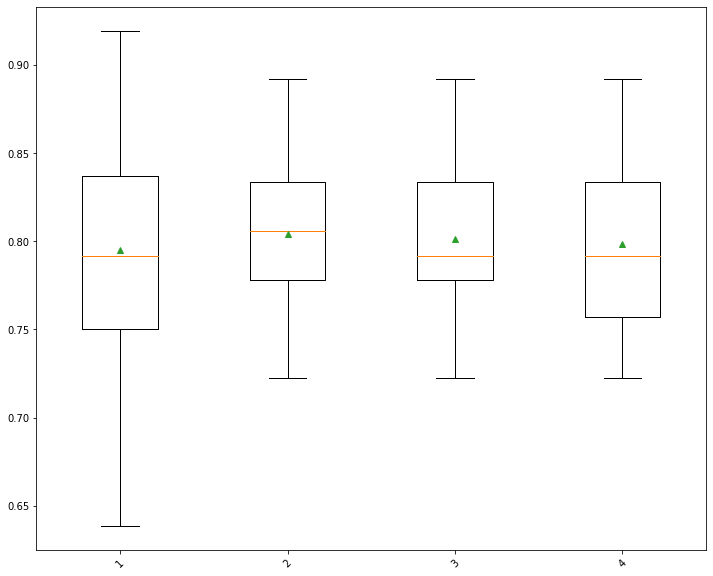

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 2, tot explained variance: 0.698
         PC0       PC1
0  -3.120186  0.775222
1  -2.332692 -0.690990
2  -2.583407 -1.920199
3  -3.250156 -1.609689
4  10.702580  0.050054
val score:  0.8311643835616438
best params:  {'max_depth': 10}
f1s:  0.9012607517379521
              precision    recall  f1-score   support

           0       0.84      1.00      0.91        21
           1       1.00      0.80      0.89        20

    accuracy                           0.90        41
   macro avg       0.92      0.90      0.90        41
weighted avg       0.92      0.90      0.90        41



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


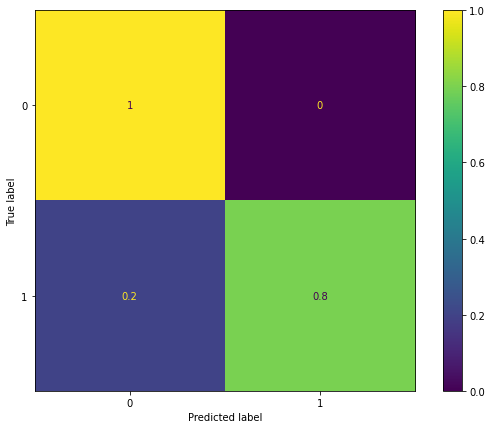

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 2)

# 5. NAQ_R

In [ ]:
df5 = get_dataset("./datasets/4. NAQ_R/")
# X, y = pandas_to_numpy(df5)

y = np.array([1 if c == "D" else 0 for c in df5["CONDITION"]]) # create response array
X = df5.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    532
1    356
dtype: int64


correlation of the features:
11


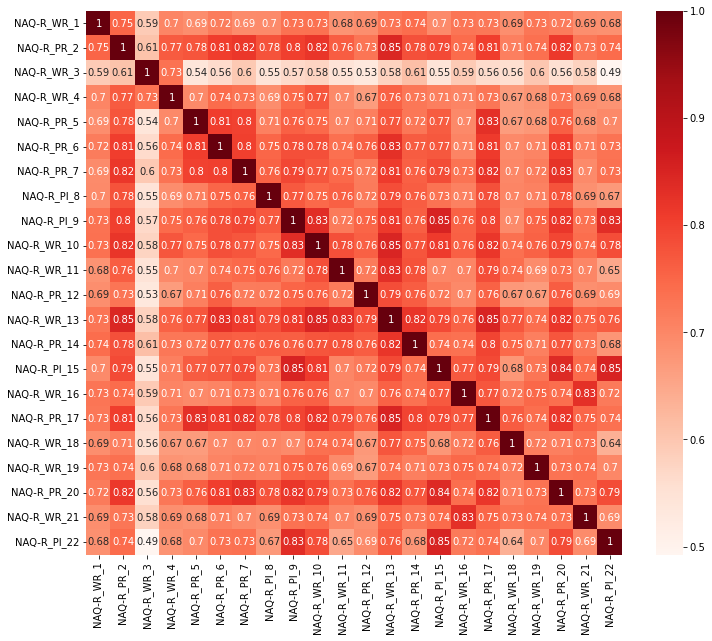

In [ ]:
correlation_matrix(df5)

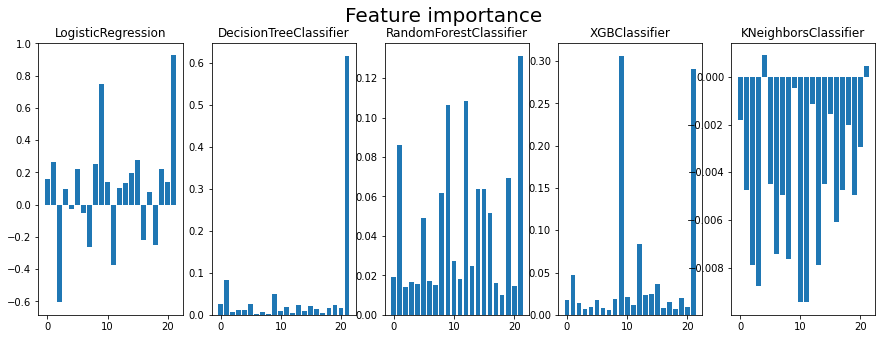

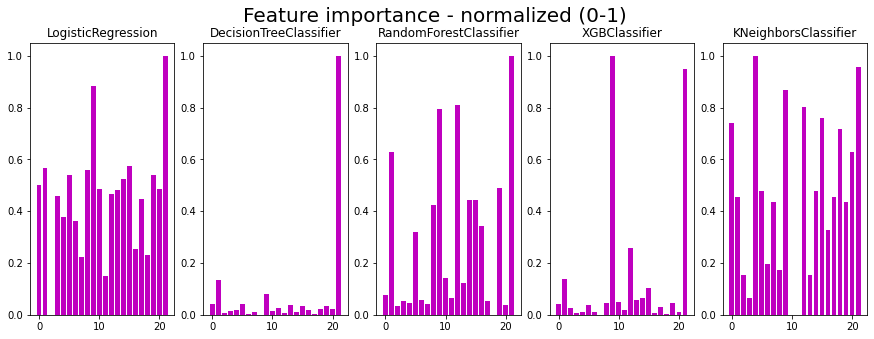

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   9 |    9 |       9 |   21 |    21 |    21 |      9 |     4 |
|  21 |   21 |      21 |    9 |     1 |    12 |     21 |    21 |
|  14 |   12 |      15 |   15 |     9 |     9 |     12 |     9 |
|   8 |    8 |       0 |    1 |     5 |     1 |      1 |    12 |
|  12 |    1 |       2 |    8 |     0 |    19 |     15 |    15 |
|   1 |   14 |       1 |   19 |    13 |    14 |     14 |     0 |
|  19 |   16 |      14 |    5 |    19 |    15 |     13 |    18 |
|   5 |   19 |      19 |   14 |    15 |     8 |     10 |    20 |
|   6 |    5 |       3 |    0 |    11 |    16 |     19 |     5 |
|  16 |   15 |      17 |   10 |    18 |     5 |      8 |    14 |
|  18 |    6 |      10 |   20 |    20 |    10 |      0 |     1 |
|  15 |   10 |       6 |   13 |    16 |    13 |      5 |    17 |
|  20 |   11 |      20 |   12 |     4 |     0 |     17 |    19 |
|   3 |    0 |      18 | 

Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=21)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=21)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   9 |    9 |       9 |   21 |    21 |    21 |      9 |     4 |
|  21 |   21 |      21 |    9 |     1 |    12 |     21 |    21 |
|  14 |   12 |      15 |   15 |     9 |     9 |     12 |     9 |
|   8 |    8 |       0 |    1 |     5 |     1 |      1 |    12 |
|  12 |    1 |       2 |    8 |     0 |    19 |     15 |    15 |
|   1 |   14 |       1 |   19 |    13 |    14 |     14 |     0 |
|  19 |   16 |      14 |    5 |    19 |    15 |     13 |    18 |
|   5 |   19 |      19 |   14 |    15 |     8 |     10 |    20 |
|   6 |    5 |       3 |    0 |    11 |    16 |     19 |     5 |
|  16 |   15 |      17 |   10 |    18 |     5 |      8 |    14 |
|  18 |    6 |      10 |   20 |    20 |    10 |      0 |     1 |
|  15 |   10 |       6 |   13 |    16 |    13 |      5 |    17 |
|  20 |   11 |      20 |   12 |     4 |     0 |     17 |    19 |
|   3 |    0 |      18 | 

Second iteration of tfidf transformation:

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=8)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|  21 |   21 |      21 |   21 |    21 |    21 |     21 |    21 |
|   9 |    9 |       9 |    9 |     9 |     9 |      9 |     9 |
|   1 |    1 |       1 |    1 |     1 |     1 |      1 |     1 |
|  15 |   15 |      15 |   15 |    15 |    15 |     15 |    15 |
|  14 |   14 |      14 |   14 |    19 |    14 |     14 |    14 |
|  19 |   19 |      19 |   19 |    14 |    19 |     19 |    19 |
|  12 |   12 |       0 |    5 |     5 |    12 |     12 |    12 |
|   5 |    5 |      10 |   12 |     0 |     5 |      5 |     5 |
|   8 |    0 |       5 |    0 |    12 |     0 |      0 |     0 |
|  16 |    8 |      12 |    8 |    20 |     8 |      8 |    20 |
|  20 |   16 |      20 |   10 |    13 |    16 |     10 |     4 |
|   6 |   10 |      17 |   20 |    16 |    10 |     20 |    16 |
|  10 |   20 |       3 |   13 |    10 |    13 |     13 |     8 |
|   0 |    6 |      16 | 

In [ ]:
cumulative = ensemble(ranks, df5)

| Feature     |   _n | Significance   |
|-------------+------+----------------|
| NAQ-R_PI_22 |   21 | ***            |
| NAQ-R_WR_10 |    9 | ***            |
| NAQ-R_PR_2  |    1 | ***            |
| NAQ-R_WR_16 |   15 | ***            |
| NAQ-R_PI_15 |   14 | ***            |
| NAQ-R_PR_20 |   19 | ***            |
| NAQ-R_WR_13 |   12 | ***            |
| NAQ-R_PR_6  |    5 | ***            |
| ﻿NAQ-R_WR_1 |    0 | ***            |
| NAQ-R_PI_9  |    8 | ***            |
| NAQ-R_PR_17 |   16 | ***            |
| NAQ-R_WR_11 |   10 | ***            |
| NAQ-R_WR_21 |   20 | ***            |
| NAQ-R_PR_14 |   13 | ***            |
| NAQ-R_PR_5  |    4 | ***            |
| NAQ-R_PR_7  |    6 | ***            |
| NAQ-R_WR_18 |   17 | ***            |
| NAQ-R_WR_19 |   18 | ***            |
| NAQ-R_WR_4  |    3 | ***            |
| NAQ-R_PR_12 |   11 | ***            |
| NAQ-R_WR_3  |    2 | ***            |
| NAQ-R_PI_8  |    7 | ***            |


In [ ]:
ensemble_increasingwindow(ranks, df5)

| Feature     |   _n | Significance   |
|-------------+------+----------------|
| NAQ-R_WR_10 |    9 | ***            |
| NAQ-R_PI_22 |   21 | ***            |
| NAQ-R_WR_13 |   12 | ***            |
| NAQ-R_PR_2  |    1 | ***            |
| NAQ-R_WR_16 |   15 | ***            |
| NAQ-R_PI_9  |    8 | ***            |
| NAQ-R_PI_15 |   14 | ***            |
| NAQ-R_PR_20 |   19 | ***            |
| ﻿NAQ-R_WR_1 |    0 | ***            |
| NAQ-R_PR_6  |    5 | ***            |
| NAQ-R_PR_14 |   13 | ***            |
| NAQ-R_PR_17 |   16 | ***            |
| NAQ-R_WR_11 |   10 | ***            |
| NAQ-R_WR_21 |   20 | ***            |
| NAQ-R_WR_19 |   18 | ***            |
| NAQ-R_PR_5  |    4 | ***            |
| NAQ-R_PR_7  |    6 | ***            |
| NAQ-R_WR_18 |   17 | ***            |
| NAQ-R_WR_4  |    3 | ***            |
| NAQ-R_PR_12 |   11 | ***            |
| NAQ-R_WR_3  |    2 | ***            |
| NAQ-R_PI_8  |    7 | ***            |


In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df5)

| Feature     |   _n | Significance   |
|-------------+------+----------------|
| NAQ-R_PI_22 |   21 | ***            |
| NAQ-R_WR_10 |    9 | ***            |
| NAQ-R_PR_2  |    1 | ***            |
| NAQ-R_WR_16 |   15 | ***            |
| NAQ-R_PI_15 |   14 | ***            |
| NAQ-R_PR_20 |   19 | ***            |
| NAQ-R_WR_13 |   12 | ***            |
| NAQ-R_PR_6  |    5 | ***            |
| ﻿NAQ-R_WR_1 |    0 | ***            |
| NAQ-R_PI_9  |    8 | ***            |
| NAQ-R_WR_21 |   20 | ***            |
| NAQ-R_WR_11 |   10 | ***            |
| NAQ-R_PR_17 |   16 | ***            |
| NAQ-R_PR_14 |   13 | ***            |
| NAQ-R_PR_5  |    4 | ***            |
| NAQ-R_WR_18 |   17 | ***            |
| NAQ-R_PR_7  |    6 | ***            |
| NAQ-R_WR_4  |    3 | ***            |
| NAQ-R_WR_19 |   18 | ***            |
| NAQ-R_PR_12 |   11 | ***            |
| NAQ-R_WR_3  |    2 | ***            |
| NAQ-R_PI_8  |    7 | ***            |


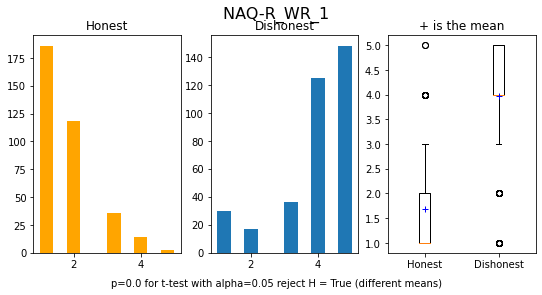

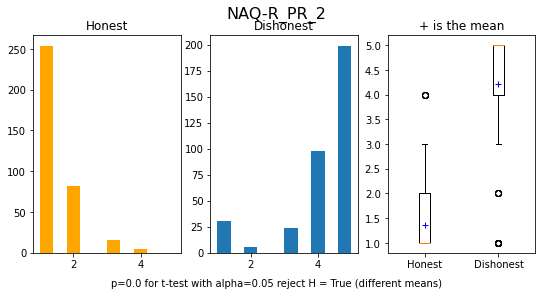

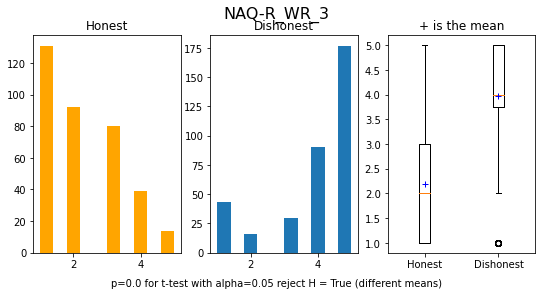

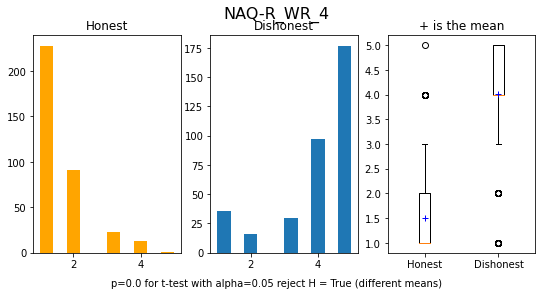

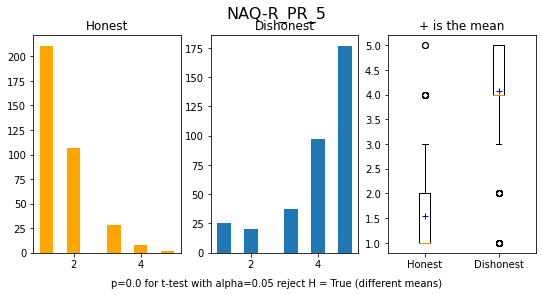

...

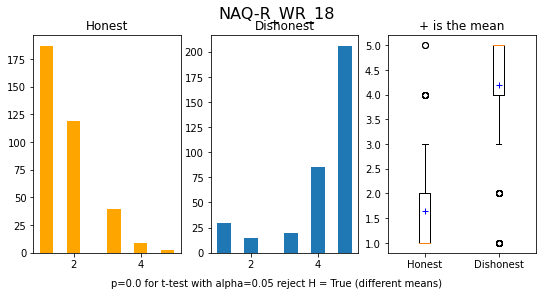

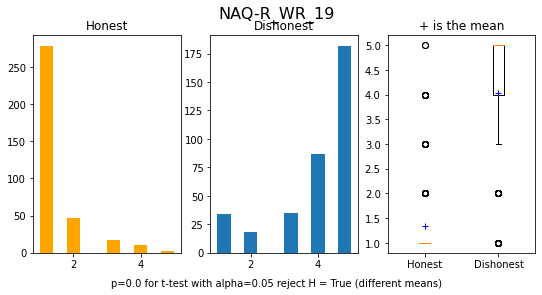

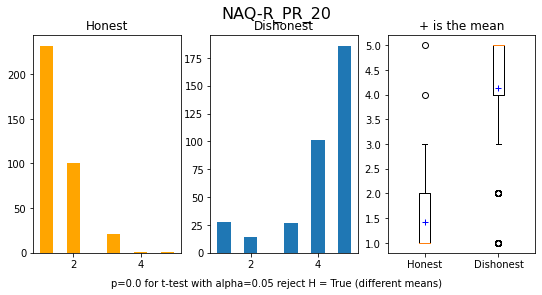

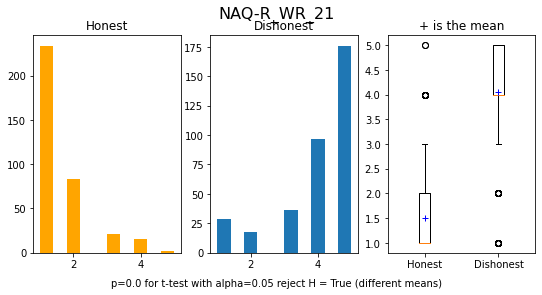

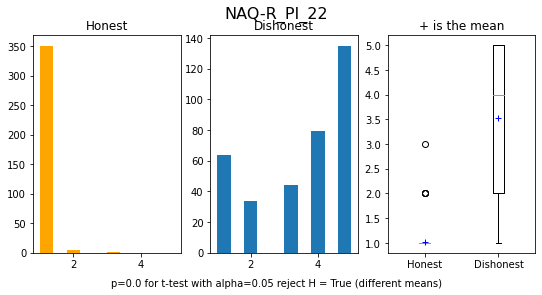

In [ ]:
plots(df5)

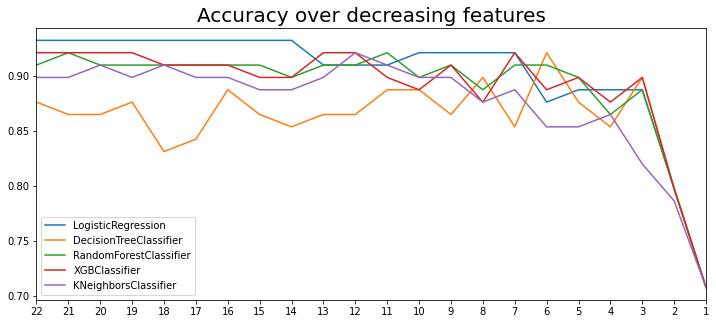

In [ ]:
plot_accuracies(df5, cumulative)

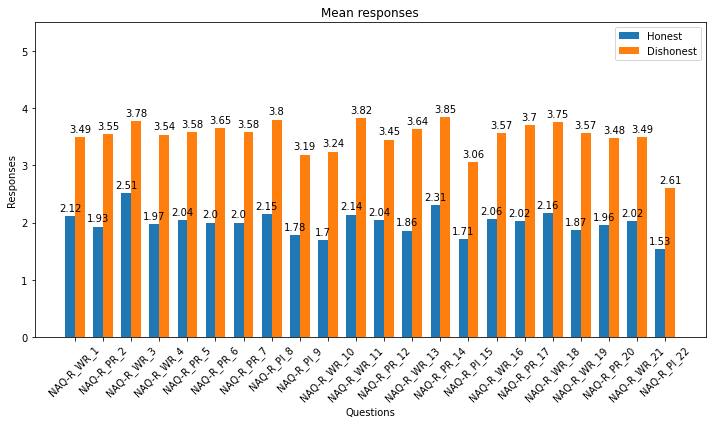

In [ ]:
n,p = df5.shape # extract dimensions

rows_honest = df5.iloc[:n//2,:-1]
rows_disonest = df5.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df5.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 3 - Modelling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.84
There were 14 errors on 89 predictions


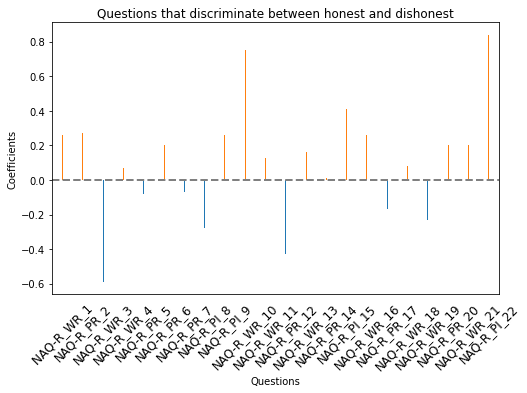

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df5.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df5.columns)[:-1],
                       rotation=45, fontsize=12)


In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df5["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df1["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,﻿NAQ-R_WR_1,NAQ-R_PR_2,NAQ-R_WR_3,NAQ-R_WR_4,NAQ-R_PR_5,NAQ-R_PR_6,NAQ-R_PR_7,NAQ-R_PI_8,NAQ-R_PI_9,NAQ-R_WR_10,...,NAQ-R_PI_15,NAQ-R_WR_16,NAQ-R_PR_17,NAQ-R_WR_18,NAQ-R_WR_19,NAQ-R_PR_20,NAQ-R_WR_21,NAQ-R_PI_22,CONDITION,Prediction
434,4,5,5,3,4,4,4,5,1,4,...,1,4,5,4,1,5,4,1,D,H
834,4,4,3,3,4,2,2,5,2,3,...,4,4,3,2,4,4,2,3,P,NaN
530,1,1,1,1,3,2,2,2,1,1,...,2,1,2,1,1,1,1,1,D,NaN
601,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,D,NaN
618,2,4,4,4,4,4,5,5,4,4,...,1,4,5,5,4,3,2,1,D,NaN
447,4,5,4,5,4,4,5,5,1,3,...,1,4,3,4,5,4,4,1,D,H
583,1,1,1,1,1,1,1,2,1,1,...,1,2,1,2,2,1,1,1,D,NaN
446,2,1,1,1,2,1,1,1,1,1,...,1,2,1,1,1,1,2,1,D,H
481,5,4,5,4,4,5,4,4,2,3,...,2,4,4,5,3,4,2,1,D,H
368,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,D,H


## PCA

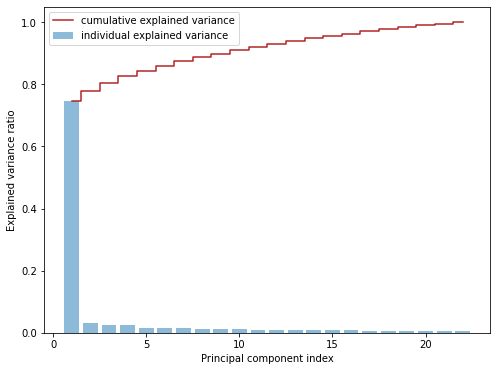

number of components based on eigenvalue higher than 1 is: 4
n = 4, tot explained variance: 0.828
      PC   exp_var    cumvar  eigenvalue
0    1.0  0.747565  0.747565   40.894088
1    2.0  0.031555  0.779120    1.726170
2    3.0  0.024682  0.803802    1.350160
3    4.0  0.023987  0.827788    1.312142
4    5.0  0.016544  0.844332    0.905021
5    6.0  0.015497  0.859829    0.847728
6    7.0  0.013994  0.873824    0.765535
7    8.0  0.012843  0.886667    0.702550
8    9.0  0.012145  0.898812    0.664381
9   10.0  0.011919  0.910731    0.652022
10  11.0  0.010183  0.920914    0.557050
11  12.0  0.009919  0.930834    0.542618
12  13.0  0.008779  0.939613    0.480259
13  14.0  0.008274  0.947887    0.452619
14  15.0  0.007769  0.955657    0.425009
15  16.0  0.007445  0.963101    0.407242
16  17.0  0.007012  0.970114    0.383604
17  18.0  0.006960  0.977074    0.380749
18  19.0  0.006820  0.983894    0.373061
19  20.0  0.005893  0.989787    0.322371
20  21.0  0.005188  0.994975    0.283806


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df5, X_train, y)
print(pca_info)

Accuracy: 0.918 (0.030)


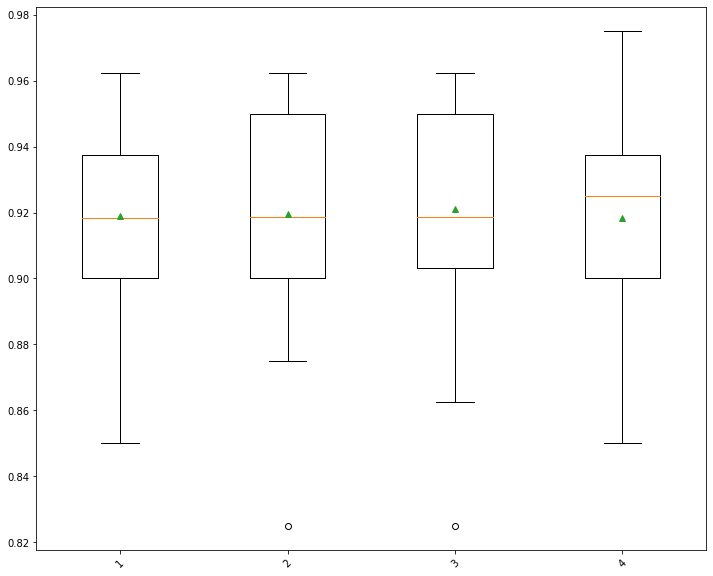

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 4, tot explained variance: 0.828
         PC0       PC1       PC2       PC3
0  -6.893060 -0.656851 -0.991458 -0.106156
1   2.371473 -0.827296 -0.466923  3.365370
2  10.467791  0.056953 -0.163597 -0.729503
3  -6.366085  0.498284 -1.706649 -0.804658
4   3.455208 -1.119912 -1.543184 -1.498280
val score:  0.9161399371069183
best params:  {'max_depth': 10}
f1s:  0.840540607135817
              precision    recall  f1-score   support

           0       0.85      0.91      0.88        55
           1       0.83      0.74      0.78        34

    accuracy                           0.84        89
   macro avg       0.84      0.82      0.83        89
weighted avg       0.84      0.84      0.84        89



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


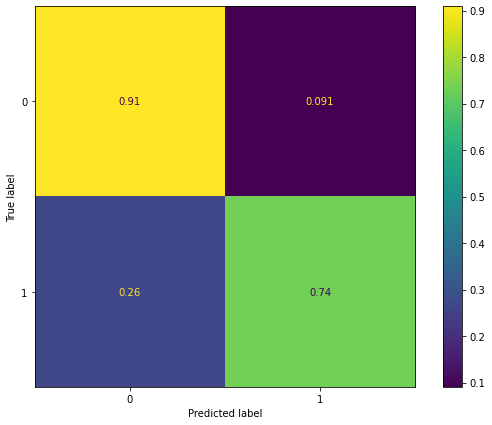

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 4)

# 6. NAQ_R2

In [ ]:
df6 = get_dataset("./datasets/4. NAQ_R2/")
#X, y = pandas_to_numpy(df6)

y = np.array([1 if c == "D" else 0 for c in df6["CONDITION"]]) # create response array
X = df6.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    356
1    356
dtype: int64


correlation of the features:
20


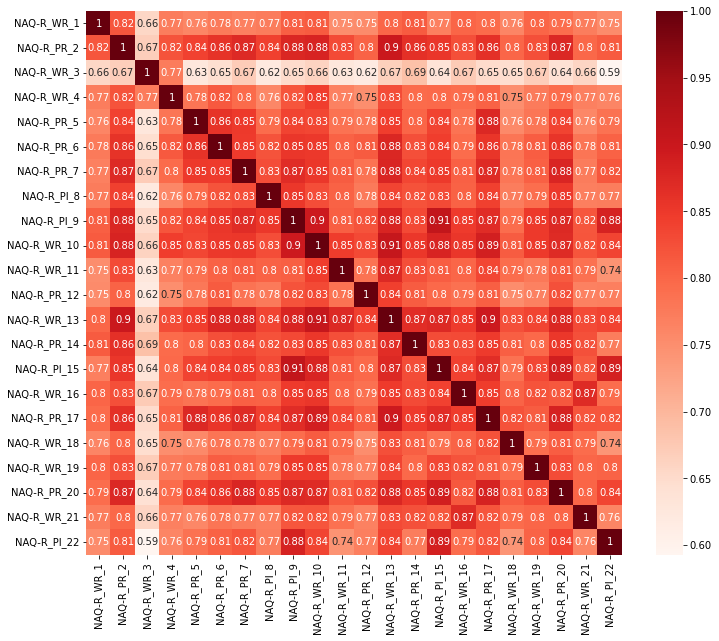

In [ ]:
correlation_matrix(df6)

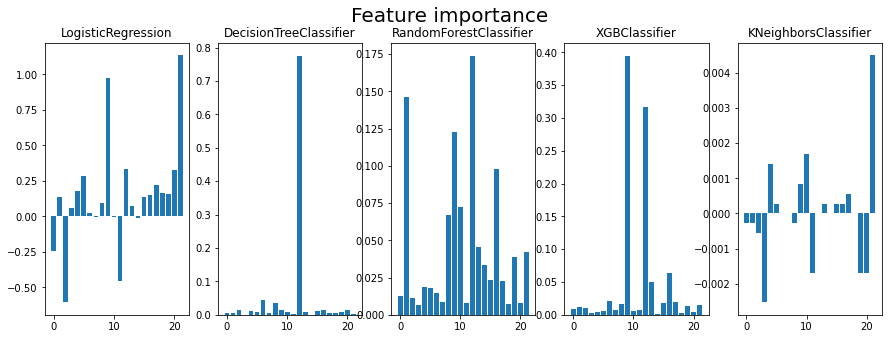

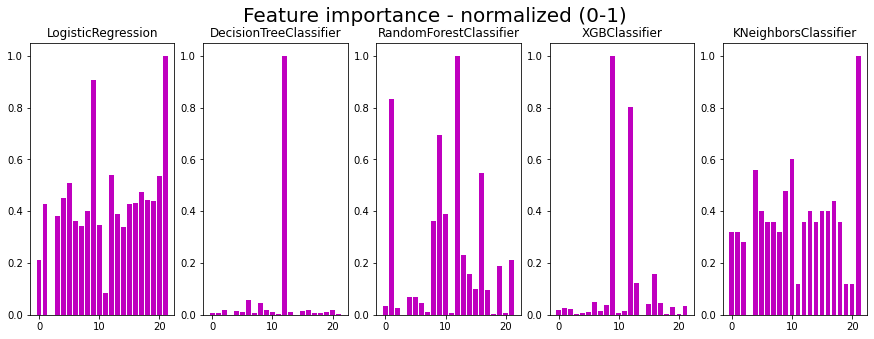

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   9 |   12 |      12 |   21 |    12 |    12 |      9 |    21 |
|  12 |   16 |       6 |    9 |     6 |     1 |     12 |    10 |
|   1 |    8 |       8 |   12 |     8 |     9 |     16 |     4 |
|  14 |    9 |       9 |   20 |    16 |    16 |     13 |     9 |
|   8 |    1 |      16 |    5 |     9 |    10 |      6 |    17 |
|  21 |   19 |      17 |   17 |    20 |     8 |     17 |     5 |
|   5 |   10 |       2 |    4 |     2 |    13 |     15 |    13 |
|  18 |   13 |      15 |   18 |     4 |    21 |      8 |    15 |
|  19 |    6 |      19 |   19 |    15 |    19 |     21 |    16 |
|  16 |   21 |      18 |   16 |    10 |    14 |     19 |    14 |
|   6 |    5 |      14 |    1 |     5 |    15 |      1 |    18 |
|  20 |   14 |      13 |   15 |    19 |    17 |      2 |     6 |
|  15 |   17 |       5 |    8 |    13 |     4 |      0 |     7 |
|   3 |   15 |       7 | 

Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=12)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=12)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   9 |   12 |      12 |   21 |    12 |    12 |      9 |    21 |
|  12 |   16 |       6 |    9 |     6 |     1 |     12 |    10 |
|   1 |    8 |       8 |   12 |     8 |     9 |     16 |     4 |
|  14 |    9 |       9 |   20 |    16 |    16 |     13 |     9 |
|   8 |    1 |      16 |    5 |     9 |    10 |      6 |    17 |
|  21 |   19 |      17 |   17 |    20 |     8 |     17 |     5 |
|   5 |   10 |       2 |    4 |     2 |    13 |     15 |    13 |
|  18 |   13 |      15 |   18 |     4 |    21 |      8 |    15 |
|  19 |    6 |      19 |   19 |    15 |    19 |     21 |    16 |
|  16 |   21 |      18 |   16 |    10 |    14 |     19 |    14 |
|   6 |    5 |      14 |    1 |     5 |    15 |      1 |    18 |
|  20 |   14 |      13 |   15 |    19 |    17 |      2 |     6 |
|  15 |   17 |       5 |    8 |    13 |     4 |      0 |     7 |
|   3 |   15 |       7 | 

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=12)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   9 |   12 |      12 |    9 |    12 |    12 |      9 |     9 |
|  12 |    9 |       9 |   12 |     9 |     9 |     12 |    12 |
|  16 |   16 |      16 |   16 |    16 |    16 |     16 |    16 |
|   8 |    8 |       8 |    8 |     8 |     8 |      8 |     8 |
|  21 |    6 |       6 |   21 |     6 |    21 |      6 |    21 |
|   6 |   21 |      17 |    5 |    15 |     1 |     21 |    17 |
|   5 |    1 |      15 |   17 |     5 |     6 |     17 |     5 |
|   1 |   19 |       5 |   19 |     4 |    13 |     13 |     6 |
|  19 |    5 |      19 |   15 |    19 |    19 |     15 |    15 |
|  15 |   13 |      13 |    1 |    10 |    15 |     19 |    10 |
|  17 |   17 |      21 |    4 |    13 |    17 |      5 |    13 |
|   4 |   15 |       4 |    6 |    17 |    10 |      1 |     4 |
|  14 |   10 |      18 |   13 |     1 |     5 |     10 |     1 |
|  18 |    4 |      14 | 

In [ ]:
cumulative = ensemble(ranks, df6)

| Feature     |   _n | Significance   |
|-------------+------+----------------|
| NAQ-R_WR_10 |    9 | ***            |
| NAQ-R_WR_13 |   12 | ***            |
| NAQ-R_PR_17 |   16 | ***            |
| NAQ-R_PI_9  |    8 | ***            |
| NAQ-R_PR_7  |    6 | ***            |
| NAQ-R_PI_22 |   21 | ***            |
| NAQ-R_WR_18 |   17 | ***            |
| NAQ-R_WR_16 |   15 | ***            |
| NAQ-R_PR_6  |    5 | ***            |
| NAQ-R_PR_2  |    1 | ***            |
| NAQ-R_PR_20 |   19 | ***            |
| NAQ-R_PR_14 |   13 | ***            |
| NAQ-R_WR_11 |   10 | ***            |
| NAQ-R_PR_5  |    4 | ***            |
| NAQ-R_PI_15 |   14 | ***            |
| NAQ-R_WR_19 |   18 | ***            |
| NAQ-R_WR_21 |   20 | ***            |
| NAQ-R_WR_3  |    2 | ***            |
| NAQ-R_PI_8  |    7 | ***            |
| NAQ-R_WR_4  |    3 | ***            |
| NAQ-R_WR_1  |    0 | ***            |
| NAQ-R_PR_12 |   11 | ***            |


In [ ]:
ensemble_increasingwindow(ranks, df6)

| Feature     |   _n | Significance   |
|-------------+------+----------------|
| NAQ-R_WR_13 |   12 | ***            |
| NAQ-R_WR_10 |    9 | ***            |
| NAQ-R_PI_22 |   21 | ***            |
| NAQ-R_PR_17 |   16 | ***            |
| NAQ-R_PI_9  |    8 | ***            |
| NAQ-R_PR_7  |    6 | ***            |
| NAQ-R_PR_2  |    1 | ***            |
| NAQ-R_WR_11 |   10 | ***            |
| NAQ-R_WR_18 |   17 | ***            |
| NAQ-R_PR_14 |   13 | ***            |
| NAQ-R_PR_6  |    5 | ***            |
| NAQ-R_PR_20 |   19 | ***            |
| NAQ-R_WR_16 |   15 | ***            |
| NAQ-R_PR_5  |    4 | ***            |
| NAQ-R_PI_15 |   14 | ***            |
| NAQ-R_WR_19 |   18 | ***            |
| NAQ-R_WR_21 |   20 | ***            |
| NAQ-R_WR_3  |    2 | ***            |
| NAQ-R_PI_8  |    7 | ***            |
| NAQ-R_WR_4  |    3 | ***            |
| NAQ-R_WR_1  |    0 | ***            |
| NAQ-R_PR_12 |   11 | ***            |


In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df6)

| Feature     |   _n | Significance   |
|-------------+------+----------------|
| NAQ-R_WR_10 |    9 | ***            |
| NAQ-R_WR_13 |   12 | ***            |
| NAQ-R_PR_17 |   16 | ***            |
| NAQ-R_PI_9  |    8 | ***            |
| NAQ-R_PR_7  |    6 | ***            |
| NAQ-R_PI_22 |   21 | ***            |
| NAQ-R_PR_6  |    5 | ***            |
| NAQ-R_WR_18 |   17 | ***            |
| NAQ-R_WR_16 |   15 | ***            |
| NAQ-R_PR_20 |   19 | ***            |
| NAQ-R_PR_14 |   13 | ***            |
| NAQ-R_PR_2  |    1 | ***            |
| NAQ-R_WR_11 |   10 | ***            |
| NAQ-R_PR_5  |    4 | ***            |
| NAQ-R_WR_19 |   18 | ***            |
| NAQ-R_WR_21 |   20 | ***            |
| NAQ-R_PI_15 |   14 | ***            |
| NAQ-R_WR_3  |    2 | ***            |
| NAQ-R_PI_8  |    7 | ***            |
| NAQ-R_WR_1  |    0 | ***            |
| NAQ-R_WR_4  |    3 | ***            |
| NAQ-R_PR_12 |   11 | ***            |


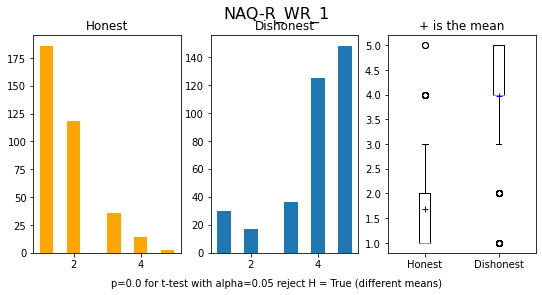

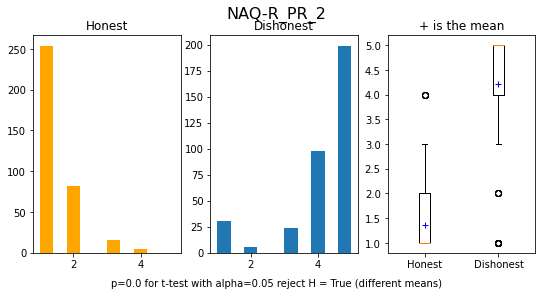

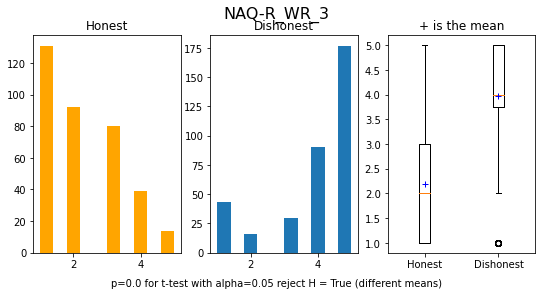

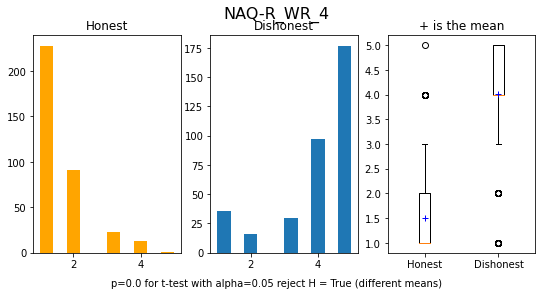

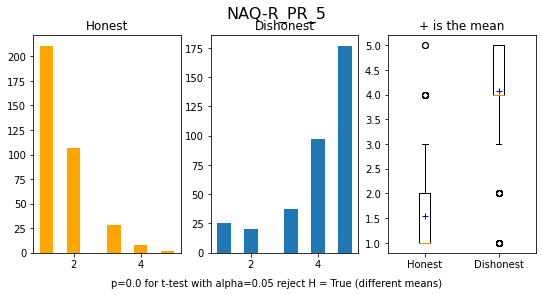

...

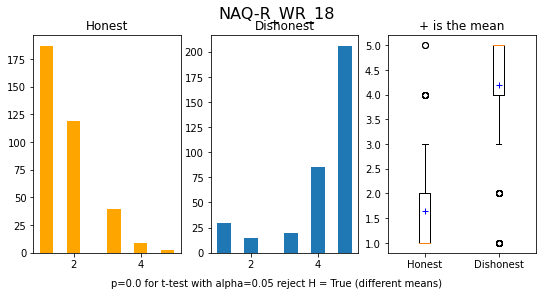

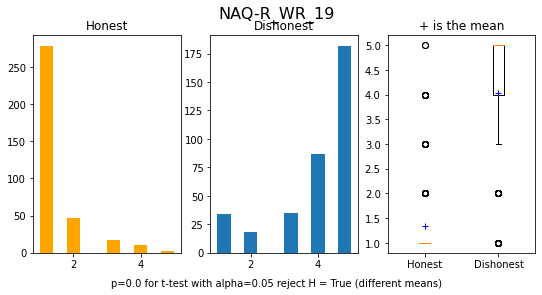

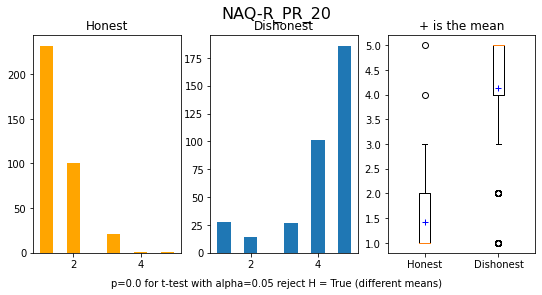

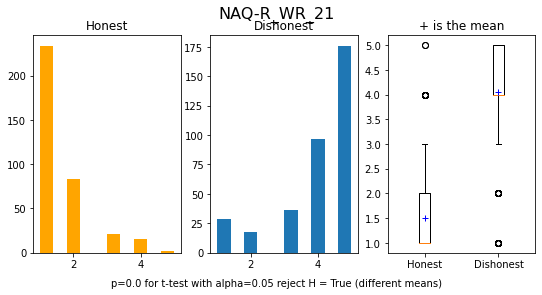

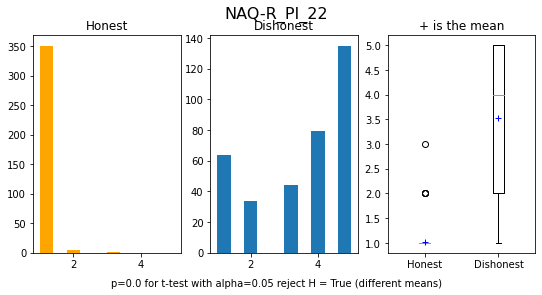

In [ ]:
plots(df6)

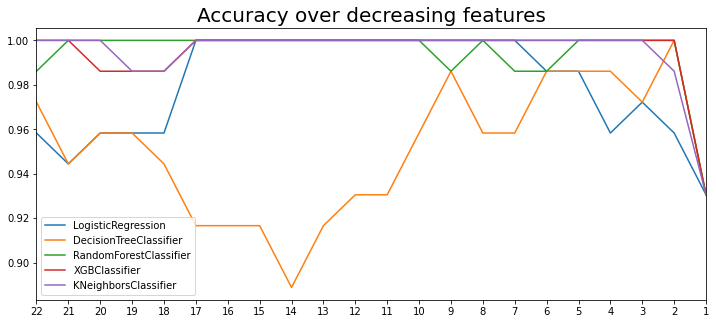

In [ ]:
plot_accuracies(df6, cumulative)

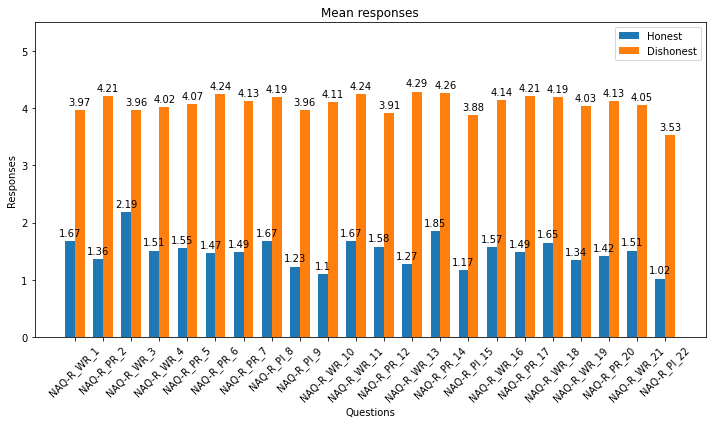

In [ ]:
n,p = df6.shape # extract dimensions

rows_honest = df6.iloc[:n//2,:-1]
rows_disonest = df6.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df6.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.96
There were 3 errors on 72 predictions


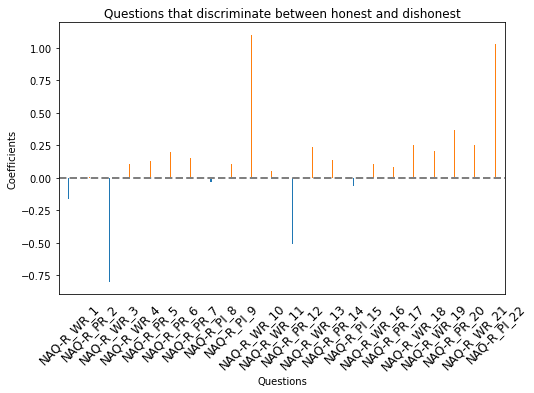

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df6.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df6.columns)[:-1],
                       rotation=45, fontsize=12)


In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df6["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df6["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,NAQ-R_WR_1,NAQ-R_PR_2,NAQ-R_WR_3,NAQ-R_WR_4,NAQ-R_PR_5,NAQ-R_PR_6,NAQ-R_PR_7,NAQ-R_PI_8,NAQ-R_PI_9,NAQ-R_WR_10,...,NAQ-R_PI_15,NAQ-R_WR_16,NAQ-R_PR_17,NAQ-R_WR_18,NAQ-R_WR_19,NAQ-R_PR_20,NAQ-R_WR_21,NAQ-R_PI_22,CONDITION,Prediction
284,1,4,1,1,1,2,4,5,1,1,...,1,1,1,2,4,5,1,1,H,D
54,3,1,1,1,1,1,3,4,3,3,...,3,1,1,1,1,3,1,1,H,D
77,4,1,1,1,3,1,3,1,2,1,...,1,3,1,3,4,2,1,1,H,D


### PCA


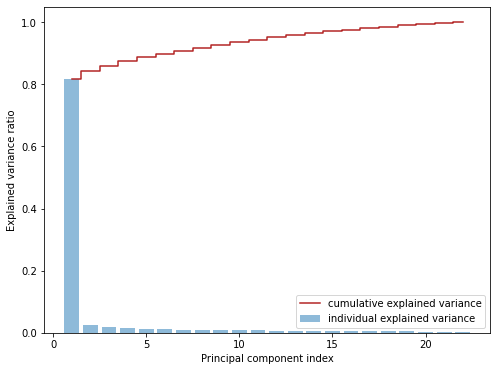

number of components based on eigenvalue higher than 1 is: 3
n = 3, tot explained variance: 0.86
      PC   exp_var    cumvar  eigenvalue
0    1.0  0.817654  0.817654   48.931834
1    2.0  0.024700  0.842355    1.478158
2    3.0  0.017301  0.859656    1.035379
3    4.0  0.015371  0.875027    0.919894
4    5.0  0.011785  0.886812    0.705251
5    6.0  0.011040  0.897852    0.660666
6    7.0  0.010270  0.908122    0.614616
7    8.0  0.009994  0.918116    0.598056
8    9.0  0.009631  0.927747    0.576344
9   10.0  0.008685  0.936432    0.519768
10  11.0  0.007689  0.944121    0.460160
11  12.0  0.007315  0.951436    0.437742
12  13.0  0.006974  0.958410    0.417379
13  14.0  0.006227  0.964637    0.372636
14  15.0  0.005569  0.970206    0.333269
15  16.0  0.005253  0.975460    0.314389
16  17.0  0.005111  0.980571    0.305867
17  18.0  0.004631  0.985201    0.277113
18  19.0  0.004350  0.989551    0.260326
19  20.0  0.003731  0.993283    0.223295
20  21.0  0.003678  0.996960    0.220088
2

In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df6, X_train, y)
print(pca_info)

Accuracy: 0.952 (0.031)


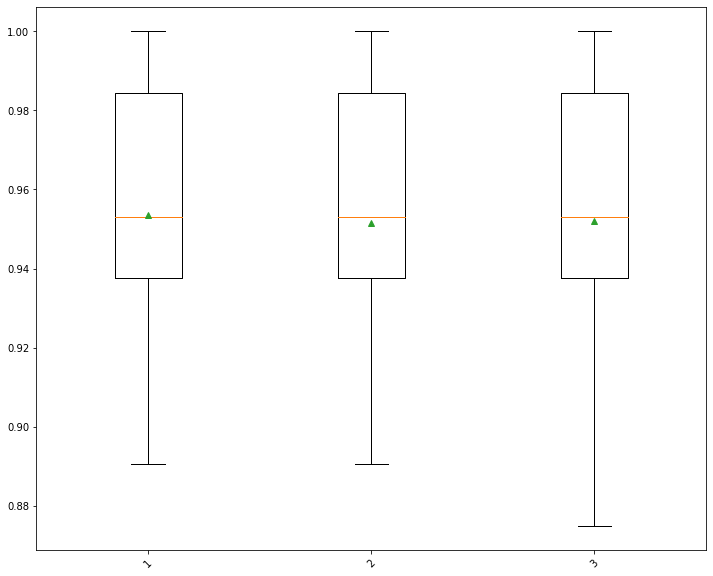

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 1, tot explained variance: 0.818
        PC0
0  8.247602
1  9.464282
2 -4.220986
3 -6.806389
4 -6.832307
val score:  0.9234375
best params:  {'max_depth': 10}
f1s:  0.9861191626409018
              precision    recall  f1-score   support

           0       1.00      0.97      0.99        38
           1       0.97      1.00      0.99        34

    accuracy                           0.99        72
   macro avg       0.99      0.99      0.99        72
weighted avg       0.99      0.99      0.99        72



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


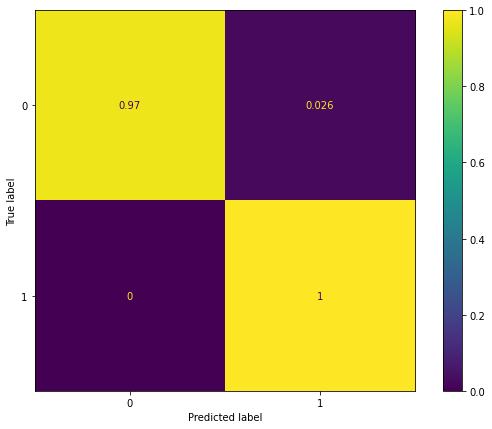

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test,1)

# 7. PHQ9_GAD7

In [ ]:
df7 = get_dataset("./datasets/5. PHQ9_GAD7/")
# X, y = pandas_to_numpy(df7)

y = np.array([1 if c == "D" else 0 for c in df7["CONDITION"]]) # create response array
X = df7.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    559
1    559
dtype: int64


## 2 - Explanatory Data Analysis

correlation of the features:
2


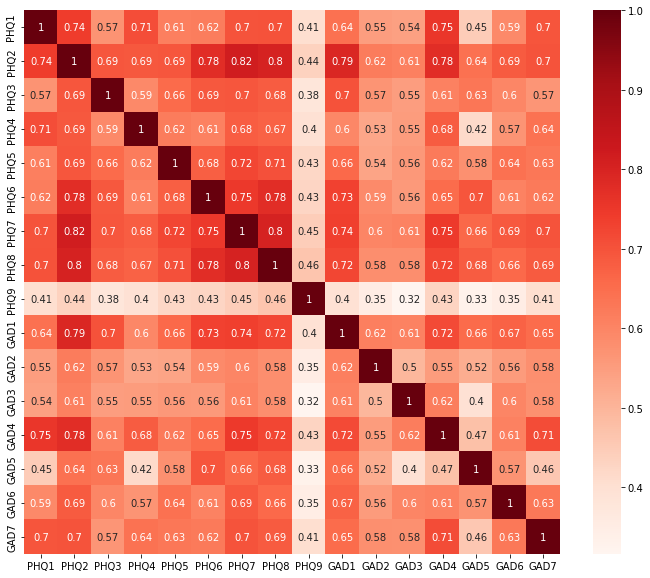

In [ ]:
correlation_matrix(df7)

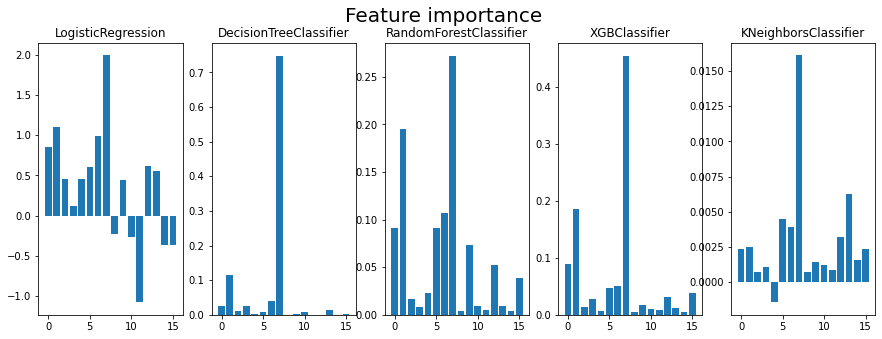

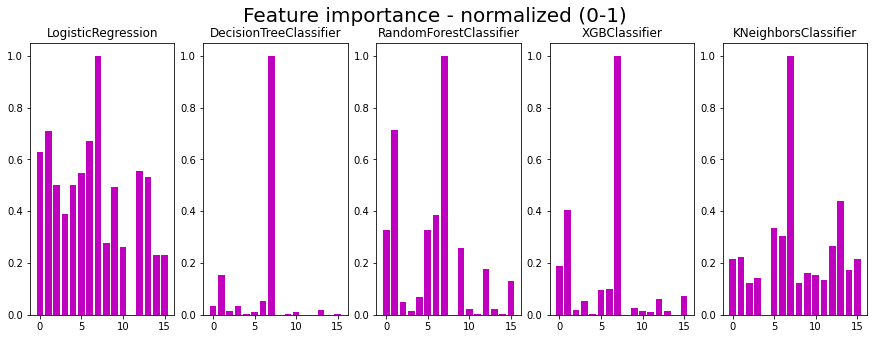

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   7 |    7 |       7 |    7 |     7 |     7 |      7 |     7 |
|   1 |    1 |       1 |    1 |     1 |     1 |      1 |    13 |
|   6 |    6 |       6 |    6 |     6 |     6 |      0 |     5 |
|   5 |    5 |       0 |    0 |     0 |     0 |      6 |     6 |
|  12 |    9 |       3 |   12 |     3 |     5 |      5 |    12 |
|   0 |    0 |      13 |    5 |    13 |     9 |     15 |     1 |
|  13 |   12 |       2 |   13 |     2 |    12 |     12 |     0 |
|   4 |   15 |       5 |    4 |    10 |    15 |      3 |    15 |
|   9 |    4 |      15 |    2 |     5 |     4 |      9 |    14 |
|   2 |    2 |      14 |    9 |     9 |     2 |      2 |     9 |
|  15 |    3 |      10 |    3 |    15 |    10 |     13 |    10 |
|   3 |   10 |       9 |    8 |     4 |    13 |     10 |     3 |
|  14 |   13 |      12 |   10 |     8 |     3 |     11 |    11 |
|   8 |   14 |      11 | 

Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=7)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=7)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   7 |    7 |       7 |    7 |     7 |     7 |      7 |     7 |
|   1 |    1 |       1 |    1 |     1 |     1 |      1 |    13 |
|   6 |    6 |       6 |    6 |     6 |     6 |      0 |     5 |
|   5 |    5 |       0 |    0 |     0 |     0 |      6 |     6 |
|  12 |    9 |       3 |   12 |     3 |     5 |      5 |    12 |
|   0 |    0 |      13 |    5 |    13 |     9 |     15 |     1 |
|  13 |   12 |       2 |   13 |     2 |    12 |     12 |     0 |
|   4 |   15 |       5 |    4 |    10 |    15 |      3 |    15 |
|   9 |    4 |      15 |    2 |     5 |     4 |      9 |    14 |
|   2 |    2 |      14 |    9 |     9 |     2 |      2 |     9 |
|  15 |    3 |      10 |    3 |    15 |    10 |     13 |    10 |
|   3 |   10 |       9 |    8 |     4 |    13 |     10 |     3 |
|  14 |   13 |      12 |   10 |     8 |     3 |     11 |    11 |
|   8 |   14 |      11 | 

Second iteration of tfidf transformation:

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=7)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   7 |    7 |       7 |    7 |     7 |     7 |      7 |     7 |
|   1 |    1 |       1 |    1 |     1 |     1 |      1 |     1 |
|   6 |    6 |       6 |    6 |     6 |     6 |      6 |     6 |
|   0 |    0 |       0 |    0 |     0 |     0 |      0 |     0 |
|   5 |    5 |       5 |    5 |     5 |     5 |      5 |     5 |
|  12 |    9 |      13 |   12 |    13 |    12 |     12 |    13 |
|  13 |   12 |       3 |   13 |     9 |     9 |      9 |    12 |
|   9 |   15 |       2 |    9 |     3 |    15 |     15 |     9 |
|   2 |    2 |       9 |    2 |     2 |    13 |     13 |    15 |
|  15 |    3 |      15 |    3 |    15 |     2 |      3 |     3 |
|   3 |   13 |      12 |   15 |    12 |     4 |      2 |    10 |
|   4 |    4 |      10 |    4 |    10 |     3 |     10 |     2 |
|  14 |   10 |      14 |   10 |     4 |    10 |      4 |    14 |
|   8 |   14 |      11 | 

In [ ]:
cumulative = ensemble(ranks, df7)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| PHQ8      |    7 | ***            |
| PHQ2      |    1 | ***            |
| PHQ7      |    6 | ***            |
| ﻿PHQ1     |    0 | ***            |
| PHQ6      |    5 | ***            |
| GAD4      |   12 | ***            |
| GAD5      |   13 | ***            |
| GAD1      |    9 | ***            |
| GAD7      |   15 | ***            |
| PHQ4      |    3 | ***            |
| PHQ3      |    2 | ***            |
| PHQ5      |    4 | ***            |
| GAD2      |   10 | ***            |
| GAD6      |   14 | ***            |
| GAD3      |   11 | ***            |
| PHQ9      |    8 | ***            |


In [ ]:
ensemble_increasingwindow(ranks, df7)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| PHQ8      |    7 | ***            |
| PHQ2      |    1 | ***            |
| PHQ7      |    6 | ***            |
| ﻿PHQ1     |    0 | ***            |
| PHQ6      |    5 | ***            |
| GAD5      |   13 | ***            |
| GAD4      |   12 | ***            |
| PHQ4      |    3 | ***            |
| GAD1      |    9 | ***            |
| GAD7      |   15 | ***            |
| PHQ3      |    2 | ***            |
| PHQ5      |    4 | ***            |
| GAD2      |   10 | ***            |
| GAD6      |   14 | ***            |
| GAD3      |   11 | ***            |
| PHQ9      |    8 | ***            |


In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df7)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| PHQ8      |    7 | ***            |
| PHQ2      |    1 | ***            |
| PHQ7      |    6 | ***            |
| ﻿PHQ1     |    0 | ***            |
| PHQ6      |    5 | ***            |
| GAD4      |   12 | ***            |
| GAD5      |   13 | ***            |
| GAD1      |    9 | ***            |
| GAD7      |   15 | ***            |
| PHQ3      |    2 | ***            |
| PHQ4      |    3 | ***            |
| GAD2      |   10 | ***            |
| PHQ5      |    4 | ***            |
| GAD6      |   14 | ***            |
| GAD3      |   11 | ***            |
| PHQ9      |    8 | ***            |


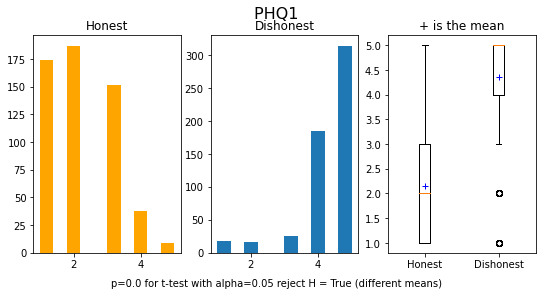

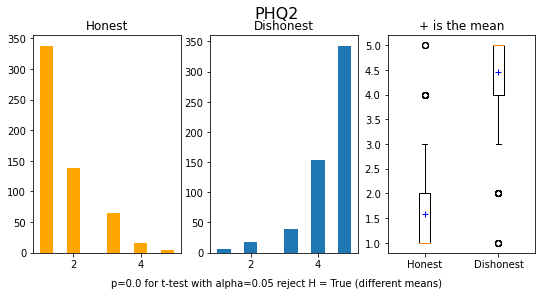

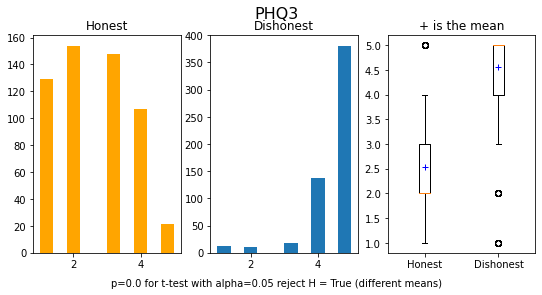

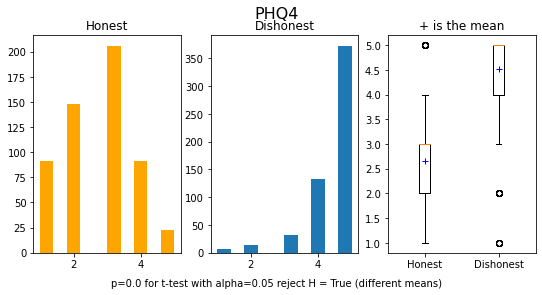

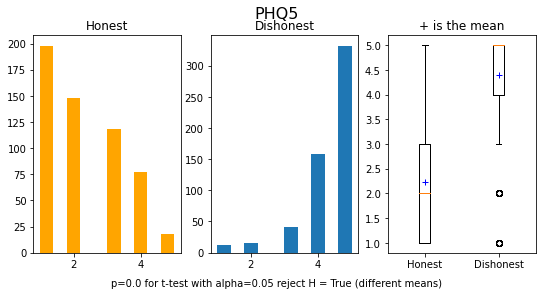

...

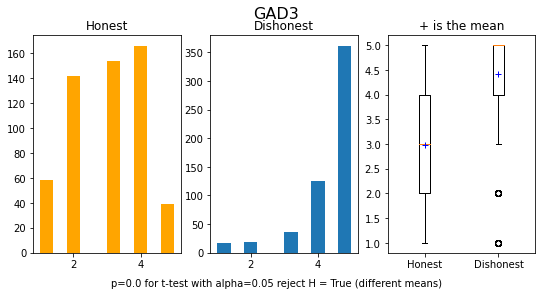

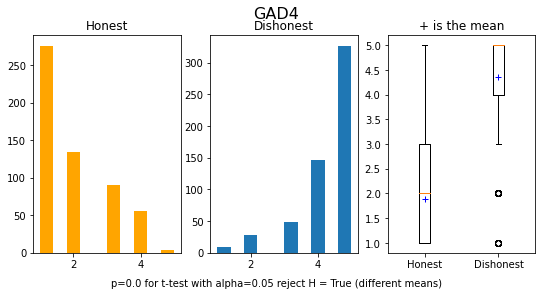

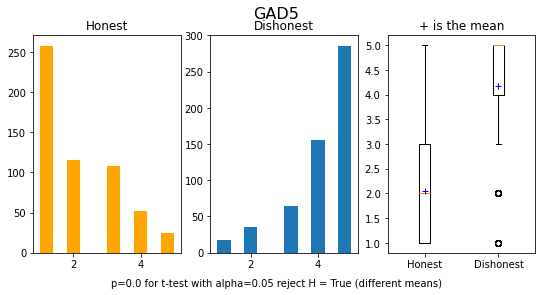

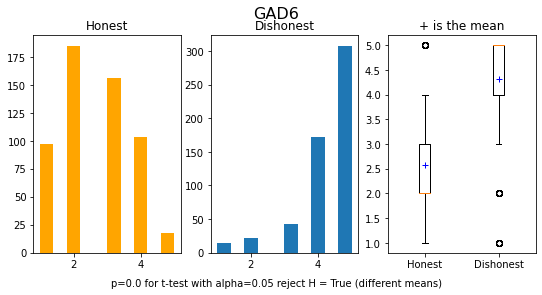

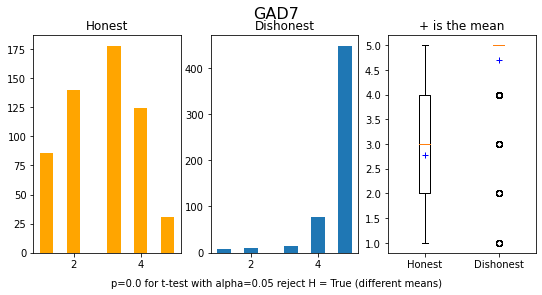

In [ ]:
plots(df7)

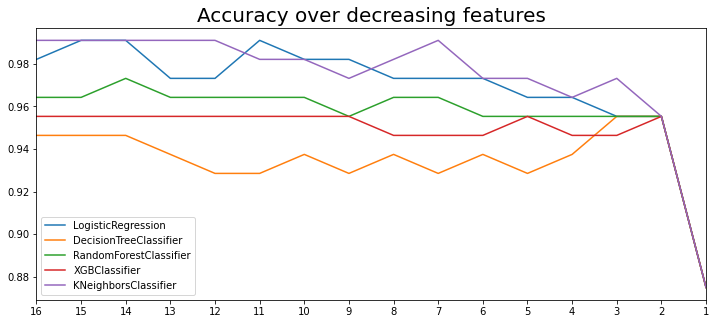

In [ ]:
plot_accuracies(df7, cumulative)

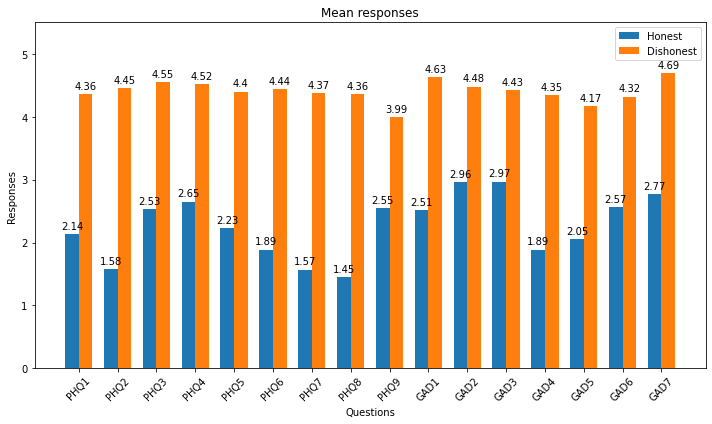

In [ ]:
n,p = df7.shape # extract dimensions

rows_honest = df7.iloc[:n//2,:-1]
rows_disonest = df7.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df7.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 3 - Modelling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.98
There were 2 errors on 112 predictions


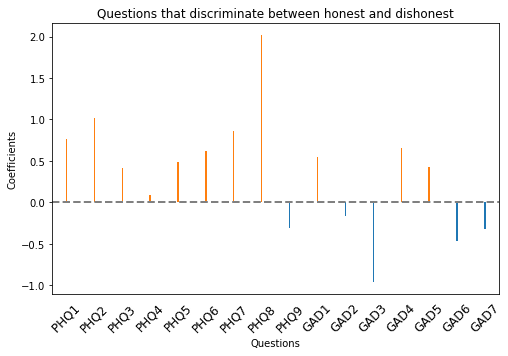

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df7.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df7.columns)[:-1],
                       rotation=45, fontsize=12)


In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df7["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df1["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,﻿PHQ1,PHQ2,PHQ3,PHQ4,PHQ5,PHQ6,PHQ7,PHQ8,PHQ9,GAD1,GAD2,GAD3,GAD4,GAD5,GAD6,GAD7,CONDITION,Prediction
199,4,3,4,4,3,2,1,4,3,4,4,4,4,1,2,5,H,D
359,1,3,3,4,4,4,1,3,1,4,4,4,4,3,3,2,H,H


### PCA


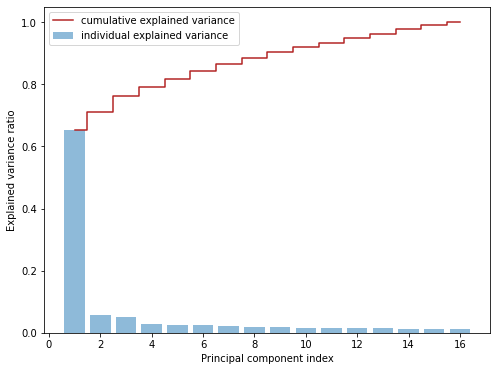

number of components based on eigenvalue higher than 1 is: 4
n = 4, tot explained variance: 0.792
      PC   exp_var    cumvar  eigenvalue
0    1.0  0.653703  0.653703   23.065646
1    2.0  0.057390  0.711093    2.024978
2    3.0  0.051372  0.762465    1.812645
3    4.0  0.029681  0.792146    1.047280
4    5.0  0.026408  0.818554    0.931786
5    6.0  0.023633  0.842187    0.833881
6    7.0  0.022715  0.864902    0.801492
7    8.0  0.019697  0.884599    0.695004
8    9.0  0.017929  0.902528    0.632632
9   10.0  0.016414  0.918942    0.579169
10  11.0  0.015301  0.934244    0.539901
11  12.0  0.015163  0.949407    0.535033
12  13.0  0.013962  0.963369    0.492636
13  14.0  0.013429  0.976798    0.473853
14  15.0  0.012536  0.989334    0.442331
15  16.0  0.010666  1.000000    0.376334


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df7, X_train, y)
print(pca_info)

Accuracy: 0.985 (0.009)


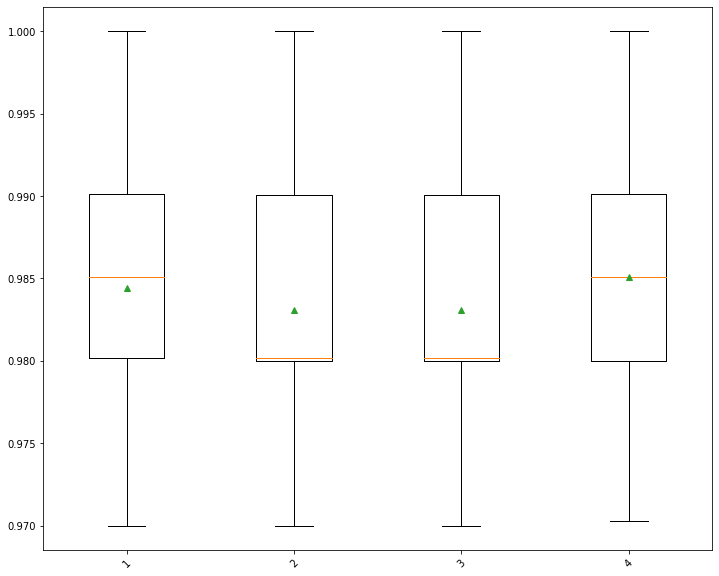

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 1, tot explained variance: 0.654
        PC0
0 -1.905549
1 -4.686292
2 -4.460167
3 -5.758477
4  0.786182
val score:  0.9771292054578593
best params:  {'max_depth': 10}
f1s:  0.9732249837390025
              precision    recall  f1-score   support

           0       0.98      0.97      0.97        59
           1       0.96      0.98      0.97        53

    accuracy                           0.97       112
   macro avg       0.97      0.97      0.97       112
weighted avg       0.97      0.97      0.97       112



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


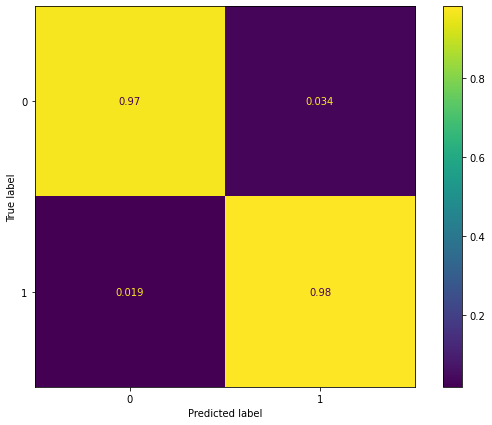

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 1)

# 8. PID5

In [ ]:
df8 = get_dataset("./datasets/6. PID5/")
#X, y = pandas_to_numpy(df8)

y = np.array([1 if c == "D" else 0 for c in df8["CONDITION"]]) # create response array
X = df8.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    412
1    412
dtype: int64


## 2 - Explanatory Data Analysis

correlation of the features:
21


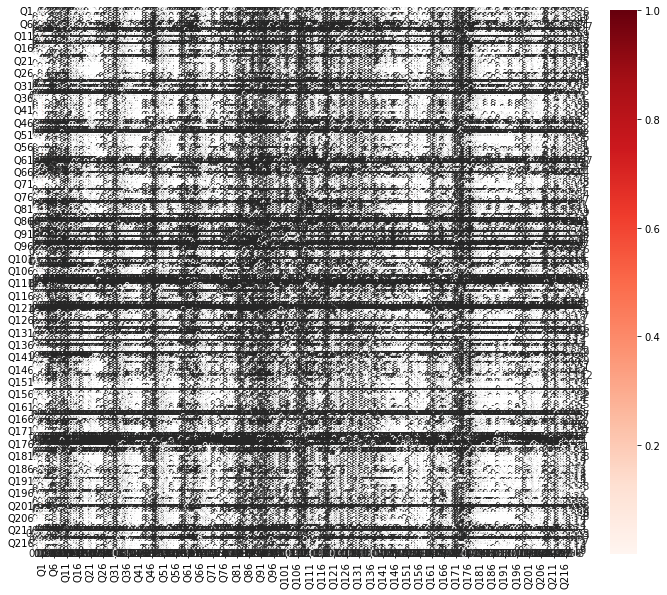

In [ ]:
correlation_matrix(df8)

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


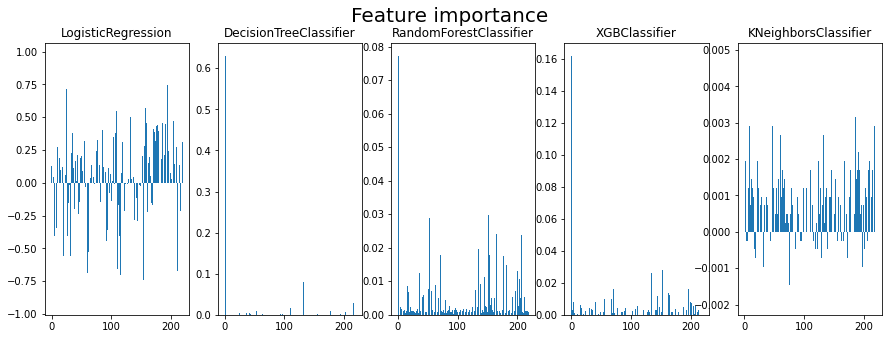

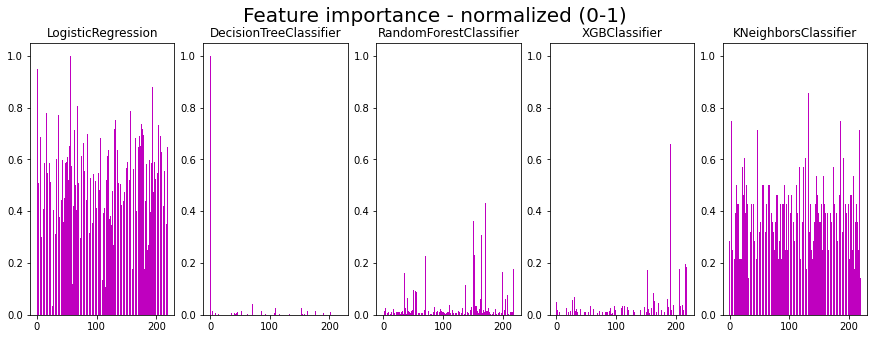

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
| 191 |    1 |       1 |   56 |     1 |     1 |      1 |     1 |
| 152 |  191 |     132 |    1 |   132 |   189 |    191 |   132 |
|  36 |  189 |      71 |  148 |   216 |   132 |     53 |   135 |
| 153 |  171 |     216 |  194 |    71 |   171 |    216 |     3 |
| 197 |  152 |     218 |   25 |   218 |   191 |    218 |   186 |
| 138 |  216 |     153 |   71 |   153 |   152 |    132 |     9 |
|  10 |  138 |     110 |   68 |   110 |    53 |    206 |    47 |
|   1 |  132 |     163 |  157 |   126 |   151 |    153 |   218 |
|  71 |  206 |      42 |   16 |    86 |   216 |    135 |   118 |
| 177 |  165 |       6 |  109 |    53 |   206 |     70 |    61 |
| 165 |  153 |      46 |   36 |   163 |   165 |    189 |    63 |
| 206 |  204 |       4 |  173 |   177 |   207 |     71 |   133 |
| 216 |   35 |     191 |  132 |   144 |    35 |    197 |   177 |
|  53 |  151 |     148 | 

Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=1)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=1)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
| 191 |    1 |       1 |   56 |     1 |     1 |      1 |     1 |
| 152 |  191 |     132 |    1 |   132 |   189 |    191 |   132 |
|  36 |  189 |      71 |  148 |   216 |   132 |     53 |   135 |
| 153 |  171 |     216 |  194 |    71 |   171 |    216 |     3 |
| 197 |  152 |     218 |   25 |   218 |   191 |    218 |   186 |
| 138 |  216 |     153 |   71 |   153 |   152 |    132 |     9 |
|  10 |  138 |     110 |   68 |   110 |    53 |    206 |    47 |
|   1 |  132 |     163 |  157 |   126 |   151 |    153 |   218 |
|  71 |  206 |      42 |   16 |    86 |   216 |    135 |   118 |
| 177 |  165 |       6 |  109 |    53 |   206 |     70 |    61 |
| 165 |  153 |      46 |   36 |   163 |   165 |    189 |    63 |
| 206 |  204 |       4 |  173 |   177 |   207 |     71 |   133 |
| 216 |   35 |     191 |  132 |   144 |    35 |    197 |   177 |
|  53 |  151 |     148 | 

Second iteration of tfidf transformation:

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=1)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   1 |    1 |       1 |    1 |     1 |     1 |      1 |     1 |
| 132 |  132 |     132 |  132 |   132 |   132 |    132 |   132 |
| 191 |  191 |     191 |  191 |   191 |   191 |    191 |   191 |
| 153 |  153 |     153 |  153 |   153 |   153 |    153 |   153 |
| 218 |  218 |     218 |  218 |   218 |   218 |    218 |   218 |
|  71 |   71 |      71 |   71 |    71 |    71 |     71 |    71 |
|  16 |   16 |      16 |   16 |    16 |    16 |     16 |   177 |
| 177 |  177 |     177 |  177 |   177 |   177 |     53 |    16 |
|  53 |   53 |      53 |   53 |    53 |    53 |    177 |    53 |
|  36 |   36 |      36 |   36 |    36 |    36 |     36 |    36 |
|  63 |   63 |     194 |   63 |    63 |    63 |     63 |    63 |
| 194 |  194 |      63 |  194 |   194 |   194 |    194 |   194 |
|  10 |   10 |      10 |   10 |    10 |    10 |     10 |    10 |
| 152 |  152 |     152 | 

In [ ]:
cumulative = ensemble(ranks, df8)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| Q2        |    1 | ***            |
| Q133      |  132 | ***            |
| Q192      |  191 | ***            |
| Q154      |  153 | ***            |
| Q219      |  218 | ***            |
| Q72       |   71 | ***            |
| Q178      |  177 | ***            |
| Q17       |   16 | ***            |
| Q54       |   53 | ***            |
| Q64       |   63 | ***            |
| Q37       |   36 | ***            |
| Q195      |  194 | ***            |
| Q11       |   10 | ***            |
| Q217      |  216 | ***            |
| Q153      |  152 | ***            |
| Q4        |    3 | ***            |
| Q36       |   35 | ***            |
| Q136      |  135 | ***            |
| Q172      |  171 | ***            |
| Q187      |  186 | ***            |
| Q198      |  197 | ***            |
| Q42       |   41 | ***            |
| Q166      |  165 | ***            |
| Q26       |   25 | ***            |
| Q160      

In [ ]:
ensemble_increasingwindow(ranks, df8)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| Q2        |    1 | ***            |
| Q192      |  191 | ***            |
| Q133      |  132 | ***            |
| Q190      |  189 | ***            |
| Q217      |  216 | ***            |
| Q153      |  152 | ***            |
| Q72       |   71 | ***            |
| Q219      |  218 | ***            |
| Q154      |  153 | ***            |
| Q172      |  171 | ***            |
| Q54       |   53 | ***            |
| Q207      |  206 | ***            |
| Q136      |  135 | ***            |
| Q139      |  138 | ***            |
| Q37       |   36 | ***            |
| Q166      |  165 | ***            |
| Q111      |  110 | *              |
| Q178      |  177 | ***            |
| Q164      |  163 | -              |
| Q149      |  148 | ***            |
| Q198      |  197 | ***            |
| Q26       |   25 | ***            |
| Q36       |   35 | ***            |
| Q187      |  186 | ***            |
| Q152      

In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df8)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| Q2        |    1 | ***            |
| Q133      |  132 | ***            |
| Q192      |  191 | ***            |
| Q154      |  153 | ***            |
| Q219      |  218 | ***            |
| Q72       |   71 | ***            |
| Q17       |   16 | ***            |
| Q178      |  177 | ***            |
| Q54       |   53 | ***            |
| Q37       |   36 | ***            |
| Q64       |   63 | ***            |
| Q195      |  194 | ***            |
| Q11       |   10 | ***            |
| Q153      |  152 | ***            |
| Q4        |    3 | ***            |
| Q36       |   35 | ***            |
| Q16       |   15 | ***            |
| Q172      |  171 | ***            |
| Q41       |   40 | ***            |
| Q136      |  135 | ***            |
| Q217      |  216 | ***            |
| Q160      |  159 | ***            |
| Q187      |  186 | ***            |
| Q57       |   56 | ***            |
| Q198      

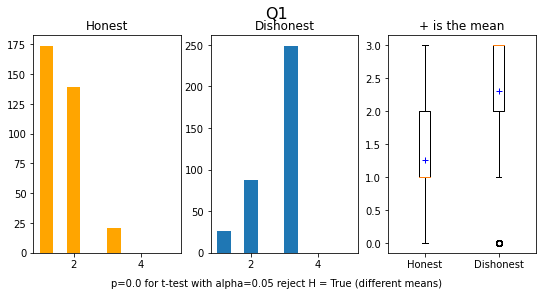

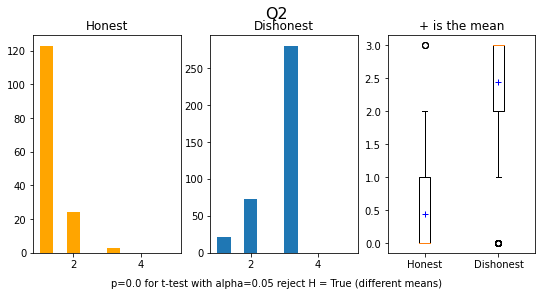

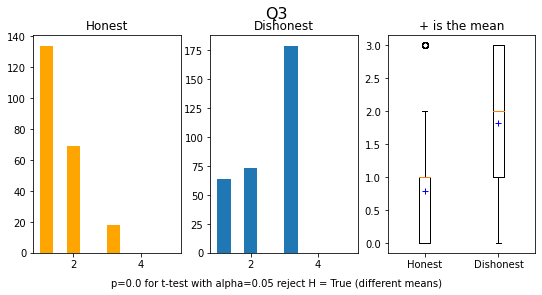

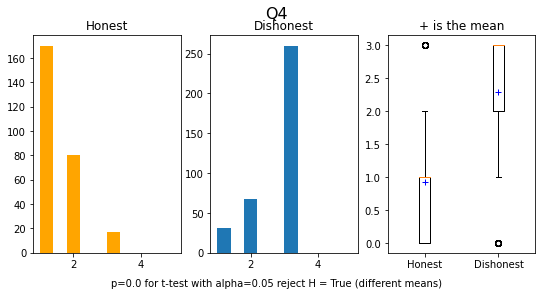

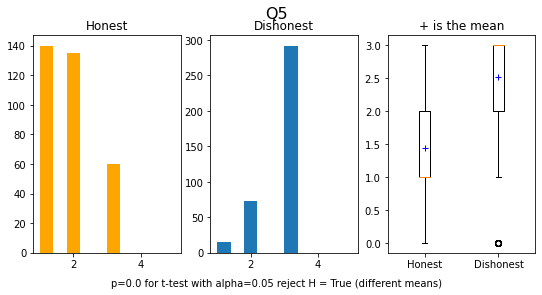

...

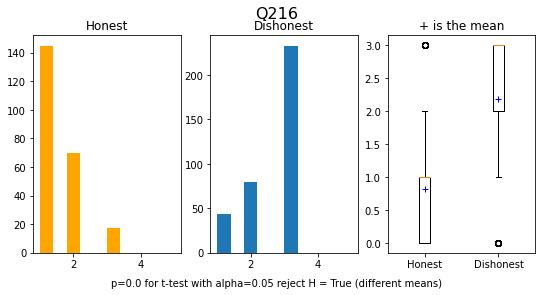

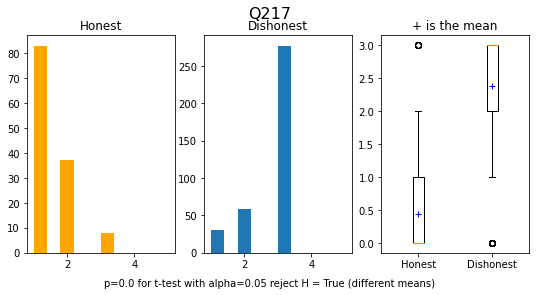

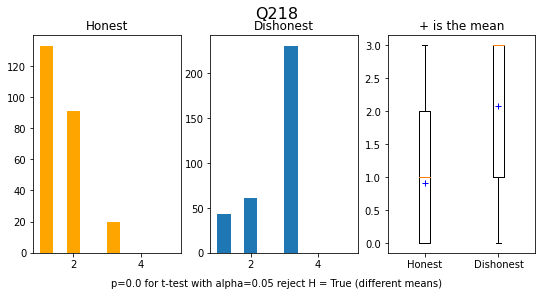

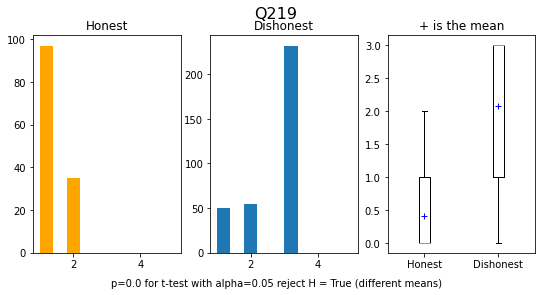

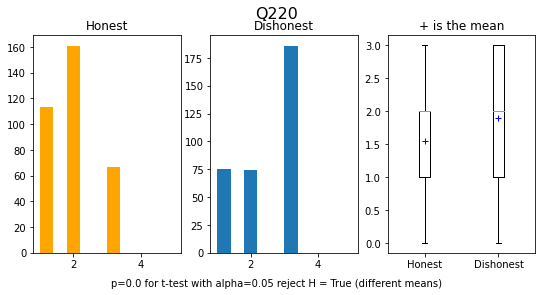

In [ ]:
plots(df8)

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _che

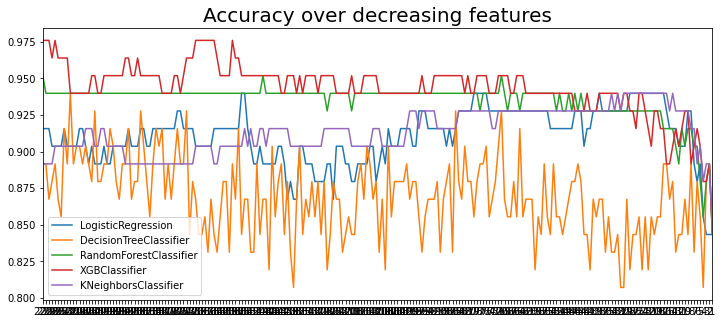

In [ ]:
plot_accuracies(df8, cumulative)

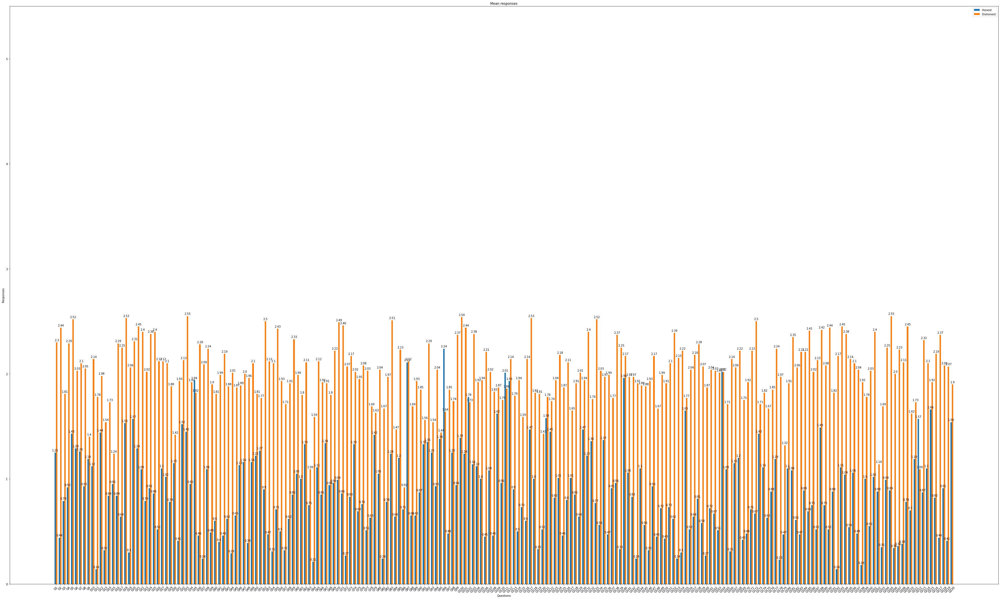

In [ ]:
n,p = df8.shape # extract dimensions

rows_honest = df8.iloc[:n//2,:-1]
rows_disonest = df8.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(50, 30))

labels = list(df8.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 3 - Modelling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.92
There were 7 errors on 83 predictions


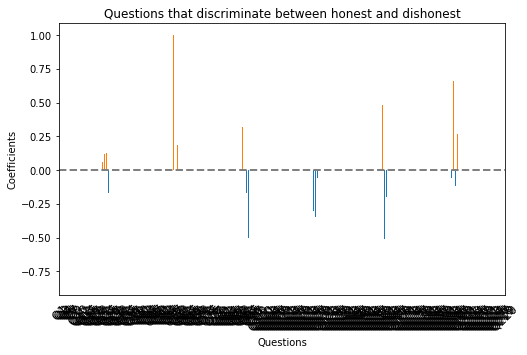

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df8.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df8.columns)[:-1],
                       rotation=45, fontsize=12)


In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df8["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df8["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,...,Q213,Q214,Q215,Q216,Q217,Q218,Q219,Q220,CONDITION,Prediction
610,3,0,0,0,0,0,0,0,0,0,...,0,0,3,0,0,0,0,1,D,H
715,1,0,0,0,0,1,2,0,1,0,...,1,0,1,0,0,3,0,2,D,H
680,3,3,0,0,2,2,3,0,2,3,...,2,2,0,0,0,2,2,0,D,H
377,1,2,1,0,1,0,1,1,1,1,...,1,0,1,2,0,1,0,2,H,D
554,2,2,0,2,0,1,2,1,0,2,...,0,0,2,2,0,3,0,1,D,H
542,1,0,1,1,0,0,1,2,2,0,...,2,2,1,1,0,2,1,2,D,H
215,2,1,0,1,1,1,1,0,1,0,...,0,2,2,0,0,2,1,2,H,D


## PCA

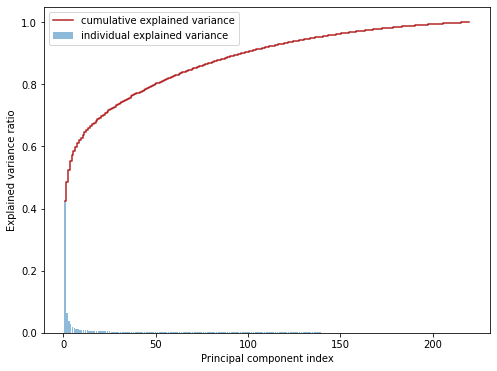

number of components based on eigenvalue higher than 1 is: 37
n = 37, tot explained variance: 0.759
        PC   exp_var    cumvar  eigenvalue
0      1.0  0.423074  0.423074  129.423108
1      2.0  0.063635  0.486709   19.466729
2      3.0  0.037073  0.523782   11.341068
3      4.0  0.028133  0.551915    8.606305
4      5.0  0.019469  0.571384    5.955857
..     ...       ...       ...         ...
215  216.0  0.000268  0.999069    0.082115
216  217.0  0.000258  0.999327    0.078989
217  218.0  0.000236  0.999563    0.072215
218  219.0  0.000231  0.999794    0.070572
219  220.0  0.000206  1.000000    0.063104

[220 rows x 4 columns]


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df8, X_train, y)
print(pca_info)

Accuracy: 0.964 (0.021)


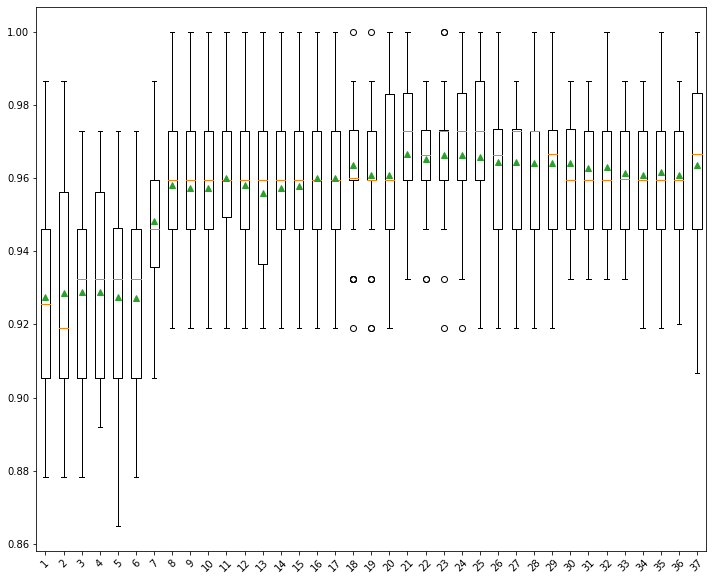

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 24, tot explained variance: 0.711
         PC0       PC1       PC2       PC3       PC4       PC5       PC6  \
0  14.264065  1.231145 -1.154213  0.511341  1.975717  2.139379  0.385086   
1  -6.949546 -0.555706 -0.993497 -2.519821  2.330509 -1.710192  0.808192   
2 -11.847281  1.479931  1.120270 -1.498623 -1.872112  1.640442 -0.740222   
3 -10.471790  0.654237  3.505259  2.479755  0.347828  0.525952 -2.175443   
4   9.116653 -2.192562  4.896446  7.807732 -0.815001  4.790558 -0.754533   

        PC7       PC8       PC9  ...      PC14      PC15      PC16      PC17  \
0  1.541087  0.421351  0.528003  ...  1.124322  0.527408  0.517761  1.461959   
1 -1.405971 -0.154036  1.313470  ... -2.158967 -3.055269 -3.259586 -1.706888   
2 -1.123805  1.206228 -0.357894  ...  0.270945 -0.594653 -0.483656  0.698918   
3  0.163035  0.082970  2.608901  ...  0.824113 -2.213163 -0.844569  1.218609   
4 -3.828892 -1.395438 -0.313679  ...  0.498769  0.551591 -0.401128 -1.025216   

       PC18      PC19   

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


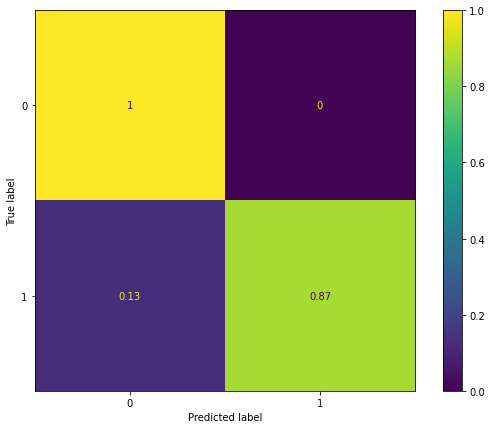

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 24)

# 9. shortPID5

In [ ]:
df9 = get_dataset("./datasets/7. shortPID5/")
#X, y = pandas_to_numpy(df9)
y = np.array([1 if c == "D" else 0 for c in df9["CONDITION"]]) # create response array
X = df9.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    519
1    519
dtype: int64


## 2 - Explanatory Data Analysis

correlation of the features:
4


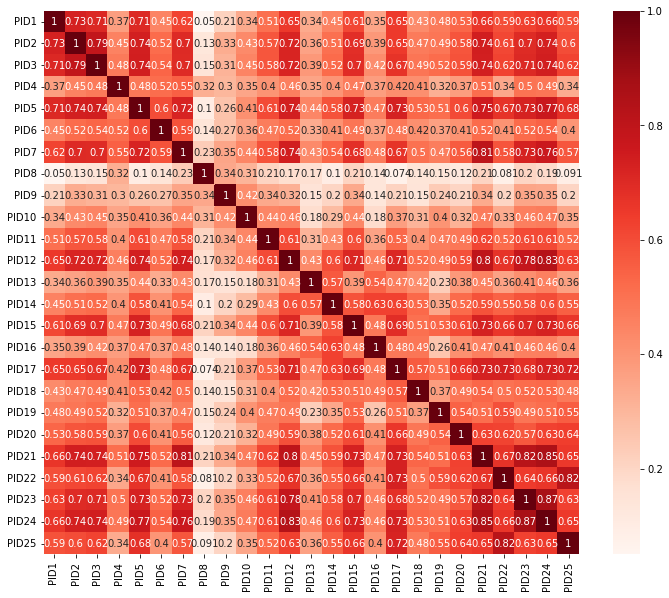

In [ ]:
correlation_matrix(df9)

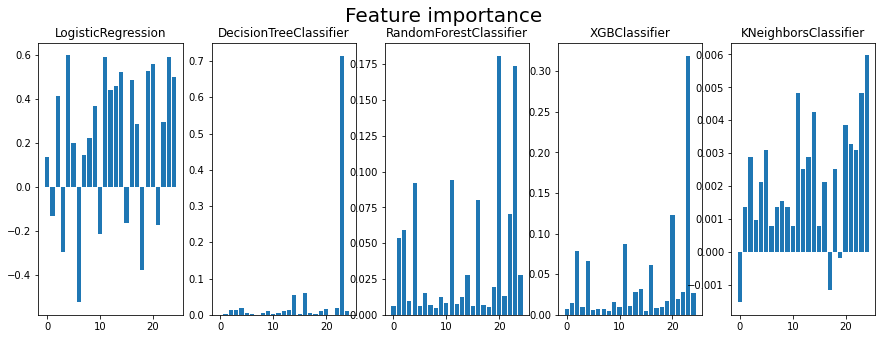

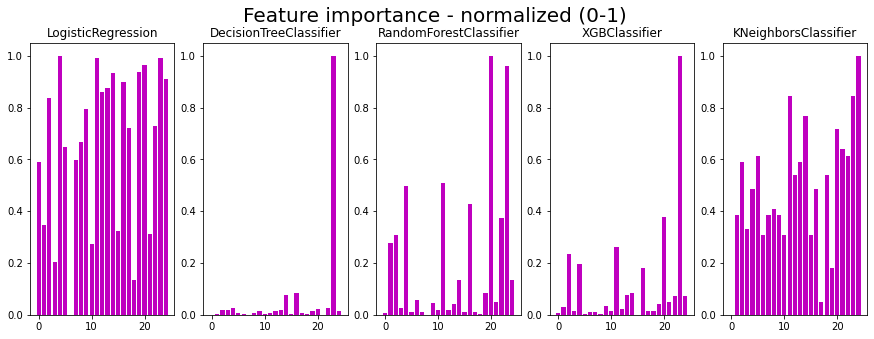

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|  23 |   23 |      23 |    4 |    23 |    20 |     23 |    24 |
|  11 |   20 |      16 |   11 |    16 |    23 |     20 |    11 |
|  20 |   11 |      14 |   23 |    14 |    11 |     11 |    23 |
|   4 |   22 |      20 |   20 |     4 |     4 |      2 |    14 |
|  16 |    4 |      13 |   19 |    22 |    16 |      4 |    20 |
|  22 |   14 |      22 |   14 |    20 |    22 |     16 |    21 |
|   2 |    1 |      19 |   24 |     2 |     2 |     14 |     5 |
|  24 |    2 |      15 |   16 |     3 |     1 |     13 |    22 |
|  21 |   16 |       2 |   13 |    13 |    14 |     22 |     2 |
|  14 |    6 |      12 |   12 |    19 |    24 |     24 |    13 |
|   1 |   24 |      11 |    2 |    24 |    19 |     21 |    12 |
|   6 |   19 |       3 |    9 |     9 |     6 |     19 |    18 |
|  19 |   21 |      17 |   22 |    12 |    21 |      9 |     4 |
|  13 |    0 |      10 | 

Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=23)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=23)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|  23 |   23 |      23 |    4 |    23 |    20 |     23 |    24 |
|  11 |   20 |      16 |   11 |    16 |    23 |     20 |    11 |
|  20 |   11 |      14 |   23 |    14 |    11 |     11 |    23 |
|   4 |   22 |      20 |   20 |     4 |     4 |      2 |    14 |
|  16 |    4 |      13 |   19 |    22 |    16 |      4 |    20 |
|  22 |   14 |      22 |   14 |    20 |    22 |     16 |    21 |
|   2 |    1 |      19 |   24 |     2 |     2 |     14 |     5 |
|  24 |    2 |      15 |   16 |     3 |     1 |     13 |    22 |
|  21 |   16 |       2 |   13 |    13 |    14 |     22 |     2 |
|  14 |    6 |      12 |   12 |    19 |    24 |     24 |    13 |
|   1 |   24 |      11 |    2 |    24 |    19 |     21 |    12 |
|   6 |   19 |       3 |    9 |     9 |     6 |     19 |    18 |
|  19 |   21 |      17 |   22 |    12 |    21 |      9 |     4 |
|  13 |    0 |      10 | 

Second iteration of tfidf transformation:

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=8)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|  23 |   23 |      23 |   23 |    23 |    23 |     23 |    23 |
|  20 |   20 |      20 |   20 |    20 |    20 |     20 |    20 |
|  11 |   11 |      11 |   11 |    14 |    11 |     11 |    11 |
|  14 |   14 |      14 |   14 |    11 |    14 |     14 |    14 |
|   4 |    4 |      16 |    4 |     4 |     4 |      4 |     4 |
|  16 |   16 |       4 |   16 |    16 |    16 |     16 |    22 |
|  22 |   22 |      22 |   22 |    22 |    22 |     22 |    16 |
|   2 |    2 |       2 |    2 |     2 |     2 |      2 |     2 |
|  24 |   24 |      13 |   24 |    13 |    24 |     13 |    24 |
|  13 |   13 |      19 |   13 |    24 |    13 |     24 |    13 |
|  19 |   19 |       9 |   19 |    19 |    19 |     19 |    21 |
|  21 |    1 |      12 |    9 |     9 |     1 |      9 |    12 |
|   1 |   21 |      24 |   12 |    12 |     9 |     21 |     9 |
|  12 |    9 |       3 | 

In [ ]:
cumulative = ensemble(ranks, df9)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| PID24     |   23 | ***            |
| PID21     |   20 | ***            |
| PID12     |   11 | ***            |
| PID15     |   14 | ***            |
| PID17     |   16 | ***            |
| PID5      |    4 | ***            |
| PID23     |   22 | ***            |
| PID3      |    2 | ***            |
| PID25     |   24 | ***            |
| PID14     |   13 | ***            |
| PID20     |   19 | ***            |
| PID22     |   21 | ***            |
| PID2      |    1 | ***            |
| PID13     |   12 | ***            |
| PID10     |    9 | ***            |
| PID7      |    6 | ***            |
| PID18     |   17 | ***            |
| PID4      |    3 | ***            |
| PID11     |   10 | ***            |
| PID6      |    5 | ***            |
| PID9      |    8 | ***            |
| PID19     |   18 | ***            |
| PID16     |   15 | ***            |
| ﻿PID1     |    0 | ***            |
| PID8      

In [ ]:
ensemble_increasingwindow(ranks, df9)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| PID24     |   23 | ***            |
| PID21     |   20 | ***            |
| PID12     |   11 | ***            |
| PID5      |    4 | ***            |
| PID17     |   16 | ***            |
| PID15     |   14 | ***            |
| PID23     |   22 | ***            |
| PID3      |    2 | ***            |
| PID25     |   24 | ***            |
| PID14     |   13 | ***            |
| PID20     |   19 | ***            |
| PID22     |   21 | ***            |
| PID2      |    1 | ***            |
| PID13     |   12 | ***            |
| PID7      |    6 | ***            |
| PID10     |    9 | ***            |
| PID4      |    3 | ***            |
| PID18     |   17 | ***            |
| PID6      |    5 | ***            |
| PID11     |   10 | ***            |
| PID9      |    8 | ***            |
| PID19     |   18 | ***            |
| PID16     |   15 | ***            |
| ﻿PID1     |    0 | ***            |
| PID8      

In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df9)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| PID24     |   23 | ***            |
| PID21     |   20 | ***            |
| PID12     |   11 | ***            |
| PID15     |   14 | ***            |
| PID5      |    4 | ***            |
| PID17     |   16 | ***            |
| PID23     |   22 | ***            |
| PID3      |    2 | ***            |
| PID14     |   13 | ***            |
| PID25     |   24 | ***            |
| PID20     |   19 | ***            |
| PID10     |    9 | ***            |
| PID13     |   12 | ***            |
| PID2      |    1 | ***            |
| PID22     |   21 | ***            |
| PID18     |   17 | ***            |
| PID7      |    6 | ***            |
| PID11     |   10 | ***            |
| PID4      |    3 | ***            |
| PID6      |    5 | ***            |
| PID9      |    8 | ***            |
| PID19     |   18 | ***            |
| PID16     |   15 | ***            |
| ﻿PID1     |    0 | ***            |
| PID8      

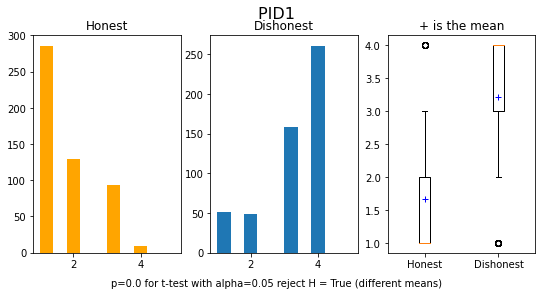

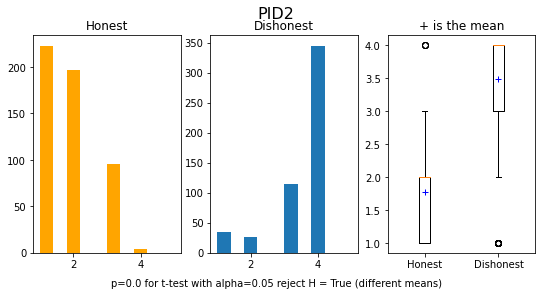

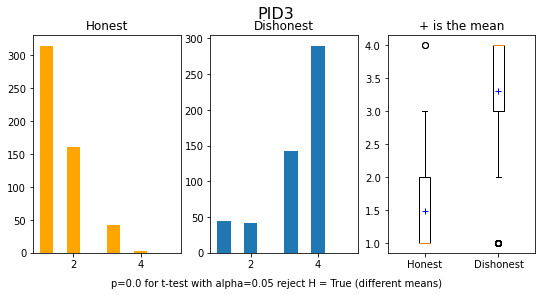

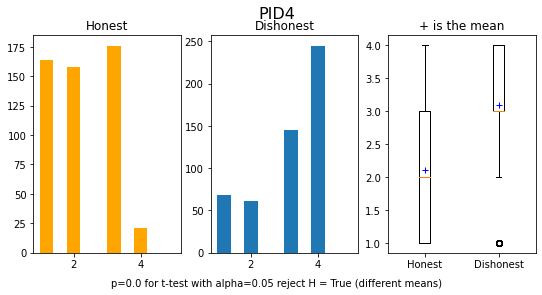

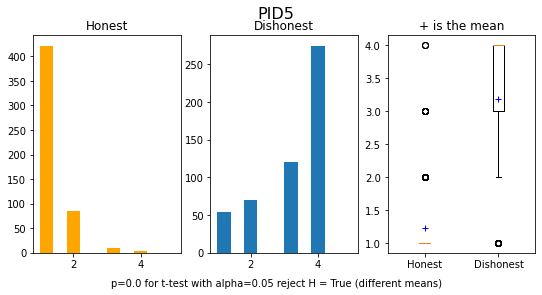

...

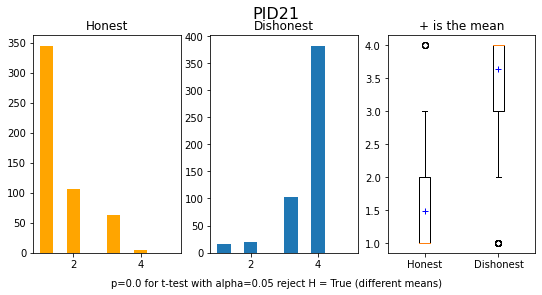

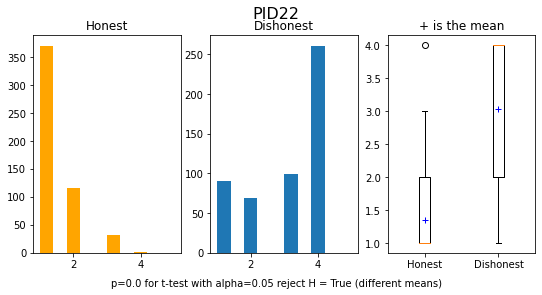

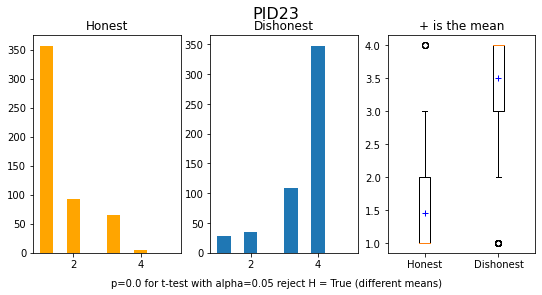

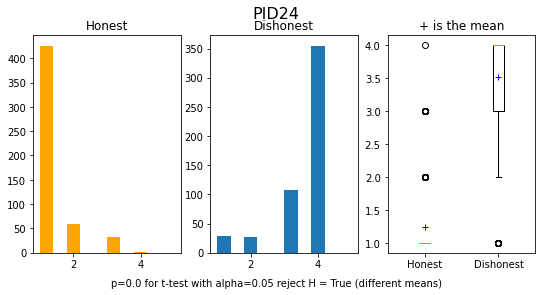

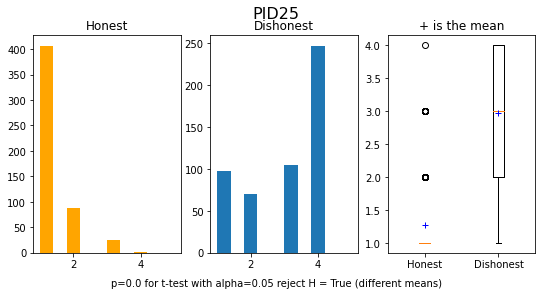

In [ ]:
plots(df9)

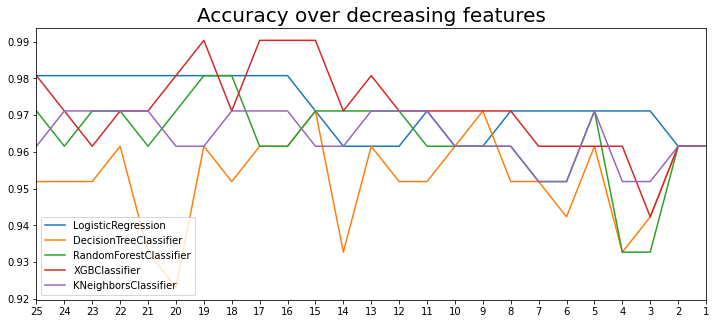

In [ ]:
plot_accuracies(df9, cumulative)

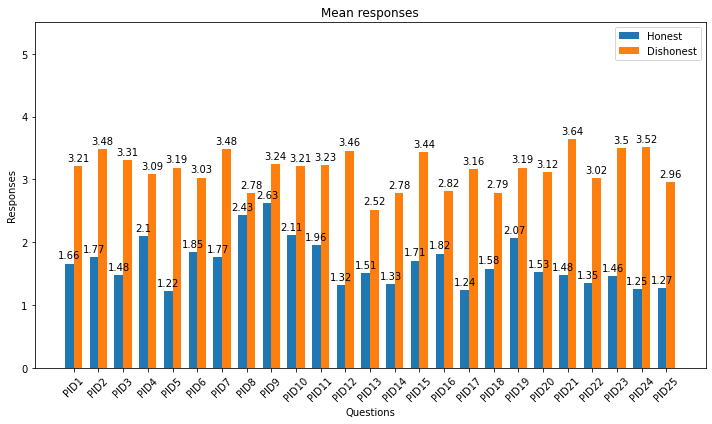

In [ ]:
n,p = df9.shape # extract dimensions

rows_honest = df9.iloc[:n//2,:-1]
rows_disonest = df9.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df9.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 3 - Modelling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.98
There were 2 errors on 104 predictions


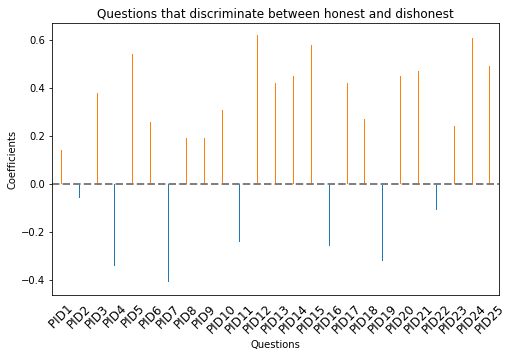

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df9.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df9.columns)[:-1],
                       rotation=45, fontsize=12)


In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df9["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df9["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,﻿PID1,PID2,PID3,PID4,PID5,PID6,PID7,PID8,PID9,PID10,...,PID18,PID19,PID20,PID21,PID22,PID23,PID24,PID25,CONDITION,Prediction
557,1,1,1,4,2,1,1,4,2,1,...,2,1,4,1,1,1,1,2,D,H
784,1,1,1,2,1,1,1,1,2,4,...,3,1,1,4,1,4,1,1,D,H


### PCA


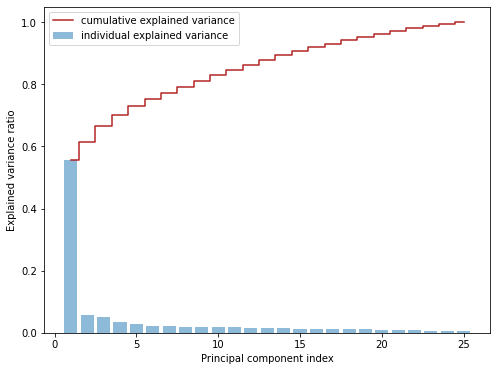

number of components based on eigenvalue higher than 1 is: 4
n = 4, tot explained variance: 0.701
      PC   exp_var    cumvar  eigenvalue
0    1.0  0.557805  0.557805   19.868216
1    2.0  0.057911  0.615716    2.062721
2    3.0  0.049531  0.665247    1.764231
3    4.0  0.036162  0.701409    1.288025
4    5.0  0.027363  0.728772    0.974639
5    6.0  0.022531  0.751303    0.802527
6    7.0  0.021222  0.772525    0.755886
7    8.0  0.019782  0.792307    0.704623
8    9.0  0.018358  0.810665    0.653892
9   10.0  0.017897  0.828562    0.637465
10  11.0  0.017628  0.846191    0.627902
11  12.0  0.016498  0.862689    0.587623
12  13.0  0.016192  0.878880    0.576729
13  14.0  0.014584  0.893464    0.519456
14  15.0  0.013146  0.906611    0.468255
15  16.0  0.012465  0.919076    0.443995
16  17.0  0.011979  0.931054    0.426660
17  18.0  0.011407  0.942461    0.406285
18  19.0  0.010649  0.953110    0.379288
19  20.0  0.009805  0.962915    0.349256
20  21.0  0.009113  0.972028    0.324609


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df9, X_train, y)
print(pca_info)

Accuracy: 0.960 (0.018)


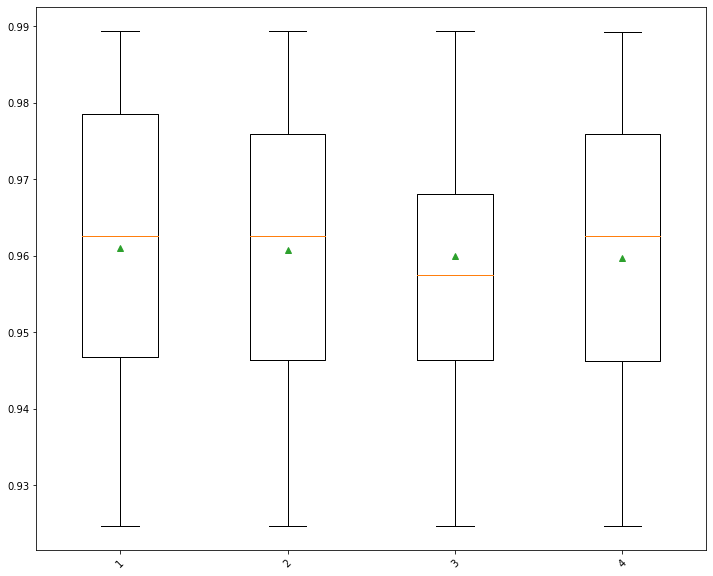

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 1, tot explained variance: 0.558
        PC0
0  1.494545
1  6.200057
2  7.336745
3 -5.046366
4 -5.580171
val score:  0.9443390259329538
best params:  {'max_depth': 10}
f1s:  0.9519543333976324
              precision    recall  f1-score   support

           0       0.94      0.96      0.95        48
           1       0.96      0.95      0.95        56

    accuracy                           0.95       104
   macro avg       0.95      0.95      0.95       104
weighted avg       0.95      0.95      0.95       104



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


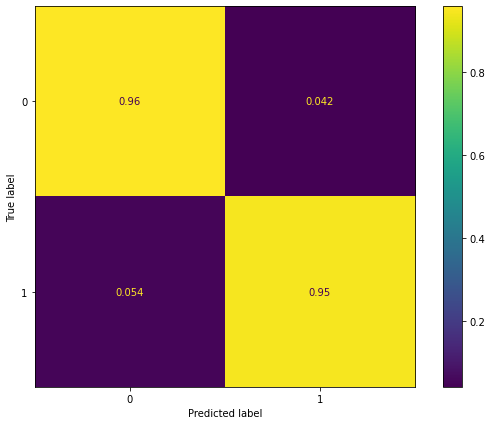

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 1)

# 10. PRFQ
##(fake good)

In [ ]:
df10 = get_dataset("./datasets/8. PRFQ/")
#X, y = pandas_to_numpy(df10)
y = np.array([1 if c == "D" else 0 for c in df10["CONDITION"]]) # create response array
X = df10.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    339
1    339
dtype: int64


## 2 - Explanatory Data Analysis

correlation of the features:
0


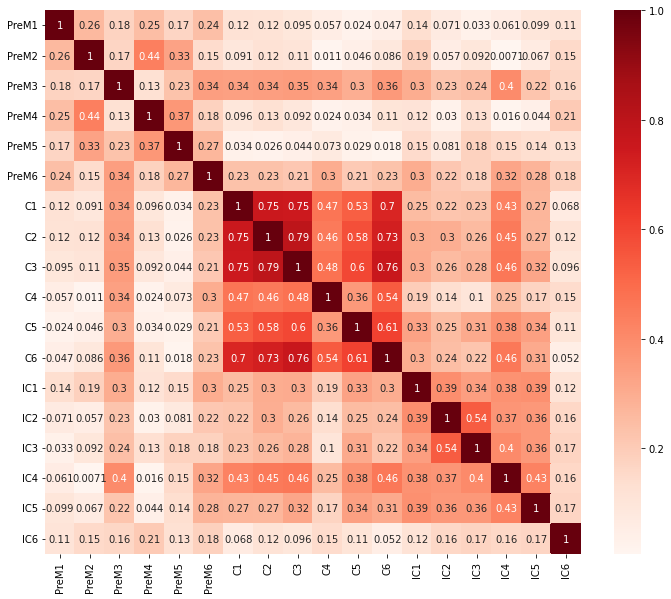

In [ ]:
correlation_matrix(df10)

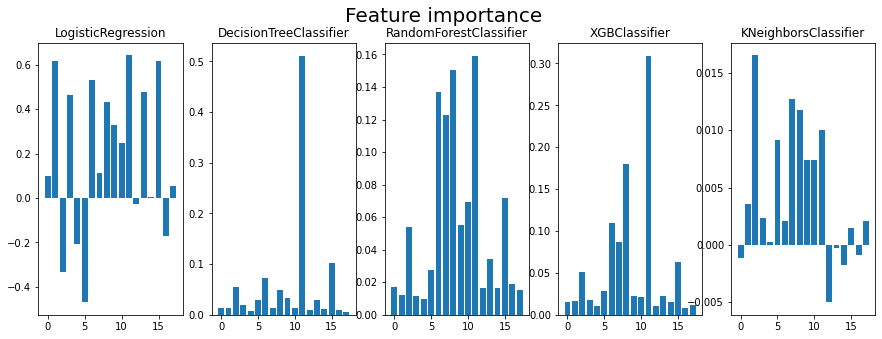

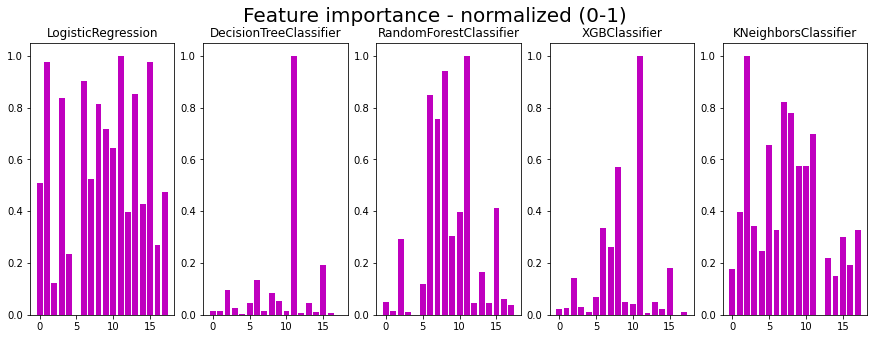

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   7 |   11 |      11 |   11 |    11 |    11 |     11 |     2 |
|  11 |    6 |      15 |    1 |    15 |     8 |      8 |     7 |
|   8 |    8 |       6 |   15 |     6 |     6 |      6 |     8 |
|   6 |    7 |       2 |    6 |     2 |     7 |      7 |    11 |
|   9 |    9 |       8 |   13 |     8 |    15 |     15 |     5 |
|   2 |    2 |       5 |    3 |     9 |    10 |      2 |     9 |
|  10 |   10 |       9 |    8 |    13 |     9 |      5 |    10 |
|   5 |   15 |       1 |    9 |     5 |     2 |     13 |     1 |
|  15 |   13 |      10 |   10 |     3 |    13 |      9 |     3 |
|  13 |    5 |      12 |    7 |     0 |     5 |     10 |    17 |
|  16 |   12 |      16 |    0 |     7 |    16 |      3 |     6 |
|  12 |   16 |      14 |   17 |     1 |     0 |      1 |    15 |
|  14 |   14 |      13 |   14 |    10 |    14 |      0 |     4 |
|   1 |    0 |       7 | 

Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=11)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=11)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   7 |   11 |      11 |   11 |    11 |    11 |     11 |     2 |
|  11 |    6 |      15 |    1 |    15 |     8 |      8 |     7 |
|   8 |    8 |       6 |   15 |     6 |     6 |      6 |     8 |
|   6 |    7 |       2 |    6 |     2 |     7 |      7 |    11 |
|   9 |    9 |       8 |   13 |     8 |    15 |     15 |     5 |
|   2 |    2 |       5 |    3 |     9 |    10 |      2 |     9 |
|  10 |   10 |       9 |    8 |    13 |     9 |      5 |    10 |
|   5 |   15 |       1 |    9 |     5 |     2 |     13 |     1 |
|  15 |   13 |      10 |   10 |     3 |    13 |      9 |     3 |
|  13 |    5 |      12 |    7 |     0 |     5 |     10 |    17 |
|  16 |   12 |      16 |    0 |     7 |    16 |      3 |     6 |
|  12 |   16 |      14 |   17 |     1 |     0 |      1 |    15 |
|  14 |   14 |      13 |   14 |    10 |    14 |      0 |     4 |
|   1 |    0 |       7 | 

Second iteration of tfidf transformation:

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=8)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|  11 |   11 |      11 |   11 |    11 |    11 |     11 |    11 |
|   8 |    8 |       8 |    8 |     8 |     8 |      8 |     8 |
|   6 |    6 |       6 |    6 |     6 |     6 |      6 |     6 |
|   7 |    7 |      15 |   15 |    15 |    15 |     15 |     7 |
|   9 |    9 |       9 |    9 |     9 |     7 |      7 |     2 |
|  15 |   15 |       2 |    7 |     7 |     9 |      9 |     9 |
|   2 |    2 |       7 |   13 |     2 |     2 |      2 |    15 |
|  10 |   10 |      10 |   10 |    13 |    10 |      5 |    10 |
|   5 |   13 |       5 |    1 |    10 |    13 |     10 |     5 |
|  13 |    5 |      13 |    2 |     5 |     5 |     13 |    13 |
|   1 |   12 |       1 |    3 |     1 |    16 |      1 |     1 |
|  16 |    1 |      12 |    0 |     3 |     0 |      3 |     3 |
|  12 |   16 |      16 |   14 |     0 |    14 |      0 |    16 |
|  14 |   14 |      14 | 

In [ ]:
cumulative = ensemble(ranks, df10)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| C6        |   11 | ***            |
| C3        |    8 | ***            |
| C1        |    6 | ***            |
| IC4       |   15 | ***            |
| C2        |    7 | ***            |
| PreM3     |    2 | ***            |
| C4        |    9 | ***            |
| C5        |   10 | ***            |
| PreM6     |    5 | ***            |
| IC2       |   13 | ***            |
| PreM2     |    1 | ***            |
| PreM4     |    3 | **             |
| IC5       |   16 | ***            |
| IC3       |   14 | ***            |
| IC1       |   12 | ***            |
| PreM1     |    0 | -              |
| IC6       |   17 | **             |
| PreM5     |    4 | *              |


In [ ]:
ensemble_increasingwindow(ranks, df10)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| C6        |   11 | ***            |
| C2        |    7 | ***            |
| C3        |    8 | ***            |
| C1        |    6 | ***            |
| IC4       |   15 | ***            |
| PreM3     |    2 | ***            |
| C4        |    9 | ***            |
| PreM6     |    5 | ***            |
| C5        |   10 | ***            |
| IC2       |   13 | ***            |
| PreM2     |    1 | ***            |
| PreM4     |    3 | **             |
| IC5       |   16 | ***            |
| PreM1     |    0 | -              |
| IC1       |   12 | ***            |
| IC3       |   14 | ***            |
| IC6       |   17 | **             |
| PreM5     |    4 | *              |


In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df10)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| C6        |   11 | ***            |
| C3        |    8 | ***            |
| C1        |    6 | ***            |
| IC4       |   15 | ***            |
| C2        |    7 | ***            |
| C4        |    9 | ***            |
| PreM3     |    2 | ***            |
| C5        |   10 | ***            |
| IC2       |   13 | ***            |
| PreM6     |    5 | ***            |
| PreM2     |    1 | ***            |
| PreM4     |    3 | **             |
| IC5       |   16 | ***            |
| IC3       |   14 | ***            |
| IC1       |   12 | ***            |
| PreM1     |    0 | -              |
| IC6       |   17 | **             |
| PreM5     |    4 | *              |


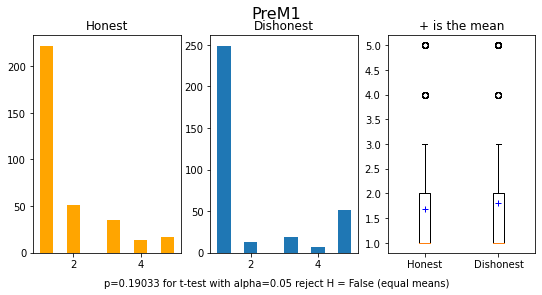

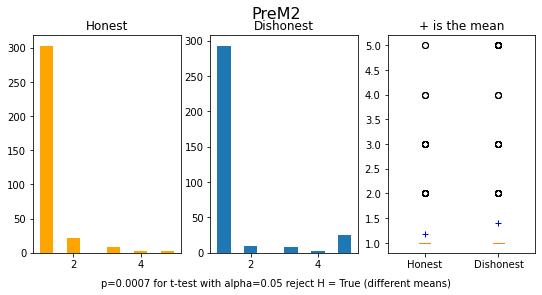

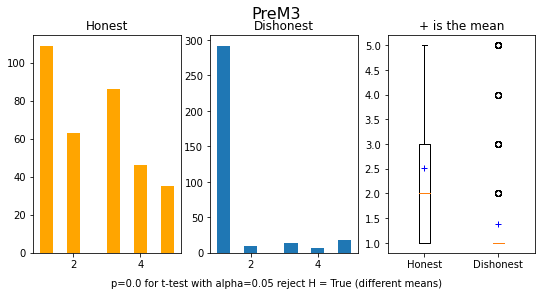

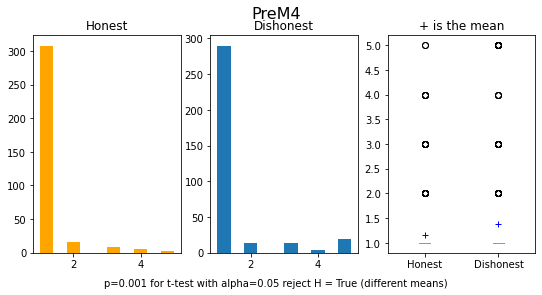

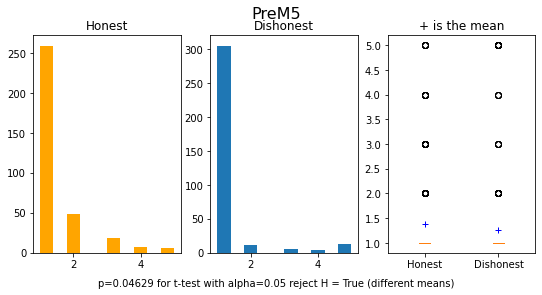

...

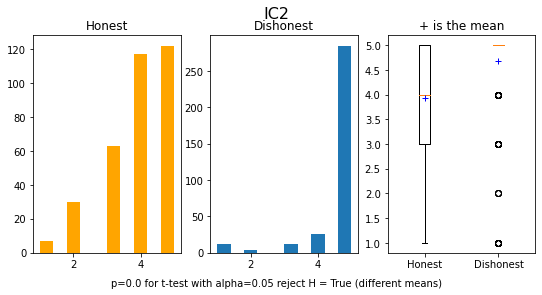

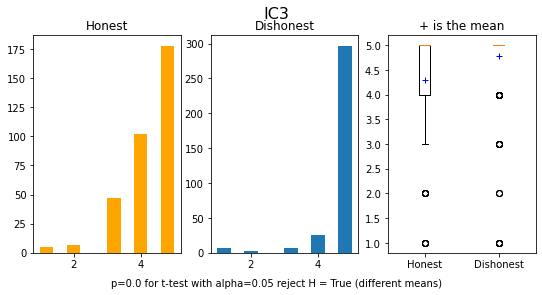

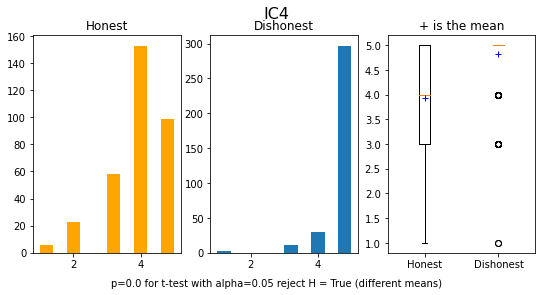

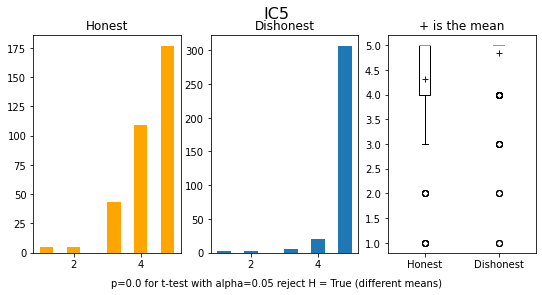

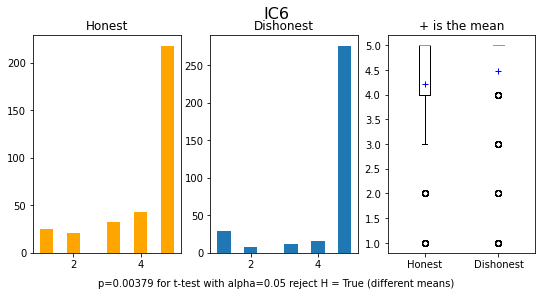

In [ ]:
plots(df10)

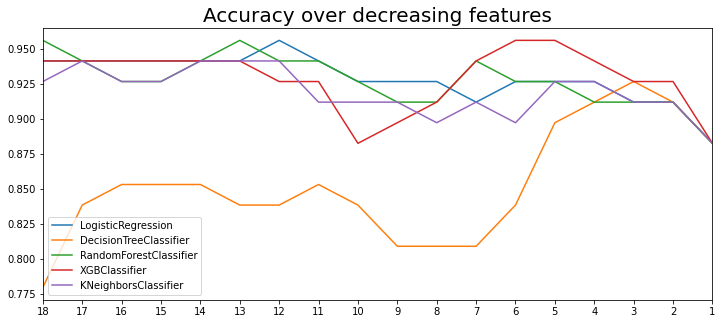

In [ ]:
plot_accuracies(df10, cumulative)

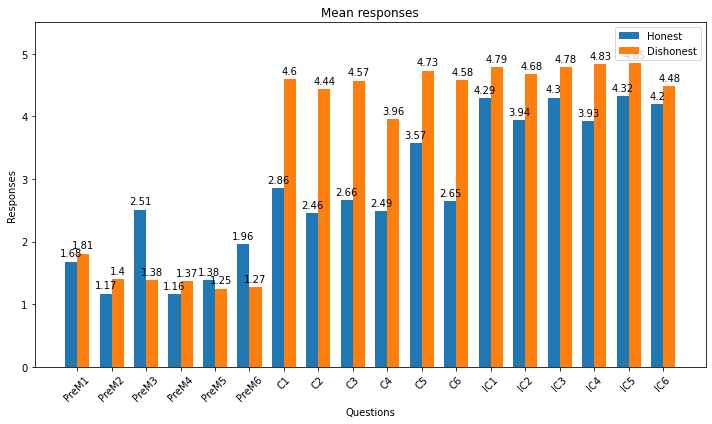

In [ ]:
n,p = df10.shape # extract dimensions

rows_honest = df10.iloc[:n//2,:-1]
rows_disonest = df10.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df10.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 3 - Modelling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.94
There were 4 errors on 68 predictions


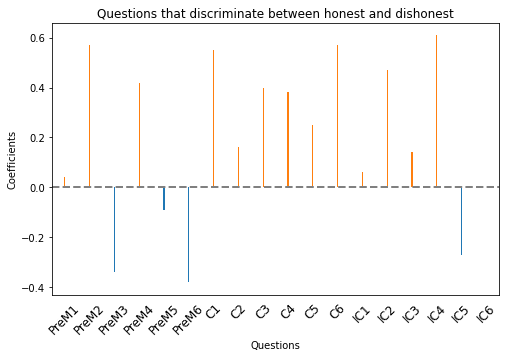

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df10.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df10.columns)[:-1],
                       rotation=45, fontsize=12)


In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df10["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df10["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,PreM1,PreM2,PreM3,PreM4,PreM5,PreM6,C1,C2,C3,C4,C5,C6,IC1,IC2,IC3,IC4,IC5,IC6,CONDITION,Prediction
527,1,1,4,1,1,1,4,3,3,3,5,4,3,4,4,4,4,5,D,H
55,3,2,4,1,5,3,3,3,3,3,5,5,5,5,5,5,3,1,H,D
652,1,1,1,1,1,1,1,1,2,1,5,5,5,5,5,5,5,5,D,H
355,2,1,3,1,1,1,3,2,2,3,3,2,4,3,4,4,4,5,D,H


### PCA


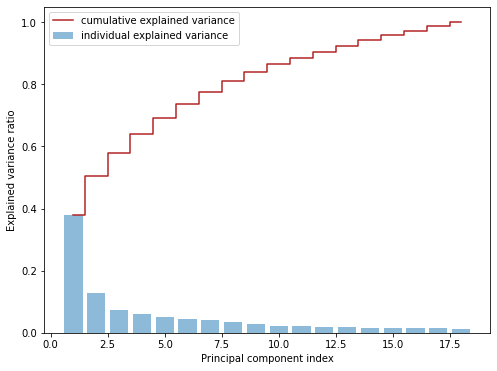

number of components based on eigenvalue higher than 1 is: 6
n = 6, tot explained variance: 0.736
      PC   exp_var    cumvar  eigenvalue
0    1.0  0.377735  0.377735    8.685220
1    2.0  0.128372  0.506106    2.951640
2    3.0  0.072372  0.578478    1.664035
3    4.0  0.060682  0.639160    1.395267
4    5.0  0.051599  0.690759    1.186412
5    6.0  0.045408  0.736167    1.044067
6    7.0  0.040578  0.776746    0.933016
7    8.0  0.034557  0.811303    0.794565
8    9.0  0.029314  0.840617    0.674025
9   10.0  0.023414  0.864031    0.538345
10  11.0  0.021599  0.885629    0.496615
11  12.0  0.019677  0.905306    0.452424
12  13.0  0.019209  0.924515    0.441662
13  14.0  0.017047  0.941562    0.391960
14  15.0  0.016107  0.957669    0.370346
15  16.0  0.015086  0.972755    0.346873
16  17.0  0.014420  0.987175    0.331568
17  18.0  0.012825  1.000000    0.294880


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df10, X_train, y)
print(pca_info)

Accuracy: 0.903 (0.038)


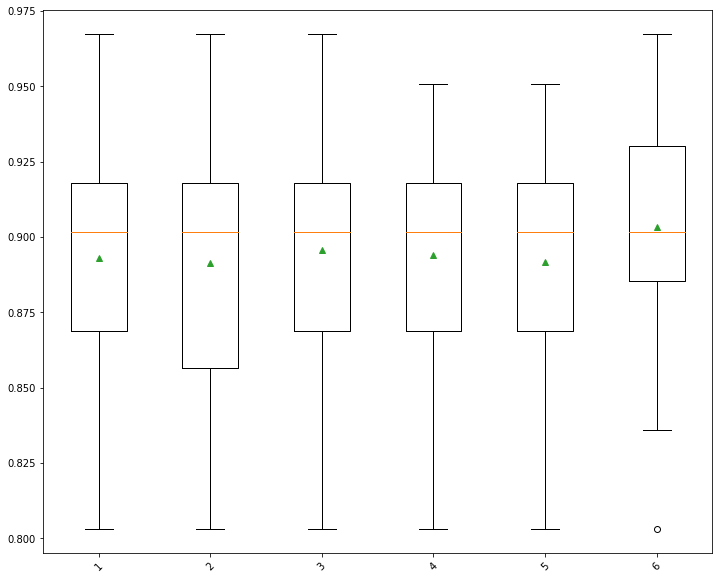

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 3, tot explained variance: 0.578
        PC0       PC1       PC2
0 -2.995062  4.547103 -0.535973
1  1.152999  1.098540  2.410915
2  4.573161  0.900078  0.047704
3 -3.810893 -0.891590  0.452899
4  0.477318  2.044391 -2.741350
val score:  0.8934426229508198
best params:  {'max_depth': 100}
f1s:  0.9117647058823529
              precision    recall  f1-score   support

           0       0.91      0.91      0.91        33
           1       0.91      0.91      0.91        35

    accuracy                           0.91        68
   macro avg       0.91      0.91      0.91        68
weighted avg       0.91      0.91      0.91        68



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


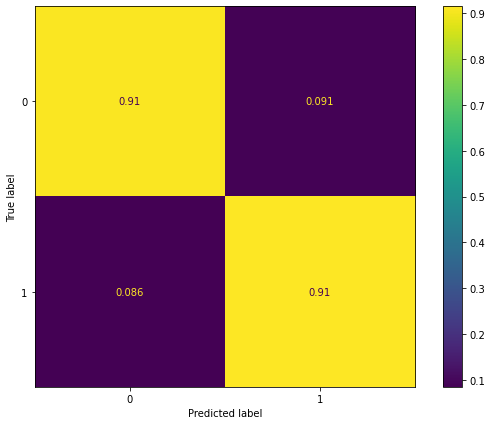

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 3)

# 11. IESR

In [ ]:
df11 = get_dataset("./datasets/9. IESR/")
# X, y = pandas_to_numpy(df1)

y = np.array([1 if c == "D" else 0 for c in df11["CONDITION"]]) # create response array
X = df11.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    179
1    179
dtype: int64


## 2 - Explanatory Data Analysis

correlation of the features:
8


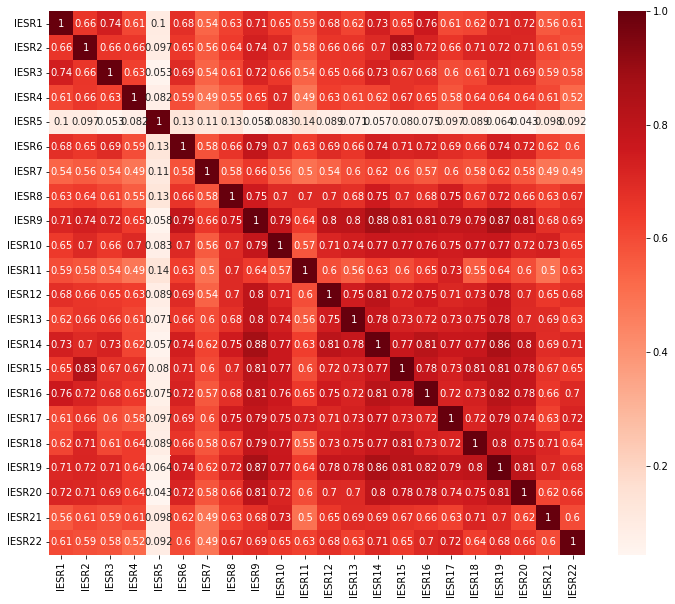

In [ ]:
correlation_matrix(df11)

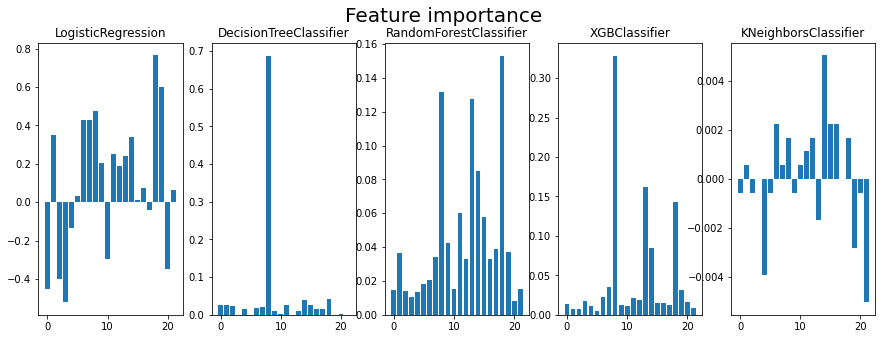

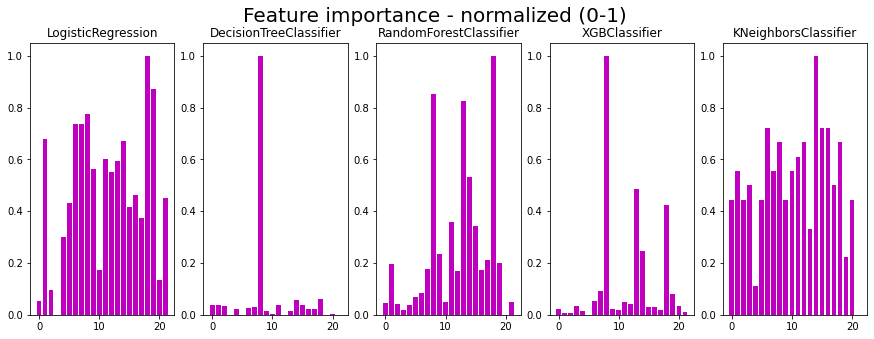

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|  18 |    8 |       8 |   18 |     8 |    18 |      8 |    14 |
|   8 |   18 |      18 |   19 |    18 |     8 |     13 |     6 |
|  14 |   13 |      14 |    8 |    14 |    13 |     18 |    15 |
|  13 |   19 |      11 |    7 |     0 |    14 |     14 |    16 |
|  19 |   14 |       6 |    6 |     1 |    11 |      7 |     8 |
|  16 |   15 |      15 |    1 |    15 |    15 |     19 |    12 |
|  12 |   17 |      19 |   14 |    11 |     9 |      6 |    18 |
|   1 |    9 |       7 |   11 |     2 |    17 |     11 |    11 |
|  11 |   11 |      16 |   13 |     7 |    19 |     12 |     1 |
|  17 |   16 |      13 |    9 |     6 |     1 |      3 |     7 |
|   7 |    1 |      17 |   12 |    16 |     7 |     20 |    10 |
|  15 |   12 |      12 |   16 |    17 |    16 |     15 |     3 |
|  21 |    7 |       5 |   21 |     4 |    12 |     16 |    17 |
|   9 |    5 |       4 | 

Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=18)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=18)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|  18 |    8 |       8 |   18 |     8 |    18 |      8 |    14 |
|   8 |   18 |      18 |   19 |    18 |     8 |     13 |     6 |
|  14 |   13 |      14 |    8 |    14 |    13 |     18 |    15 |
|  13 |   19 |      11 |    7 |     0 |    14 |     14 |    16 |
|  19 |   14 |       6 |    6 |     1 |    11 |      7 |     8 |
|  16 |   15 |      15 |    1 |    15 |    15 |     19 |    12 |
|  12 |   17 |      19 |   14 |    11 |     9 |      6 |    18 |
|   1 |    9 |       7 |   11 |     2 |    17 |     11 |    11 |
|  11 |   11 |      16 |   13 |     7 |    19 |     12 |     1 |
|  17 |   16 |      13 |    9 |     6 |     1 |      3 |     7 |
|   7 |    1 |      17 |   12 |    16 |     7 |     20 |    10 |
|  15 |   12 |      12 |   16 |    17 |    16 |     15 |     3 |
|  21 |    7 |       5 |   21 |     4 |    12 |     16 |    17 |
|   9 |    5 |       4 | 

Second iteration of tfidf transformation:

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=8)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   8 |    8 |       8 |    8 |     8 |     8 |      8 |     8 |
|  18 |   18 |      18 |   18 |    18 |    18 |     18 |    18 |
|  14 |   14 |      14 |   14 |    14 |    14 |     14 |    14 |
|  11 |   11 |      11 |   11 |    11 |    11 |     11 |    11 |
|  13 |   15 |      15 |   13 |    15 |    15 |     13 |    15 |
|  15 |   13 |      13 |    7 |     7 |    13 |      7 |     7 |
|   7 |    7 |       7 |   15 |    13 |     7 |     15 |    16 |
|  16 |   16 |      19 |   19 |    16 |    19 |     19 |     6 |
|  19 |   19 |       6 |   16 |     6 |    16 |      6 |    13 |
|   1 |   17 |      16 |    6 |     1 |    17 |     16 |     1 |
|   6 |    1 |      17 |    1 |    17 |     1 |     12 |    17 |
|  12 |   12 |       1 |   12 |     9 |     6 |     17 |    12 |
|  17 |    9 |      12 |   17 |     0 |     9 |      9 |    10 |
|   9 |    5 |       9 | 

In [ ]:
cumulative = ensemble(ranks, df11)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| IESR9     |    8 | ***            |
| IESR19    |   18 | ***            |
| IESR15    |   14 | ***            |
| IESR12    |   11 | ***            |
| IESR14    |   13 | ***            |
| IESR16    |   15 | ***            |
| IESR8     |    7 | ***            |
| IESR20    |   19 | ***            |
| IESR17    |   16 | ***            |
| IESR7     |    6 | ***            |
| IESR2     |    1 | ***            |
| IESR13    |   12 | ***            |
| IESR18    |   17 | ***            |
| IESR10    |    9 | ***            |
| IESR6     |    5 | ***            |
| IESR1     |    0 | ***            |
| IESR3     |    2 | ***            |
| IESR11    |   10 | ***            |
| IESR21    |   20 | ***            |
| IESR4     |    3 | ***            |
| IESR22    |   21 | ***            |
| IESR5     |    4 | -              |


In [ ]:
ensemble_increasingwindow(ranks, df11)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| IESR9     |    8 | ***            |
| IESR19    |   18 | ***            |
| IESR15    |   14 | ***            |
| IESR14    |   13 | ***            |
| IESR20    |   19 | ***            |
| IESR7     |    6 | ***            |
| IESR16    |   15 | ***            |
| IESR12    |   11 | ***            |
| IESR8     |    7 | ***            |
| IESR2     |    1 | ***            |
| IESR17    |   16 | ***            |
| IESR13    |   12 | ***            |
| IESR18    |   17 | ***            |
| IESR10    |    9 | ***            |
| IESR1     |    0 | ***            |
| IESR6     |    5 | ***            |
| IESR3     |    2 | ***            |
| IESR4     |    3 | ***            |
| IESR11    |   10 | ***            |
| IESR21    |   20 | ***            |
| IESR22    |   21 | ***            |
| IESR5     |    4 | -              |


In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df11)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| IESR9     |    8 | ***            |
| IESR19    |   18 | ***            |
| IESR15    |   14 | ***            |
| IESR12    |   11 | ***            |
| IESR16    |   15 | ***            |
| IESR14    |   13 | ***            |
| IESR8     |    7 | ***            |
| IESR17    |   16 | ***            |
| IESR20    |   19 | ***            |
| IESR7     |    6 | ***            |
| IESR18    |   17 | ***            |
| IESR2     |    1 | ***            |
| IESR13    |   12 | ***            |
| IESR10    |    9 | ***            |
| IESR6     |    5 | ***            |
| IESR11    |   10 | ***            |
| IESR1     |    0 | ***            |
| IESR3     |    2 | ***            |
| IESR21    |   20 | ***            |
| IESR4     |    3 | ***            |
| IESR22    |   21 | ***            |
| IESR5     |    4 | -              |


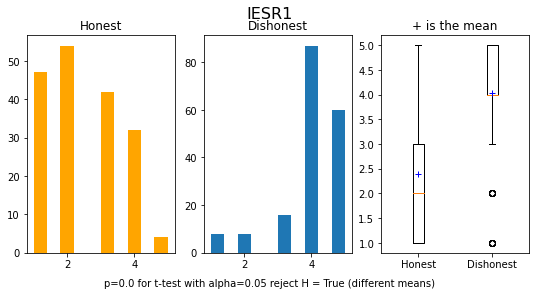

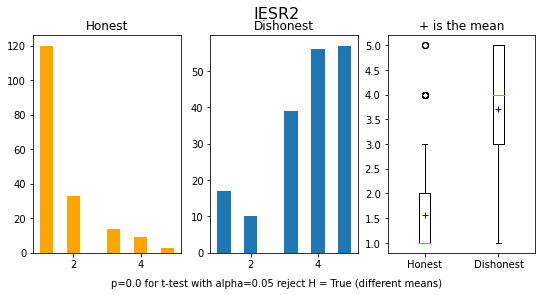

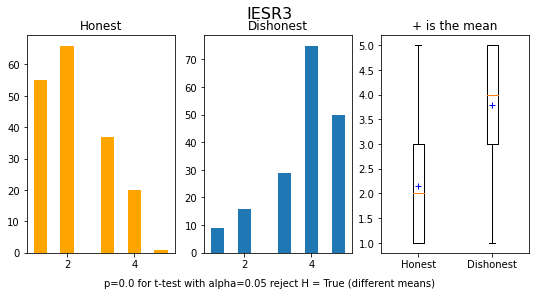

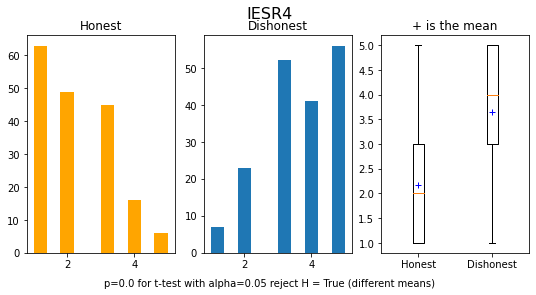

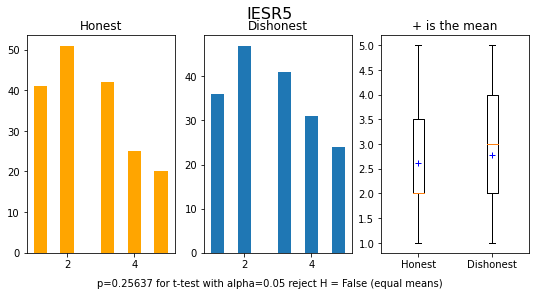

...

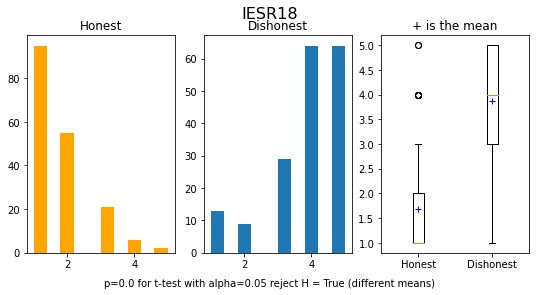

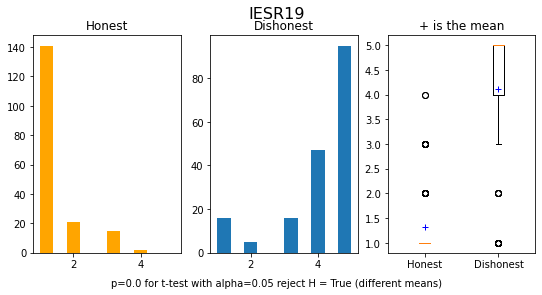

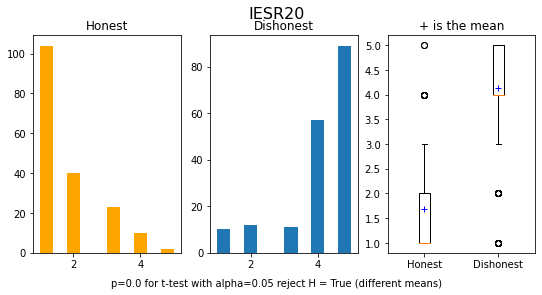

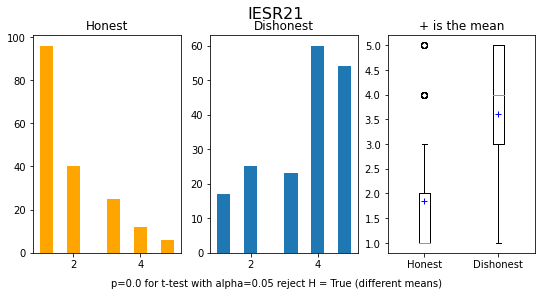

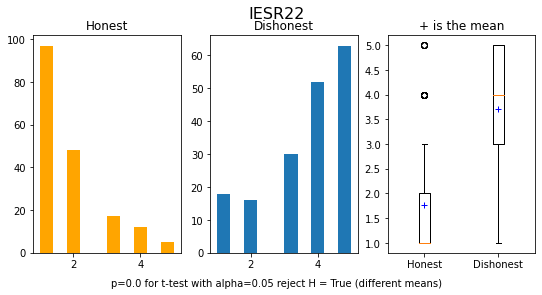

In [ ]:
plots(df11)

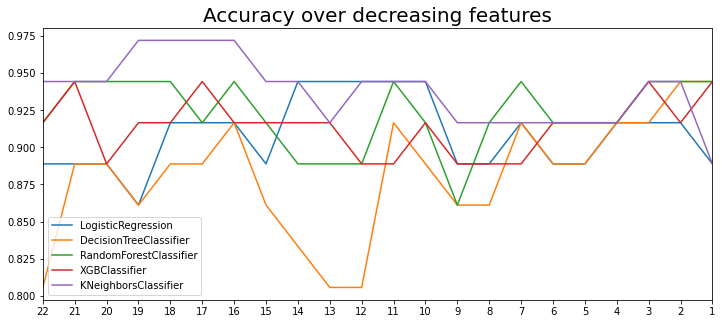

In [ ]:
plot_accuracies(df11, cumulative)

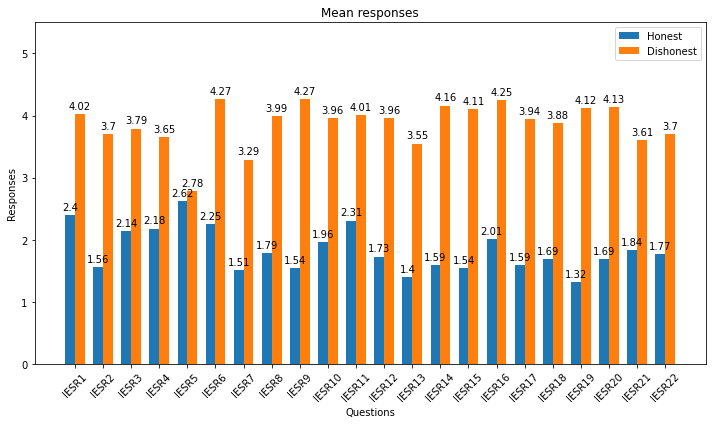

In [ ]:
n,p = df11.shape # extract dimensions

rows_honest = df11.iloc[:n//2,:-1]
rows_disonest = df11.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df11.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 3 - Modelling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.89
There were 4 errors on 36 predictions


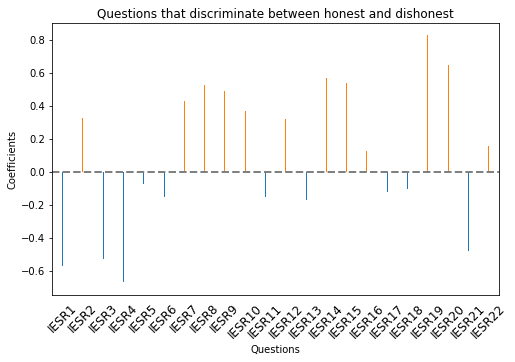

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df11.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df11.columns)[:-1],
                       rotation=45, fontsize=12)


In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df11["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df11["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,IESR1,IESR2,IESR3,IESR4,IESR5,IESR6,IESR7,IESR8,IESR9,IESR10,...,IESR15,IESR16,IESR17,IESR18,IESR19,IESR20,IESR21,IESR22,CONDITION,Prediction
126,4,1,4,1,3,2,1,4,2,1,...,1,4,1,1,1,5,1,2,H,D
234,1,1,1,1,1,2,3,1,2,2,...,1,3,1,1,1,2,2,1,D,H
147,4,3,2,2,1,1,1,1,2,3,...,4,5,1,1,3,2,1,4,H,D
266,3,1,3,2,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,D,H


### PCA


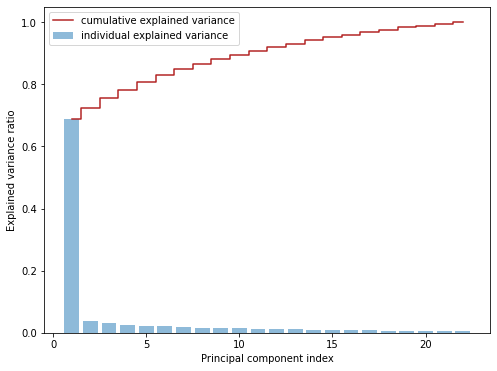

number of components based on eigenvalue higher than 1 is: 6
n = 6, tot explained variance: 0.829
      PC   exp_var    cumvar  eigenvalue
0    1.0  0.687294  0.687294   34.889791
1    2.0  0.036941  0.724234    1.875249
2    3.0  0.032515  0.756750    1.650600
3    4.0  0.025990  0.782739    1.319341
4    5.0  0.023453  0.806192    1.190557
5    6.0  0.022772  0.828964    1.156016
6    7.0  0.019250  0.848214    0.977200
7    8.0  0.016971  0.865185    0.861525
8    9.0  0.015062  0.880248    0.764621
9   10.0  0.014511  0.894759    0.736644
10  11.0  0.012561  0.907320    0.637636
11  12.0  0.012399  0.919719    0.629442
12  13.0  0.011527  0.931246    0.585140
13  14.0  0.010532  0.941777    0.534634
14  15.0  0.009200  0.950977    0.467022
15  16.0  0.009040  0.960017    0.458882
16  17.0  0.008633  0.968650    0.438230
17  18.0  0.007286  0.975935    0.369848
18  19.0  0.006984  0.982919    0.354521
19  20.0  0.006151  0.989070    0.312242
20  21.0  0.005759  0.994828    0.292336


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df11, X_train, y)
print(pca_info)

Accuracy: 0.931 (0.042)


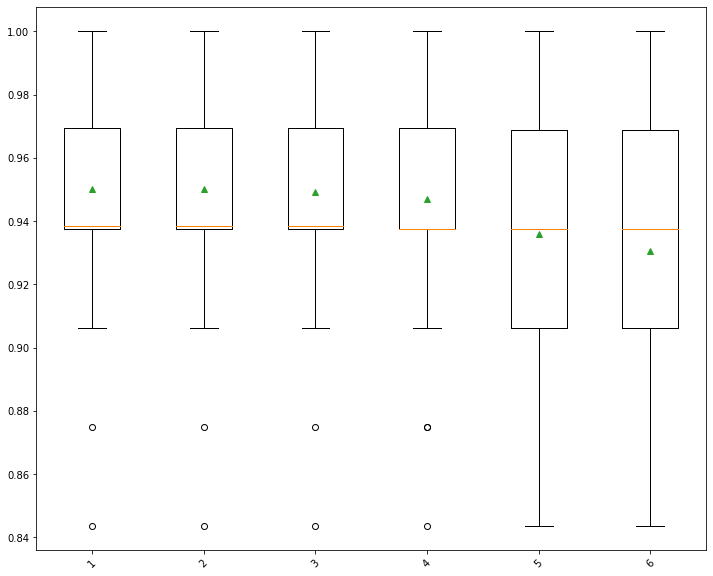

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 1, tot explained variance: 0.687
        PC0
0 -7.806274
1 -1.229336
2 -4.816992
3 -5.204025
4  0.373021
val score:  0.9287019230769232
best params:  {'max_depth': 10}
f1s:  0.9164724164724165
              precision    recall  f1-score   support

           0       0.90      0.95      0.92        19
           1       0.94      0.88      0.91        17

    accuracy                           0.92        36
   macro avg       0.92      0.91      0.92        36
weighted avg       0.92      0.92      0.92        36



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


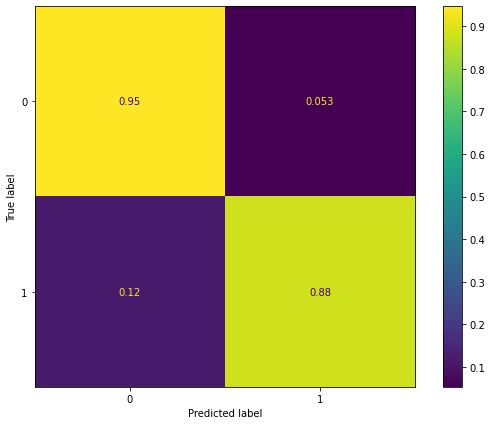

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 1)

# 12. R_NEO_PI
## (fake good)

In [ ]:
df12 = get_dataset("./datasets/10. R_NEO_PI/")
#X, y = pandas_to_numpy(df12)

y = np.array([1 if c == "D" else 0 for c in df12["CONDITION"]]) # create response array
X = df12.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

1    67174
0    10513
dtype: int64


## 2 - Explanatory Data Analysis

correlation of the features:
0


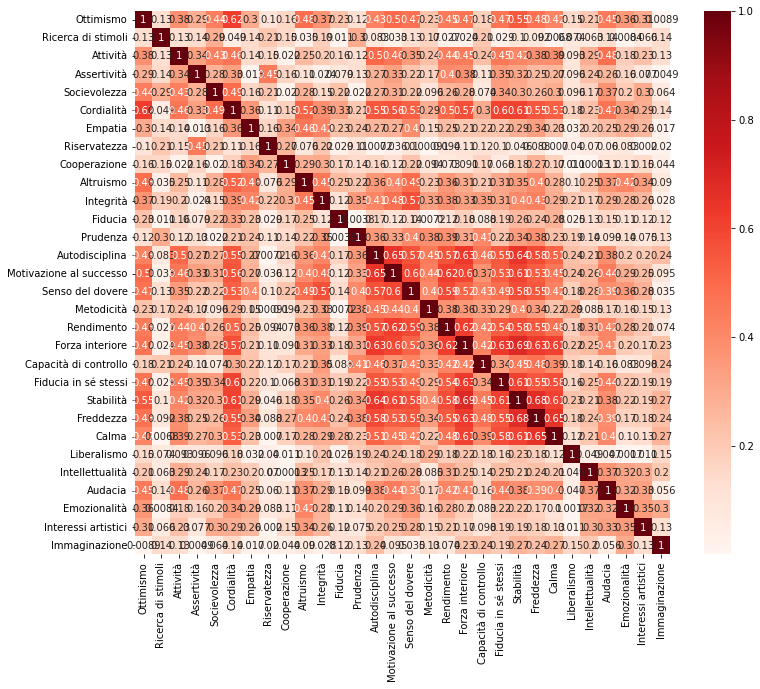

In [ ]:
correlation_matrix(df12)

KeyboardInterrupt: ignored

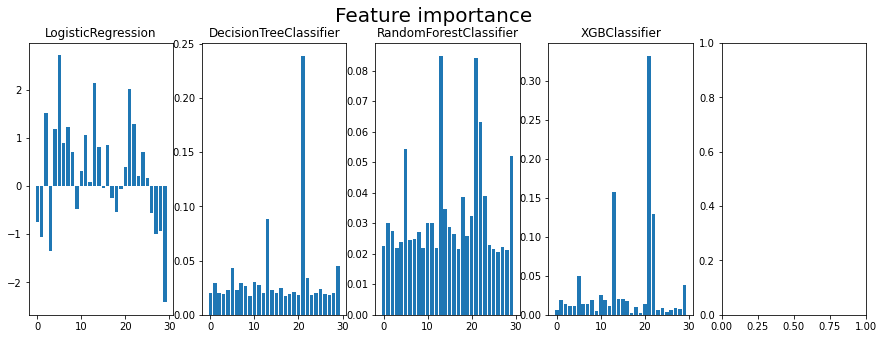

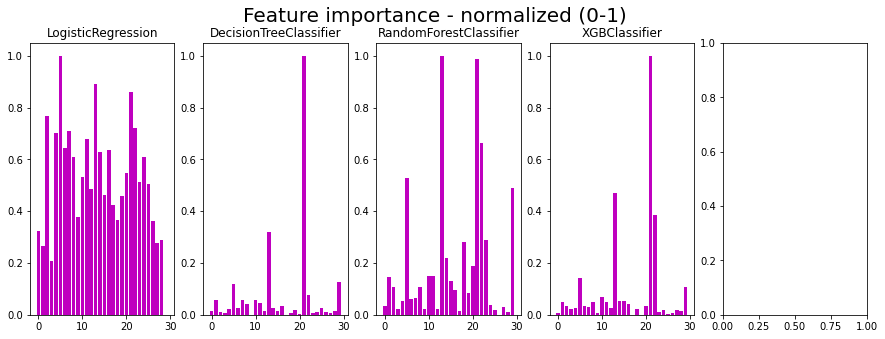

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|  13 |   10 |       9 |    2 |     9 |    13 |      9 |     9 |
|   9 |   16 |      10 |   20 |    13 |     9 |     13 |    17 |
|  10 |    9 |      13 |   22 |    10 |    10 |     10 |    13 |
|  16 |   13 |       8 |   17 |     0 |     6 |      8 |    16 |
|   4 |   11 |      25 |   23 |     8 |     8 |      6 |    24 |
|   1 |   14 |       2 |    5 |     2 |    16 |     25 |    15 |
|   6 |   12 |      11 |   24 |    11 |     4 |     16 |    22 |
|   8 |    8 |       6 |   15 |    25 |     1 |     24 |     2 |
|  14 |    1 |      21 |   18 |     4 |    25 |      7 |    19 |
|  12 |   17 |       0 |    0 |     6 |    14 |     11 |    25 |
|  11 |   24 |      14 |   14 |    21 |    17 |     15 |    21 |
|   7 |    2 |      15 |    7 |    22 |    12 |     17 |     8 |
|  15 |   21 |      23 |   21 |    15 |    24 |      2 |     1 |
|  25 |   26 |      12 | 

Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=8)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=8)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|  13 |   10 |       9 |    2 |     9 |    13 |      9 |     9 |
|   9 |   16 |      10 |   20 |    13 |     9 |     13 |    17 |
|  10 |    9 |      13 |   22 |    10 |    10 |     10 |    13 |
|  16 |   13 |       8 |   17 |     0 |     6 |      8 |    16 |
|   4 |   11 |      25 |   23 |     8 |     8 |      6 |    24 |
|   1 |   14 |       2 |    5 |     2 |    16 |     25 |    15 |
|   6 |   12 |      11 |   24 |    11 |     4 |     16 |    22 |
|   8 |    8 |       6 |   15 |    25 |     1 |     24 |     2 |
|  14 |    1 |      21 |   18 |     4 |    25 |      7 |    19 |
|  12 |   17 |       0 |    0 |     6 |    14 |     11 |    25 |
|  11 |   24 |      14 |   14 |    21 |    17 |     15 |    21 |
|   7 |    2 |      15 |    7 |    22 |    12 |     17 |     8 |
|  15 |   21 |      23 |   21 |    15 |    24 |      2 |     1 |
|  25 |   26 |      12 | 

Second iteration of tfidf transformation:

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=8)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   9 |    9 |       9 |    9 |     9 |     9 |      9 |     9 |
|   8 |    8 |       8 |    8 |     8 |     8 |      8 |     8 |
|  13 |   13 |      13 |    2 |    13 |    13 |     13 |    13 |
|  10 |   10 |      10 |   17 |    10 |    10 |     10 |    16 |
|  16 |   16 |       2 |   24 |     2 |    16 |     16 |     2 |
|  25 |    2 |      16 |   14 |    16 |    25 |      2 |    25 |
|  14 |   14 |      25 |   15 |    25 |     2 |     25 |    17 |
|   4 |   17 |      11 |   25 |    11 |    17 |     24 |    10 |
|  11 |   11 |      14 |    0 |     6 |     6 |     17 |    24 |
|   6 |   24 |       6 |   16 |     4 |    14 |      6 |     4 |
|  17 |   25 |      17 |    4 |     0 |     4 |     11 |    15 |
|   2 |    4 |       0 |   23 |    21 |    24 |     14 |    21 |
|  15 |    6 |      24 |   21 |    15 |    11 |     15 |     0 |
|   0 |   21 |      21 | 

In [ ]:
cumulative = ensemble(ranks, df12)

| Feature                 |   _n | Significance   |
|-------------------------+------+----------------|
| Altruismo               |    9 | ***            |
| Autodisciplina          |   13 | ***            |
| Integrità               |   10 | ***            |
| Cooperazione            |    8 | ***            |
| Metodicità              |   16 | ***            |
| Attività                |    2 | ***            |
| Intellettualità         |   25 | ***            |
| Rendimento              |   17 | ***            |
| Fiducia                 |   11 | ***            |
| Empatia                 |    6 | ***            |
| Liberalismo             |   24 | ***            |
| Motivazione al successo |   14 | ***            |
| Socievolezza            |    4 | ***            |
| Senso del dovere        |   15 | ***            |
| Ottimismo               |    0 | ***            |
| Stabilità               |   21 | ***            |
| Prudenza                |   12 | ***            |
| Ricerca di

In [ ]:
ensemble_increasingwindow(ranks, df12)

IndexError: ignored

In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df12)

| Feature                 |   _n | Significance   |
|-------------------------+------+----------------|
| Altruismo               |    9 | ***            |
| Cooperazione            |    8 | ***            |
| Autodisciplina          |   13 | ***            |
| Integrità               |   10 | ***            |
| Metodicità              |   16 | ***            |
| Attività                |    2 | ***            |
| Intellettualità         |   25 | ***            |
| Rendimento              |   17 | ***            |
| Motivazione al successo |   14 | ***            |
| Liberalismo             |   24 | ***            |
| Fiducia                 |   11 | ***            |
| Socievolezza            |    4 | ***            |
| Empatia                 |    6 | ***            |
| Ottimismo               |    0 | ***            |
| Senso del dovere        |   15 | ***            |
| Stabilità               |   21 | ***            |
| Prudenza                |   12 | ***            |
| Calma     

/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tupl

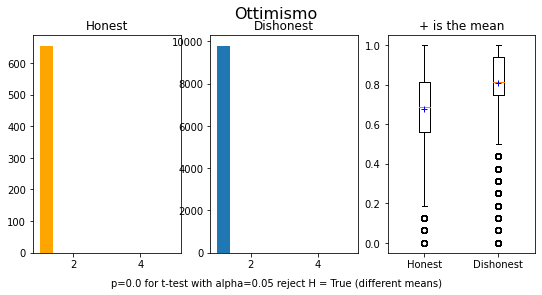

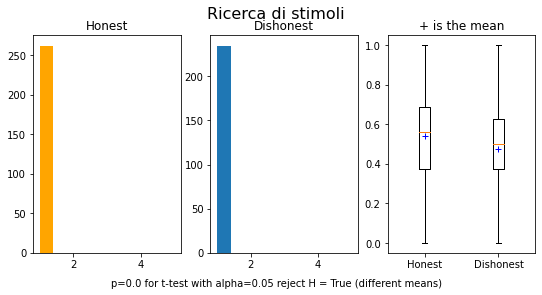

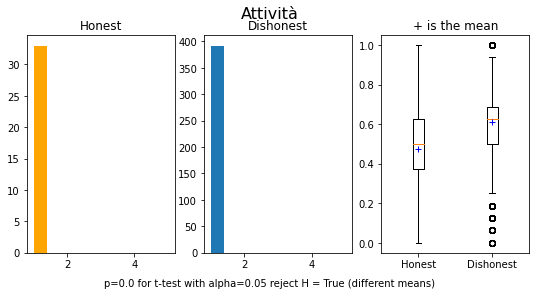

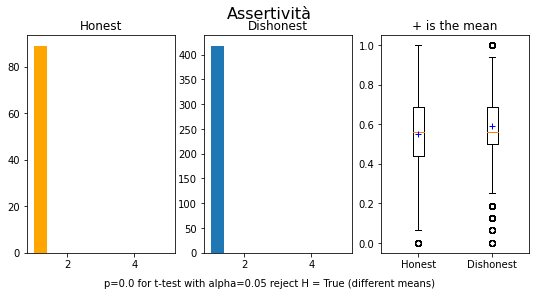

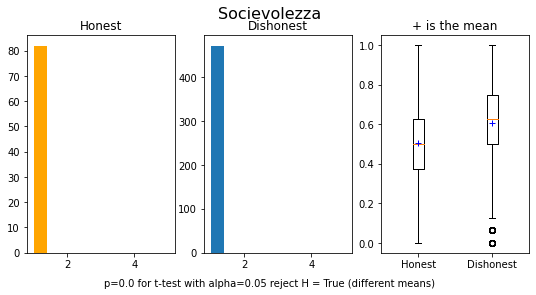

...

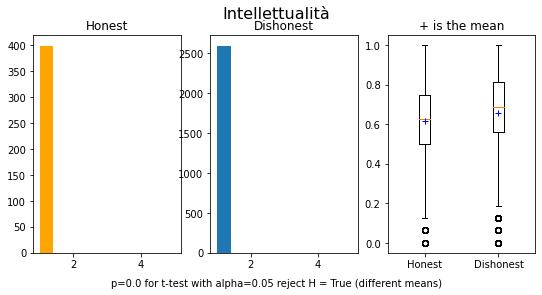

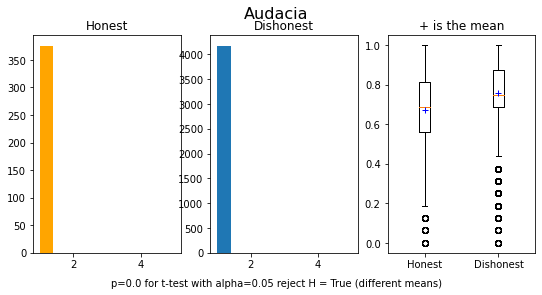

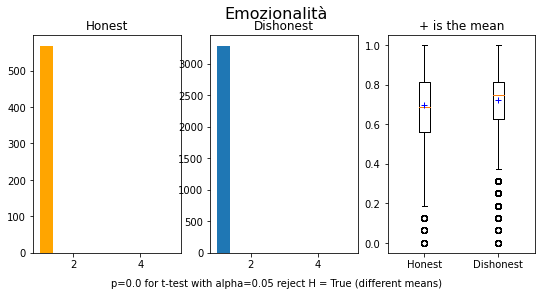

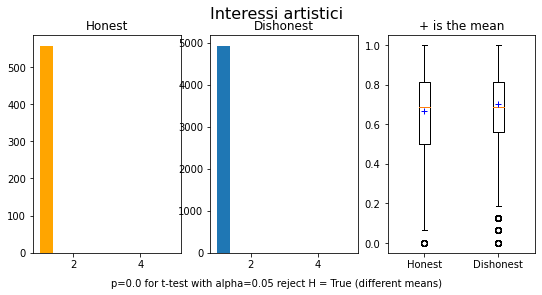

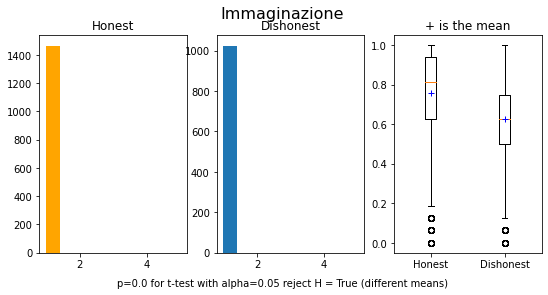

In [ ]:
plots(df12)

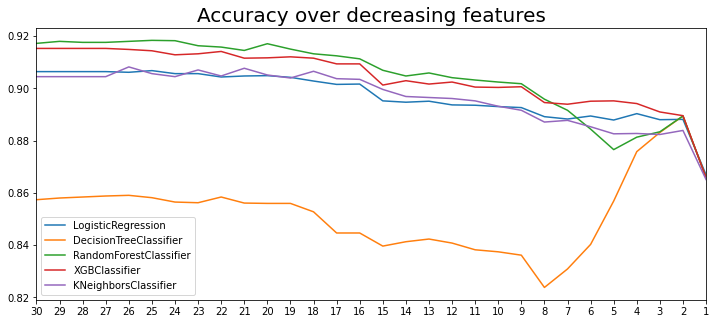

In [ ]:
plot_accuracies(df12, cumulative)

<ipython-input-255-68e4dbc97839>:43: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout()


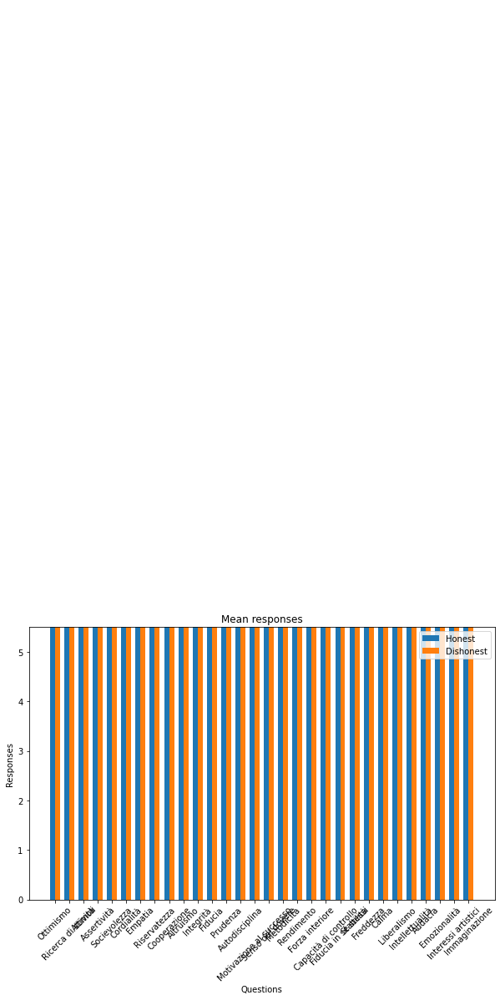

In [ ]:
n,p = df12.shape # extract dimensions

rows_honest = df12.iloc[:n//2,:-1]
rows_disonest = df12.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df12.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 3 - Modelling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.91
There were 705 errors on 7769 predictions


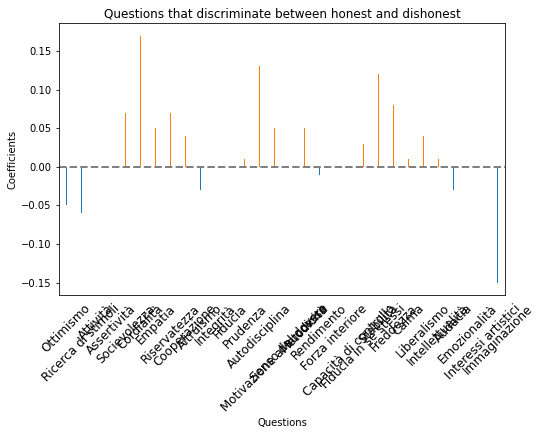

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df12.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df12.columns)[:-1],
                       rotation=45, fontsize=12)


In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df12["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df12["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,Ottimismo,Ricerca di stimoli,Attività,Assertività,Socievolezza,Cordialità,Empatia,Riservatezza,Cooperazione,Altruismo,...,Freddezza,Calma,Liberalismo,Intellettualità,Audacia,Emozionalità,Interessi artistici,Immaginazione,CONDITION,Prediction
62620,5,14,7,9,11,11,10,11,16,12,...,6,10,12,12,11,8,12,11,D,H
68489,15,15,13,11,13,17,16,13,14,16,...,12,13,12,16,18,18,15,18,H,D
77017,16,7,11,15,12,10,18,11,14,17,...,13,7,13,13,13,15,16,16,H,D
71417,17,7,11,12,11,17,19,15,16,18,...,13,12,12,13,16,18,15,16,H,D
71103,14,8,14,13,13,17,18,16,15,19,...,16,15,11,12,16,15,16,11,H,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71333,13,10,12,12,11,15,20,17,17,20,...,17,13,10,18,15,20,18,20,H,D
71151,13,6,11,11,11,15,14,11,11,8,...,15,10,9,12,16,17,15,13,H,D
68158,14,11,9,13,16,14,15,12,14,14,...,14,10,17,14,12,14,19,16,H,D
73052,20,8,15,8,14,18,14,10,16,19,...,11,14,12,5,19,19,13,16,H,D


### PCA


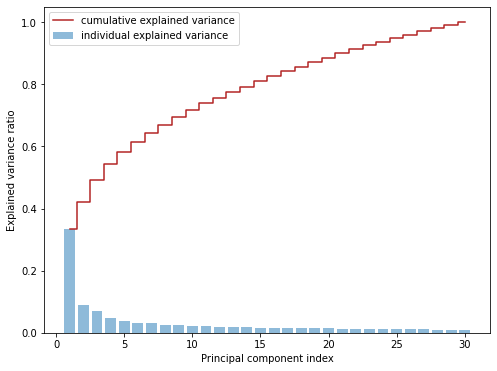

number of components based on eigenvalue higher than 1 is: 30
n = 30, tot explained variance: 1.0
      PC   exp_var    cumvar  eigenvalue
0    1.0  0.333063  0.333063   73.207932
1    2.0  0.088528  0.421591   19.458703
2    3.0  0.071280  0.492871   15.667400
3    4.0  0.049060  0.541931   10.783538
4    5.0  0.039467  0.581398    8.674893
5    6.0  0.032528  0.613926    7.149769
6    7.0  0.030053  0.643979    6.605613
7    8.0  0.025941  0.669920    5.701889
8    9.0  0.024022  0.693941    5.280010
9   10.0  0.023010  0.716951    5.057600
10  11.0  0.021627  0.738578    4.753640
11  12.0  0.018408  0.756986    4.046146
12  13.0  0.017798  0.774784    3.912053
13  14.0  0.017474  0.792259    3.840870
14  15.0  0.016858  0.809117    3.705513
15  16.0  0.016790  0.825907    3.690512
16  17.0  0.016120  0.842027    3.543110
17  18.0  0.015170  0.857196    3.334349
18  19.0  0.014679  0.871875    3.226427
19  20.0  0.014338  0.886213    3.151417
20  21.0  0.013398  0.899611    2.944878


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df12, X_train, y)
print(pca_info)

Accuracy: 0.908 (0.002)


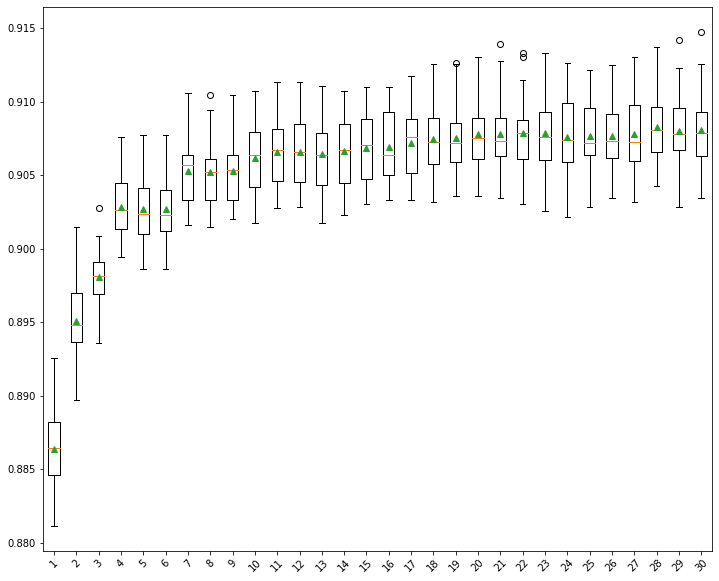

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 28, tot explained variance: 0.981
         PC0       PC1       PC2       PC3       PC4       PC5       PC6  \
0  -6.664199  4.131773  0.403209 -3.212387 -2.642853 -1.708988  1.775135   
1   4.991949  5.234233 -4.241996 -0.593736 -1.482142  0.926684  2.943595   
2  -4.586770 -1.649773  4.984583  2.355774 -2.055823  0.159587  2.546432   
3  17.560650 -0.570700  5.642094 -2.111705 -1.018513 -0.579565 -2.100105   
4  -2.986617 -5.399085  5.580699 -0.458854  0.802903 -0.908685  0.002385   

        PC7       PC8       PC9  ...      PC18      PC19      PC20      PC21  \
0 -5.032909  0.061620  3.156062  ... -0.263429  0.718597 -1.116938 -1.177223   
1  1.133647  1.636874  2.402203  ... -0.319346  1.174240  1.623708 -2.377961   
2 -1.961960 -2.433000  1.521774  ... -2.137321  1.346958  2.710459 -1.501081   
3  0.292695  0.579979 -0.512435  ...  0.994283  1.527316 -0.709005 -1.287380   
4  1.406548  0.704097 -2.150764  ... -2.918603 -0.909845 -2.349949 -1.049330   

       PC22      PC23   

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


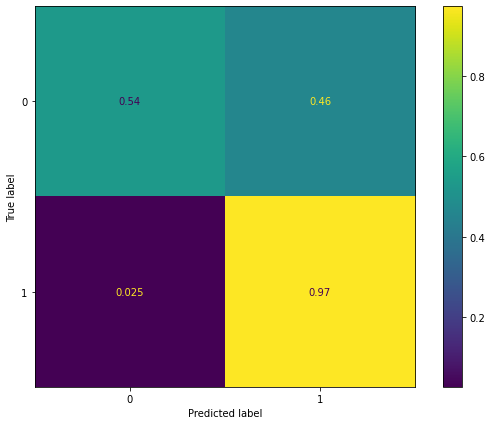

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 28)

# 13. DDDT
## (fake good)

In [ ]:
df13 = get_dataset("./datasets/11. DDDT/")
#X, y = pandas_to_numpy(df13)
y = np.array([1 if c == "D" else 0 for c in df13["CONDITION"]]) # create response array
X = df13.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    493
1    493
dtype: int64


## 2 - Explanatory Data Analysis

correlation of the features:
0


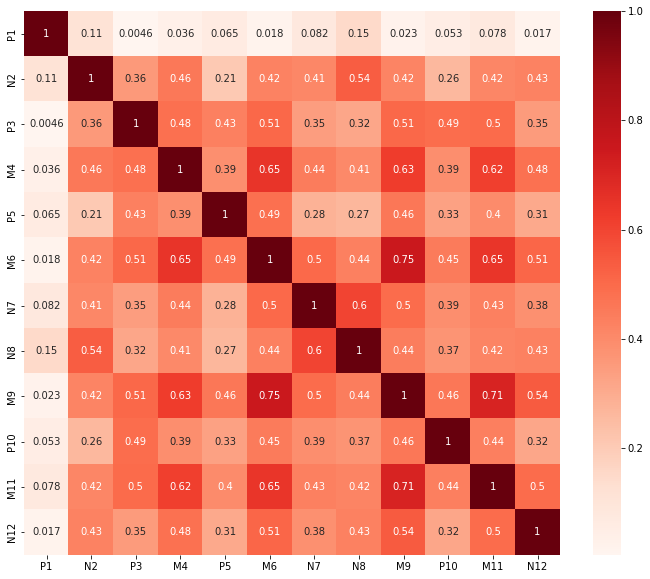

In [ ]:
correlation_matrix(df13)

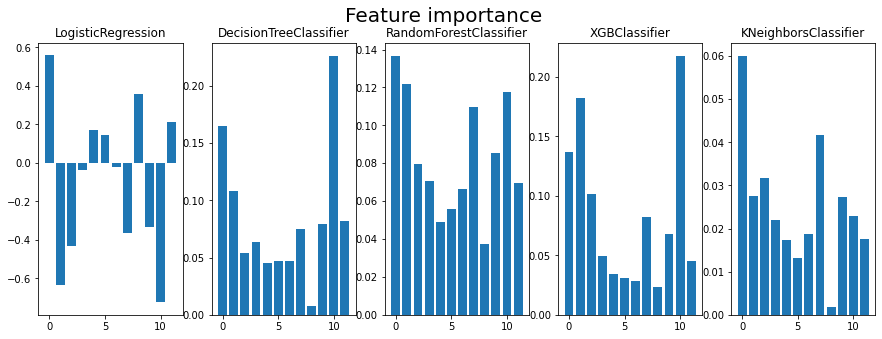

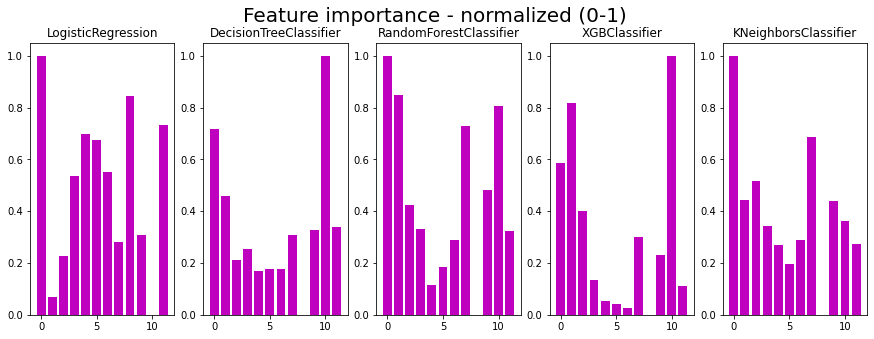

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|  10 |    1 |      10 |    0 |    10 |     0 |     10 |     0 |
|   1 |   10 |       0 |    8 |     0 |     1 |      1 |     7 |
|   7 |    0 |       1 |   11 |     1 |    10 |      0 |     2 |
|   3 |    3 |       2 |    4 |    11 |     7 |      2 |     1 |
|   9 |    5 |       3 |    5 |     9 |     9 |      7 |     9 |
|   0 |    2 |      11 |    6 |     7 |     2 |      9 |    10 |
|   2 |    7 |       9 |    3 |     3 |     3 |      3 |     3 |
|   6 |    9 |       5 |    9 |     2 |    11 |     11 |     6 |
|   5 |    8 |       7 |    7 |     5 |     6 |      4 |    11 |
|   8 |    6 |       6 |    2 |     6 |     5 |      5 |     4 |
|  11 |   11 |       4 |    1 |     4 |     4 |      6 |     5 |
|   4 |    4 |       8 |   10 |     8 |     8 |      8 |     8 |


Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=0)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=0)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|  10 |    1 |      10 |    0 |    10 |     0 |     10 |     0 |
|   1 |   10 |       0 |    8 |     0 |     1 |      1 |     7 |
|   7 |    0 |       1 |   11 |     1 |    10 |      0 |     2 |
|   3 |    3 |       2 |    4 |    11 |     7 |      2 |     1 |
|   9 |    5 |       3 |    5 |     9 |     9 |      7 |     9 |
|   0 |    2 |      11 |    6 |     7 |     2 |      9 |    10 |
|   2 |    7 |       9 |    3 |     3 |     3 |      3 |     3 |
|   6 |    9 |       5 |    9 |     2 |    11 |     11 |     6 |
|   5 |    8 |       7 |    7 |     5 |     6 |      4 |    11 |
|   8 |    6 |       6 |    2 |     6 |     5 |      5 |     4 |
|  11 |   11 |       4 |    1 |     4 |     4 |      6 |     5 |
|   4 |    4 |       8 |   10 |     8 |     8 |      8 |     8 |

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+

Second iteration of tfidf transformation:

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=0)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   0 |    0 |       0 |    0 |     0 |     0 |      0 |     0 |
|  10 |    1 |      10 |    3 |    10 |     1 |     10 |     1 |
|   1 |   10 |       1 |    9 |     1 |    10 |      1 |    10 |
|   7 |    3 |       3 |   11 |     9 |     7 |      7 |     7 |
|   3 |    7 |       2 |    7 |     7 |     9 |      2 |     9 |
|   9 |    2 |       9 |    1 |     3 |     2 |      9 |     2 |
|   2 |    9 |       7 |    5 |    11 |     3 |      3 |     3 |
|   6 |    5 |      11 |    8 |     2 |    11 |     11 |    11 |
|   5 |    8 |       5 |    6 |     5 |     6 |      5 |     6 |
|  11 |    6 |       6 |    4 |     6 |     5 |      4 |     4 |
|   8 |   11 |       4 |    2 |     4 |     4 |      6 |     5 |
|   4 |    4 |       8 |   10 |     8 |     8 |      8 |     8 |


In [ ]:
cumulative = ensemble(ranks, df13)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| P1        |    0 | ***            |
| M11       |   10 | ***            |
| N2        |    1 | ***            |
| N8        |    7 | ***            |
| M4        |    3 | ***            |
| P3        |    2 | ***            |
| P10       |    9 | ***            |
| N12       |   11 | ***            |
| M6        |    5 | ***            |
| N7        |    6 | ***            |
| P5        |    4 | ***            |
| M9        |    8 | ***            |


In [ ]:
ensemble_increasingwindow(ranks, df13)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| M11       |   10 | ***            |
| P1        |    0 | ***            |
| N2        |    1 | ***            |
| N8        |    7 | ***            |
| P3        |    2 | ***            |
| P10       |    9 | ***            |
| M4        |    3 | ***            |
| N12       |   11 | ***            |
| M6        |    5 | ***            |
| N7        |    6 | ***            |
| P5        |    4 | ***            |
| M9        |    8 | ***            |


In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df13)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| P1        |    0 | ***            |
| M11       |   10 | ***            |
| N2        |    1 | ***            |
| N8        |    7 | ***            |
| P10       |    9 | ***            |
| M4        |    3 | ***            |
| P3        |    2 | ***            |
| N12       |   11 | ***            |
| M6        |    5 | ***            |
| N7        |    6 | ***            |
| M9        |    8 | ***            |
| P5        |    4 | ***            |


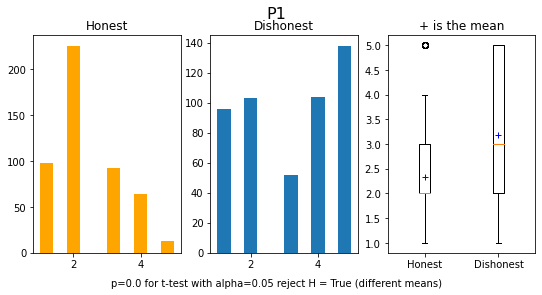

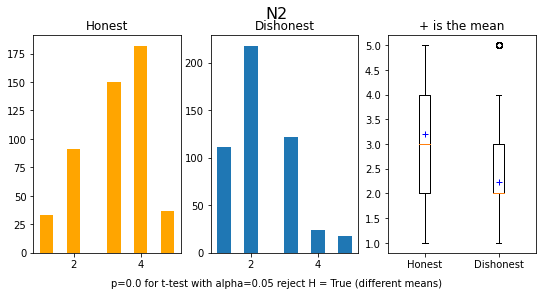

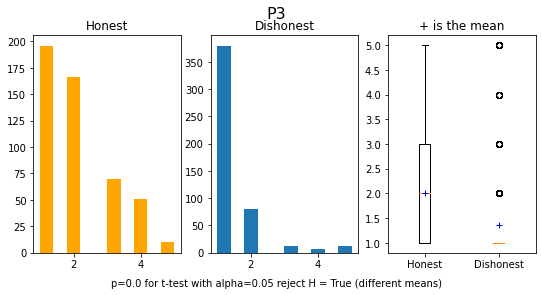

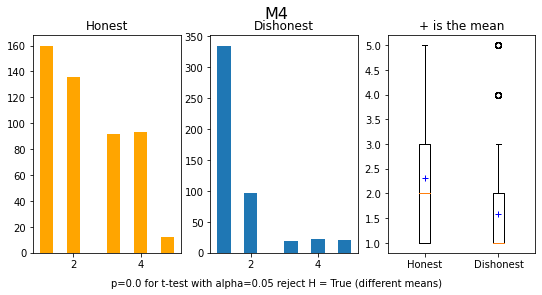

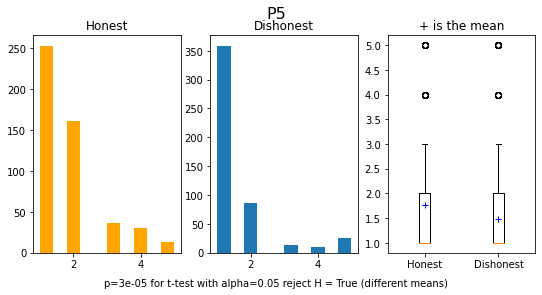

...

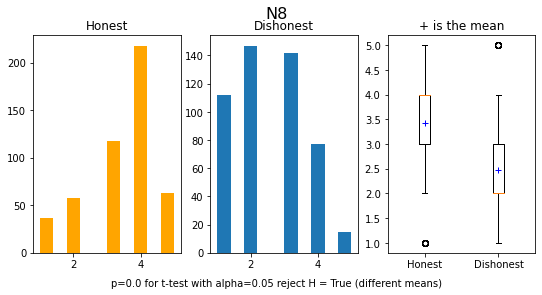

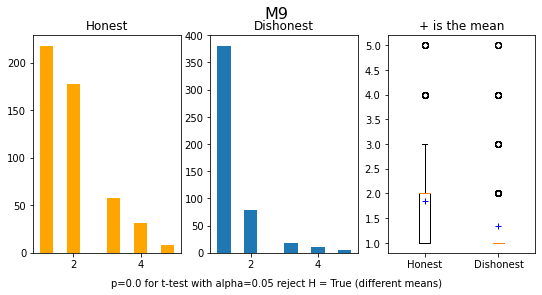

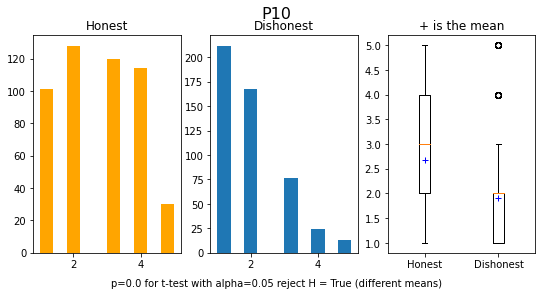

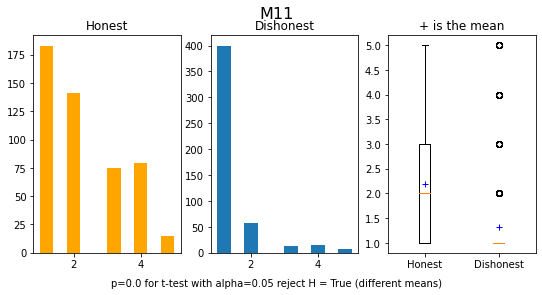

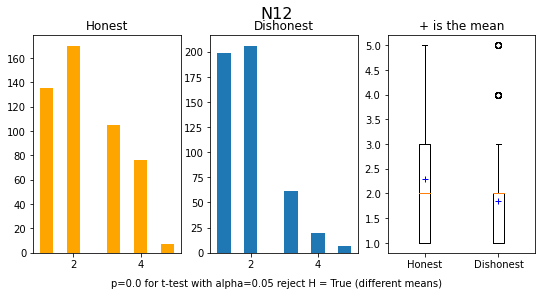

In [ ]:
plots(df13)

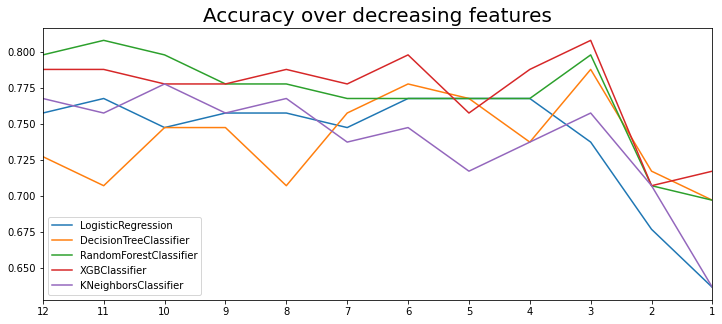

In [ ]:
plot_accuracies(df13, cumulative)

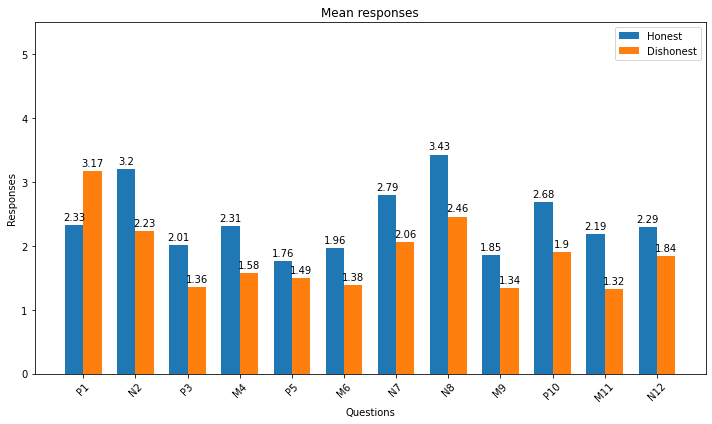

In [ ]:
n,p = df13.shape # extract dimensions

rows_honest = df13.iloc[:n//2,:-1]
rows_disonest = df13.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df13.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 3 - Modelling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.76
There were 24 errors on 99 predictions


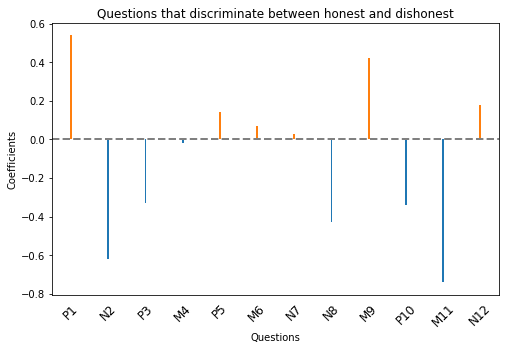

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df13.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df13.columns)[:-1],
                       rotation=45, fontsize=12)


In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df13["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df13["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,P1,N2,P3,M4,P5,M6,N7,N8,M9,P10,M11,N12,CONDITION,Prediction
731,3,3,2,2,1,1,2,4,1,1,1,2,D,H
436,3,3,1,1,2,1,2,3,1,1,1,2,H,D
299,3,3,2,2,2,2,2,2,2,2,2,3,H,D
351,2,3,1,1,1,1,3,2,1,2,1,1,H,D
866,1,3,1,1,1,1,3,3,1,1,1,2,D,H
377,3,1,2,1,1,1,1,3,1,1,1,1,H,D
107,2,3,1,1,1,1,2,3,1,1,1,2,H,D
670,2,4,1,1,1,1,1,4,1,1,1,2,D,H
76,4,3,1,3,1,1,4,4,2,3,1,2,H,D
59,4,2,2,2,2,2,2,2,2,2,1,2,H,D


### PCA


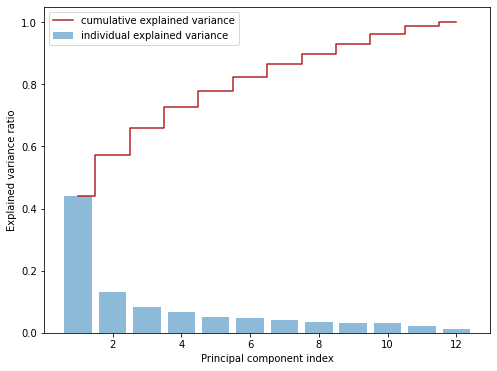

number of components based on eigenvalue higher than 1 is: 4
n = 4, tot explained variance: 0.727
      PC   exp_var    cumvar  eigenvalue
0    1.0  0.441611  0.441611    6.474623
1    2.0  0.132279  0.573890    1.939396
2    3.0  0.084439  0.658329    1.237986
3    4.0  0.068311  0.726639    1.001531
4    5.0  0.050904  0.777543    0.746323
5    6.0  0.047062  0.824605    0.689990
6    7.0  0.040893  0.865498    0.599542
7    8.0  0.033348  0.898846    0.488927
8    9.0  0.032401  0.931247    0.475046
9   10.0  0.031864  0.963111    0.467166
10  11.0  0.023227  0.986338    0.340541
11  12.0  0.013662  1.000000    0.200310


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df13, X_train, y)
print(pca_info)

Accuracy: 0.741 (0.040)


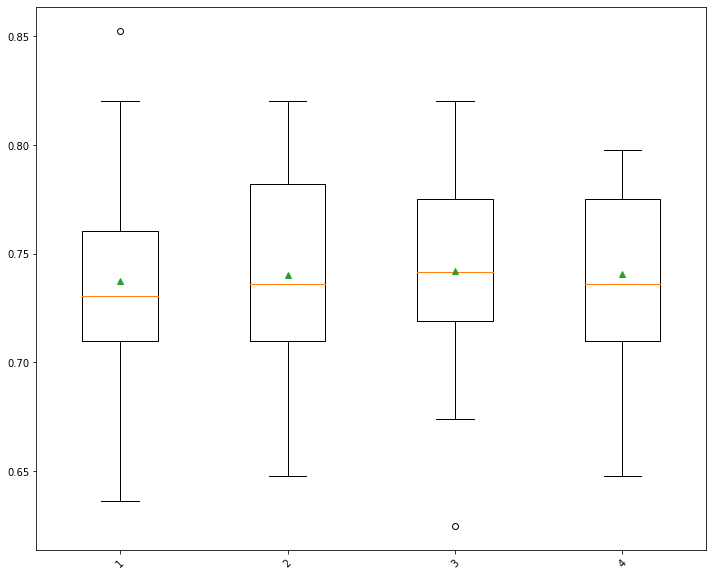

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 3, tot explained variance: 0.658
        PC0       PC1       PC2
0 -2.181212  1.839553 -1.430151
1 -3.073985  2.249828  0.276888
2 -2.548762 -1.280304  2.279713
3  2.982525  3.124704  1.521278
4 -3.087583  2.096394 -0.492939
val score:  0.783539643242557
best params:  {'max_depth': 100}
f1s:  0.7672485220872317
              precision    recall  f1-score   support

           0       0.76      0.80      0.78        51
           1       0.78      0.73      0.75        48

    accuracy                           0.77        99
   macro avg       0.77      0.77      0.77        99
weighted avg       0.77      0.77      0.77        99



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


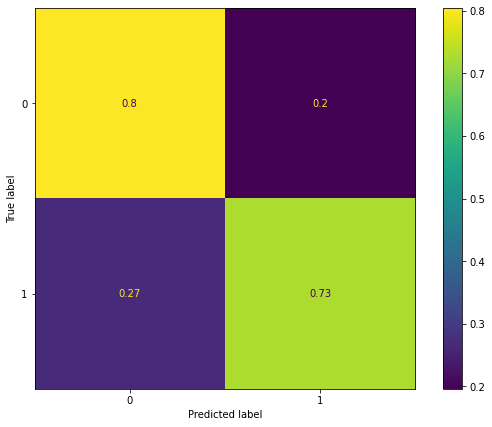

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 3)

# 14. IADQ

In [ ]:
df14 = get_dataset("./datasets/12. IADQ/")
#X, y = pandas_to_numpy(df14)
y = np.array([1 if c == "D" else 0 for c in df14["CONDITION"]]) # create response array
X = df14.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    225
1    225
dtype: int64


## 2 - Explanatory Data Analysis

correlation of the features:
3


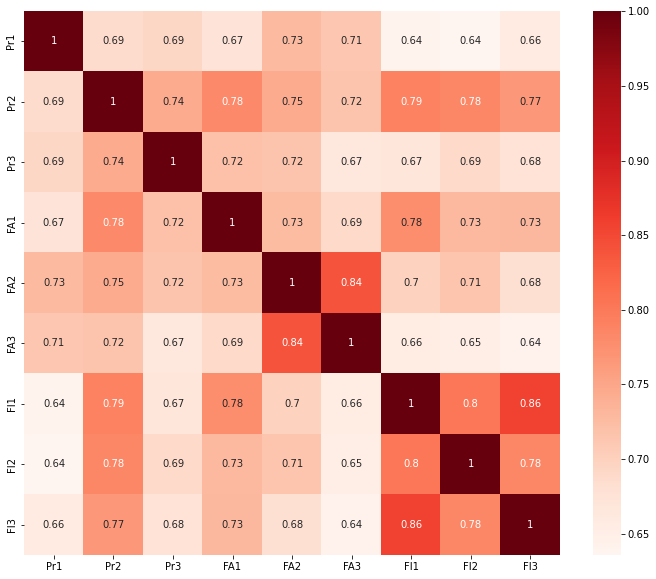

In [ ]:
correlation_matrix(df14)

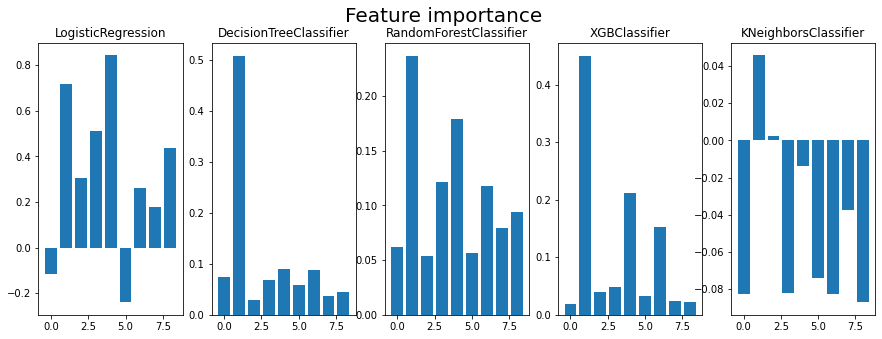

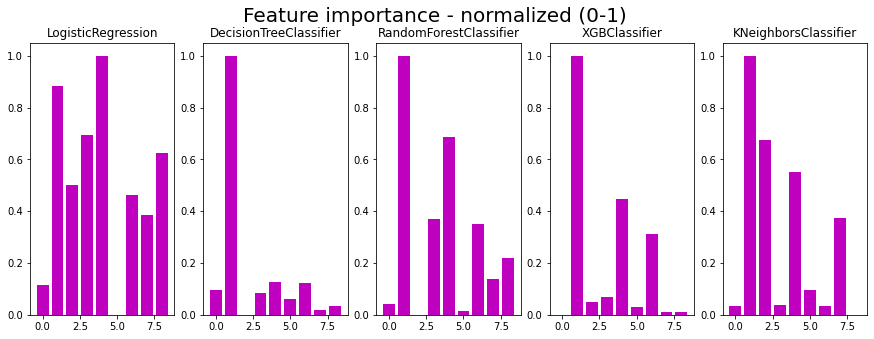

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   3 |    8 |       1 |    4 |     1 |     1 |      1 |     1 |
|   6 |    1 |       4 |    1 |     4 |     4 |      4 |     2 |
|   1 |    4 |       6 |    3 |     6 |     3 |      6 |     4 |
|   8 |    3 |       8 |    8 |     0 |     6 |      3 |     7 |
|   4 |    6 |       5 |    2 |     3 |     8 |      2 |     5 |
|   7 |    7 |       2 |    6 |     5 |     7 |      5 |     3 |
|   2 |    5 |       0 |    7 |     8 |     0 |      7 |     6 |
|   5 |    2 |       3 |    0 |     7 |     5 |      8 |     0 |
|   0 |    0 |       7 |    5 |     2 |     2 |      0 |     8 |


Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=1)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=1)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   3 |    8 |       1 |    4 |     1 |     1 |      1 |     1 |
|   6 |    1 |       4 |    1 |     4 |     4 |      4 |     2 |
|   1 |    4 |       6 |    3 |     6 |     3 |      6 |     4 |
|   8 |    3 |       8 |    8 |     0 |     6 |      3 |     7 |
|   4 |    6 |       5 |    2 |     3 |     8 |      2 |     5 |
|   7 |    7 |       2 |    6 |     5 |     7 |      5 |     3 |
|   2 |    5 |       0 |    7 |     8 |     0 |      7 |     6 |
|   5 |    2 |       3 |    0 |     7 |     5 |      8 |     0 |
|   0 |    0 |       7 |    5 |     2 |     2 |      0 |     8 |

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   1 |    1 |       1 |    1 |     1 |     1 |      1 |     1 |
|   4 |    4 |       4 |    4 |     4 |     4 |      4 |     4 |
|   3 |    8 |       6 |

Second iteration of tfidf transformation:

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=1)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   1 |    1 |       1 |    1 |     1 |     1 |      1 |     1 |
|   4 |    4 |       4 |    4 |     4 |     4 |      4 |     4 |
|   3 |    3 |       6 |    3 |     6 |     3 |      6 |     3 |
|   6 |    6 |       8 |    6 |     3 |     6 |      3 |     6 |
|   8 |    8 |       3 |    8 |     8 |     8 |      2 |     2 |
|   7 |    7 |       5 |    2 |     0 |     7 |      5 |     7 |
|   2 |    5 |       2 |    7 |     5 |     0 |      7 |     5 |
|   5 |    2 |       0 |    0 |     7 |     5 |      8 |     0 |
|   0 |    0 |       7 |    5 |     2 |     2 |      0 |     8 |


In [ ]:
cumulative = ensemble(ranks, df14)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| Pr2       |    1 | ***            |
| FA2       |    4 | ***            |
| FI1       |    6 | ***            |
| FA1       |    3 | ***            |
| FI3       |    8 | ***            |
| Pr3       |    2 | ***            |
| FI2       |    7 | ***            |
| FA3       |    5 | ***            |
| ﻿Pr1      |    0 | ***            |


In [ ]:
ensemble_increasingwindow(ranks, df14)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| Pr2       |    1 | ***            |
| FA2       |    4 | ***            |
| FA1       |    3 | ***            |
| FI1       |    6 | ***            |
| FI3       |    8 | ***            |
| Pr3       |    2 | ***            |
| FI2       |    7 | ***            |
| FA3       |    5 | ***            |
| ﻿Pr1      |    0 | ***            |


In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df14)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| Pr2       |    1 | ***            |
| FA2       |    4 | ***            |
| FA1       |    3 | ***            |
| FI1       |    6 | ***            |
| FI3       |    8 | ***            |
| Pr3       |    2 | ***            |
| FI2       |    7 | ***            |
| FA3       |    5 | ***            |
| ﻿Pr1      |    0 | ***            |


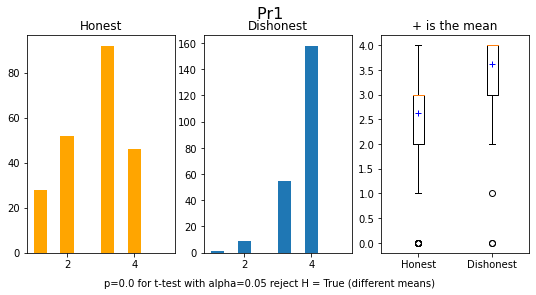

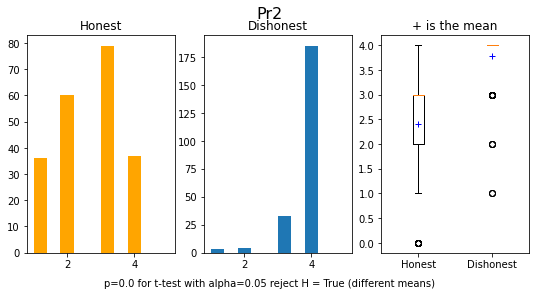

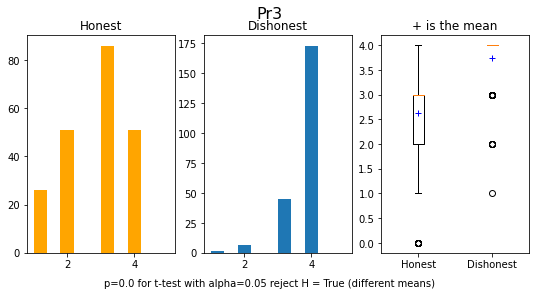

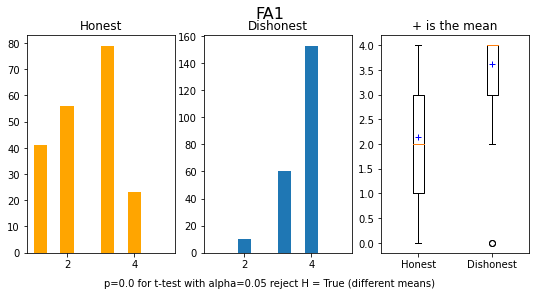

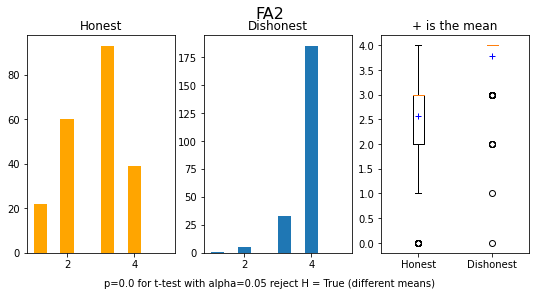

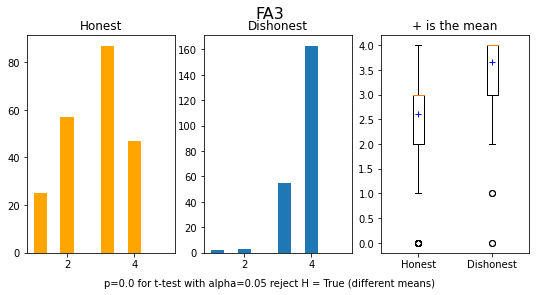

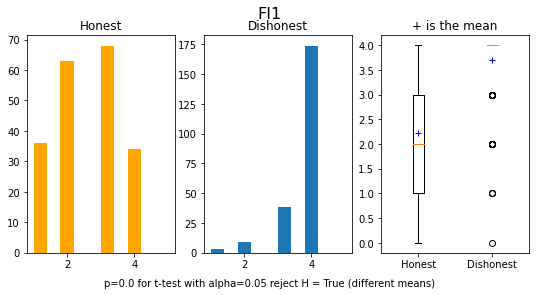

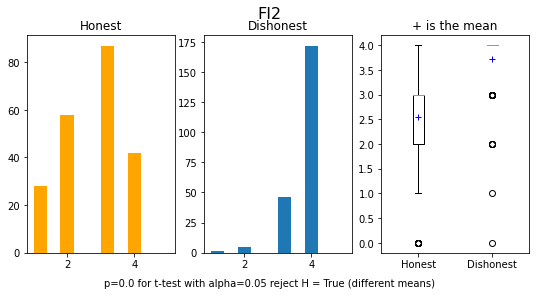

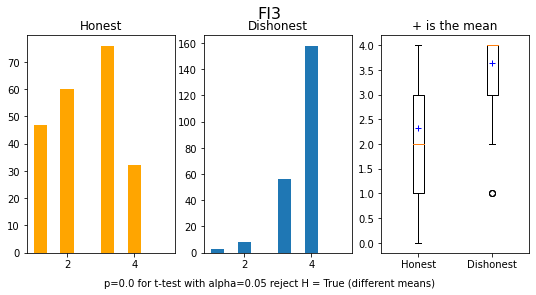

In [ ]:
plots(df14)

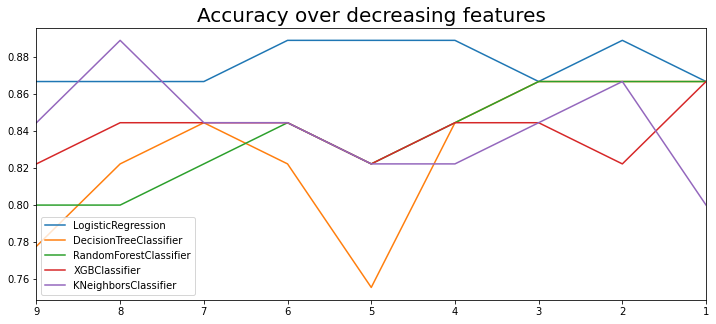

In [ ]:
plot_accuracies(df14, cumulative)

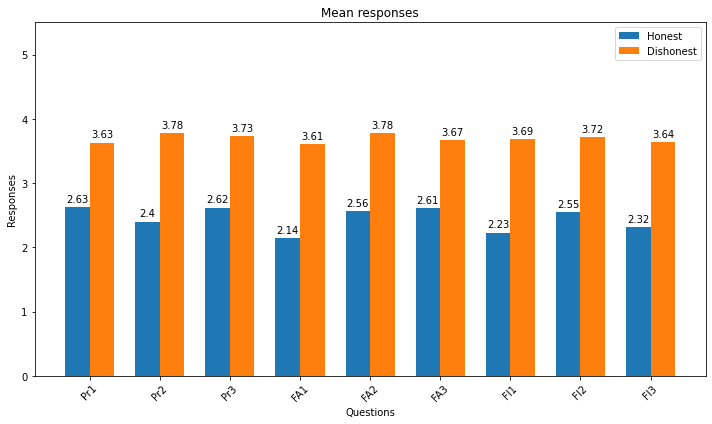

In [ ]:
n,p = df14.shape # extract dimensions

rows_honest = df14.iloc[:n//2,:-1]
rows_disonest = df14.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df14.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 3 - Modelling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.87
There were 6 errors on 45 predictions


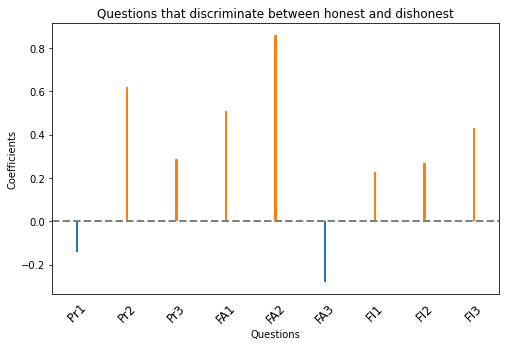

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df14.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df14.columns)[:-1],
                       rotation=45, fontsize=12)


In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df14["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df14["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,﻿Pr1,Pr2,Pr3,FA1,FA2,FA3,FI1,FI2,FI3,CONDITION,Prediction
117,4,4,4,4,4,4,2,3,3,H,D
430,4,4,3,3,3,4,3,3,3,D,H
396,4,3,4,3,3,4,3,3,4,D,H
338,3,3,3,3,4,4,2,3,3,D,H
153,4,3,3,4,4,4,4,4,4,H,D
225,4,3,3,3,4,3,2,3,1,D,H


### PCA


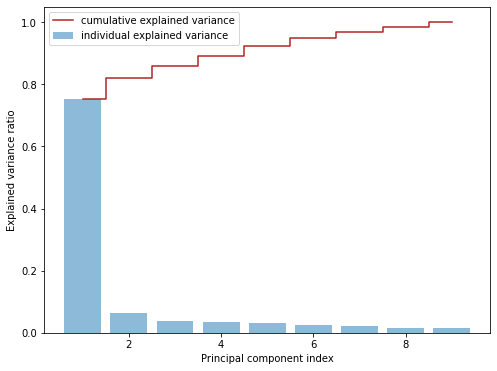

number of components based on eigenvalue higher than 1 is: 1
n = 1, tot explained variance: 0.754
    PC   exp_var    cumvar  eigenvalue
0  1.0  0.753634  0.753634    8.066896
1  2.0  0.065229  0.818863    0.698211
2  3.0  0.038584  0.857447    0.413003
3  4.0  0.035138  0.892585    0.376120
4  5.0  0.030684  0.923269    0.328438
5  6.0  0.024577  0.947846    0.263075
6  7.0  0.020915  0.968762    0.223877
7  8.0  0.016506  0.985268    0.176684
8  9.0  0.014732  1.000000    0.157693


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df14, X_train, y)
print(pca_info)

Accuracy: 0.823 (0.045)


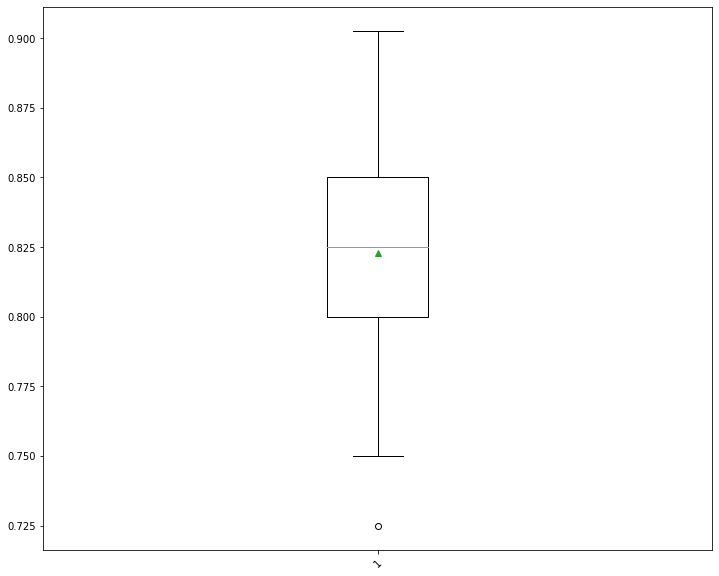

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 1, tot explained variance: 0.754
        PC0
0 -2.135505
1  5.691925
2  2.183960
3  5.007189
4  2.297326
val score:  0.8
best params:  {'max_depth': 10}
f1s:  0.8223978919631094
              precision    recall  f1-score   support

           0       0.78      0.86      0.82        21
           1       0.86      0.79      0.83        24

    accuracy                           0.82        45
   macro avg       0.82      0.82      0.82        45
weighted avg       0.83      0.82      0.82        45



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


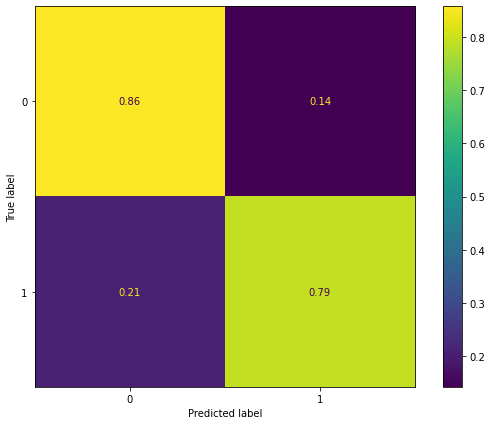

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 1)

# 15. BF (3)
##(fake good)

In [ ]:
df15 = get_dataset("./datasets/13. BF (3)/")
#X, y = pandas_to_numpy(df15)
y = np.array([1 if c == "D" else 0 for c in df15["CONDITION"]]) # create response array
X = df15.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    221
1    221
dtype: int64


## 2 - Explanatory Data Analysis

correlation of the features:
0


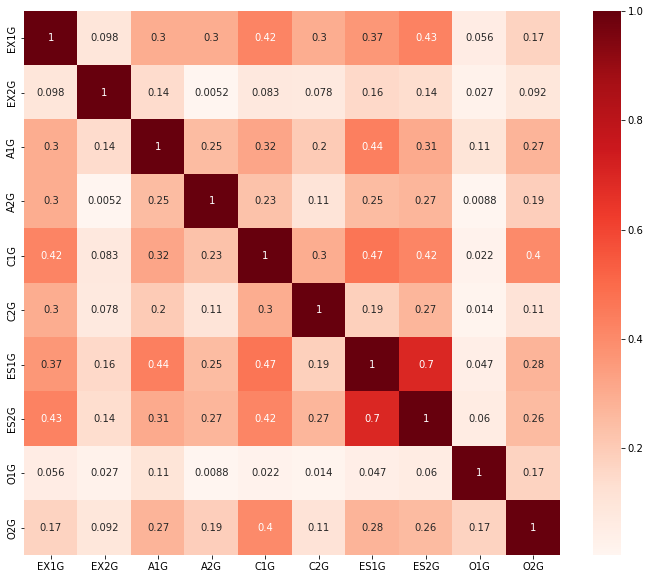

In [ ]:
correlation_matrix(df15)

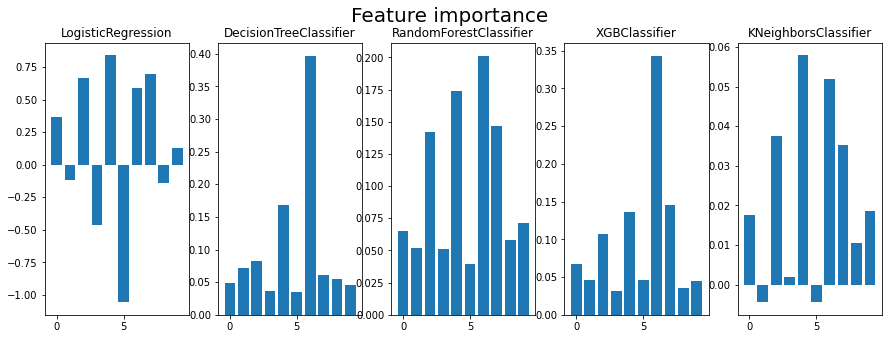

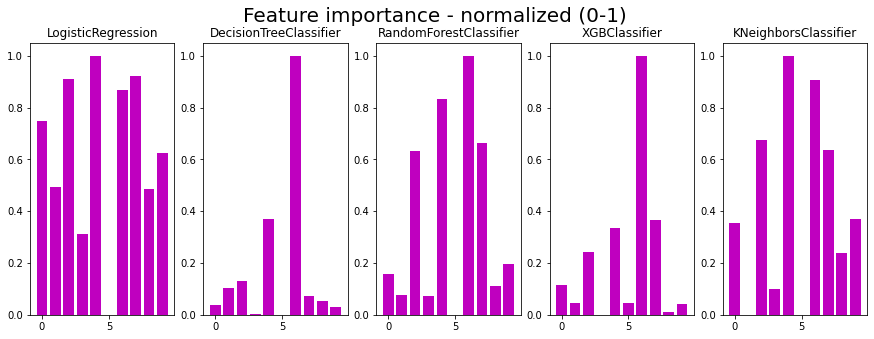

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   6 |    6 |       6 |    4 |     6 |     6 |      6 |     4 |
|   7 |    7 |       4 |    7 |     4 |     4 |      7 |     6 |
|   4 |    4 |       2 |    2 |     2 |     7 |      4 |     2 |
|   2 |    2 |       7 |    6 |     1 |     2 |      2 |     7 |
|   9 |    0 |       5 |    0 |     7 |     9 |      0 |     9 |
|   0 |    3 |       0 |    9 |     8 |     0 |      1 |     0 |
|   1 |    9 |       8 |    1 |     0 |     8 |      5 |     8 |
|   3 |    1 |       3 |    8 |     9 |     1 |      9 |     3 |
|   8 |    8 |       1 |    3 |     3 |     3 |      8 |     1 |
|   5 |    5 |       9 |    5 |     5 |     5 |      3 |     5 |


Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=6)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=6)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   6 |    6 |       6 |    4 |     6 |     6 |      6 |     4 |
|   7 |    7 |       4 |    7 |     4 |     4 |      7 |     6 |
|   4 |    4 |       2 |    2 |     2 |     7 |      4 |     2 |
|   2 |    2 |       7 |    6 |     1 |     2 |      2 |     7 |
|   9 |    0 |       5 |    0 |     7 |     9 |      0 |     9 |
|   0 |    3 |       0 |    9 |     8 |     0 |      1 |     0 |
|   1 |    9 |       8 |    1 |     0 |     8 |      5 |     8 |
|   3 |    1 |       3 |    8 |     9 |     1 |      9 |     3 |
|   8 |    8 |       1 |    3 |     3 |     3 |      8 |     1 |
|   5 |    5 |       9 |    5 |     5 |     5 |      3 |     5 |

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   6 |    6 |       6 |    6 |     6 |     6 |      6 |     6 |
|   4 |    4 |       4 |

Second iteration of tfidf transformation:

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=6)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   6 |    6 |       6 |    6 |     6 |     6 |      6 |     6 |
|   4 |    4 |       4 |    4 |     4 |     4 |      4 |     4 |
|   7 |    7 |       7 |    7 |     7 |     7 |      7 |     7 |
|   2 |    2 |       2 |    2 |     2 |     2 |      2 |     2 |
|   0 |    0 |       0 |    0 |     0 |     0 |      0 |     0 |
|   9 |    9 |       8 |    9 |     1 |     9 |      1 |     9 |
|   1 |    3 |       5 |    1 |     8 |     8 |      9 |     8 |
|   3 |    1 |       3 |    8 |     9 |     1 |      5 |     3 |
|   8 |    8 |       1 |    3 |     3 |     3 |      8 |     1 |
|   5 |    5 |       9 |    5 |     5 |     5 |      3 |     5 |


In [ ]:
cumulative = ensemble(ranks, df15)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| ES1G      |    6 | ***            |
| C1G       |    4 | ***            |
| ES2G      |    7 | ***            |
| A1G       |    2 | ***            |
| EX1G      |    0 | ***            |
| O2G       |    9 | ***            |
| EX2G      |    1 | *              |
| O1G       |    8 | -              |
| A2G       |    3 | **             |
| C2G       |    5 | -              |


In [ ]:
ensemble_increasingwindow(ranks, df15)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| ES1G      |    6 | ***            |
| C1G       |    4 | ***            |
| ES2G      |    7 | ***            |
| A1G       |    2 | ***            |
| O2G       |    9 | ***            |
| EX1G      |    0 | ***            |
| EX2G      |    1 | *              |
| O1G       |    8 | -              |
| A2G       |    3 | **             |
| C2G       |    5 | -              |


In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df15)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| ES1G      |    6 | ***            |
| C1G       |    4 | ***            |
| ES2G      |    7 | ***            |
| A1G       |    2 | ***            |
| EX1G      |    0 | ***            |
| O2G       |    9 | ***            |
| EX2G      |    1 | *              |
| O1G       |    8 | -              |
| A2G       |    3 | **             |
| C2G       |    5 | -              |


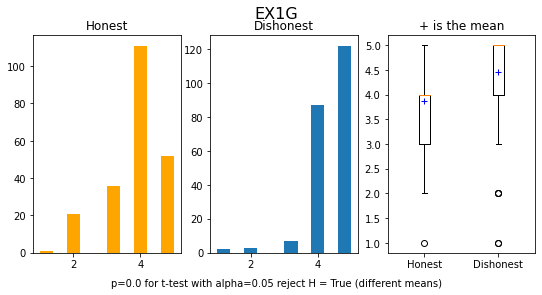

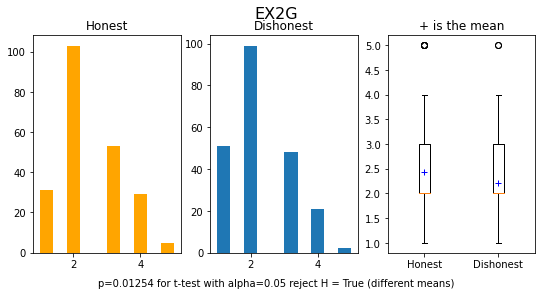

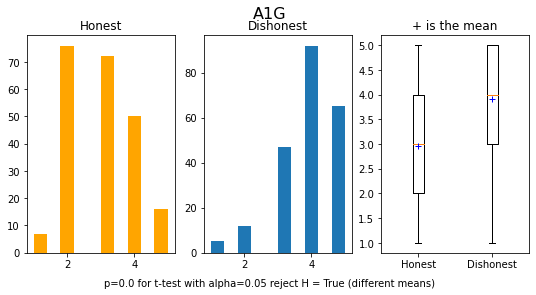

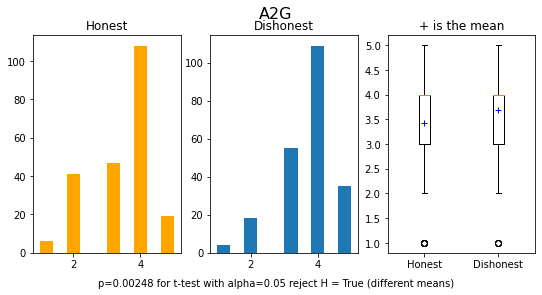

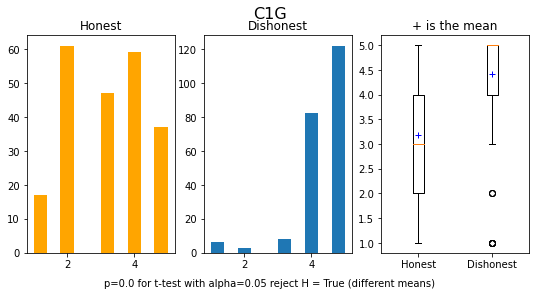

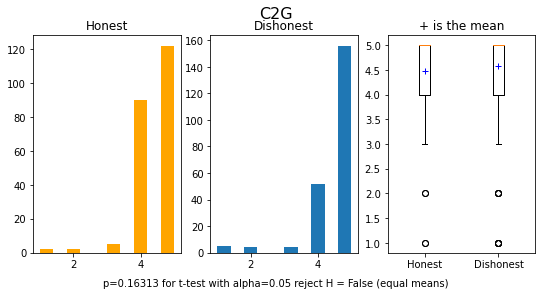

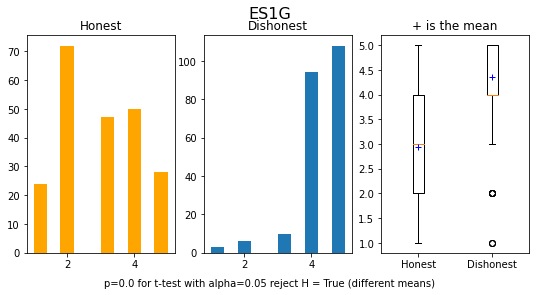

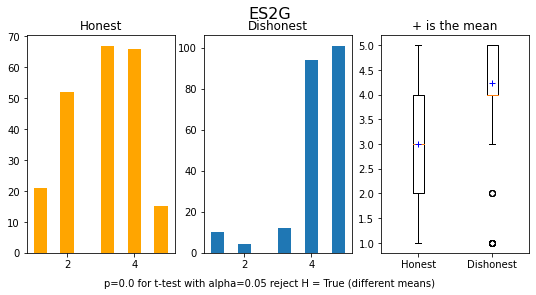

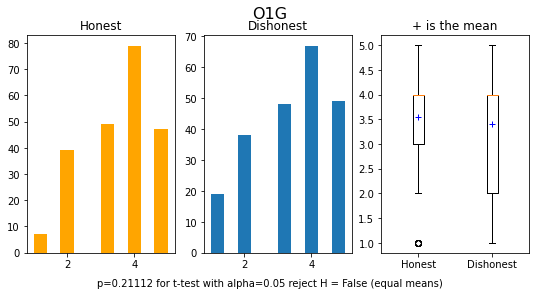

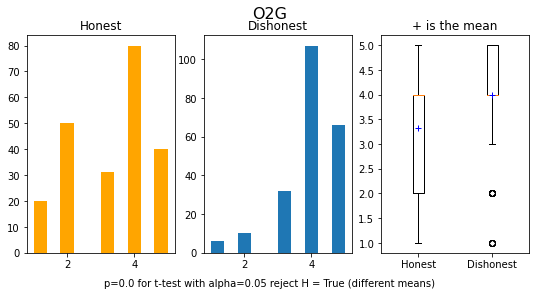

In [ ]:
plots(df15)

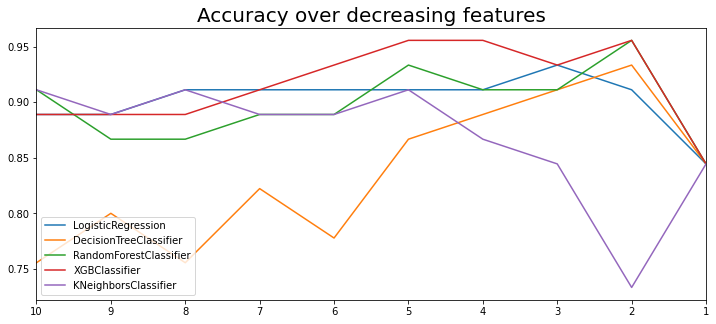

In [ ]:
plot_accuracies(df15, cumulative)

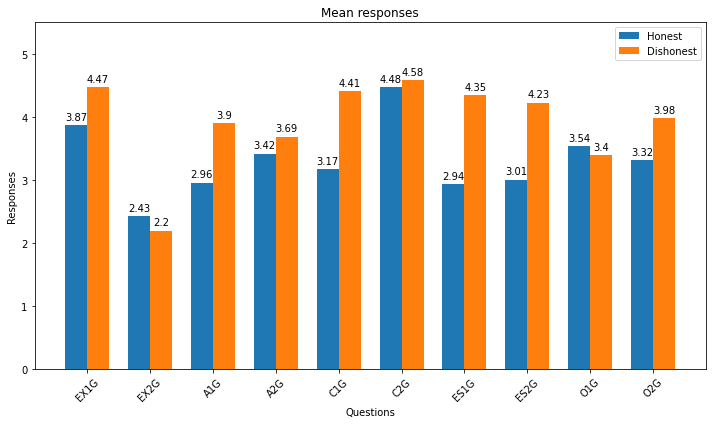

In [ ]:
n,p = df15.shape # extract dimensions

rows_honest = df15.iloc[:n//2,:-1]
rows_disonest = df15.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df15.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 3 - Modelling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.89
There were 5 errors on 45 predictions


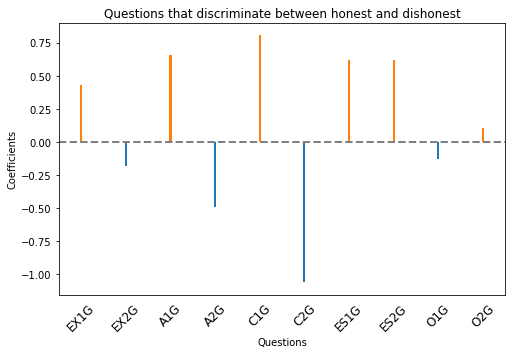

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df15.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df15.columns)[:-1],
                       rotation=45, fontsize=12)


In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df15["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df15["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,EX1G,EX2G,A1G,A2G,C1G,C2G,ES1G,ES2G,O1G,O2G,CONDITION,Prediction
329,4,3,4,4,4,5,4,3,4,4,D,H
116,5,2,2,4,5,5,5,4,3,2,H,D
79,5,2,4,3,5,4,3,3,2,3,H,D
75,4,1,5,3,2,5,5,4,5,3,H,D
199,5,1,4,5,5,5,5,5,5,5,H,D


### PCA


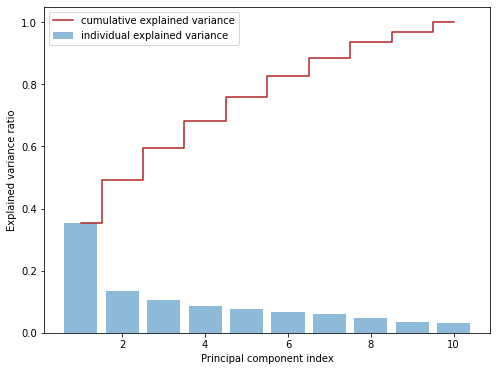

number of components based on eigenvalue higher than 1 is: 4
n = 4, tot explained variance: 0.682
     PC   exp_var    cumvar  eigenvalue
0   1.0  0.355047  0.355047    4.105575
1   2.0  0.135300  0.490346    1.564534
2   3.0  0.104744  0.595090    1.211202
3   4.0  0.087082  0.682172    1.006971
4   5.0  0.077509  0.759681    0.896270
5   6.0  0.067027  0.826707    0.775063
6   7.0  0.059483  0.886191    0.687836
7   8.0  0.048838  0.935029    0.564737
8   9.0  0.033802  0.968831    0.390867
9  10.0  0.031169  1.000000    0.360426


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df15, X_train, y)
print(pca_info)

Accuracy: 0.822 (0.050)


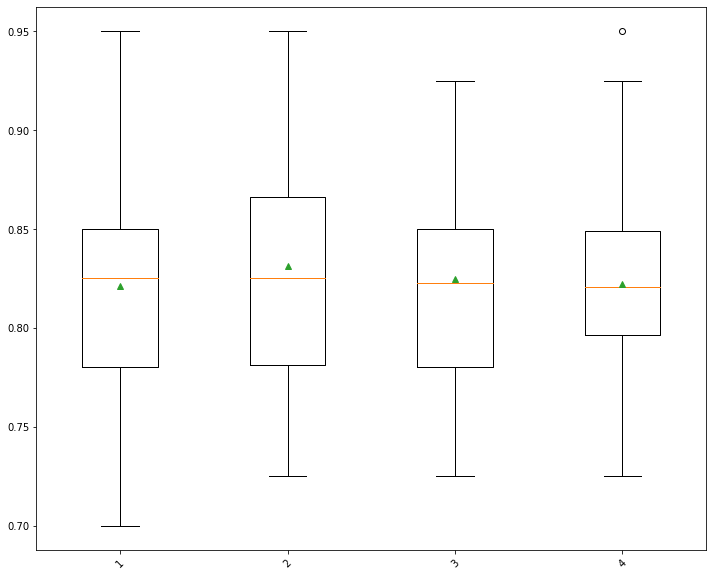

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 2, tot explained variance: 0.49
        PC0       PC1
0 -0.434701 -0.577346
1 -0.551627  0.719469
2  2.817628  1.977916
3 -0.565388 -0.426980
4 -3.182951  1.201501
val score:  0.7985759493670888
best params:  {'max_depth': 100}
f1s:  0.9110232762406674
              precision    recall  f1-score   support

           0       0.95      0.87      0.91        23
           1       0.88      0.95      0.91        22

    accuracy                           0.91        45
   macro avg       0.91      0.91      0.91        45
weighted avg       0.91      0.91      0.91        45



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


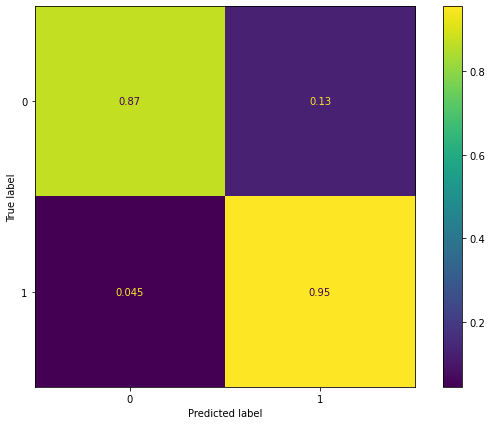

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 2)

# 16. BF (3)2
##(fake good)

In [ ]:
df16 = get_dataset("./datasets/13. BF (3)2/")
# X, y = pandas_to_numpy(df16)

y = np.array([1 if c == "D" else 0 for c in df16["CONDITION"]]) # create response array
X = df16.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    230
1    230
dtype: int64


## 2 - Explanatory Data Analysis

correlation of the features:
0


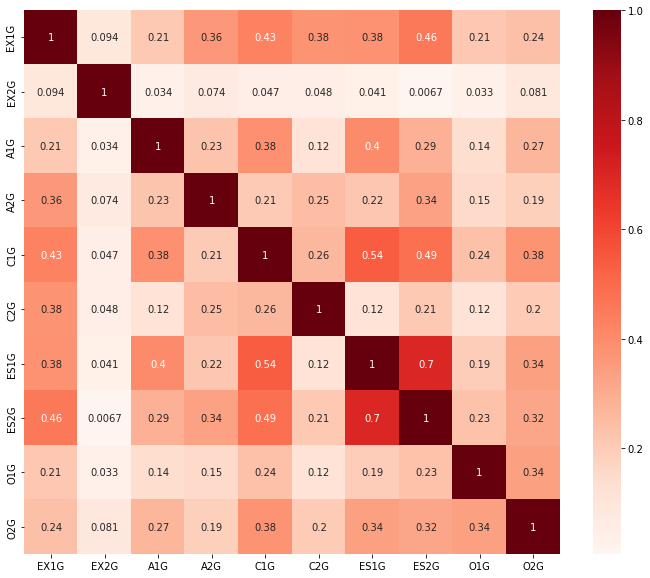

In [ ]:
correlation_matrix(df16)

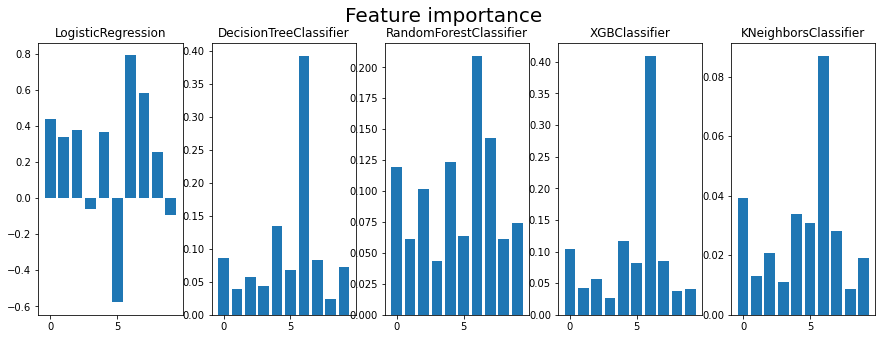

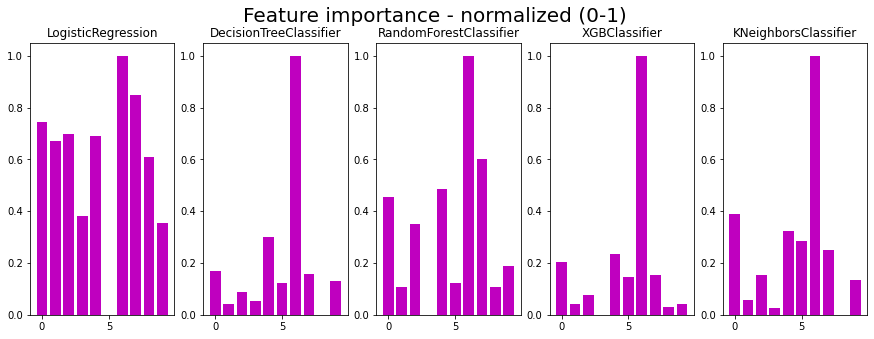

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   6 |    6 |       6 |    6 |     6 |     6 |      6 |     6 |
|   7 |    0 |       4 |    7 |     4 |     7 |      4 |     0 |
|   4 |    4 |       0 |    0 |     0 |     4 |      0 |     4 |
|   2 |    7 |       5 |    2 |     7 |     0 |      7 |     5 |
|   0 |    2 |       2 |    4 |     9 |     2 |      5 |     7 |
|   9 |    8 |       1 |    1 |     5 |     9 |      2 |     2 |
|   8 |    9 |       7 |    8 |     2 |     5 |      1 |     9 |
|   3 |    3 |       9 |    3 |     3 |     8 |      9 |     1 |
|   1 |    1 |       8 |    9 |     1 |     1 |      8 |     3 |
|   5 |    5 |       3 |    5 |     8 |     3 |      3 |     8 |


Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=6)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=6)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   6 |    6 |       6 |    6 |     6 |     6 |      6 |     6 |
|   7 |    0 |       4 |    7 |     4 |     7 |      4 |     0 |
|   4 |    4 |       0 |    0 |     0 |     4 |      0 |     4 |
|   2 |    7 |       5 |    2 |     7 |     0 |      7 |     5 |
|   0 |    2 |       2 |    4 |     9 |     2 |      5 |     7 |
|   9 |    8 |       1 |    1 |     5 |     9 |      2 |     2 |
|   8 |    9 |       7 |    8 |     2 |     5 |      1 |     9 |
|   3 |    3 |       9 |    3 |     3 |     8 |      9 |     1 |
|   1 |    1 |       8 |    9 |     1 |     1 |      8 |     3 |
|   5 |    5 |       3 |    5 |     8 |     3 |      3 |     8 |

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   6 |    6 |       6 |    6 |     6 |     6 |      6 |     6 |
|   4 |    4 |       4 |

Second iteration of tfidf transformation:

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=6)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   6 |    6 |       6 |    6 |     6 |     6 |      6 |     6 |
|   4 |    4 |       4 |    4 |     4 |     4 |      4 |     4 |
|   0 |    0 |       0 |    0 |     0 |     0 |      0 |     0 |
|   7 |    7 |       7 |    7 |     7 |     7 |      7 |     7 |
|   2 |    2 |       2 |    2 |     2 |     2 |      2 |     2 |
|   9 |    9 |       5 |    1 |     9 |     9 |      5 |     5 |
|   8 |    8 |       1 |    8 |     5 |     5 |      1 |     9 |
|   3 |    3 |       9 |    3 |     3 |     8 |      9 |     1 |
|   1 |    1 |       8 |    9 |     1 |     1 |      8 |     3 |
|   5 |    5 |       3 |    5 |     8 |     3 |      3 |     8 |


In [ ]:
cumulative = ensemble(ranks, df16)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| ES1G      |    6 | ***            |
| C1G       |    4 | ***            |
| ﻿EX1G     |    0 | ***            |
| ES2G      |    7 | ***            |
| A1G       |    2 | ***            |
| O2G       |    9 | ***            |
| C2G       |    5 | -              |
| EX2G      |    1 | **             |
| O1G       |    8 | ***            |
| A2G       |    3 | ***            |


In [ ]:
ensemble_increasingwindow(ranks, df16)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| ES1G      |    6 | ***            |
| ES2G      |    7 | ***            |
| C1G       |    4 | ***            |
| ﻿EX1G     |    0 | ***            |
| A1G       |    2 | ***            |
| C2G       |    5 | -              |
| O2G       |    9 | ***            |
| EX2G      |    1 | **             |
| O1G       |    8 | ***            |
| A2G       |    3 | ***            |


In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df16)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| ES1G      |    6 | ***            |
| C1G       |    4 | ***            |
| ﻿EX1G     |    0 | ***            |
| ES2G      |    7 | ***            |
| A1G       |    2 | ***            |
| O2G       |    9 | ***            |
| C2G       |    5 | -              |
| EX2G      |    1 | **             |
| O1G       |    8 | ***            |
| A2G       |    3 | ***            |


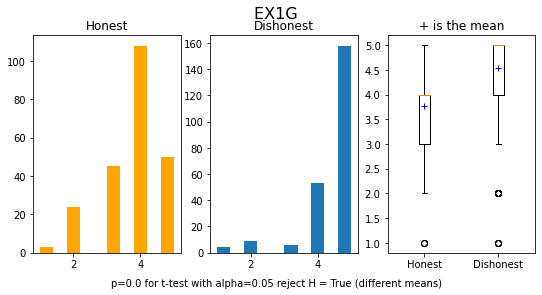

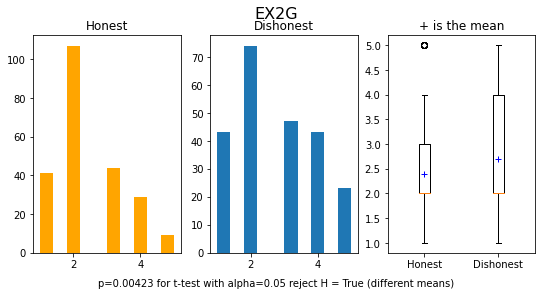

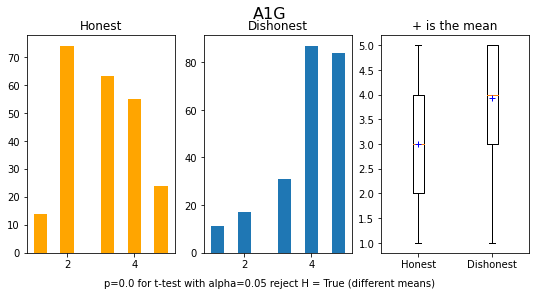

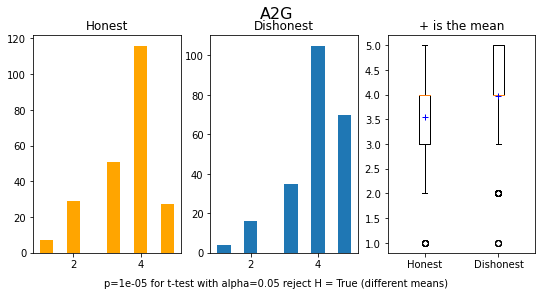

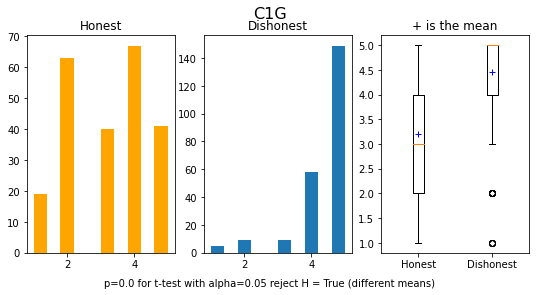

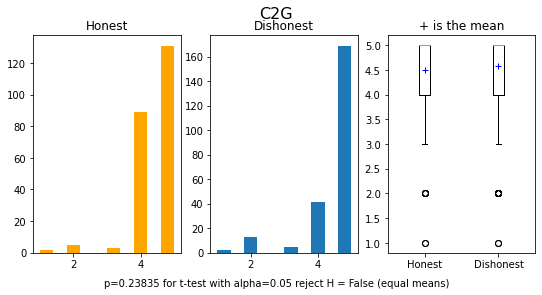

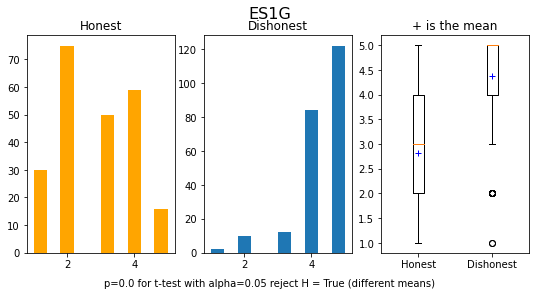

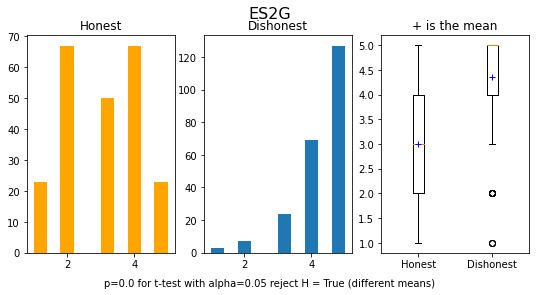

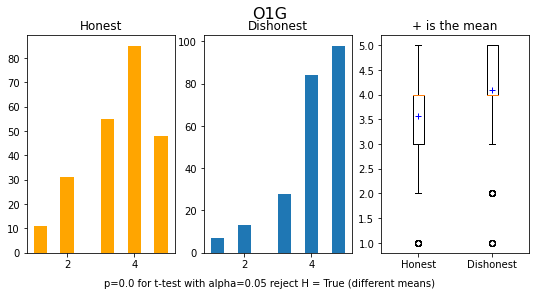

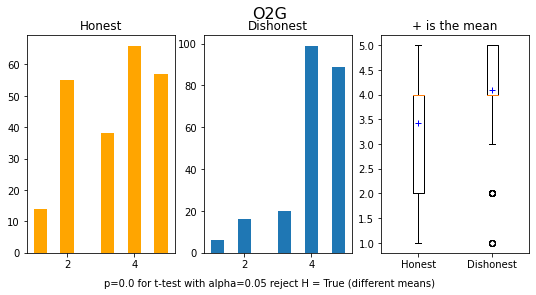

In [ ]:
plots(df16)

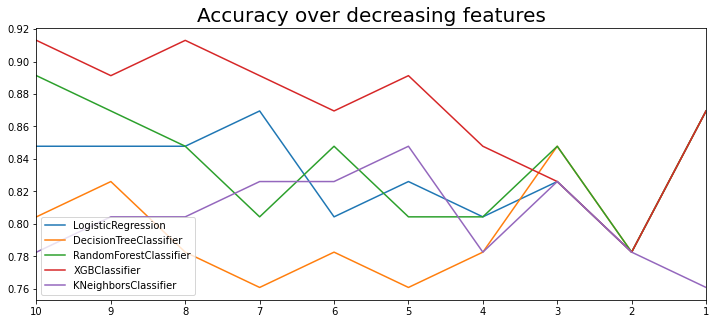

In [ ]:
plot_accuracies(df16, cumulative)

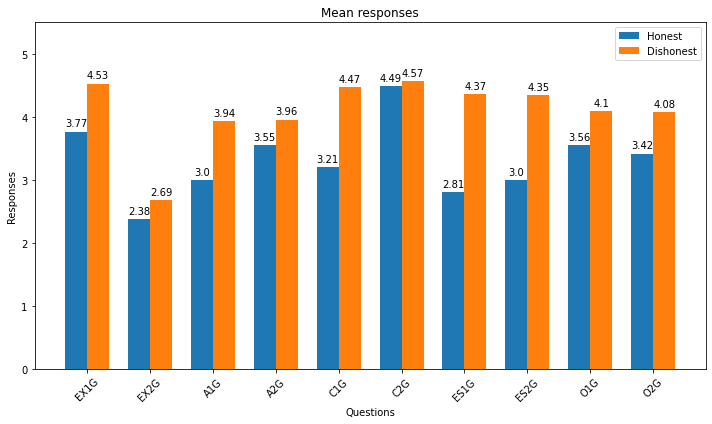

In [ ]:
n,p = df16.shape # extract dimensions

rows_honest = df16.iloc[:n//2,:-1]
rows_disonest = df16.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df16.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 3 - Modelling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.85
There were 7 errors on 46 predictions


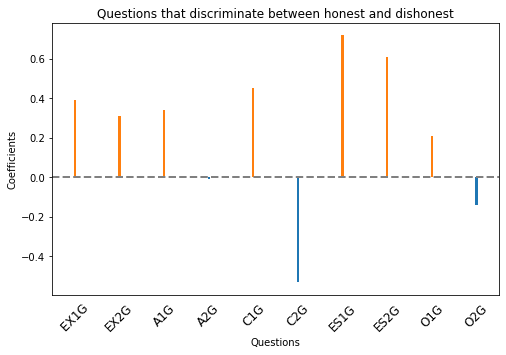

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df16.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df16.columns)[:-1],
                       rotation=45, fontsize=12)


In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df16["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df16["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,﻿EX1G,EX2G,A1G,A2G,C1G,C2G,ES1G,ES2G,O1G,O2G,CONDITION,Prediction
124,5,1,5,5,5,5,5,5,1,5,H,D
154,4,2,3,4,4,4,4,4,4,3,H,D
78,4,2,2,4,5,4,5,4,3,5,H,D
248,4,2,4,3,4,4,3,3,3,2,D,H
55,3,4,3,4,5,5,4,4,5,2,H,D
321,2,4,3,4,2,2,4,2,5,4,D,H
249,4,2,2,2,2,4,4,4,4,4,D,H


## PCA

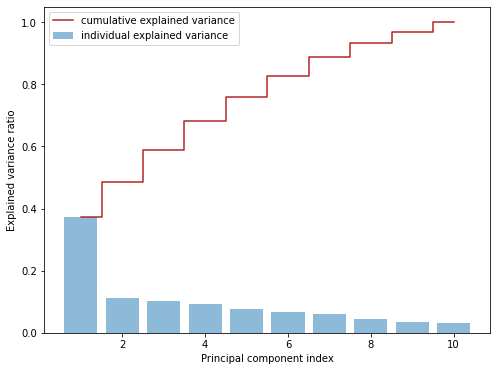

number of components based on eigenvalue higher than 1 is: 4
n = 4, tot explained variance: 0.681
     PC   exp_var    cumvar  eigenvalue
0   1.0  0.373803  0.373803    4.720096
1   2.0  0.112713  0.486516    1.423253
2   3.0  0.101272  0.587788    1.278779
3   4.0  0.093582  0.681370    1.181682
4   5.0  0.078016  0.759386    0.985127
5   6.0  0.067715  0.827101    0.855050
6   7.0  0.061899  0.889000    0.781609
7   8.0  0.043990  0.932990    0.555475
8   9.0  0.034537  0.967527    0.436105
9  10.0  0.032473  1.000000    0.410047


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df16, X_train, y)
print(pca_info)

Accuracy: 0.825 (0.045)


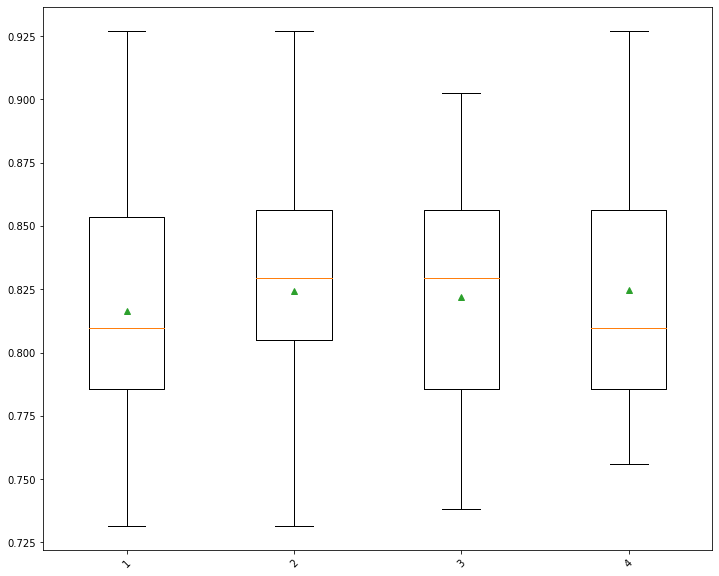

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 2, tot explained variance: 0.487
        PC0       PC1
0 -0.331540  0.452645
1 -1.836297  0.575310
2 -3.168998 -1.252620
3  1.056057 -2.303254
4  1.724362 -0.540511
val score:  0.8162797531589774
best params:  {'max_depth': 10}
f1s:  0.782608695652174
              precision    recall  f1-score   support

           0       0.72      0.86      0.78        21
           1       0.86      0.72      0.78        25

    accuracy                           0.78        46
   macro avg       0.79      0.79      0.78        46
weighted avg       0.79      0.78      0.78        46



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


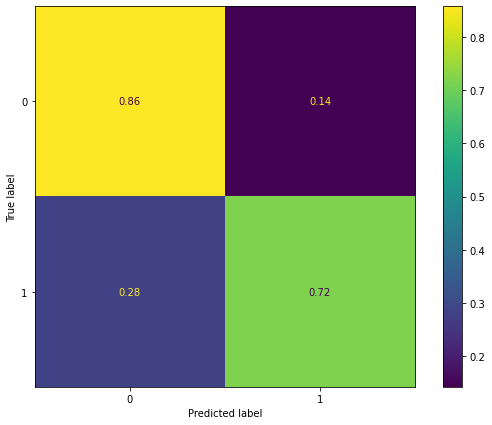

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 2)

# 17. BF (3)3
##(fake good)

In [ ]:
df17 = get_dataset("./datasets/13. BF (3)3/")
#X, y = pandas_to_numpy(df17)

y = np.array([1 if c == "D" else 0 for c in df17["CONDITION"]]) # create response array
X = df17.iloc[:,:-1].copy()

# adding classes list which sorts the CONDITION lables to be used for the confusion matrix in PCA
classes = sorted(list(set(y)))
print(pd.Series(y).value_counts())

0    243
1    243
dtype: int64


## 2 - Explanatory Data Analysis

correlation of the features:
0


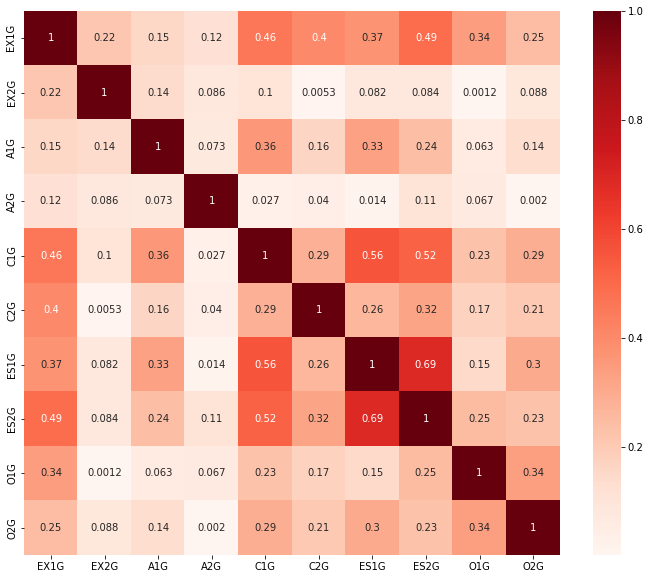

In [ ]:
correlation_matrix(df17)

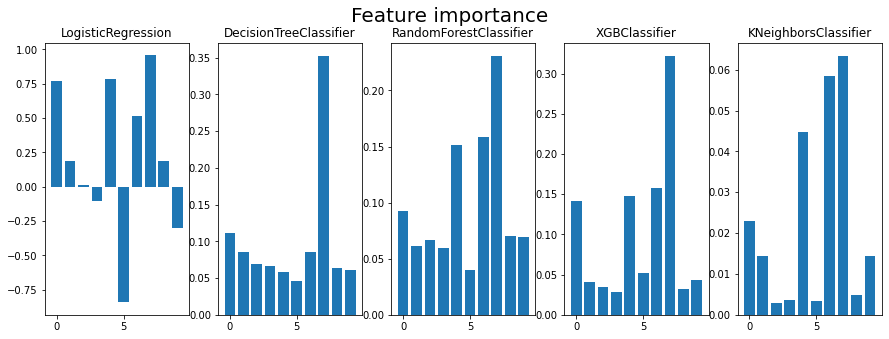

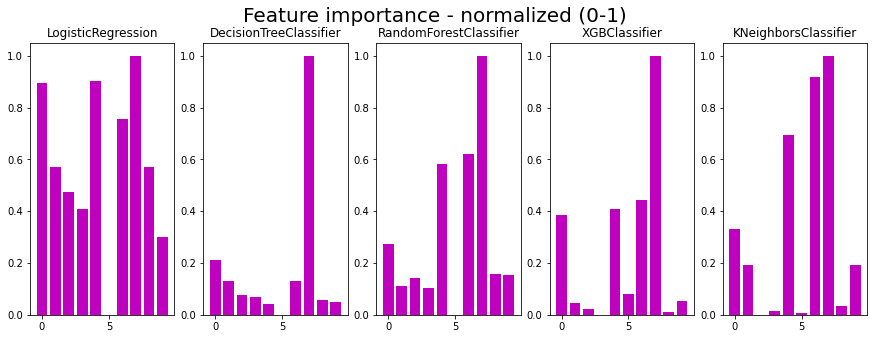

In [ ]:
model_ranks = scores_to_rank(evaluate_scores(X, y, verbose=0, plot=1))
chi2_ranks = evaluate_rank_chi2_mi_rfe(X, y, verbose=0)
ranks = chi2_ranks.copy()
ranks.update(model_ranks)

In [ ]:
print_ranks(ranks)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   6 |    7 |       7 |    7 |     7 |     7 |      7 |     7 |
|   7 |    6 |       0 |    4 |     0 |     6 |      6 |     6 |
|   4 |    4 |       6 |    0 |     6 |     4 |      4 |     4 |
|   0 |    0 |       4 |    6 |     1 |     0 |      0 |     0 |
|   2 |    8 |       2 |    8 |     2 |     8 |      5 |     9 |
|   8 |    2 |       5 |    1 |     3 |     9 |      9 |     1 |
|   9 |    3 |       3 |    2 |     8 |     2 |      1 |     8 |
|   1 |    9 |       1 |    3 |     9 |     1 |      2 |     3 |
|   5 |    1 |       8 |    9 |     4 |     3 |      8 |     5 |
|   3 |    5 |       9 |    5 |     5 |     5 |      3 |     2 |


Applying tfidf transformation

In [ ]:
print_ranks(ranks, highlight=7)
print()
tfidf_values = tf_idf(ranks)
print_ranks(tfidf_values, highlight=7)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   6 |    7 |       7 |    7 |     7 |     7 |      7 |     7 |
|   7 |    6 |       0 |    4 |     0 |     6 |      6 |     6 |
|   4 |    4 |       6 |    0 |     6 |     4 |      4 |     4 |
|   0 |    0 |       4 |    6 |     1 |     0 |      0 |     0 |
|   2 |    8 |       2 |    8 |     2 |     8 |      5 |     9 |
|   8 |    2 |       5 |    1 |     3 |     9 |      9 |     1 |
|   9 |    3 |       3 |    2 |     8 |     2 |      1 |     8 |
|   1 |    9 |       1 |    3 |     9 |     1 |      2 |     3 |
|   5 |    1 |       8 |    9 |     4 |     3 |      8 |     5 |
|   3 |    5 |       9 |    5 |     5 |     5 |      3 |     2 |

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   7 |    7 |       7 |    7 |     7 |     7 |      7 |     7 |
|   6 |    6 |       6 |

Second iteration of tfidf transformation:

In [ ]:
tfidf_ranks = tfidf_to_ranks(tfidf_values)

tfidf_values_2 = tf_idf(tfidf_ranks)
print_ranks(tfidf_values_2, highlight=7)

|   C |   MI |   RFEDT |   LR |   DTC |   RFC |   XGBC |   KNC |
|-----+------+---------+------+-------+-------+--------+-------|
|   7 |    7 |       7 |    7 |     7 |     7 |      7 |     7 |
|   6 |    6 |       6 |    6 |     6 |     6 |      6 |     6 |
|   0 |    0 |       0 |    0 |     0 |     0 |      0 |     0 |
|   4 |    4 |       4 |    4 |     4 |     4 |      4 |     4 |
|   2 |    8 |       2 |    8 |     1 |     8 |      9 |     9 |
|   8 |    2 |       5 |    1 |     2 |     9 |      1 |     1 |
|   9 |    3 |       1 |    2 |     8 |     2 |      2 |     8 |
|   1 |    9 |       3 |    3 |     3 |     1 |      5 |     3 |
|   5 |    1 |       8 |    9 |     9 |     3 |      8 |     5 |
|   3 |    5 |       9 |    5 |     5 |     5 |      3 |     2 |


In [ ]:
cumulative = ensemble(ranks, df17)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| ES2G      |    7 | ***            |
| ES1G      |    6 | ***            |
| ﻿EX1G     |    0 | ***            |
| C1G       |    4 | ***            |
| A1G       |    2 | ***            |
| O1G       |    8 | ***            |
| EX2G      |    1 | **             |
| O2G       |    9 | ***            |
| A2G       |    3 | -              |
| C2G       |    5 | **             |


In [ ]:
ensemble_increasingwindow(ranks, df17)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| ES2G      |    7 | ***            |
| ES1G      |    6 | ***            |
| C1G       |    4 | ***            |
| ﻿EX1G     |    0 | ***            |
| A1G       |    2 | ***            |
| O1G       |    8 | ***            |
| EX2G      |    1 | **             |
| O2G       |    9 | ***            |
| A2G       |    3 | -              |
| C2G       |    5 | **             |


In [ ]:
cumulative_tfidf = ensemble(tfidf_ranks, df17)

| Feature   |   _n | Significance   |
|-----------+------+----------------|
| ES2G      |    7 | ***            |
| ES1G      |    6 | ***            |
| ﻿EX1G     |    0 | ***            |
| C1G       |    4 | ***            |
| O1G       |    8 | ***            |
| A1G       |    2 | ***            |
| EX2G      |    1 | **             |
| O2G       |    9 | ***            |
| A2G       |    3 | -              |
| C2G       |    5 | **             |


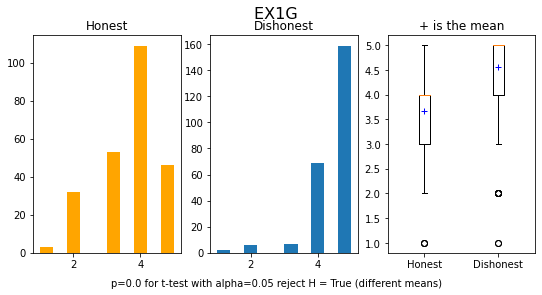

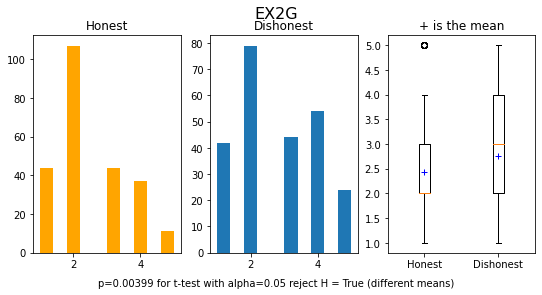

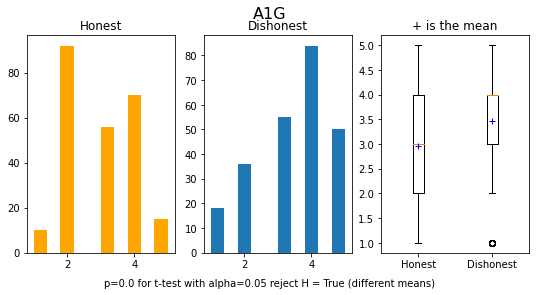

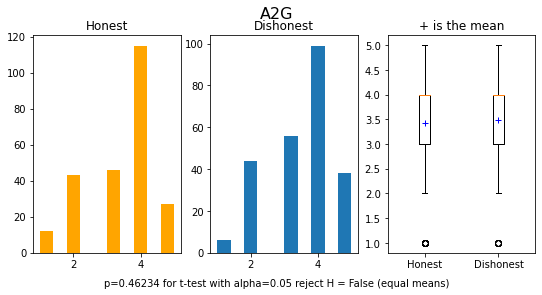

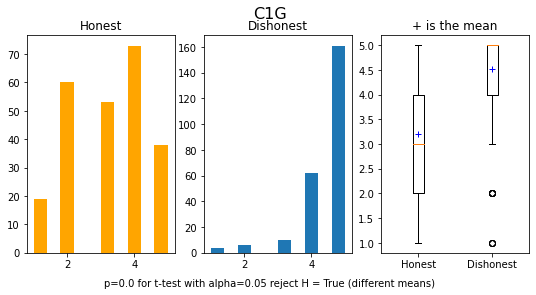

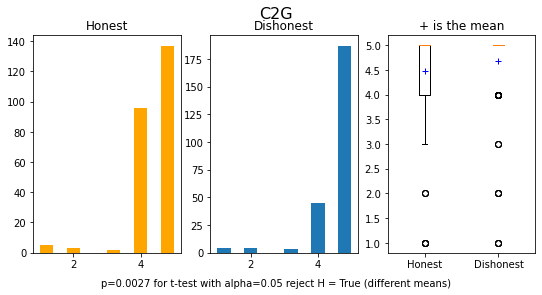

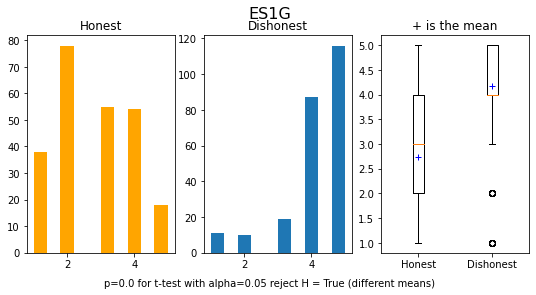

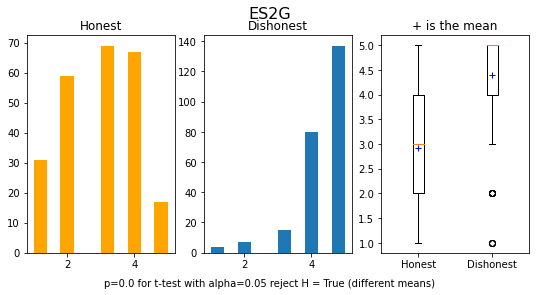

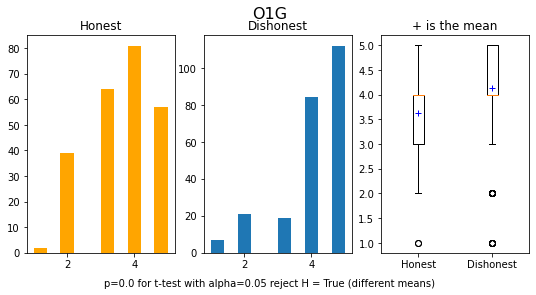

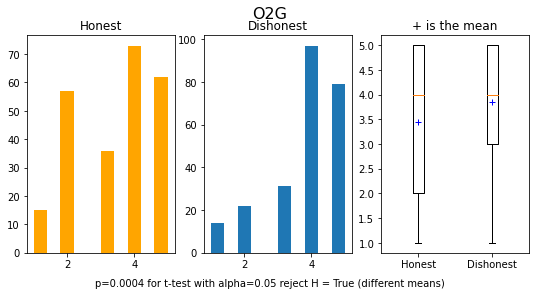

In [ ]:
plots(df17)

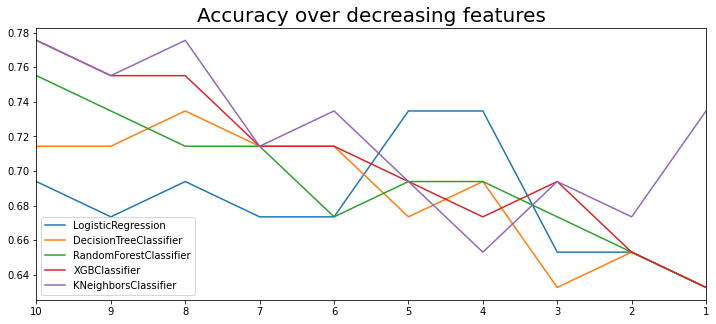

In [ ]:
plot_accuracies(df17, cumulative)

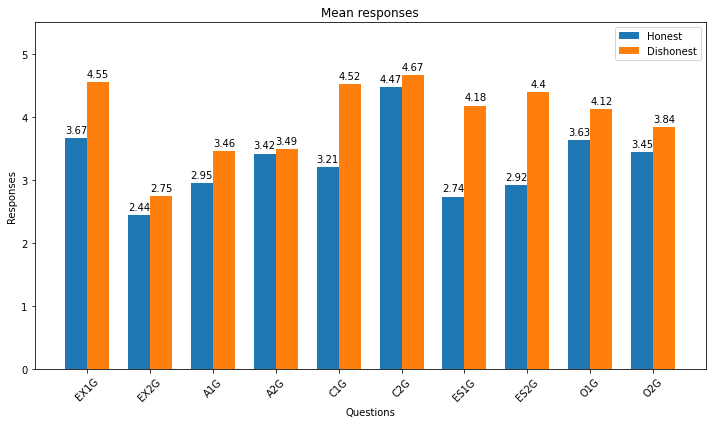

In [ ]:
n,p = df17.shape # extract dimensions

rows_honest = df17.iloc[:n//2,:-1]
rows_disonest = df17.iloc[n//2:,:-1]


fig, ax = plt.subplots(1,1, figsize=(10, 6))

labels = list(df17.columns[:-1])

honest = list(rows_honest.mean(0).round(2))
lier = list(rows_disonest.mean(0).round(2))

x = np.arange(len(labels))
width = 0.35

rects1 = ax.bar(x - width/2, honest, width, label='Honest')
rects2 = ax.bar(x + width/2, lier, width, label='Dishonest')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title("Mean responses")
ax.set_ylabel('Responses')
ax.set_xlabel('Questions')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend(bbox_to_anchor=(1,1), loc="upper right")
ax.set_ylim([0,5.5])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 3 - Modelling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

LR = LogisticRegression()
_ = LR.fit(X_train, y_train)

In [ ]:
# make predictions and calculate accuracy score of classification

y_hat = LR.predict(X_test)
print(f"Accuracy of regularized logistic regression: {accuracy_score(y_hat, y_test).round(2)}" )
print(f"There were {sum(y_hat != y_test)} errors on {len(y_test)} predictions")

Accuracy of regularized logistic regression: 0.69
There were 15 errors on 49 predictions


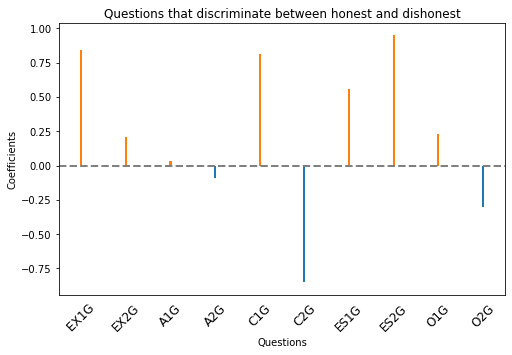

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

coef_df = pd.DataFrame({"varname" : list(df17.columns)[:-1],
                        "coef" : LR.coef_.round(2)[0]})

coef_df.plot(x='varname', y='coef', kind='bar',
             ax=ax, color='none', legend=False)
ax.set_xlabel('Questions')
ax.set_ylabel('Coefficients')
ax.set_title("Questions that discriminate between honest and dishonest")
ax.axhline(y=0, linestyle='--', color='gray', linewidth=2)

ax.bar(x=np.arange(coef_df.shape[0]), width=0.05,
           height=coef_df['coef'], color=["tab:blue" if c < 0 else "tab:green" if c == 0 else "tab:orange" for c in coef_df['coef']])

ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(list(df17.columns)[:-1],
                       rotation=45, fontsize=12)


In [ ]:
# print misclassified examples

print("Misclassifications:")
errors = X_test.join(df17["CONDITION"]).join(pd.Series(["D" if c == "H" else "H" for c in df17["CONDITION"]], name="Prediction")).iloc[y_hat != y_test,:]
errors


Misclassifications:


,﻿EX1G,EX2G,A1G,A2G,C1G,C2G,ES1G,ES2G,O1G,O2G,CONDITION,Prediction
420,4,3,4,3,5,5,4,3,2,4,D,H
431,4,2,3,4,4,5,4,4,4,4,D,H
364,3,3,2,3,3,4,3,3,3,3,D,H
229,4,5,3,4,4,4,4,4,5,4,H,D
9,5,4,3,5,5,5,2,4,4,5,H,D
30,4,2,3,5,4,5,5,5,4,5,H,D
333,4,1,4,2,5,5,4,3,2,4,D,H
90,5,1,4,2,5,5,4,4,2,2,H,D
101,5,1,4,4,5,5,5,5,5,5,H,D
33,4,2,3,4,5,5,4,4,2,2,H,D


### PCA


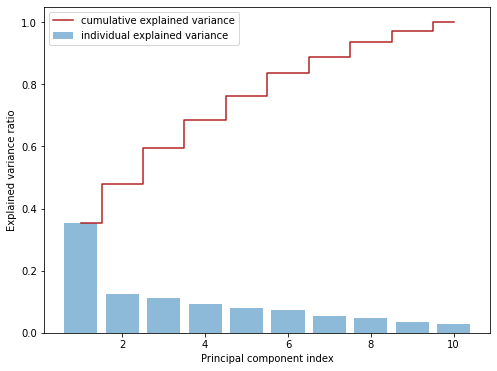

number of components based on eigenvalue higher than 1 is: 5
n = 5, tot explained variance: 0.764
     PC   exp_var    cumvar  eigenvalue
0   1.0  0.354443  0.354443    4.506722
1   2.0  0.125329  0.479772    1.593552
2   3.0  0.113619  0.593391    1.444657
3   4.0  0.091302  0.684692    1.160894
4   5.0  0.079135  0.763827    1.006198
5   6.0  0.072691  0.836518    0.924257
6   7.0  0.052815  0.889333    0.671545
7   8.0  0.047997  0.937330    0.610273
8   9.0  0.033751  0.971081    0.429140
9  10.0  0.028919  1.000000    0.367706


In [ ]:
pca_info, pca_df, X_train_pca, X_test_pca, n_features_pca = do_pca(df17, X_train, y)
print(pca_info)

Accuracy: 0.811 (0.061)


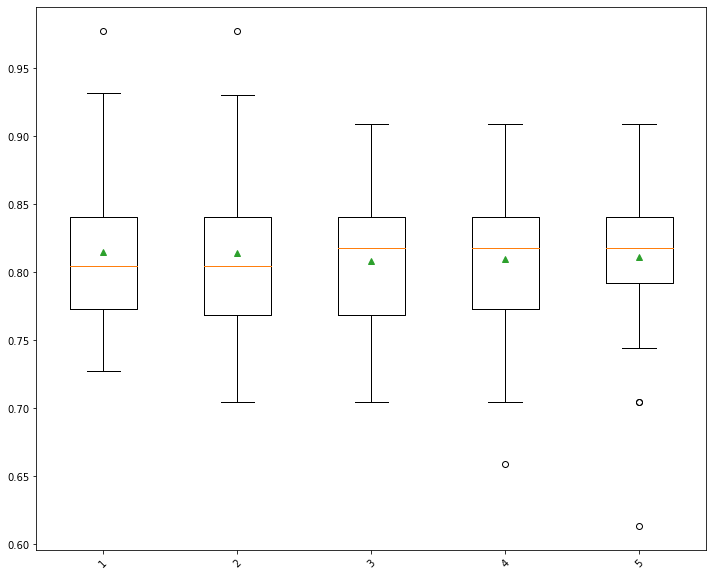

In [ ]:
check_classif_acc(X_train_pca, y_train, n_features_pca)

n = 4, tot explained variance: 0.685
        PC0       PC1       PC2       PC3
0  0.569640 -0.331193 -1.998677 -2.414132
1  2.574088  1.738429  2.368103  2.354785
2 -3.284716 -1.781610 -1.074020  1.382747
3  2.650340  2.290406 -1.167817  1.267461
4 -0.673978  1.556552 -1.537764  0.514916
val score:  0.8329937304075236
best params:  {'max_depth': 10}
f1s:  0.7749482771832138
              precision    recall  f1-score   support

           0       0.82      0.72      0.77        25
           1       0.74      0.83      0.78        24

    accuracy                           0.78        49
   macro avg       0.78      0.78      0.78        49
weighted avg       0.78      0.78      0.77        49



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


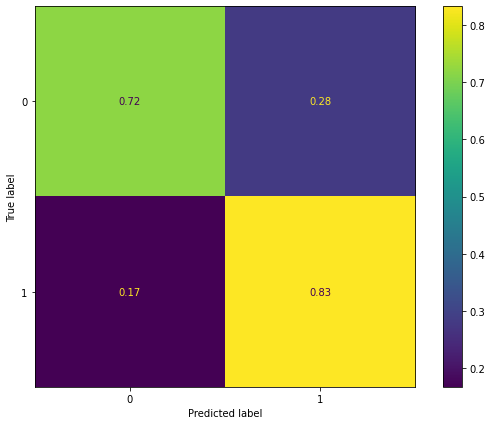

In [ ]:
doing_pca_rfc(X_train, X_test, y_train, y_test, 4)

## Conclusion
During our experiment, we tried different types of algorithms.
We can conclude that the accuracy of our models does not change much; if we consider 20 per cent of the importance of the features, we lose a little in accuracy but gain a lot in model interpretability and computational decrease.\
In the Principle Component Analysis part since there were two steps to find the final number of components, for some datasets based on the eigenvalue. for example, we received a number which was showing about the 30% of the features in the datasets. But in the second step which was checking on the accuracy with components 1 to the number which eigenvalue was showing, for some datasets the best accuracy was being captured by a model with only 20% of the features and this model was returning a very high f1 score. But in contrast for some datasets both the steps agreed on a specific number of components and a high f1 score. After all, PCA was a very useful and straightforward feature-selecting tool for many of the datasets.